In [1]:
import io
import subprocess
import os
import glob
import sys
import pwd

import pandas as pd
import numpy as np
import scipy
import scipy.stats as stats
from sklearn.decomposition import PCA
import pickle
import re
import math
import plotnine as pn
import seaborn as sns
import glob
import subprocess
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from numpy import log
from collections import defaultdict,Counter
import re
import statsmodels
import warnings
import json

from pathlib import Path
from midas import m
from datetime import datetime, date
import altair as alt

# gh specific
sys.path.append('/ghsfa/projects/pharma/shared_scripts/')
import bibp.functions as functions
import hgvslib.pHGVS as pHGVS  ## do a pull on the hgvslib git repo

# !pip install statannotations==0.4.0
# #!pip uninstall statannotations --yes
# from statannotations.Annotator import Annotator

warnings.filterwarnings("ignore")
pd.options.display.max_rows = None
pd.options.display.max_columns=None
pd.options.display.max_colwidth=None
work_dir="/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024"

# Data preocessing

## Pull all RUO/IST data from pharma data warehouse

In [24]:
# File name list to handle corner case of data readin
header1_list = ["20230627_JNJ_SQ01_17Samples_RevealReport.csv"]
header0_list = [
 '20230928_AstraZeneca_SOW164_46Samples_InfinityReport.csv',
 '20231106_AstraZeneca_SOW164_46Samples_InfinityReport.csv',
 '20231130_BoundlessBio_SOW02_10Samples_InfinityReport.csv',
 '20231207_AstraZeneca_SOW170_188Samples_InfinityReport.csv',
 '20231225_BristolMyersSquibb_SOW29_14Samples_InfinityReport.csv',
 '20231227_CL003_IST01_170Samples_InfinityReport.csv',
 '20240111_AstraZeneca_SOW174_35Samples_InfinityReport.csv',
 '20240116_AstraZeneca_SOW182_40Samples_InfinityReport.csv',
 '20240126_NCC_IST14_35Samples_InfinityReport.csv',
 '20240401_Cyclacel_SOW01_12Samples_InfinityReport.csv',
 '20240422_AstraZeneca_SOW176Monitoring_998Samples_InfinityReport.csv',
 '20221024_SMC_IST_01_198samples_InfinityReport.csv'
]

# Define the folder paths
folders = [
    "/ghsfa/projects/pharma/datawarehouse/Infinity",
    "/ghsfa/projects/pharma/datawarehouse/infinity",
    "/ghsfa/projects/pharma/datawarehouse/data/infinity_ist_report_warehouse",
    "/ghsfa/projects/pharma/datawarehouse/data/infinity_mrd_report_warehouse",
    "/ghsfa/projects/pharma/datawarehouse/data/infinity_report_warehouse"
]

# List to store the dataframes for final merge
dfs = []

# Iterate over each folder
for folder in folders:
    # List all csv files in the folder
    for file in os.listdir(folder):
        file_path = os.path.join(folder, file)
        # Check if the file is a CSV
        if file.endswith('.csv'):
            try:
                # Determine the header row based on the presence of "MRD" in the filename
                # Some corner cases
                if file in header0_list:
                    df = pd.read_csv(file_path, header=0)
                elif file in header1_list:
                    df = pd.read_csv(file_path, header=1)
                elif "MRD" in file.upper():
                    df = pd.read_csv(file_path, header=0)
                elif "Reveal" in file:
                    df = pd.read_csv(file_path, header=0)
                else:
                    df = pd.read_csv(file_path, header=1)

                # Select specified columns, handling cases where some columns might not exist
                columns = ['Study_ID', 'GHRequestID', 'GHSampleID', 'Patient_ID', 'Visit_name', 'Max_percentage', 'Sample_status', 'Sample_comment', 'cfDNA_ng', 'Plasma_ml_input', 'Cancertype']
                df_sub = df.loc[:, df.columns.isin(columns)].copy()

                # Drop duplicates based on 'GHSampleID'
                df_sub_dedup = df_sub.drop_duplicates(subset=["GHSampleID"])

                # Add a column for the CSV file name
                df_sub_dedup['csv_file_name'] = file

                # Get the UID of the file owner and convert it to a username
                file_stats = os.stat(file_path)
                file_uid = file_stats.st_uid
                file_creator = pwd.getpwuid(file_uid).pw_name
                df_sub_dedup['file_creator'] = file_creator

                # Append the processed dataframe to the list
                dfs.append(df_sub_dedup)
            except pd.errors.ParserError:
                print(f"Error reading file: {file_path} - possibly incorrect header.")
            except Exception as e:
                print(f"An unexpected error occurred with file: {file_path} - {str(e)}")

# Merge all dataframes into a final DataFrame
df_merged = pd.concat(dfs, ignore_index=True)
df_merged.head()


Error reading file: /ghsfa/projects/pharma/datawarehouse/infinity/20231102_RepareTherapeutics_SOW01_4_22_infinityReport.csv - possibly incorrect header.


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator
0,RP-3500-01,A0800783,B00459142,10010348,Screening,SUCCESS,NaN,8.21,85.28,4.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser
1,RP-3500-01,A0800784,B00459144,10040388,Cycle 1 Day 1,SUCCESS,NaN,79.29,421.72,2.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser
2,RP-3500-01,A0800785,B00459143,10040457,Cycle 1 Day 1,SUCCESS,Methylation Suppression Warning; Low Diversity Warning,0.00,0.31,1.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser
3,RP-3500-01,A0800786,B00459146,10040474,Cycle 1 Day 1,SUCCESS,NaN,6.99,23.61,3.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser
4,RP-3500-01,A0800787,B00459145,10050383,Cycle 1 Day 1,SUCCESS,NaN,29.43,208.00,3.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser


In [25]:
# Filter out rows where GHSampleID is NaN
nan_sample_ids = df_merged[df_merged['GHSampleID'].isna()]
print("Total # of this RUO summary data missing GHSampleID is " + str(nan_sample_ids.shape[0]) + "\n") 

# Group by csv_file_name and take the first row from each group
unique_csv_with_nan = nan_sample_ids.groupby('csv_file_name').first().reset_index()
unique_csv_with_nan

Total # of this RUO summary data missing GHSampleID is 4



,csv_file_name,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,file_creator
0,20230607_AstraZenaca_SOW01_2Samples_infinityReport.csv,TT816-12-001,A0730247,None,3005.0,SCREEN,Released,None,NaN,NaN,NaN,None,psreedhar
1,20231026_RepareTherapeutics_SOW01_4_23_infinityReport.csv,RP-3500-01,A0800783,None,10010348.0,Screening,SUCCESS,None,NaN,NaN,NaN,None,produser
2,20231106_GHIResearch_SOW10_2_3_infinityReport.csv,None,A0776833,None,S3_CGP_E2E_074,None,SUCCESS,None,NaN,NaN,NaN,Colorectal adenocarcinoma,psreedhar
3,20231211_GHIResearch_E2E01_Batch1_1Samples_InfinityReport.csv,None,A0542330,None,None,None,SUCCESS,None,0.62,60.32,NaN,None,psreedhar


In [26]:
# Readin samples 
df_merged_1 = df_merged.copy()

# Filter for "Sample_status" == "SUCCESS"
df_merged_1 = df_merged_1[df_merged_1['Sample_status'] == "SUCCESS"]
print("Total size of this RUO summary data is " + str(df_merged_1.shape[0]) + "\n") 
print("Total unique sample size of this RUO/IST summary data is " + str(df_merged_1.GHSampleID.nunique()) + "\n")
print("Total NaN in cancer type of this RUO/IST  summary data is " + str(df_merged_1.Cancertype.isnull().sum()) + "\n")

# Drop duplicates 
df_merged_dedup = df_merged_1.drop_duplicates(subset=["GHSampleID"])
print("Total size of this RUO/IST summary data is " + str(df_merged_dedup.shape[0]) + "\n") 

# Regular expression to extract 'Account' and 'SOW_num'
# pattern = r'_(?P<Account>[^_]+)_SOW(?P<SOW_num>\d+)'
# pattern = r'_(?P<Account>[^_]+?)(?:_.+?)?_SOW(?P<SOW_num>\d+)'

# Regular expression to extract 'Account', 'SOW_num', and 'report_date'
pattern = r'(?P<report_date>^\d+)_?(?P<Account>[^_]+)_([^_]+)'

# Using str.extract() to create new columns in the DataFrame
df_merged_dedup[['report_date', 'Account', 'SOW_num']] = df_merged_dedup['csv_file_name'].str.extract(pattern)

df_merged_dedup.head()

Total size of this RUO summary data is 45504

Total unique sample size of this RUO/IST summary data is 23183

Total NaN in cancer type of this RUO/IST  summary data is 29223

Total size of this RUO/IST summary data is 23184



,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num
0,RP-3500-01,A0800783,B00459142,10010348,Screening,SUCCESS,NaN,8.21,85.28,4.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01
1,RP-3500-01,A0800784,B00459144,10040388,Cycle 1 Day 1,SUCCESS,NaN,79.29,421.72,2.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01
2,RP-3500-01,A0800785,B00459143,10040457,Cycle 1 Day 1,SUCCESS,Methylation Suppression Warning; Low Diversity Warning,0.00,0.31,1.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01
3,RP-3500-01,A0800786,B00459146,10040474,Cycle 1 Day 1,SUCCESS,NaN,6.99,23.61,3.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01
4,RP-3500-01,A0800787,B00459145,10050383,Cycle 1 Day 1,SUCCESS,NaN,29.43,208.00,3.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01


In [27]:
# Check the edge case the Account name or SOW name is not extractable
df_unextractable = df_merged_dedup[df_merged_dedup.Account.isna()]
print("Total unique unextractable csv files of this RUO/IST summary data is " + str(df_unextractable.csv_file_name.nunique()) + "\n")
df_unextractable.csv_file_name.unique()

Total unique unextractable csv files of this RUO/IST summary data is 3



array(['YCC02_IST01_10242022_tb_changed_RUO_report_MRD.csv',
       'NOC01_IST01_batch2_7sample_12142022_RUO_report_MRD.csv',
       'NOC01_IST01_12112022_tb_changed_RUO_report_MRD.csv'], dtype=object)

In [29]:
# Merge cancer type information from /ghsfa/projects/pharma/datawarehouse/pdw/raw/latest/fact_accessions.tsv
df_cancer_type_fact = pd.read_table("/ghsfa/projects/pharma/datawarehouse/pdw/raw/latest/fact_accessions.tsv")
df_cancer_type_fact_1 = df_cancer_type_fact.copy()

#merge the "runid" information from the fact_accessions.tsv
df_cancer_type_fact_1.rename(columns={'accn_id': 'GHRequestID'}, inplace=True)
df_merged_1 = df_merged_dedup.merge(df_cancer_type_fact_1[["GHRequestID", "cancer_category", "cancerother", "cancerstage", "cancertype"]], on = "GHRequestID", how = "left")
print("Total sample size of the RUO/IST summary is " + str(df_merged_1.shape[0]) + "\n") 
print('Total NaN in cancer type of the column "cancerother" in this RUO/IST summary data is ' + str(df_merged_1.cancerother.isnull().sum()) + "\n")
df_merged_1.head()

# Save the dataframe
df_merged_1.to_csv(f"{work_dir}/df_merged_warehouse.csv", index = False)

## Pull data from gh_sample database

In [34]:
# # Define the IDs you want to query for
# ids = ('B00459143', 'B00459152', 'B00651690')

# # Generate the SQL query string
# query = "SELECT * FROM gh_sample WHERE run_sample_id IN {}".format(ids)
# # query = "SELECT * FROM gh_sample WHERE run_sample_id IN {}".format(tuple(mrd_all_cols_df['run_sample_id'].unique()))

# # Run the query using your existing function
# sample_df = functions.run_sql_query(query)
# sample_df.head()

,runid,run_sample_id,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case
0,230810_A01902_0186_AH5VV7DSX7,B00459143,ATTACCATGT,Unknown,Research,2023-08-13 00:37:40+00:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,None,Sirius_LDT_Soft_v2.0,None,None,None,A0800785,cgp
1,230810_A01902_0185_BH5WTKDSX7,B00459152,CTGCAATTCT,Unknown,Research,2023-08-13 00:31:14+00:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,None,Sirius_LDT_Soft_v2.0,None,None,None,A0800804,cgp
2,240427_A01613_0374_AH3FTYDSXC,B00651690,TCCTTACCGG,Unknown,Research,2024-04-29 20:19:29+00:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,REV_12,None,None,Sirius_LDT_Soft_v2.0,None,None,None,A1003612,cgp


In [30]:
# SQL query
query = """
SELECT *
FROM gh_sample
WHERE panel LIKE '%Sirius%' AND
      sample_type = 'Research' AND
      product = 'Guardant 360'
"""

# Run the query using your existing function
sample_df = functions.run_sql_query(query)

print("Total size of this RUO summary data is " + str(sample_df.shape[0]) + "\n") 
print("Total unique sample size of this RUO summary data is " + str(sample_df.run_sample_id.nunique()) + "\n")
print("Total NaN in cancer type of this RUO summary data is " + str(sample_df.cancer_type.isnull().sum()) + "\n")

# Drop duplicates 
df_gh_sample_dedup = sample_df.drop_duplicates(subset=["run_sample_id"])
print("Total size of this RUO summary data that pulled from gh_sample database is " + str(df_gh_sample_dedup.shape[0]) + "\n") 
df_gh_sample_dedup.head()

Total size of this RUO summary data is 28701

Total unique sample size of this RUO summary data is 27160

Total NaN in cancer type of this RUO summary data is 28218

Total size of this RUO summary data that pulled from gh_sample database is 27160



,runid,run_sample_id,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case
0,221109_A01902_0035_AHNLJMDSX3,B00225992,GCTCGGGCCT,Male,Research,2022-11-12 00:13:49-08:00,Sirius_v1.0,None,Sirius-1.0.0-RLS,None,None,Guardant 360,BAY_06_G360V3,None,NaN,Sirius_v1.0,None,None,None,A0600999,None
1,221109_A00770_0587_AHNLKJDSX3,B00225963,TGACTTCTGG,Male,Research,2022-11-11 23:34:55-08:00,Sirius_v1.0,None,Sirius-1.0.0-RLS,None,None,Guardant 360,VUM_01_V3,None,72.0,Sirius_v1.0,None,None,None,A0600576,None
2,221109_A00770_0587_AHNLKJDSX3,B00226023,TGTCGCCCTT,Female,Research,2022-11-11 23:34:55-08:00,Sirius_v1.0,None,Sirius-1.0.0-RLS,None,None,Guardant 360,VUM_01_V3,None,78.0,Sirius_v1.0,None,None,None,A0600584,None
3,221109_A00770_0587_AHNLKJDSX3,B00225965,ATCAAGGCCG,Male,Research,2022-11-11 23:34:55-08:00,Sirius_v1.0,None,Sirius-1.0.0-RLS,None,None,Guardant 360,VUM_01_V3,None,60.0,Sirius_v1.0,None,None,None,A0600577,None
4,221109_A00770_0586_BHNLGCDSX3,B00226004,ACGTTGATGC,Male,Research,2022-11-11 23:38:12-08:00,Sirius_v1.0,None,Sirius-1.0.0-RLS,None,None,Guardant 360,VUM_01_V3,None,67.0,Sirius_v1.0,None,None,None,A0600596,None


In [31]:
# Merge the runid, fc_dir and other information from gh_sample database

#rename the columns to indicate the caller name
df_gh_sample_dedup = df_gh_sample_dedup.rename(columns={"run_sample_id": "GHSampleID"})

df_complete_2 = df_merged_1.merge(df_gh_sample_dedup, on="GHSampleID", how="left")
print(df_complete_2.shape)
df_complete_2.head()

(23184, 40)


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerother,cancerstage,cancertype,runid,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case
0,RP-3500-01,A0800783,B00459142,10010348,Screening,SUCCESS,NaN,8.21,85.28,4.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,NaN,230810_A01902_0186_AH5VV7DSX7,CAGGCGTTGC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800783,cgp
1,RP-3500-01,A0800784,B00459144,10040388,Cycle 1 Day 1,SUCCESS,NaN,79.29,421.72,2.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,NaN,230810_A01902_0186_AH5VV7DSX7,GCAAAGAGCT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800784,cgp
2,RP-3500-01,A0800785,B00459143,10040457,Cycle 1 Day 1,SUCCESS,Methylation Suppression Warning; Low Diversity Warning,0.00,0.31,1.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,NaN,230810_A01902_0186_AH5VV7DSX7,ATTACCATGT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800785,cgp
3,RP-3500-01,A0800786,B00459146,10040474,Cycle 1 Day 1,SUCCESS,NaN,6.99,23.61,3.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,NaN,230810_A01902_0186_AH5VV7DSX7,TATTAACATG,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800786,cgp
4,RP-3500-01,A0800787,B00459145,10050383,Cycle 1 Day 1,SUCCESS,NaN,29.43,208.00,3.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,NaN,230810_A01902_0186_AH5VV7DSX7,ATTTAAGGAC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800787,cgp


In [32]:
# Check the samples with missing runid
df_missing_runid = df_complete_2[df_complete_2["runid"].isna()]
df_missing_runid.shape

(4049, 40)

In [33]:
# Query data from "Integration Database" as there are some runid missing in the "Production Database" "gh_sample" database
# This is based on Jessica Kurata's confluence page https://guardanthealth.atlassian.net/wiki/spaces/LUN/pages/1329006199/How+To+Fetch+Data+From+the+Sample+Tracker
import sys
import pandas as pd
import psycopg2 as pg2

# Fetch db credentials
sys.path.append("/ghds/projects/mrd/analyses/notebooks/jkurata/gh_sample_tracker/sampletracker/sampletracker/credentials/")
from env import SAMP_DB_VIEW_USERNAME, SAMP_DB_VIEW_PASSWORD

def sql_query_to_df(query):
    """Run an SQL query on the Guardant PostgreSQL server and return the
    result as a pandas dataframe.
    Args:
        query (str): SQL query string.
    Returns:
        pandas.core.frame.DataFrame: pandas dataframe containing SQL
        query.
    """
    connect = pg2.connect(host="ghbi-live-lunar-sample-metadata-db.clrdmmintk6b.us-west-2.rds.amazonaws.com",
                          database="lunar_sample_metadata_db",
                          user=SAMP_DB_VIEW_USERNAME,
                          password=SAMP_DB_VIEW_PASSWORD)
    df = pd.read_sql_query(query, connect)
    connect.close()
    
    return df

In [34]:
# Drop any NaN values and convert to unique IDs (nan values will be dropped as it will break the SQL query)
unique_ids = df_missing_runid['GHSampleID'].dropna().unique()

# Check if unique_ids is empty to prevent errors
if len(unique_ids) == 0:
    # Handle case with no IDs gracefully
    df_intergration_database = pd.DataFrame()
    print("No valid IDs to query.")
else:
    # Format the tuple correctly for SQL query
    # For a single ID, make it ('ID',) instead of ('ID')
    ids_tuple = tuple(unique_ids)
    if len(ids_tuple) == 1:
        ids_tuple = f"('{ids_tuple[0]}')"
    else:
        ids_tuple = str(ids_tuple)  # This will ensure tuples are formatted with commas

    # Define the SQL query using the formatted tuple
    query = f"SELECT * FROM sample_summary WHERE run_sample_id IN {ids_tuple}"

    # Run the query using your existing function to convert SQL query to DataFrame
    df_intergration_database = sql_query_to_df(query)

print(df_intergration_database.shape)
df_intergration_database.head()

(4040, 29)


,cohort_id,patient_id,cancer_type,cancer_subtype,stage_group,recur,days_to_recurrence,days_to_last_follow_up,visit_name,specimen_type,input_ng,run_sample_id,panel_name,sequenced_sample_qc,mbd_sample_qc,sequenced_sample_description,sequenced_sample_comment,runid,flowcell_qc,sample_id,batch_id,assay_version,patient_comment,extraction_method,fragmentation_method,size_selection,sample_type,sample_well_id,ex_quant_well_id
0,None,None,None,None,None,None,None,None,None,None,30.00,B00143335,sirius_v1.0,,,,,220622_A01744_0010_BHVJTCDSX3,,B00143335,PROD-19,Sirius_EAP,None,,,,clinical,H7,None
1,None,None,None,None,None,None,None,None,None,None,30.00,B00143364,sirius_v1.0,,,,,220622_A01744_0010_BHVJTCDSX3,,B00143364,PROD-19,Sirius_EAP,None,,,,clinical,A6,None
2,None,None,None,None,None,None,None,None,None,None,13.46,B00143313,sirius_v1.0,,,,,220622_A01744_0010_BHVJTCDSX3,,B00143313,PROD-19,Sirius_EAP,None,,,,clinical,H4,None
3,None,None,None,None,None,None,None,None,None,None,30.00,B00143316,sirius_v1.0,,,,,220622_A01744_0010_BHVJTCDSX3,,B00143316,PROD-19,Sirius_EAP,None,,,,clinical,A5,None
4,None,None,None,None,None,None,None,None,None,None,30.00,B00143332,sirius_v1.0,,,,,220622_A01744_0010_BHVJTCDSX3,,B00143332,PROD-19,Sirius_EAP,None,,,,clinical,A8,None


In [35]:
# Merge the runid and other information from sample_summary in Integration database
df_integration_database_selected = df_intergration_database[['run_sample_id', 'runid', 'cancer_type']]

#rename the columns to indicate the caller name
df_integration_database_selected = df_integration_database_selected.rename(columns={"run_sample_id": "GHSampleID", "cancer_type": "cancerother"})

# Merge the runid and other information from sample_summary in Integration database
df_complete_3 = df_complete_2.merge(df_integration_database_selected, on="GHSampleID", how="left")

# Handle the 'runid' and 'cancerother' duplication issue caused by merging
df_complete_3['runid'] = np.where(df_complete_3['runid_y'].notna(), df_complete_3['runid_y'], df_complete_3['runid_x'])
df_complete_3['cancerother'] = np.where(df_complete_3['cancerother_y'].notna(), df_complete_3['cancerother_y'], df_complete_3['cancerother_x'])

# Drop the original 'runid_x', 'runid_y', 'cancerother_x', and 'cancerother_y' columns
df_complete_3 = df_complete_3.drop(columns=['runid_x', 'runid_y', 'cancerother_x', 'cancerother_y'])

# Drop nan
df_complete_3 = df_complete_3[~df_complete_3["runid"].isna()]

print("Total size of the merged data is " + str(df_complete_3.shape[0]) + "\n") 
print("Total size of the merged data with missing runid is " + str(df_complete_3.runid.isnull().sum()) + "\n") 
print("Total size of the merged data with missing GHSampleID is " + str(df_complete_3.GHSampleID.isnull().sum()) + "\n") 

df_complete_3.head()

Total size of the merged data is 23175

Total size of the merged data with missing runid is 0

Total size of the merged data with missing GHSampleID is 0



,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother
0,RP-3500-01,A0800783,B00459142,10010348,Screening,SUCCESS,NaN,8.21,85.28,4.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,CAGGCGTTGC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800783,cgp,230810_A01902_0186_AH5VV7DSX7,NaN
1,RP-3500-01,A0800784,B00459144,10040388,Cycle 1 Day 1,SUCCESS,NaN,79.29,421.72,2.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,GCAAAGAGCT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800784,cgp,230810_A01902_0186_AH5VV7DSX7,NaN
2,RP-3500-01,A0800785,B00459143,10040457,Cycle 1 Day 1,SUCCESS,Methylation Suppression Warning; Low Diversity Warning,0.00,0.31,1.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,ATTACCATGT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800785,cgp,230810_A01902_0186_AH5VV7DSX7,NaN
3,RP-3500-01,A0800786,B00459146,10040474,Cycle 1 Day 1,SUCCESS,NaN,6.99,23.61,3.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,TATTAACATG,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800786,cgp,230810_A01902_0186_AH5VV7DSX7,NaN
4,RP-3500-01,A0800787,B00459145,10050383,Cycle 1 Day 1,SUCCESS,NaN,29.43,208.00,3.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,ATTTAAGGAC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800787,cgp,230810_A01902_0186_AH5VV7DSX7,NaN


In [36]:
# TODO: There are samples with missing runid. Need to check 
df_miss_runid = df_complete_3[df_complete_3["runid"].isna()]
df_miss_runid.csv_file_name.value_counts()
print(df_miss_runid.shape)

df_complete_3 = df_complete_3[~df_complete_3["runid"].isna()]
print("Total size of the merged data with missing runid is " + str(df_complete_3.runid.isnull().sum()) + "\n") 
print("Total size of the merged data with missing GHSampleID is " + str(df_complete_3.GHSampleID.isnull().sum()) + "\n") 

df_complete_3.shape

(0, 40)
Total size of the merged data with missing runid is 0

Total size of the merged data with missing GHSampleID is 0



(23175, 40)

In [37]:
# Prepare the "fc_dir" columns for the data
df_complete_4 = df_complete_3.copy()

# Define the path
# Path to original BIP output dir
fc_dir_all = "/ghsfa/ivd/flowcentral"
fc_dir_omni = "/ghsfa/projects/omni_v2/flowcells"

# Initialize a list to store rows that no BIP ouput found in either of the sources above
rows_no_found = []

# Initialize new columns in the DataFrame
df_complete_4['fc_dir'] = ''

# Iterate over the DataFrame rows
for index, row in df_complete_4.iterrows():
    runid = row["runid"]

    # Find original folder
    pattern_ori = f"{fc_dir_all}/*{runid}*"
    folders = glob.glob(pattern_ori)
    if folders:
        df_complete_4.loc[index, 'fc_dir'] = folders[0]
    else:
        # Search in the alternative directory if no folder found in the first directory
        pattern_omni = f"{fc_dir_omni}/*{runid}*"
        folders_omni = glob.glob(pattern_omni)
        if folders_omni:
            df_complete_4.loc[index, 'fc_dir'] = folders_omni[0]
        else:
            # Print warning if no folder is found in either location
            rows_no_found.append(row)
            # print(f"No suitable folder found for {runid}")
            
# Create a DataFrame with rows where folders were not found in any sources
df_no_fc_dir = pd.DataFrame(rows_no_found)

df_complete_4.head()


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir
0,RP-3500-01,A0800783,B00459142,10010348,Screening,SUCCESS,NaN,8.21,85.28,4.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,CAGGCGTTGC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800783,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230
1,RP-3500-01,A0800784,B00459144,10040388,Cycle 1 Day 1,SUCCESS,NaN,79.29,421.72,2.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,GCAAAGAGCT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800784,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230
2,RP-3500-01,A0800785,B00459143,10040457,Cycle 1 Day 1,SUCCESS,Methylation Suppression Warning; Low Diversity Warning,0.00,0.31,1.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,ATTACCATGT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800785,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230
3,RP-3500-01,A0800786,B00459146,10040474,Cycle 1 Day 1,SUCCESS,NaN,6.99,23.61,3.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,TATTAACATG,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800786,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230
4,RP-3500-01,A0800787,B00459145,10050383,Cycle 1 Day 1,SUCCESS,NaN,29.43,208.00,3.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,Other,NaN,NaN,ATTTAAGGAC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,None,Sirius-1.1.0-RLS,None,None,Guardant 360,REP_SOW01,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A0800787,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230


In [38]:
# Save file 
df_complete_4.to_csv(f"{work_dir}/df_complete_4.csv", index=False)
df_no_fc_dir.to_csv(f"{work_dir}/df_no_fc_dir.csv", index=False)

In [2]:
# Drop missing fc_dir
df_complete_4 = pd.read_csv(f"{work_dir}/df_complete_4.csv", header = 0)
df_no_fc_dir = pd.read_csv(f"{work_dir}/df_no_fc_dir.csv", header = 0)

df_complete_4_fc_dir_dropna = df_complete_4[df_complete_4["fc_dir"] != ""]
print("Total size of RUO summary with fc_dir info is " + str(df_complete_4_fc_dir_dropna.shape[0]) + "\n") 
print("Total size of RUO summary with fc_dir missing is " + str(df_no_fc_dir.shape[0]) + "\n") 
df_no_fc_dir.head()

Total size of RUO summary with fc_dir info is 23175

Total size of RUO summary with fc_dir missing is 30



,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir
0,C4221015,A0621543,B00258552,10361005,Phase 3: Cycle 1 Day 15,SUCCESS,NaN,NaN,51.545,2.0,NaN,20230113_Pfizer_SOW46_71Samples_InfinityReport.csv,mcai,20230113,Pfizer,SOW46,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,221220_A01422_0280_AHKWMFDSX5,NaN,NaN
1,C4221015,A0621544,B00258554,10361006,Phase 3: Cycle 1 Day 15,SUCCESS,NaN,NaN,50.635,2.0,NaN,20230113_Pfizer_SOW46_71Samples_InfinityReport.csv,mcai,20230113,Pfizer,SOW46,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,221220_A01422_0280_AHKWMFDSX5,NaN,NaN
2,C4221015,A0621545,B00258540,10371002,Phase 3: Cycle 1 Day 15,SUCCESS,NaN,NaN,18.005,2.0,NaN,20230113_Pfizer_SOW46_71Samples_InfinityReport.csv,mcai,20230113,Pfizer,SOW46,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,221220_A01422_0280_AHKWMFDSX5,NaN,NaN
3,C4221015,A0621546,B00258542,10371003,Phase 3: Cycle 1 Day 15,SUCCESS,NaN,NaN,29.835,2.0,NaN,20230113_Pfizer_SOW46_71Samples_InfinityReport.csv,mcai,20230113,Pfizer,SOW46,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,221220_A01422_0280_AHKWMFDSX5,NaN,NaN
4,C4221015,A0621547,B00258544,10371004,Phase 3: Cycle 1 Day 15,SUCCESS,NaN,NaN,41.860,2.0,NaN,20230113_Pfizer_SOW46_71Samples_InfinityReport.csv,mcai,20230113,Pfizer,SOW46,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,221220_A01422_0280_AHKWMFDSX5,NaN,NaN


In [3]:
# TODO: Check the samples with missing fc_dir based on its runid
print("Total size of RUO summary with fc_dir missing is " + str(df_no_fc_dir.shape[0]) + "\n") 


Total size of RUO summary with fc_dir missing is 30



## Group cancer type and define baseline samples

In [ ]:
# Readin data
df_complete_5 = df_complete_4_fc_dir_dropna.copy()

# Readin clinical data that also includes the cancer type information in the column "Conditions"
df_clinical_trial = pd.read_csv('/ghsfa/projects/pharma/scratch/gyalamanchili/clinical_trial_data_leverage/ctg-studies.csv')
df_clinical_trial.head()

In [ ]:
# # First, we should ensure the 'Other IDs' in df_clinical_trial are in string format
# df_clinical_trial['Other IDs'] = df_clinical_trial['Other IDs'].astype(str)

# # We create a mask to identify matching rows
# mask = df_complete_5['Study_ID'].apply(lambda x: df_clinical_trial['Other IDs'].str.contains(x).any() if pd.notna(x) else False)

# # We then prepare a DataFrame that only includes matching records
# matching_records = df_clinical_trial[df_clinical_trial['Other IDs'].apply(lambda other_ids: any(df_complete_5['Study_ID'].apply(lambda study_id: study_id in other_ids if pd.notna(study_id) else False)))]

# # Merging selected columns based on the mask into df_complete_5
# df_complete_5 = df_complete_5.merge(matching_records[['Other IDs', 'Conditions', 'Sponsor']], left_on='Study_ID', right_on='Other IDs', how='left')

# # Rename 'Other IDs' to 'Other ID' as per your requirement
# df_complete_5.rename(columns={'Other IDs': 'Other ID'}, inplace=True)

# # Fill NaN values for unmatched rows
# df_complete_5[['Conditions', 'Sponsor', 'Other ID']].fillna('nan', inplace=True)

# # Display the updated DataFrame
# df_complete_5.head()


In [5]:
# This step takes around 100min to finish
# Ensure 'Other IDs' is in string format and handle missing values
df_clinical_trial['Other IDs'] = df_clinical_trial['Other IDs'].astype(str)

# Using a case-insensitive and non-regex match for a more flexible and robust search
mask = df_complete_5['Study_ID'].apply(lambda x: df_clinical_trial['Other IDs'].str.contains(r"\b" + re.escape(x) + r"\b", na=False, case=False, regex=True).any() if pd.notna(x) else False)

# Preparing a DataFrame that only includes matching records
matching_records = df_clinical_trial[df_clinical_trial['Other IDs'].apply(
    lambda other_ids: any(
        df_complete_5['Study_ID'].apply(
            lambda study_id: re.search(r"\b" + re.escape(study_id) + r"\b", other_ids, flags=re.IGNORECASE) is not None if pd.notna(study_id) else False
        )
    )
)]

# Merging selected columns based on the mask into df_complete_5
df_complete_5 = df_complete_5.merge(matching_records[['Other IDs', 'Conditions', 'Sponsor']], left_on='Study_ID', right_on='Other IDs', how='left')

# Rename 'Other IDs' to 'Other ID'
df_complete_5.rename(columns={'Other IDs': 'Other ID'}, inplace=True)

# Fill NaN values for unmatched rows
df_complete_5[['Conditions', 'Sponsor', 'Other ID']].fillna('nan', inplace=True)

# Display the updated DataFrame
df_complete_5.head()


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor
0,RP-3500-01,A0800783,B00459142,10010348,Screening,SUCCESS,NaN,8.21,85.28,4.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412.0,RepareTherapeutics,SOW01,Other,NaN,NaN,CAGGCGTTGC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800783,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN
1,RP-3500-01,A0800784,B00459144,10040388,Cycle 1 Day 1,SUCCESS,NaN,79.29,421.72,2.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412.0,RepareTherapeutics,SOW01,Other,NaN,NaN,GCAAAGAGCT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800784,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN
2,RP-3500-01,A0800785,B00459143,10040457,Cycle 1 Day 1,SUCCESS,Methylation Suppression Warning; Low Diversity Warning,0.00,0.31,1.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412.0,RepareTherapeutics,SOW01,Other,NaN,NaN,ATTACCATGT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800785,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN
3,RP-3500-01,A0800786,B00459146,10040474,Cycle 1 Day 1,SUCCESS,NaN,6.99,23.61,3.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412.0,RepareTherapeutics,SOW01,Other,NaN,NaN,TATTAACATG,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800786,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN
4,RP-3500-01,A0800787,B00459145,10050383,Cycle 1 Day 1,SUCCESS,NaN,29.43,208.00,3.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412.0,RepareTherapeutics,SOW01,Other,NaN,NaN,ATTTAAGGAC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800787,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN


In [22]:
# # This code is not right and give me more columns

# # Ensure 'Other IDs' and 'Study_ID' are in string format
# df_clinical_trial['Other IDs'] = df_clinical_trial['Other IDs'].astype(str)
# df_complete_5['Study_ID'] = df_complete_5['Study_ID'].astype(str)

# # Create a set of unique 'Study_ID' values for quick intersection testing
# study_ids = set(df_complete_5['Study_ID'].dropna())

# # Tokenize 'Other IDs' and map them to their rows
# id_map = {}
# for index, row in df_clinical_trial.iterrows():
#     ids = set(row['Other IDs'].split())  # You may adjust the split criteria based on actual 'Other IDs' format
#     for id in ids:
#         if id in study_ids:
#             if id not in id_map:
#                 id_map[id] = []
#             id_map[id].append(row)

# # Convert mapped rows to DataFrame
# rows_list = []
# for id, records in id_map.items():
#     for record in records:
#         row = {**record, 'Study_ID': id}  # Make sure to include all necessary columns here
#         rows_list.append(row)
# matching_records = pd.DataFrame(rows_list)

# # Merging the records, including 'Other IDs'
# df_complete_5 = df_complete_5.merge(matching_records[['Study_ID', 'Conditions', 'Sponsor', 'Other IDs']], on='Study_ID', how='left')

# # Fill NaN values for unmatched rows
# df_complete_5[['Conditions', 'Sponsor', 'Other IDs']].fillna('nan', inplace=True)

# df_complete_5.head()


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Conditions,Sponsor,Other IDs
0,RP-3500-01,A0800783,B00459142,10010348,Screening,SUCCESS,NaN,85.28,4.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412.0,RepareTherapeutics,SOW01,Other,NaN,NaN,CAGGCGTTGC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800783,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN
1,RP-3500-01,A0800784,B00459144,10040388,Cycle 1 Day 1,SUCCESS,NaN,421.72,2.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412.0,RepareTherapeutics,SOW01,Other,NaN,NaN,GCAAAGAGCT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800784,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN
2,RP-3500-01,A0800785,B00459143,10040457,Cycle 1 Day 1,SUCCESS,Methylation Suppression Warning; Low Diversity Warning,0.31,1.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412.0,RepareTherapeutics,SOW01,Other,NaN,NaN,ATTACCATGT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800785,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN
3,RP-3500-01,A0800786,B00459146,10040474,Cycle 1 Day 1,SUCCESS,NaN,23.61,3.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412.0,RepareTherapeutics,SOW01,Other,NaN,NaN,TATTAACATG,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800786,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN
4,RP-3500-01,A0800787,B00459145,10050383,Cycle 1 Day 1,SUCCESS,NaN,208.00,3.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412.0,RepareTherapeutics,SOW01,Other,NaN,NaN,ATTTAAGGAC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800787,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN


In [6]:
# Save the data
df_complete_5.to_csv(f"{work_dir}/df_complete_5.csv", index=False)


In [80]:
# Readin the data
df_complete_5 = pd.read_csv(f"{work_dir}/df_complete_5.csv", header = 0)

df_complete_5_with_clinical_cancer_type = df_complete_5[~df_complete_5["Conditions"].isna()]
print("Total size of RUO summary with clinical cancer type information is " + str(df_complete_5_with_clinical_cancer_type.shape[0]) + "\n") 

df_complete_5_with_clinical_cancer_type.head()


Total size of RUO summary with clinical cancer type information is 2467



,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor
21,RP-3500-03,A0800804,B00459152,10120095,Cycle 1 Day 1,SUCCESS,Possible Contamination Warning,3.19,13.62,4.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412.0,RepareTherapeutics,SOW01,Other,NaN,NaN,CTGCAATTCT,Unknown,Research,2023-08-12 17:31:14-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800804,cgp,230810_A01902_0185_BH5WTKDSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0185_BH5WTKDSX7.5b588b68-4ab4-42fa-9b66-e718da688286.20230812102938,RP-3500-03,"Advanced Solid Tumor, Adult",Repare Therapeutics
26,IDE397-001,A1015862,B00655978,397-6001-00170,P2C2D1,SUCCESS,NaN,4.41,28.08,NaN,NaN,20240513_IDEAYABiosciences_SOW03_Batch5_30Samples_InfinityReport.csv,produser,20240513.0,IDEAYABiosciences,SOW03,Other,NaN,NaN,CAGAGGGAAC,Unknown,Research,2024-05-06 11:19:28-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,IDA_03,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1015862,cgp,240504_A01422_0592_AH3L2GDSXC,NaN,/ghsfa/ivd/flowcentral/240504_A01422_0592_AH3L2GDSXC,IDE397-001,Solid Tumor,IDEAYA Biosciences
27,IDE397-001,A1015863,B00655977,397-3008-00253,P2EOT,SUCCESS,NaN,62.50,174.72,NaN,NaN,20240513_IDEAYABiosciences_SOW03_Batch5_30Samples_InfinityReport.csv,produser,20240513.0,IDEAYABiosciences,SOW03,Other,NaN,NaN,CATCACGTAG,Unknown,Research,2024-05-06 10:37:30-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,IDA_03,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1015863,cgp,240504_A00274_1012_AH3L3LDSXC,NaN,/ghsfa/ivd/flowcentral/240504_A00274_1012_AH3L3LDSXC.432d16bf-1dae-473c-92a0-f45d5d54105e.20240506033625,IDE397-001,Solid Tumor,IDEAYA Biosciences
28,IDE397-001,A1015864,B00655980,397-6102-00311,P2C2D1,SUCCESS,NaN,1.16,22.62,NaN,NaN,20240513_IDEAYABiosciences_SOW03_Batch5_30Samples_InfinityReport.csv,produser,20240513.0,IDEAYABiosciences,SOW03,Other,NaN,NaN,TTACGTACCG,Unknown,Research,2024-05-06 10:37:30-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,IDA_03,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1015864,cgp,240504_A00274_1012_AH3L3LDSXC,NaN,/ghsfa/ivd/flowcentral/240504_A00274_1012_AH3L3LDSXC.432d16bf-1dae-473c-92a0-f45d5d54105e.20240506033625,IDE397-001,Solid Tumor,IDEAYA Biosciences
29,IDE397-001,A1015865,B00655979,397-6002-00277,P2C1D1*,SUCCESS,NaN,2.30,17.37,NaN,NaN,20240513_IDEAYABiosciences_SOW03_Batch5_30Samples_InfinityReport.csv,produser,20240513.0,IDEAYABiosciences,SOW03,Other,NaN,NaN,ACATGGCCGG,Unknown,Research,2024-05-06 11:19:28-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,IDA_03,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1015865,cgp,240504_A01422_0592_AH3L2GDSXC,NaN,/ghsfa/ivd/flowcentral/240504_A01422_0592_AH3L2GDSXC,IDE397-001,Solid Tumor,IDEAYA Biosciences


In [8]:
# Update the 'cancerother' column by first checking 'Cancertype' and then 'Conditions'
df_complete_5['cancerother'] = df_complete_5.apply(
    lambda row: row['Cancertype'] if pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown' else row['cancerother'],
    axis=1
)

# Further update 'cancerother' by checking 'Conditions'
df_complete_5['cancerother'] = df_complete_5.apply(
    lambda row: row['Conditions'] if (pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown') and pd.notnull(row['Conditions']) else row['cancerother'],
    axis=1
)

# Regex patterns for each cancer type
regex_patterns = {
    'breast': r'(?i)\bbreast|DCIS|ductal|infiltrating|Triple\s*Negative|TNBC',
    'prostate': r'(?i)\bprostate|Castration-Resistant|mCRPC',
    'esophageal': r'(?i)\besophagus|esophageal',
    'ovarian': r'(?i)\bovarian|BRCA1|Sertoli-Leydig',
    'lung': r'(?i)\blung|NSCLC|SCLC|ADC|SCC|ALK-expressing|adenosquamous|bronchioloalveolar|mixed subtype|papillary type|invasive|small cell|non[-\s]*small[-\s]*cell',
    'bladder': r'(?i)\bbladder|urothelial|transitional\s*cell',
    'pancreatic': r'(?i)\bpancreas|pancreatic|adenocarcinoma',
    'hepatocellular': r'(?i)\bhepatocellular|cholangiocarcinoma|hepatocholangiocarcinoma|intrahepatic',
    'crc': r'(?i)\bcrc|colorectal|colon|rectal|mucinous|rectum',
    'Head_and_Neck': r'(?i)\bhead\s*and\s*neck|HNSCC|adenocarcinoma\sof\ssalivary\sgland',
    'renal': r'(?i)\brenal|kidney',
    'gastric': r'(?i)\bgastric|stomach',
    'endometrial': r'(?i)\bendometrial|uterine|leiomyosarcoma|endometrium',
    'melanoma': r'(?i)\bmelanoma',
    'Gastrointestinal': r'(?i)\bgastrointestinal|gastrooesophageal|gastroesophageal\sjunction|small\sbowel'
}

# Function to categorize cancer based on regex patterns
def categorize_cancer(text):
    if pd.isnull(text):
        return 'unknown'
    for cancer_type, pattern in regex_patterns.items():
        if re.search(pattern, text):
            return cancer_type
    if re.search(r'(?i)unknown', text):  # Check if 'unknown' is anywhere in the text
        return 'unknown'
    return 'other'  # Assign 'other' if no patterns match and it's not 'unknown'

# Apply the categorization function to the 'cancerother' column
df_complete_5['new_defined_cancer_type'] = df_complete_5['cancerother'].apply(categorize_cancer)

# Output the results
df_complete_5['new_defined_cancer_type'].value_counts()


unknown             10554
lung                 4017
endometrial          2224
breast               1286
other                1167
crc                  1079
melanoma              668
bladder               443
renal                 375
pancreatic            342
prostate              291
ovarian               273
hepatocellular        163
esophageal            147
gastric               118
Head_and_Neck          16
Gastrointestinal       12
Name: new_defined_cancer_type, dtype: int64

In [4]:
# import re

# df_complete_5 = df_complete_4_fc_dir_dropna.copy()

# # Combine 'cancerother' and 'Cancertype' columns
# df_complete_5['cancerother'] = df_complete_5.apply(
#     lambda row: row['Cancertype'] if pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown' else row['cancerother'],
#     axis=1
# )

# # Regex patterns for each cancer type
# regex_patterns = {
#     'breast': r'(?i)\bbreast|DCIS|ductal|infiltrating|Triple\s*Negative|TNBC',
#     'prostate': r'(?i)\bprostate|Castration-Resistant|mCRPC',
#     'esophageal': r'(?i)\besophagus|esophageal',
#     'ovarian': r'(?i)\bovarian|BRCA1|Sertoli-Leydig',
#     'lung': r'(?i)\blung|NSCLC|SCLC|ADC|SCC|ALK-expressing|adenosquamous|bronchioloalveolar|mixed subtype|papillary type|invasive|small cell|non[-\s]*small[-\s]*cell',
#     'bladder': r'(?i)\bbladder|urothelial|transitional\s*cell',
#     'pancreatic': r'(?i)\bpancreas|pancreatic|adenocarcinoma',
#     'hepatocellular': r'(?i)\bhepatocellular|cholangiocarcinoma|hepatocholangiocarcinoma|intrahepatic',
#     'crc': r'(?i)\bcrc|colorectal|colon|rectal|mucinous|rectum',
#     'Head_and_Neck': r'(?i)\bhead\s*and\s*neck|HNSCC|adenocarcinoma\sof\ssalivary\sgland',
#     'renal': r'(?i)\brenal|kidney',
#     'gastric': r'(?i)\bgastric|stomach',
#     'endometrial': r'(?i)\bendometrial|uterine|leiomyosarcoma|endometrium',
#     'melanoma': r'(?i)\bmelanoma',
#     'Gastrointestinal': r'(?i)\bgastrointestinal|gastrooesophageal|gastroesophageal\sjunction|small\sbowel'
# }

# # Function to categorize cancer based on regex patterns
# def categorize_cancer(text):
#     if pd.isnull(text):
#         return 'unknown'
#     for cancer_type, pattern in regex_patterns.items():
#         if re.search(pattern, text):
#             return cancer_type
#     if re.search(r'(?i)unknown', text):  # Check if 'unknown' is anywhere in the text
#         return 'unknown'
#     return 'other'  # Assign 'other' if no patterns match and it's not 'unknown'

# # Apply the categorization function to the cancerother column
# df_complete_5['new_defined_cancer_type'] = df_complete_5['cancerother'].apply(categorize_cancer)


# df_complete_5['new_defined_cancer_type'].value_counts()


unknown             11309
lung                 3901
endometrial          2146
crc                   960
breast                763
melanoma              668
other                 483
bladder               443
renal                 375
pancreatic            338
prostate              291
hepatocellular        163
esophageal            147
ovarian               102
gastric                91
Head_and_Neck          16
Gastrointestinal       12
Name: new_defined_cancer_type, dtype: int64

In [9]:
# Check the cancer category for "other"
df_complete_other_cancer = df_complete_5[df_complete_5["new_defined_cancer_type"] == "other"]
df_complete_other_cancer.shape

unique_other_cancer_values = df_complete_other_cancer['cancerother'].unique()
unique_other_cancer_values_list = unique_other_cancer_values.tolist()
print(unique_other_cancer_values_list)

['Advanced Solid Tumor, Adult', 'Solid Tumor', 'Advanced Solid Tumor Cancer', 'GEA', 'Merkel cell carcinoma (MCC)', 'Advanced MTAP-null Solid Tumors', 'biliary tract cancer', 'Acinic cell carcinoma', 'Solid Tumor, Adult|Lymphoma', 'MTC', 'Papillary thyroid', 'Solid Tumors', 'Advanced Solid Tumor', 'Solid Tumor, Adult', 'Solid Tumor, Adult|Brain Tumor, Primary|Desmoplastic Small Round Cell Tumor', 'Metastatic Uveal', 'Metastatic Sertoli Cell Testicular Tumor', 'Solid Tumor, Adult|Mesothelioma', 'Large Cell Neuroendocrine', 'Squamous cell carcinoma', 'Synovial sarcoma', 'Large cell neuroendocrine carcinoma', 'Granuloma', 'Benign tumor', 'Carcinoid tumor', 'NUT CARCINOMA', 'Pleomorphic carcinoma', 'Endobronchial carcinoid tumor', 'ASC', 'Pleomorphic adenoma', 'Atypical carcinoid tumor', 'Consistent with atypical carcinoid', 'LCNEC', 'MTC ', 'Liposarcoma', 'Glioblastoma', 'Right frontal glioblastoma', 'Synovialosarcoma', 'Peritoneal Carcinosis', 'pending', 'Extranodal NK/T-cell lymphoma', 

In [6]:
# # Baseline defination is based on Kyle's script: /ghsfa/projects/omni_v2/users/kchang/pancancerTF/clean_visit_name.py
# import re

# def categorize_visit(visit_name):
#     if pd.isna(visit_name):
#         return 'unknown'
    
#     visit_name_clean = str(visit_name).strip().upper()

#     # Consolidated Baseline pattern using regular expression
#     baseline_pattern = r'\b(pre-op|pre[- ]surgery|pre[- ]op|pre[- ]treatment|pre[- ]treatment|baseline|base|screen|screening|prescreening|scr|scrn|phase 3: cycle 1 day 1|c1d1|c1d1pre|c1d1 part 2-4|p1c1d1|v001d1|0|1|timepoint1|v001d1uso|t1|scrn|c1d1$|c1$|^w1$|week0$|week1$|wk0$|visit01|^v1$|pretreat|^c0$|^c0d1$|^1d1$|^d1$|^d1week1$|^d1visit1$)\b'
#     if re.search(baseline_pattern, visit_name_clean, re.IGNORECASE):
#         return 'Baseline'

#     # Treatment categorization rules using regular expressions
#     treatment_pattern = r'\b(treatment|escalation|c\d+d\d+|mono|ccrt|maintc|tx naïve|maintc1d1|maintc8d1|maint|BC2D1|AC2D1)\b'
#     if re.search(treatment_pattern, visit_name_clean, re.IGNORECASE):
#         return 'Treatment'

#     # Post-op categorization rules using regular expressions
#     post_op_pattern = r'\b(post-op|post-surgery|post-resection)\b'
#     if re.search(post_op_pattern, visit_name_clean, re.IGNORECASE):
#         return 'Post-op'

#     # Patterns for unknown category
#     unknown_pattern = r'\b(progression|pd|unknown|discontinuation|end of treatment)\b'
#     if re.search(unknown_pattern, visit_name_clean, re.IGNORECASE):
#         return 'unknown'

#     # Catch-all other category for unmatched cases
#     return 'other'

# # Apply the categorize_visit function to the 'Visit_name' column
# df_complete_5['treatment'] = df_complete_5['Visit_name'].apply(categorize_visit)

# # Verify mapping and count values
# df_complete_5['treatment'].value_counts()


Baseline     9140
Treatment    5715
other        5112
unknown      1559
Post-op       682
Name: treatment, dtype: int64

In [10]:
# Baseline defination is based on Kyle's script: /ghsfa/projects/omni_v2/users/kchang/pancancerTF/clean_visit_name.py
import re

def categorize_visit(visit_name):
    if pd.isna(visit_name):
        return 'unknown'
    
    visit_name_clean = str(visit_name).strip().upper()

    # Explicitly handle corner cases
    if '30-DAY FOLLOW-UP ESCALATION' in visit_name_clean:
        return 'other'

    # Consolidated Baseline pattern using regular expression
    baseline_pattern = r'\b(pre-op|pre[- ]surgery|pre[- ]op|pre[- ]treatment|baseline|base|screen|screening|prescreening|scr|scrn|phase 3: cycle 1 day 1|c1d1|c1d1pre|c1d1 part 2-4|p1c1d1|v001d1|0|1|timepoint1|v001d1uso|t1|scrn|c1d1$|c1$|^w1$|week0$|week1$|wk0$|visit01|^v1$|pretreat|^c0$|^c0d1$|^1d1$|^d1$|^d1week1$|^d1visit1|CCRTC1D1)\b'
    if re.search(baseline_pattern, visit_name_clean, re.IGNORECASE):
        return 'Baseline'

    # Adjusted Treatment categorization rules using regular expressions
    treatment_pattern = r'\b(treatment|escalation|mono|ccrt\w*|maint\w*|tx naïve|BC2D1|AC2D1|c\d+d\d+)\b'
    if re.search(treatment_pattern, visit_name_clean, re.IGNORECASE) and not re.search(r'\b(maintenance \(post\)|30-day follow-up escalation)\b', visit_name_clean, re.IGNORECASE):
        return 'Treatment'

    # Post-op categorization rules using regular expressions
    post_op_pattern = r'\b(post-op|post-surgery|post-resection)\b'
    if re.search(post_op_pattern, visit_name_clean, re.IGNORECASE):
        return 'Post-op'

    # Patterns for unknown category
    unknown_pattern = r'\b(progression|pd|unknown|discontinuation|end of treatment)\b'
    if re.search(unknown_pattern, visit_name_clean, re.IGNORECASE):
        return 'unknown'

    # Catch-all other category for unmatched cases
    return 'other'

# Example of applying the categorize_visit function to the 'Visit_name' column
# Assuming you have a DataFrame df_complete_5 with a column 'Visit_name'
df_complete_5['treatment'] = df_complete_5['Visit_name'].apply(categorize_visit)

# Verify mapping and count values
df_complete_5['treatment'].value_counts()


Baseline     9595
Treatment    6049
other        5290
unknown      1559
Post-op       682
Name: treatment, dtype: int64

In [11]:
# Check the treatment category for "Treatment"
df_complete_treatment = df_complete_5[df_complete_5["treatment"] == "Treatment"]

unique_visit_other_values = df_complete_treatment['Visit_name'].unique()
unique_visit_other_values_list = unique_visit_other_values.tolist()
print(unique_visit_other_values_list)

['End of Treatment', 'C2D1', 'C3D1', 'C1D15', 'C5D1', 'C6D1', 'C3D1*', 'C2D1*', 'QD: C2D1', 'C3D1 PART 2-4', 'C2D1 PREDOSE', 'AMD2 C5D1', 'C9D1', 'C7D1', 'ON-TREATMENT', 'On-treatment', 'TREATMENT CHG/ PROGESSION', 'C13D1', 'C02D01', 'C01D01', 'C07D01', 'C03D01', 'C05D01', 'C2D8', 'C07D1', 'C11D1', 'C16D1', 'C4D1', 'C44D1', 'C47D1', 'C18D1', 'C22D1', 'C25D1', 'C29D1', 'C34D1', 'C38D1', 'C42D1', 'C50D1', 'C55D1', 'C59D1', 'C17D1', 'C1D8', 'C23D1', 'C28D1', 'C31D1', 'C35D1', 'C39D1', 'Tx Naïve', 'C2D1 7dy+/7dy PREDOSE', 'B1 C2D1 PREDOSE', 'C10D1', 'C8D1', 'C05D1', 'C14D1', 'C3D1 PART 2-4*', '3 weeks post treatment', 'C15D1', 'CCRTC2D1', 'MAINTC3D1', 'CCRTC3D1', 'MAINTC2D1', 'MAINTC8D1', 'MAINTC1D1', 'ARM C MAINT C1/8 D1', 'MAINT C1/8 D1', 'MAINT C3 D1', 'C4D1 PREDOSE', 'C3D1 EXPANSION', 'mainternance (post)', 'AC2D1', 'BC2D1', 'C1D22', 'C3D22', 'C8D15', 'c1d2', 'C9D1*', 'C12D1', 'C3D1 ESCALATION', 'B1 C2D15 PREDOSE', 'B1 C3D1  PREDOSE', 'C19D1', 'C20D1', 'C21D1', 'C04D01', 'C06D01', 'C10

In [12]:
# Generate a cohort-level dataset for cancer-type filling 
print("Total # of this RUO summary data missing cancer type is " + str(df_complete_5.cancerother.isnull().sum()) + "\n") 

df_cancer_missing = df_complete_5[df_complete_5["new_defined_cancer_type"] == "unknown"]

df_cancer_missing_cohort = df_cancer_missing.drop_duplicates(subset = "csv_file_name")
print(df_cancer_missing_cohort.shape)

df_cancer_missing_cohort.to_csv(f"{work_dir}/df_cancer_type_missing_by_cohort.csv", index=False)


Total # of this RUO summary data missing cancer type is 10547

(143, 46)


## Prepare the MBD path where saves ....msre_caller_mr_features.hdr.tsv file 

### Note that: 
1. ....msre_caller_mr_features.hdr.tsv region_id should be labeled as merge_0, merge_1.... Only BIP output after 04/2024 has the correct version of ....msre_caller_mr_features.hdr.tsv file
2. In Sai's MB caller rerun folder, some old batches were generated with the correct ....msre_caller_mr_features.hdr.tsv file. This is the dir:  "/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular"
3. For the samples whose ....msre_caller_mr_features.hdr.tsv file could not be found either of the above 2 sources. MB caller will be applied on those to generate the ...msre_caller_mr_features.hdr.tsv file. The output dir is: output_dir = f"{workdir}/MB_lung_v4_all_output"

### Rerun MB caller to generate the ...msre_caller_mr_features.hdr.tsv file (For some samples that miss msre_caller_mr_features.hdr.tsv file) 

In [ ]:
import epicaller
import epicaller.methylation.methyl_caller

def run_mb_lung_v4_caller_wrapper_slurm(sample_meta_df, mr_model_file, workdir):
    region_file='/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/mafband_v2023_06_30/v05_classification_space.tsv'
    control_region_file='/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/mafband_v2023_06_30/v05_positive_control_regions.tsv'
    lr_model_file='/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/mafband_v2023_06_30/msre_lr_model.tsv'

    jobs_dir = f"{workdir}/MB_lung_v4_all_jobs"
    output_dir = f"{workdir}/MB_lung_v4_all_output"

    # Check and create directories if not exists
    if not os.path.exists(jobs_dir):
        os.makedirs(jobs_dir)

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for _, row in sample_meta_df.iterrows():
        run_sample_id = row["GHSampleID"]
        fc_dir = row["fc_dir"]
        flowcell_id = row["runid"]
        mbd_hyper_molecules = f"{fc_dir}/{run_sample_id}/{run_sample_id}.mbd_hyper_molecules.tsv"
        mbd_residual_molecules = f"{fc_dir}/{run_sample_id}/{run_sample_id}.mbd_residual_molecules.tsv"
        
        # Check if the molecule file exists
        if not os.path.exists(mbd_hyper_molecules):
            continue

        job_file = f"{jobs_dir}/MB_call_{run_sample_id}.job"
        shebang_content = (f"#!/bin/bash\n"
                           f"#SBATCH --job-name=MB_call_{run_sample_id}\n"
                           f"#SBATCH --nodes=1\n"
                           f"#SBATCH --ntasks=1\n"
                           f"#SBATCH --cpus-per-task=1\n"
                           f"#SBATCH --mem=30gb\n"
                           f"#SBATCH --partition=dev\n"
                           f"#SBATCH --time=00:10:00\n"
                           f"#SBATCH --output={jobs_dir}/MB_call_{run_sample_id}.log\n\n")
        
        with open(job_file, "w") as job_output:
            job_output.write(shebang_content)
            job_output.write("python3 -m epicaller.methylation.methyl_caller " + 
                             f"--hyper-molecule-file {mbd_hyper_molecules} " + 
                             f"--residual-molecule-file {mbd_residual_molecules} " + 
                             f"--region-file {region_file} " +
                             f"--control-region-file {control_region_file} " + 
                             f"--lr-model-file {lr_model_file} " + 
                             f"--mr-model-file {mr_model_file} " +
                             "--min-frag-len 120 --max-frag-len 240 --min-cg-count 12 --max-cg-count 30 --cutsite-count-cutoff 1 --min-mapq 60 " + 
                             f"--sample-id {run_sample_id} --flowcell-id {flowcell_id} --outdir {output_dir}/")
            # print(job_output)    
        os.system(f"sbatch {job_file}")


In [ ]:
#run the function to generate all the MB Lung v4 caller ouputs for df_complete_MB_rerun
# df_complete_MB_rerun was generated based on 05062024 run where all the samples were reran MB caller as long as the MBD file was not found in Sai's rerun folder
run_mb_lung_v4_caller_wrapper_slurm(df_complete_MB_rerun, 
                      "/home/byounggreenwald/LungPan_v4_Caller.model_file.98_spec.tsv", 
                      f"{work_dir}")

In [ ]:
#run the function to generate all the MB Lung v4 caller ouputs for df_complete_MB_rerun
# df_no_mbd_dir was generated from the next block of cells to complete the MBD files list in the folder f"{workdir}/MB_lung_v4_all_output"
run_mb_lung_v4_caller_wrapper_slurm(df_no_mbd_dir, 
                      "/home/byounggreenwald/LungPan_v4_Caller.model_file.98_spec.tsv", 
                      f"{work_dir}")

### Identify MBD path for CSO caller methly data prep

In [13]:
from datetime import datetime

# Prepare the "mbd_dir" columns for the data and need to make sure not only the mbd_dir exits but also it include the ....msre_caller_mr_features.hdr.tsv file
df_complete_6 = df_complete_5.copy()

# Path setup
# Path to MB caller rerun by Sai which include the correct "....msre_caller_mr_features.hdr.tsv" for CSO caller and the path to MB rerun dir for this project fc_dir_mb_rerun = "/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular"
fc_dir_mb_rerun = "/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular" # Sai's MB rerun folder
mb_rerun_new = f"{work_dir}/MB_lung_v4_all_output" # Haiyang's

# Initialize a list to store rows that no ....msre_caller_mr_features.hdr.tsv file found in either of the sources above
rows_no_found_mbd = []

# Initialize new columns in the DataFrame
df_complete_6['mbd_dir'] = ''
df_complete_6['unique_sample_id'] = ''

# Date handling
# If the "report_date" is later than April 2024, the original BIP fc_dir should include the correct ....msre_caller_mr_features.hdr.tsv file to use
df_complete_6['report_date'] = pd.to_datetime(df_complete_6['report_date'], format='%Y%m%d', errors='coerce')
target_date = pd.Timestamp('2024-04-01')

for index, row in df_complete_6.iterrows():
    runid = row["runid"]
    unique_sample_id = row["GHSampleID"] + "_" + runid
    df_complete_6.loc[index, 'unique_sample_id'] = unique_sample_id

    # File checks to make sure not only the folder exists but also the MBD file. Some folders has .gz version
    mbd_file = f"{row['GHSampleID']}.msre_caller_mr_features.hdr.tsv"
    mbd_file_gz = f"{mbd_file}.gz"
    found = False

    # If the "report_date" is later than April 2024, the original BIP fc_dir should include the correct ....msre_caller_mr_features.hdr.tsv file to use
    if pd.notna(row['report_date']):
        if row['report_date'] > target_date:
            # Check original BIP fc_dir
            mbd_path = f"{row['fc_dir']}/{row['GHSampleID']}/{mbd_file}"
            mbd_path_gz = f"{row['fc_dir']}/{row['GHSampleID']}/{mbd_file_gz}"
            if glob.glob(mbd_path) or glob.glob(mbd_path_gz):
                df_complete_6.loc[index, "mbd_dir"] = row['fc_dir'] + "/" + row['GHSampleID']
                found = True
        else:
            # Check mb_rerun_new directory
            mbd_path_new = f"{mb_rerun_new}/{mbd_file}"
            mbd_path_new_gz = f"{mb_rerun_new}/{mbd_file_gz}"
            if glob.glob(mbd_path_new) or glob.glob(mbd_path_new_gz):
                df_complete_6.loc[index, "mbd_dir"] = mb_rerun_new
                found = True

            # Check fc_dir_mb_rerun directory if not found
            if not found:
                pattern_rerun = f"{fc_dir_mb_rerun}/*{runid}*"
                folders = glob.glob(pattern_rerun)
                if folders:
                    mbd_path_rerun = f"{folders[0]}/{mbd_file}"
                    mbd_path_rerun_gz = f"{folders[0]}/{mbd_file_gz}"
                    if glob.glob(mbd_path_rerun) or glob.glob(mbd_path_rerun_gz):
                        df_complete_6.loc[index, "mbd_dir"] = folders[0]
                        found = True

        # If no folder or file is found, log the row
        if not found:
            df_complete_6.loc[index, "mbd_dir"] = np.nan
            rows_no_found_mbd.append(row)
            # print(f"No suitable folder or file found for {unique_sample_id}")

# Create a DataFrame with rows where no suitable folder or file was found
df_no_mbd_dir = pd.DataFrame(rows_no_found_mbd)
print("Missing mbd_dir:", df_no_mbd_dir.shape[0])
print("NaN in mbd_dir:", df_complete_6['mbd_dir'].isnull().sum())

df_complete_6.head()


Missing mbd_dir: 226
NaN in mbd_dir: 226


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,unique_sample_id
0,RP-3500-01,A0800783,B00459142,10010348,Screening,SUCCESS,NaN,8.21,85.28,4.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,2024-04-12,RepareTherapeutics,SOW01,Other,NaN,NaN,CAGGCGTTGC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800783,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,Baseline,NaN,B00459142_230810_A01902_0186_AH5VV7DSX7
1,RP-3500-01,A0800784,B00459144,10040388,Cycle 1 Day 1,SUCCESS,NaN,79.29,421.72,2.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,2024-04-12,RepareTherapeutics,SOW01,Other,NaN,NaN,GCAAAGAGCT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800784,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,Baseline,NaN,B00459144_230810_A01902_0186_AH5VV7DSX7
2,RP-3500-01,A0800785,B00459143,10040457,Cycle 1 Day 1,SUCCESS,Methylation Suppression Warning; Low Diversity Warning,0.00,0.31,1.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,2024-04-12,RepareTherapeutics,SOW01,Other,NaN,NaN,ATTACCATGT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800785,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,Baseline,NaN,B00459143_230810_A01902_0186_AH5VV7DSX7
3,RP-3500-01,A0800786,B00459146,10040474,Cycle 1 Day 1,SUCCESS,NaN,6.99,23.61,3.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,2024-04-12,RepareTherapeutics,SOW01,Other,NaN,NaN,TATTAACATG,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800786,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,Baseline,NaN,B00459146_230810_A01902_0186_AH5VV7DSX7
4,RP-3500-01,A0800787,B00459145,10050383,Cycle 1 Day 1,SUCCESS,NaN,29.43,208.00,3.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,2024-04-12,RepareTherapeutics,SOW01,Other,NaN,NaN,ATTTAAGGAC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800787,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,Baseline,NaN,B00459145_230810_A01902_0186_AH5VV7DSX7


In [14]:
# Save data
df_complete_6.to_csv(f"{work_dir}/df_all_ruo.csv", index=False)
df_no_mbd_dir.to_csv(f"{work_dir}/df_no_mbd_dir.csv", index=False)

df_no_mbd_dir.head()

,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,unique_sample_id
0,RP-3500-01,A0800783,B00459142,10010348,Screening,SUCCESS,NaN,8.21,85.28,4.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,2024-04-12,RepareTherapeutics,SOW01,Other,NaN,NaN,CAGGCGTTGC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800783,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,Baseline,,
1,RP-3500-01,A0800784,B00459144,10040388,Cycle 1 Day 1,SUCCESS,NaN,79.29,421.72,2.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,2024-04-12,RepareTherapeutics,SOW01,Other,NaN,NaN,GCAAAGAGCT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800784,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,Baseline,,
2,RP-3500-01,A0800785,B00459143,10040457,Cycle 1 Day 1,SUCCESS,Methylation Suppression Warning; Low Diversity Warning,0.00,0.31,1.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,2024-04-12,RepareTherapeutics,SOW01,Other,NaN,NaN,ATTACCATGT,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800785,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,Baseline,,
3,RP-3500-01,A0800786,B00459146,10040474,Cycle 1 Day 1,SUCCESS,NaN,6.99,23.61,3.0,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,2024-04-12,RepareTherapeutics,SOW01,Other,NaN,NaN,TATTAACATG,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800786,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,Baseline,,
4,RP-3500-01,A0800787,B00459145,10050383,Cycle 1 Day 1,SUCCESS,NaN,29.43,208.00,3.5,NaN,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,2024-04-12,RepareTherapeutics,SOW01,Other,NaN,NaN,ATTTAAGGAC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_SOW01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800787,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,Baseline,,


In [10]:
# Readin data and remove missing "mbd_dir"
df_complete_6 = pd.read_csv(f"{work_dir}/df_all_ruo.csv", header = 0)

df_complete_7 = df_complete_6[~df_complete_6["mbd_dir"].isna()]
print(df_complete_7.shape)
df_complete_7.head()

(22042, 48)


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,unique_sample_id
22,MCLA-158-CL01,A0941021,B00602822,71-12-001,C2 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,1.60,13.10,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,CTGCAAACCG,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941021,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,B00602822_240221_A01020_0744_BHTLNVDSX7
23,MCLA-158-CL01,A0941022,B00602820,71-12-001,C1 D1 PREDOSE EXP AMD3,SUCCESS,NaN,3.90,4.81,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,ATGGTGATAA,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941022,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,B00602820_240221_A01020_0744_BHTLNVDSX7
24,MCLA-158-CL01,A0941023,B00602819,71-12-003,C2 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,1.43,14.14,3.0,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,CAGAGGGAAC,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941023,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,B00602819_240221_A01020_0744_BHTLNVDSX7
25,MCLA-158-CL01,A0941024,B00602818,71-12-003,C1 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,2.33,12.74,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,ACATGGCCGG,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941024,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,B00602818_240221_A01020_0744_BHTLNVDSX7
26,IDE397-001,A1015862,B00655978,397-6001-00170,P2C2D1,SUCCESS,NaN,4.41,28.08,NaN,NaN,20240513_IDEAYABiosciences_SOW03_Batch5_30Samples_InfinityReport.csv,produser,2024-05-13,IDEAYABiosciences,SOW03,Other,NaN,NaN,CAGAGGGAAC,Unknown,Research,2024-05-06 11:19:28-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,IDA_03,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1015862,cgp,240504_A01422_0592_AH3L2GDSXC,Solid Tumor,/ghsfa/ivd/flowcentral/240504_A01422_0592_AH3L2GDSXC,IDE397-001,Solid Tumor,IDEAYA Biosciences,other,other,/gh

In [16]:
df_complete_7.cancerother.isnull().sum()

10380

# CSO Caller

## Data preprocessing

In [17]:
# Generate methylation file for CSO caller
# The wide format file was generated based on "...msre_caller_mr_features.hdr.tsv" for each GHSampleID
# Important NOTE: Keep the naming "unique_sample_id" and leave it as index name as it's suitable for CSO caller

df_methyl_merged = pd.DataFrame()
df_no_parse_data = pd.DataFrame()  # Dataframe for rows with parse errors

for _, row in df_complete_7.iterrows():
    try:
        # Construct both file paths
        msre_mr_file = f"{row['mbd_dir']}/{row['GHSampleID']}.msre_caller_mr_features.hdr.tsv"
        msre_mr_file_gz = f"{msre_mr_file}.gz"
        
        # Determine the correct file to load
        if os.path.exists(msre_mr_file):
            file_to_load = msre_mr_file
        elif os.path.exists(msre_mr_file_gz):
            file_to_load = msre_mr_file_gz
        else:
            raise FileNotFoundError(f"Neither uncompressed nor compressed file found: {msre_mr_file} or {msre_mr_file_gz}")
        
        # Attempt to read the file, handling .gz if necessary
        df_msre_mr_file = pd.read_table(file_to_load)
        
        # Check if the DataFrame is empty or has no columns to parse
        if df_msre_mr_file.empty or df_msre_mr_file.columns.empty:
            raise ValueError(f"File is empty or contains no parsable data: {file_to_load}")
        
        # Pivot the table to wide format
        df_wide = df_msre_mr_file.pivot(index='run_sample_id', columns='region_id', values='region_score')
        
        # Set the index to unique_sample_id
        unique_sample_id = row["unique_sample_id"]
        df_wide.index = [unique_sample_id]
        
        # Concatenate to the merged DataFrame
        df_methyl_merged = pd.concat([df_methyl_merged, df_wide])
    
    except (FileNotFoundError, ValueError) as e:
        print(e)
        # Capture the current row along with the error message in df_no_parse_data
        error_row = row.to_frame().transpose()
        error_row['error_message'] = str(e)
        df_no_parse_data = pd.concat([df_no_parse_data, error_row])

# Set the unique_sample_id as the index without resetting it
df_methyl_merged.index.name = 'unique_sample_id'
print(df_methyl_merged.shape)
df_methyl_merged.head()

# Print details of failed parse attempts
print("Rows with parsing issues:", df_no_parse_data.shape[0])
df_no_parse_data.head()


File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240417_A01907_0256_BH3GCMDSXC.ff54413e-293d-4b64-b5da-359219a2b6ea.20240423034843/B00645581/B00645581.msre_caller_mr_features.hdr.tsv.gz
File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240417_A01902_0351_BH377TDSXC/B00645604/B00645604.msre_caller_mr_features.hdr.tsv.gz
File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240321_A01021_0640_AHWL3TDSX7/B00626806/B00626806.msre_caller_mr_features.hdr.tsv.gz
No columns to parse from file
No columns to parse from file
File is empty or contains no parsable data: /ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230524_A01613_0199_AH3TGGDSX7_PS3R295_AP3.Sirius-1.0.0-RLS/B00388320.msre_caller_mr_features.hdr.tsv.gz
File is empty or contains no parsable data: /ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230524_A01613_0199_AH3TGGDSX7_PS3R295_AP3.Sirius-1.0.0-R

,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,unique_sample_id,error_message
749,D9268C00001,A0988879,B00645581,E3303006,C3D1,SUCCESS,NaN,NaN,12.17,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,GTCACATGAG,Unknown,Research,2024-04-23 10:49:42-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988879,cgp,240417_A01907_0256_BH3GCMDSXC,NaN,/ghsfa/ivd/flowcentral/240417_A01907_0256_BH3GCMDSXC.ff54413e-293d-4b64-b5da-359219a2b6ea.20240423034843,NaN,NaN,NaN,unknown,Treatment,/ghsfa/ivd/flowcentral/240417_A01907_0256_BH3GCMDSXC.ff54413e-293d-4b64-b5da-359219a2b6ea.20240423034843/B00645581,B00645581_240417_A01907_0256_BH3GCMDSXC,File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240417_A01907_0256_BH3GCMDSXC.ff54413e-293d-4b64-b5da-359219a2b6ea.20240423034843/B00645581/B00645581.msre_caller_mr_features.hdr.tsv.gz
836,D9268C00001,A0988967,B00645604,E7801006,C2D1,SUCCESS,NaN,NaN,20.18,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,GTAATATTGC,Unknown,Research,2024-04-19 09:16:33-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988967,cgp,240417_A01902_0351_BH377TDSXC,NaN,/ghsfa/ivd/flowcentral/240417_A01902_0351_BH377TDSXC,NaN,NaN,NaN,unknown,Treatment,/ghsfa/ivd/flowcentral/240417_A01902_0351_BH377TDSXC/B00645604,B00645604_240417_A01902_0351_BH377TDSXC,File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240417_A01902_0351_BH377TDSXC/B00645604/B00645604.msre_caller_mr_features.hdr.tsv.gz
4842,D9311C00001,A0982932,B00626806,E7830013,C3D1,SUCCESS,NaN,NaN,9.1,3.0,NaN,20240417_AstraZeneca_SOW176Monitoring_Batch1_973Samples_InfinityReport.csv,psreedhar,2024-04-17,AstraZeneca,SOW176Monitoring,Other,NaN,NaN,TGCGATTATC,Female,Research,2024-03-23 07:59:34-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_176Monitoring,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0982932,cgp,240321_A01021_0640_AHWL3TDSX7,NaN,/ghsfa/ivd/flowcentral/240321_A01021_0640_AHWL3TDSX7,NaN,NaN,NaN,unknown,Treatment,/ghsfa/ivd/flowcentral/240321_A01021_0640_AHWL3TDSX7/B00626806,B00626806_240321_A01021_0640_AHWL3TDSX7,File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240321_A01021_0640_AHWL3TDSX7/B00626806/B00626806.msre_caller_mr_features.hdr.tsv.gz
7565,D933AC00001,A0904067,B00548187,E7501010,C1D1,SUCCESS,NaN,NaN,243.36,2.5,NaN,20231218_AstraZeneca_SOW157_3_465_infinityReport.csv,produser,2023-12-18,AstraZeneca,SOW157,Other,NaN,NaN,TCCAGAGGAT,Unknown,Research,2023-12-03 20:02:18-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,AZN_157,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0904067,cgp,231201_A01907_0178_AHKJTFDSX7,NaN,/ghsfa/ivd/flowcentral/231201_A01907_0178_AHKJTFDSX7,NaN,NaN,NaN,unknown,Baseline,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,B00548187_231201_A01907_0178_AHKJTFDSX7,No columns to parse from file
8059,C4221015,A0850584,B00505122,13741011.0,Cycle 1 Day 1,SUCCESS,NaN,76.94,63.96,3.5,NaN,20231009_Pfizer_SOW46Amendment1TP1_4_109_infinityReport.csv,produser,2023-10-09,Pfizer,SOW46Amendment1TP1,Other,NaN,NaN,GTTCTAGGCT,Unknown,Research,2023-10-04 18:01:49-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP1,NaN,NaN,Sirius_LDT_Soft_

In [18]:
# Save the methylation file to save running time
df_methyl_merged.to_csv(f"{work_dir}/df_methyl_merged.csv")

In [2]:
# Readin data
df_methyl_merged = pd.read_csv(f"{work_dir}/df_methyl_merged.csv", index_col='unique_sample_id')


In [3]:
df_methyl_merged.shape

(21977, 2715)

## Load functions and model paths

In [4]:

dict_cancertype_pred = {
    "bladder":["bladder"],
    "prostate":["prostate"],
    "hepatocellular":["hepatocellular"],
    "crc":["digestive"],
    "esophageal":["digestive"],
    "pancreatic":["pancreatic"],
    "ovarian":["ovarian"],
    "lung":["lung"],
    "breast":["breast"]
}


def get_model_params(inputDir):
    modelNameFileDict = {
        '_'.join(i.name.split('_')[3::]).split('.')[0]:i for i in inputDir.glob("*.tsv")
    }
    modelNameFileDict['Pancancer'] = Path('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/pancancer/2024_03_19_pancancer_model.tsv')

    print(modelNameFileDict)
    model_scores_df = {}
    for eachmodel in modelNameFileDict:
        model_scores_df[eachmodel] = pd.read_table(
            modelNameFileDict.get(eachmodel),
            index_col=0
        ).rename(
            columns={"weight":"weights",
                     "coefficients":"weights"}
        )
    return model_scores_df


def get_model_score(X, mc_model_df):
    return X.dot(mc_model_df["weights"].T)  + mc_model_df.bias.iloc[0]

def apply_models(model_parameter_list, 
                df_meth):
    
    _cancerTypeModelScores = pd.DataFrame()
    for eachCancerType in model_parameter_list:
        _cancerTypeModelScores[eachCancerType] = get_model_score(
                X= df_meth, 
                mc_model_df = model_parameter_list.get(eachCancerType),
        )
    
    _cancerTypeModelScores = _cancerTypeModelScores.set_index(['Pancancer'], append=True).melt(
        var_name = "cso_model_type",
        value_name = "cso_score",
        ignore_index=False
    )

    return _cancerTypeModelScores

def get_top_model_scores(df, df_meta, top_n=1):
    this_df = df.sort_values(
        'cso_score', 
        ascending=False
        ).groupby(
            'unique_sample_id'
            ).head(n=top_n).reset_index().merge(
                df_meta,
                how = "left"
    )
    return this_df

def get_contingency(
    cancerTypeModelScores_top,
    metric_type = "sensitivity"):


    contingency_mat = pd.DataFrame(
        # index = cancerTypeNames,
        # columns = cancerTypeNames
    ) 

    for eachrow in cancerTypeModelScores_top.cso_prediction.unique().tolist():
        for eachcol in cancerTypeModelScores_top.sample_group.unique().tolist():
            sample_group_n = cancerTypeModelScores_top[cancerTypeModelScores_top.sample_group==eachcol].shape[0]
            prediction_group_n = cancerTypeModelScores_top[
                cancerTypeModelScores_top.cso_prediction==eachrow].shape[0]
            if metric_type=="sensitivity":
                contingency_mat.loc[eachrow+'(N='+str(prediction_group_n)+')',
                                    eachcol+'(N='+str(sample_group_n)+')'] = cancerTypeModelScores_top[
                                            (cancerTypeModelScores_top.sample_group == eachcol)&
                                            (cancerTypeModelScores_top.cso_prediction == eachrow)
                                            ].shape[0]/sample_group_n
                
            if metric_type=="precision":
                contingency_mat.loc[eachrow+'(N='+str(prediction_group_n)+')',
                                    eachcol+'(N='+str(sample_group_n)+')'] = cancerTypeModelScores_top[
                                            (cancerTypeModelScores_top.sample_group == eachcol)&
                                            (cancerTypeModelScores_top.cso_prediction == eachrow)
                                            ].shape[0]/prediction_group_n
            
    # print(contingency_mat.head())
    mat_plot = contingency_mat.melt(
        ignore_index=False,
        var_name = "sample_group",
        value_name = metric_type,
    ).reset_index()
    mat_plot.columns = ["CSO_prediction","sample_group", metric_type]

            
    return mat_plot

def heatmap_contingency(df, x_col, y_col, color_col, height_fig = 200, width_fig=200, col_scheme='lightgreyteal'):
    base = alt.Chart(df).encode(
        alt.X(x_col+':O', axis=alt.Axis(labelFontSize=14)),
        alt.Y(y_col+':O', axis=alt.Axis(labelFontSize=14)),
    ).properties(
        height=height_fig,
        width=width_fig
    )

    # Configure heatmap
    heatmap = base.mark_rect().encode(
        alt.Color(color_col+':Q', scale=alt.Scale(
            scheme=col_scheme, domain=(0,1)))
    )

    # Configure text
    text = base.mark_text(baseline='middle', size=16).encode(
        alt.Text(color_col+':Q', format=".2f"),
        color=alt.condition(
            alt.datum[color_col] < 0.4,
            alt.value('black'),
            alt.value('white')
        )
    )

    # Draw the chart
    return(heatmap + text)

In [5]:
modelDir = Path(
    "/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/cso/"
)

v6_region_fn = Path(
    "/screening/notebooks/pparsana/pparsana_until_2023/screening/analysis/2023_02_14_data_for_Darya_PP/data/v6_region_annotations_from_Liyang.tsv"
)

s3_pancancer_thresh = -20.439347452871473

possible_cso_calls = ['breast', 'prostate', 'esophageal', 'ovarian', 'lung', 'bladder',
       'pancreatic', 'hepatocellular', 'crc']


## Read all CSO related data

In [278]:
# Read region metadata
v6_regions_df = pd.read_table(v6_region_fn, index_col=0).query(" chrom!='X'")
print(v6_regions_df.shape)
v6_regions_df.head()

NameError: name 'v6_region_fn' is not defined

In [ ]:
# Read Model files
model_params_dict = get_model_params(inputDir=modelDir)

{'CSO_hepatocellular': PosixPath('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/cso/2024_03_19_CSO_hepatocellular.tsv'), 'CSO_breast': PosixPath('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/cso/2024_03_19_CSO_breast.tsv'), 'CSO_prostate': PosixPath('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/cso/2024_03_19_CSO_prostate.tsv'), 'CSO_pancreatic': PosixPath('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/cso/2024_03_19_CSO_pancreatic.tsv'), 'CSO_ovarian': PosixPath('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/cso/2024_03_19_CSO_ovarian.tsv'), 'CSO_crc': PosixPath('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/cso/2024_03_19_CSO_crc.tsv'), 'CSO_bladder': PosixPath('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/cso/2024_03_19_CSO_bladder.tsv'), 'CSO_esophageal': PosixPath('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/cso/2024_03_19_CSO

## Run CSO callers

In [ ]:
# Generate CSO scores 
# Load the methylation data "df_methyl_merged"
cancerTypeModelScores = apply_models(model_parameter_list = model_params_dict, df_meth=df_methyl_merged).reset_index()
print(cancerTypeModelScores.shape)
cancerTypeModelScores.head()

(197793, 4)


,unique_sample_id,Pancancer,cso_model_type,cso_score
0,B00602822_240221_A01020_0744_BHTLNVDSX7,-21.962203,CSO_hepatocellular,-22.429643
1,B00602820_240221_A01020_0744_BHTLNVDSX7,-3.162915,CSO_hepatocellular,-22.980883
2,B00602819_240221_A01020_0744_BHTLNVDSX7,-22.069963,CSO_hepatocellular,-21.445259
3,B00602818_240221_A01020_0744_BHTLNVDSX7,-8.357930,CSO_hepatocellular,-21.915357
4,B00655978_240504_A01422_0592_AH3L2GDSXC,-10.174202,CSO_hepatocellular,-23.470733


In [ ]:
# Merge the meta data "df_cytomx_1"
cancerTypeModelScores_1 = cancerTypeModelScores.copy()

cancerTypeModelScores_1= cancerTypeModelScores_1.merge(df_complete_7,
        on = "unique_sample_id",
        how = "left",
        validate = "many_to_one"
    )

print(cancerTypeModelScores_1.shape)
cancerTypeModelScores_1.head()


(197793, 51)


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir
0,B00602822_240221_A01020_0744_BHTLNVDSX7,-21.962203,CSO_hepatocellular,-22.429643,MCLA-158-CL01,A0941021,B00602822,71-12-001,C2 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,1.60,13.10,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,CTGCAAACCG,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941021,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output
1,B00602820_240221_A01020_0744_BHTLNVDSX7,-3.162915,CSO_hepatocellular,-22.980883,MCLA-158-CL01,A0941022,B00602820,71-12-001,C1 D1 PREDOSE EXP AMD3,SUCCESS,NaN,3.90,4.81,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,ATGGTGATAA,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941022,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output
2,B00602819_240221_A01020_0744_BHTLNVDSX7,-22.069963,CSO_hepatocellular,-21.445259,MCLA-158-CL01,A0941023,B00602819,71-12-003,C2 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,1.43,14.14,3.0,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,CAGAGGGAAC,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941023,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output
3,B00602818_240221_A01020_0744_BHTLNVDSX7,-8.357930,CSO_hepatocellular,-21.915357,MCLA-158-CL01,A0941024,B00602818,71-12-003,C1 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,2.33,12.74,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,ACATGGCCGG,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941024,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output
4,B00655978_240504_A01422_0592_AH3L2GDSXC,-10.174202,CSO_hepatocellular,-23.470733,IDE397-001,A1015862,B00655978,397-6001-00170,P2C2D1,SUCCESS,NaN,4.41,28.08,NaN,NaN,20240513_IDEAYABiosciences_SOW03_Batch5_30Samples_InfinityReport.csv,produser,2024-05-13,IDEAYABiosciences,SOW03,Other,NaN,NaN,CAGAGGGAAC,Unknown,Research,2024-05-06 11:19:28-

In [12]:
# Generate a column "Pancancer_call" to track pancancer caller result
cancerTypeModelScores_2 = cancerTypeModelScores_1.copy()

cancerTypeModelScores_2["Pancancer_call"] = np.where(cancerTypeModelScores_2["Pancancer"]>s3_pancancer_thresh, True, False)
cancerTypeModelScores_2.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call
0,B00602822_240221_A01020_0744_BHTLNVDSX7,-21.962203,CSO_hepatocellular,-22.429643,MCLA-158-CL01,A0941021,B00602822,71-12-001,C2 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,1.60,13.10,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,CTGCAAACCG,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941021,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False
1,B00602820_240221_A01020_0744_BHTLNVDSX7,-3.162915,CSO_hepatocellular,-22.980883,MCLA-158-CL01,A0941022,B00602820,71-12-001,C1 D1 PREDOSE EXP AMD3,SUCCESS,NaN,3.90,4.81,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,ATGGTGATAA,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941022,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,True
2,B00602819_240221_A01020_0744_BHTLNVDSX7,-22.069963,CSO_hepatocellular,-21.445259,MCLA-158-CL01,A0941023,B00602819,71-12-003,C2 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,1.43,14.14,3.0,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,CAGAGGGAAC,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941023,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False
3,B00602818_240221_A01020_0744_BHTLNVDSX7,-8.357930,CSO_hepatocellular,-21.915357,MCLA-158-CL01,A0941024,B00602818,71-12-003,C1 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,2.33,12.74,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,ACATGGCCGG,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941024,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,True
4,B00655978_240504_A01422_0592_AH3L2GDSXC,-10.174202,CSO_hepatocellular,-23.470733,IDE397-001,A1015862,B00655978,397-6001-00170,P2C2D1,SUCCESS,NaN,4.41,28.08,NaN,NaN,20240513_IDEAYABiosciences_SOW03_Batch5_30Samples_InfinityReport.csv,produser,2024-05-13,IDEAYABiosciences,SOW03,Other,NaN,NaN,CAGAGGGAAC,

## Get CSO calls

### Read provided and predicted sex

In [57]:
# # Generate the path to "....ghcnv_qc.hdr.tsv" file
# cancerTypeModelScores_3 = cancerTypeModelScores_2.copy()

# cancerTypeModelScores_3['cnv_qc_file_path'] = cancerTypeModelScores_3['fc_dir'] + '/' + cancerTypeModelScores_3['GHSampleID'] + '/' + cancerTypeModelScores_3['GHSampleID'] + ".ghcnv_qc.hdr.tsv"

# cnv_qc_df = []
# for filename in cancerTypeModelScores_3.cnv_qc_file_path.drop_duplicates():
#     try:
#         df = pd.read_csv(filename, sep="\t")
#         cnv_qc_df.append(df)
#     except:
#         pass
# cnv_qc_df = pd.concat(cnv_qc_df, ignore_index=True)
# cnv_qc_df["predicted_sex"] = [x[0] for x in cnv_qc_df.gender.str.split("|")]
# cnv_qc_df["provided_sex"] = [x[1] if len(x)>1 else x[0] for x in cnv_qc_df.gender.str.split("|")]
# cnv_qc_df.head()

In [28]:
# cancerTypeModelScores_3 = cancerTypeModelScores_2.copy()

# # Generate the path to ".ghcnv_qc.hdr.tsv" file
# cancerTypeModelScores_3['cnv_qc_file_path'] = cancerTypeModelScores_3['fc_dir'] + '/' + cancerTypeModelScores_3['GHSampleID'] + '/' + cancerTypeModelScores_3['GHSampleID'] + ".ghcnv_qc.hdr.tsv"

# # Lists to store data and missing file info
# cnv_qc_df = []
# rows_not_found_bip = []

# # Set to track processed files to avoid duplicates
# processed_files = set()

# # Iterate over unique file paths
# for filename in cancerTypeModelScores_3['cnv_qc_file_path'].drop_duplicates():
#     # Check if file exists using glob
#     if not glob.glob(filename):
#         # Find all rows corresponding to the missing file and add to list
#         missing_rows = cancerTypeModelScores_3[cancerTypeModelScores_3['cnv_qc_file_path'] == filename]
#         rows_not_found_bip.extend(missing_rows.to_dict('records'))
#     elif filename not in processed_files:
#         processed_files.add(filename)
#         try:
#             df = pd.read_csv(filename, sep="\t")
#             cnv_qc_df.append(df)
#         except Exception as e:
#             print(f"Error reading file: {filename} - {str(e)}")

# # Concatenate all found cnv_qc data into a DataFrame
# if cnv_qc_df:
#     cnv_qc_df = pd.concat(cnv_qc_df, ignore_index=True)
#     cnv_qc_df["predicted_sex"] = [x[0] for x in cnv_qc_df.gender.str.split("|")]
#     cnv_qc_df["provided_sex"] = [x[1] if len(x) > 1 else x[0] for x in cnv_qc_df.gender.str.split("|")]
# else:
#     print("No valid CNV QC files found.")

# # Convert the list of rows where files were not found into a DataFrame
# if rows_not_found_bip:
#     df_no_bip_output = pd.DataFrame(rows_not_found_bip)
#     # drop duplicates as df_no_bip_output has many CSO scores
#     df_no_bip_output = df_no_bip_output.drop_duplicates(subset= "unique_sample_id")
#     print("Rows with missing files:", df_no_bip_output.shape)
# else:
#     print("No missing files detected.")

# cnv_qc_df.head()


Rows with missing files: (3699, 48)


,run_sample_id,runid,code,status,raw_cnt_iqr,umol_gc_iqr,mapd,mapd_ecdf,gof,gof_ecdf,diversity,diversity_ecdf,frac_diploid,frac_diploid_ecdf,maf_baseline,maf_baseline_amp_genes,gender,chry_mol_cnt,chry_nonsingleton,hs_bb_ratio,predicted_sex,provided_sex
0,B00602822,240221_A01020_0744_BHTLNVDSX7,2000,Gender not specified,1.427810,0.837766,0.046,0.900990,0.886,0.990099,1306,1,0.922,0.871287,0.004282,NaN,Male,1710,1445,2.545455,Male,Male
1,B00602820,240221_A01020_0744_BHTLNVDSX7,2002,Low diversity; Gender not specified,1.121259,0.669794,0.079,0.980198,0.685,0.693069,573,1,0.833,0.752475,0.003903,NaN,Male,691,544,2.803653,Male,Male
2,B00602819,240221_A01020_0744_BHTLNVDSX7,2000,Gender not specified,1.450319,0.959765,0.048,0.910891,0.908,0.990099,1494,1,0.949,0.910891,0.003431,NaN,Male,1965,1662,2.420659,Male,Male
3,B00602818,240221_A01020_0744_BHTLNVDSX7,2000,Gender not specified,1.619301,0.892555,0.050,0.930693,0.868,0.990099,1391,1,0.942,0.900990,0.000000,FGF23,Male,1779,1520,2.448845,Male,Male
4,B00655978,240504_A01422_0592_AH3L2GDSXC,2000,Gender not specified,0.861117,1.079383,0.051,0.930693,0.888,0.990099,2345,1,0.724,0.702970,0.000000,NaN,Male,3478,2422,3.511533,Male,Male


In [15]:
# Assuming you already have cancerTypeModelScores_2 as your DataFrame
cancerTypeModelScores_3 = cancerTypeModelScores_2.copy()

# Generate the paths for both primary and alternative ".ghcnv_qc.hdr.tsv" files
cancerTypeModelScores_3['primary_cnv_qc_file_path'] = cancerTypeModelScores_3['fc_dir'] + '/' + cancerTypeModelScores_3['GHSampleID'] + '/' + cancerTypeModelScores_3['GHSampleID'] + ".ghcnv_qc.hdr.tsv"
cancerTypeModelScores_3['alternative_cnv_qc_file_path'] = cancerTypeModelScores_3['fc_dir'] + '/' + cancerTypeModelScores_3['GHSampleID'] + '/' + cancerTypeModelScores_3['GHSampleID'] + ".ghcnv_qc.combined.hdr.tsv"

# Lists to store data and missing file info
cnv_qc_df = []
rows_not_found_bip = []

# Set to track processed files to avoid duplicates
processed_files = set()

# Iterate over unique primary file paths
for filename in cancerTypeModelScores_3['primary_cnv_qc_file_path'].drop_duplicates():
    primary_exists = glob.glob(filename)
    alternative_filename = cancerTypeModelScores_3.loc[cancerTypeModelScores_3['primary_cnv_qc_file_path'] == filename, 'alternative_cnv_qc_file_path'].iloc[0]
    alternative_exists = glob.glob(alternative_filename)

    # Check primary file existence, if not, check for alternative file
    if primary_exists and filename not in processed_files:
        processed_files.add(filename)
        df = pd.read_csv(filename, sep="\t")
        cnv_qc_df.append(df)
    elif not primary_exists and alternative_exists and alternative_filename not in processed_files:
        processed_files.add(alternative_filename)
        df = pd.read_csv(alternative_filename, sep="\t")
        cnv_qc_df.append(df)
    else:
        # Find all rows corresponding to the missing file and add to list
        missing_rows = cancerTypeModelScores_3[cancerTypeModelScores_3['primary_cnv_qc_file_path'] == filename]
        rows_not_found_bip.extend(missing_rows.to_dict('records'))

# Concatenate all found cnv_qc data into a DataFrame
if cnv_qc_df:
    cnv_qc_df = pd.concat(cnv_qc_df, ignore_index=True)
    cnv_qc_df["predicted_sex"] = [x[0] for x in cnv_qc_df.gender.str.split("|")]
    cnv_qc_df["provided_sex"] = [x[1] if len(x) > 1 else x[0] for x in cnv_qc_df.gender.str.split("|")]
else:
    print("No valid CNV QC files found.")

# Convert the list of rows where files were not found into a DataFrame
if rows_not_found_bip:
    df_no_bip_output = pd.DataFrame(rows_not_found_bip)
    df_no_bip_output = df_no_bip_output.drop_duplicates(subset="unique_sample_id")  # Drop duplicates based on a unique identifier
    print("Rows with missing files:", df_no_bip_output.shape)
else:
    print("No missing files detected.")

# Display the first few rows of the CNV QC DataFrame
cnv_qc_df.head()


Rows with missing files: (3500, 54)


,run_sample_id,runid,code,status,raw_cnt_iqr,umol_gc_iqr,mapd,mapd_ecdf,gof,gof_ecdf,diversity,diversity_ecdf,frac_diploid,frac_diploid_ecdf,maf_baseline,maf_baseline_amp_genes,gender,chry_mol_cnt,chry_nonsingleton,hs_bb_ratio,hyper_score,hyper_score_reportable,segment_hyper_score,predicted_sex,provided_sex
0,B00602822,240221_A01020_0744_BHTLNVDSX7,2000,Gender not specified,1.427810,0.837766,0.046,0.900990,0.886,0.990099,1306,1,0.922,0.871287,0.004282,NaN,Male,1710,1445,2.545455,NaN,NaN,NaN,Male,Male
1,B00602820,240221_A01020_0744_BHTLNVDSX7,2002,Low diversity; Gender not specified,1.121259,0.669794,0.079,0.980198,0.685,0.693069,573,1,0.833,0.752475,0.003903,NaN,Male,691,544,2.803653,NaN,NaN,NaN,Male,Male
2,B00602819,240221_A01020_0744_BHTLNVDSX7,2000,Gender not specified,1.450319,0.959765,0.048,0.910891,0.908,0.990099,1494,1,0.949,0.910891,0.003431,NaN,Male,1965,1662,2.420659,NaN,NaN,NaN,Male,Male
3,B00602818,240221_A01020_0744_BHTLNVDSX7,2000,Gender not specified,1.619301,0.892555,0.050,0.930693,0.868,0.990099,1391,1,0.942,0.900990,0.000000,FGF23,Male,1779,1520,2.448845,NaN,NaN,NaN,Male,Male
4,B00655978,240504_A01422_0592_AH3L2GDSXC,2000,Gender not specified,0.861117,1.079383,0.051,0.930693,0.888,0.990099,2345,1,0.724,0.702970,0.000000,NaN,Male,3478,2422,3.511533,NaN,NaN,NaN,Male,Male


In [29]:
print(df_no_bip_output.shape)
df_no_bip_output.head()

# Save the data
df_no_bip_output.to_csv(f"{work_dir}/df_no_bip_output.csv", index=False)

(3145, 54)


In [66]:
df_no_bip_output.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path
0,B00664543_240510_A00277_1032_AH3KYJDSXC,-20.019726,CSO_hepatocellular,-21.386724,NaN,A0998235,B00664543,NaN,Q3W - Cycle 1 Day 1,SUCCESS,NaN,4.80,1.5,NaN,20240520_AbbVie_SOW17_Batch1_111Samples_InfinityReport.csv,produser,2024-05-20,AbbVie,SOW17,Other,NaN,NaN,GAAAGTGCAC,Unknown,Research,2024-05-13 03:40:22-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,ABB_17,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0998235,cgp,240510_A00277_1032_AH3KYJDSXC,NaN,/ghsfa/ivd/flowcentral/240510_A00277_1032_AH3KYJDSXC.287feb1f-e381-42ee-9fa3-6ab93cdb808f.20240512063841,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240510_A00277_1032_AH3KYJDSXC.287feb1f-e381-42ee-9fa3-6ab93cdb808f.20240512063841/B00664543,True,/ghsfa/ivd/flowcentral/240510_A00277_1032_AH3KYJDSXC.287feb1f-e381-42ee-9fa3-6ab93cdb808f.20240512063841/B00664543/B00664543.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240510_A00277_1032_AH3KYJDSXC.287feb1f-e381-42ee-9fa3-6ab93cdb808f.20240512063841/B00664543/B00664543.ghcnv_qc.combined.hdr.tsv
9,B00664546_240510_A00277_1032_AH3KYJDSXC,13.553747,CSO_hepatocellular,-26.719859,NaN,A0998236,B00664546,NaN,Q3W - Cycle 1 Day 1,SUCCESS,NaN,43.68,1.5,NaN,20240520_AbbVie_SOW17_Batch1_111Samples_InfinityReport.csv,produser,2024-05-20,AbbVie,SOW17,Other,NaN,NaN,CATCACGTAG,Unknown,Research,2024-05-13 03:40:22-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,ABB_17,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0998236,cgp,240510_A00277_1032_AH3KYJDSXC,NaN,/ghsfa/ivd/flowcentral/240510_A00277_1032_AH3KYJDSXC.287feb1f-e381-42ee-9fa3-6ab93cdb808f.20240512063841,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240510_A00277_1032_AH3KYJDSXC.287feb1f-e381-42ee-9fa3-6ab93cdb808f.20240512063841/B00664546,True,/ghsfa/ivd/flowcentral/240510_A00277_1032_AH3KYJDSXC.287feb1f-e381-42ee-9fa3-6ab93cdb808f.20240512063841/B00664546/B00664546.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240510_A00277_1032_AH3KYJDSXC.287feb1f-e381-42ee-9fa3-6ab93cdb808f.20240512063841/B00664546/B00664546.ghcnv_qc.combined.hdr.tsv
18,B00664547_240510_A00277_1032_AH3KYJDSXC,-4.821369,CSO_hepatocellular,-22.222827,NaN,A0998239,B00664547,NaN,Q3W - Cycle 1 Day 1,SUCCESS,NaN,4.09,1.5,NaN,20240520_AbbVie_SOW17_Batch1_111Samples_InfinityReport.csv,produser,2024-05-20,AbbVie,SOW17,Other,NaN,NaN,TTACGTACCG,Unknown,Research,2024-05-13 03:40:22-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,ABB_17,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0998239,cgp,240510_A00277_1032_AH3KYJDSXC,NaN,/ghsfa/ivd/flowcentral/240510_A00277_1032_AH3KYJDSXC.287feb1f-e381-42ee-9fa3-6ab93cdb808f.20240512063841,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240510_A00277_1032_AH3KYJDSXC.287feb1f-e381-42ee-9fa3-6ab93cdb808f.20240512063841/B00664547,True,/ghsfa/ivd/flowcentral/240510_A00277_1032_AH3KYJDSXC.287feb1f-e381-42ee-9fa3-6ab93cdb808f.20240512063841/B00664547/B00664547.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240510_A00277_1032_AH3KYJDSXC.287feb1f-e381-42ee-9fa3-6ab93cdb808f.20240512063841/B00664547/B00664547.ghcnv_qc.combined.hdr.tsv
27,B00664567_240510_A00277_1032_AH3KYJDSXC,6.506412,CSO_hepatocellular,-29.265532,NaN,A0998241,B00664567,NaN,Final Visit,SUCCESS,NaN,49.09,1.5,NaN,20240520_AbbVie_SOW17_Batch1_111Samples_InfinityReport.csv,produser,2024-05-20,AbbVie,SOW17,Other,NaN,NaN,GAACGGAGCC,Unknown,Research,2024-05-13 03:40:22-07:00,Sirius_v1.0,NaN,Sirius

In [30]:
test = df_no_bip_output.drop_duplicates(subset= "unique_sample_id")
test.shape

(3145, 54)

In [31]:
# TODO: Check the missing BIP files. Where can I find them?
cnv_qc_df.shape

# (155097, 22)

(18832, 25)

In [32]:
# Save the data
cnv_qc_df.to_csv(f"{work_dir}/cnv_qc_df.csv", index=False)

In [6]:
# Check the inconsistency
cnv_qc_df = pd.read_csv(f"{work_dir}/cnv_qc_df.csv", header=0)
cnv_qc_df[cnv_qc_df.predicted_sex!=cnv_qc_df.provided_sex]

pd.crosstab(cnv_qc_df.predicted_sex, cnv_qc_df.provided_sex, dropna=False)


provided_sex,Female,Male
predicted_sex,,
Female,11948,13
Male,4,6867


In [16]:
# Merge predicted and provided sex with model scores
cancerTypeModelScores_4 = cancerTypeModelScores_3.copy()
cancerTypeModelScores_4 = cancerTypeModelScores_4.merge(cnv_qc_df[["run_sample_id", "predicted_sex", "provided_sex"]].drop_duplicates(), 
                                                    left_on="GHSampleID", 
                                                    right_on = "run_sample_id",
                                                    how="left", validate = "many_to_one")
print(cancerTypeModelScores_4.shape)
cancerTypeModelScores_4.head()

(197793, 57)


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex
0,B00602822_240221_A01020_0744_BHTLNVDSX7,-21.962203,CSO_hepatocellular,-22.429643,MCLA-158-CL01,A0941021,B00602822,71-12-001,C2 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,1.60,13.10,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,CTGCAAACCG,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941021,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602822/B00602822.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602822/B00602822.ghcnv_qc.combined.hdr.tsv,B00602822,Male,Male
1,B00602820_240221_A01020_0744_BHTLNVDSX7,-3.162915,CSO_hepatocellular,-22.980883,MCLA-158-CL01,A0941022,B00602820,71-12-001,C1 D1 PREDOSE EXP AMD3,SUCCESS,NaN,3.90,4.81,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,ATGGTGATAA,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941022,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,True,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602820/B00602820.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602820/B00602820.ghcnv_qc.combined.hdr.tsv,B00602820,Male,Male
2,B00602819_240221_A01020_0744_BHTLNVDSX7,-22.069963,CSO_hepatocellular,-21.445259,MCLA-158-CL01,A0941023,B00602819,71-12-003,C2 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,1.43,14.14,3.0,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,CAGAGGGAAC,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941023,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602819/B00602819.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602819/B00602819.ghcnv_qc.combined.hdr.tsv,B00602819,Male,Male
3,B00602818_240221_A01020_0744_BHTLNVDSX7,-8

In [130]:
# # Merge the two columns into a single 'run_sample_id' column
# cancerTypeModelScores_4['run_sample_id'] = np.where(
#     cancerTypeModelScores_4['run_sample_id_y'].notna(),
#     cancerTypeModelScores_4['run_sample_id_y'],
#     cancerTypeModelScores_4['run_sample_id_x']
# )

# # Drop the original 'run_sample_id_x' and 'run_sample_id_y' columns
# cancerTypeModelScores_4 = cancerTypeModelScores_4.drop(columns=['run_sample_id_x', 'run_sample_id_y'])

# # # Dropna
# # cancerTypeModelScores_4 = cancerTypeModelScores_4[~cancerTypeModelScores_4["run_sample_id"].isna()]


### Function to predict top `n` CSO

In [10]:
def topn_predictions(avg_results, 
                     index_cols, 
                     score_col="cso_score", 
                     top_n=2, 
                     prediction_col="cso_prediction"):
    
    """ First group by prediction col and take the maximum
    Since we group CRC/esophageal in one group, by doing this
    we are selecting higher model score for digestive """

    topn_calls = (
        avg_results.
        sort_values(score_col, ascending=False).groupby(
            index_cols+["run_sample_id", prediction_col], 
            dropna=False).head(1)
    )
    
    """ Next we group by run_sample_id to get top n scores"""
    topn_calls["CSO_rank"] = (
        topn_calls.groupby(index_cols+["run_sample_id"], dropna=False)[score_col].
        rank(ascending=False).astype(int)
    )
        
    topn_calls = topn_calls[topn_calls["CSO_rank"] <= top_n].sort_values(["run_sample_id", "CSO_rank"])
    topn_calls["CSO_rank"] = topn_calls["CSO_rank"].astype(str)
    
    return(topn_calls)

In [19]:
# Exclude some rows based on hard rules
cancerTypeModelScores_5 = (
        cancerTypeModelScores_4[~((cancerTypeModelScores_4.predicted_sex == "Male") & (cancerTypeModelScores_4.cso_model_type.isin(["CSO_breast", "CSO_ovarian"]))) &
                       ~((cancerTypeModelScores_4.predicted_sex == "Female") & (cancerTypeModelScores_4.cso_model_type.isin(["CSO_prostate"])))].copy()

    )
print(cancerTypeModelScores_4.shape)
print(cancerTypeModelScores_5.shape)


(197793, 57)
(172612, 57)


In [20]:
# Add a column that will become the final CSO prediction. 
# This is necessary because the CRC and gastroesophageal models will get the same prediction

cancerTypeModelScores_5["cso_prediction"] = (
    cancerTypeModelScores_5.cso_model_type.replace({"CSO_esophageal": "digestive", "CSO_crc": "digestive"},
                                                      inplace=False).copy()
)

cancerTypeModelScores_5["cso_prediction"] = cancerTypeModelScores_5["cso_prediction"].str.replace(
    'CSO_',''
)

cancerTypeModelScores_5["cso_prediction"].unique()

array(['hepatocellular', 'breast', 'prostate', 'pancreatic', 'ovarian',
       'digestive', 'bladder', 'lung'], dtype=object)

In [21]:
# Save the data
cancerTypeModelScores_5.to_csv(f"{work_dir}/cancerTypeModelScores_5.csv", index=False)

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction
0,B00602822_240221_A01020_0744_BHTLNVDSX7,-21.962203,CSO_hepatocellular,-22.429643,MCLA-158-CL01,A0941021,B00602822,71-12-001,C2 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,1.60,13.10,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,CTGCAAACCG,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941021,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602822/B00602822.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602822/B00602822.ghcnv_qc.combined.hdr.tsv,B00602822,Male,Male,hepatocellular
1,B00602820_240221_A01020_0744_BHTLNVDSX7,-3.162915,CSO_hepatocellular,-22.980883,MCLA-158-CL01,A0941022,B00602820,71-12-001,C1 D1 PREDOSE EXP AMD3,SUCCESS,NaN,3.90,4.81,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,ATGGTGATAA,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941022,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,True,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602820/B00602820.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602820/B00602820.ghcnv_qc.combined.hdr.tsv,B00602820,Male,Male,hepatocellular
2,B00602819_240221_A01020_0744_BHTLNVDSX7,-22.069963,CSO_hepatocellular,-21.445259,MCLA-158-CL01,A0941023,B00602819,71-12-003,C2 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,1.43,14.14,3.0,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,CAGAGGGAAC,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941023,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602819/B00602819.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602819/B00602819.ghcnv_qc.combined.hdr.tsv,B00602819,Male,Male

In [7]:
# Read cancerTypeModelScores_5

cancerTypeModelScores_5 = pd.read_csv(f"{work_dir}/cancerTypeModelScores_5.csv", header = 0)

cancerTypeModelScores_5.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction
0,B00602822_240221_A01020_0744_BHTLNVDSX7,-21.962203,CSO_hepatocellular,-22.429643,MCLA-158-CL01,A0941021,B00602822,71-12-001,C2 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,1.60,13.10,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,CTGCAAACCG,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941021,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602822/B00602822.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602822/B00602822.ghcnv_qc.combined.hdr.tsv,B00602822,Male,Male,hepatocellular
1,B00602820_240221_A01020_0744_BHTLNVDSX7,-3.162915,CSO_hepatocellular,-22.980883,MCLA-158-CL01,A0941022,B00602820,71-12-001,C1 D1 PREDOSE EXP AMD3,SUCCESS,NaN,3.90,4.81,2.5,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,ATGGTGATAA,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941022,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,True,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602820/B00602820.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602820/B00602820.ghcnv_qc.combined.hdr.tsv,B00602820,Male,Male,hepatocellular
2,B00602819_240221_A01020_0744_BHTLNVDSX7,-22.069963,CSO_hepatocellular,-21.445259,MCLA-158-CL01,A0941023,B00602819,71-12-003,C2 D1 PREDOSE EXP AMD4&5,SUCCESS,NaN,1.43,14.14,3.0,NaN,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,2024-02-27,Merus,SOW02Amendment1,Other,NaN,NaN,CAGAGGGAAC,Unknown,Research,2024-02-23 06:52:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,MRS_02_Am1,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0941023,cgp,240221_A01020_0744_BHTLNVDSX7,NaN,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807,NaN,NaN,NaN,unknown,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602819/B00602819.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240221_A01020_0744_BHTLNVDSX7.34a6b23f-5443-4694-9adc-7f8d35e7efa5.20240222224807/B00602819/B00602819.ghcnv_qc.combined.hdr.tsv,B00602819,Male,Male

In [12]:
# Get the top 1 prediction
top_prd_df = topn_predictions(avg_results=cancerTypeModelScores_5,
                               top_n=1,
                               index_cols=[])
print(top_prd_df.shape)
top_prd_df.head()

# Get the top 2 prediction
top_2_prd_df = topn_predictions(avg_results=cancerTypeModelScores_5,
                               top_n=2,
                               index_cols=[])
print(top_2_prd_df.shape)
top_2_prd_df.head()

# Get the top 8 prediction
top_8_prd_df = topn_predictions(avg_results=cancerTypeModelScores_5,
                               top_n=8,
                               index_cols=[])

print(top_8_prd_df.shape)
top_8_prd_df.head()

(18478, 59)
(36956, 59)
(122649, 59)


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank
167774,A084877801_240114_A00441_0930_BHMJ7VDSX7,-22.105544,CSO_lung,-17.544355,JCOG1801 A1,A0848778,A084877801,81.0,Pre-CRT,SUCCESS,NaN,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,GCTCGGGCCT,Male,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0848778,cgp,240114_A00441_0930_BHMJ7VDSX7,CRC,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.combined.hdr.tsv,A084877801,Male,Male,lung,1
101843,A084877801_240114_A00441_0930_BHMJ7VDSX7,-22.105544,CSO_crc,-19.667884,JCOG1801 A1,A0848778,A084877801,81.0,Pre-CRT,SUCCESS,NaN,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,GCTCGGGCCT,Male,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0848778,cgp,240114_A00441_0930_BHMJ7VDSX7,CRC,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.combined.hdr.tsv,A084877801,Male,Male,digestive,2
123820,A084877801_240114_A00441_0930_BHMJ7VDSX7,-22.105544,CSO_bladder,-20.431467,JCOG1801 A1,A0848778,A084877801,81.0,Pre-CRT,SUCCESS,NaN,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,GCTCGGGCCT,Male,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0848778,cgp,240114_A00441_0930_BHMJ7VDSX7,CRC,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.combined.hdr.tsv,A084877801,Male,Male,bladder,3
64590,A084877801_240114_A00441_0930_BHMJ7VDSX7,-22.105544,CSO_pancreatic,-20.770105,JCOG1801 A1,A0848778,A084877801,81.0,Pre-CRT,SUCCESS,NaN,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,GCTCGGGCCT,Male,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0848778,cgp,240114_A00441_0930_BHMJ7VDSX7,CRC,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/g

In [13]:
# Save the data
top_prd_df.to_csv(f"{work_dir}/top_prd_df.csv", index=False)
top_8_prd_df.to_csv(f"{work_dir}/top_8_prd_df.csv", index=False)

# Visualizations 

## Basic checking

In [2]:
# Readin the data
top_prd_df = pd.read_csv(f"{work_dir}/top_prd_df.csv", header=0)
print("Total GHSampleID is " + str(top_prd_df.shape[0]) + "\n")
top_prd_df.head()

Total GHSampleID is 18833



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank
0,A084877801_240114_A00441_0930_BHMJ7VDSX7,-22.105544,CSO_lung,-17.544355,JCOG1801 A1,A0848778,A084877801,81.0,Pre-CRT,SUCCESS,NaN,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,GCTCGGGCCT,Male,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0848778,cgp,240114_A00441_0930_BHMJ7VDSX7,CRC,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.combined.hdr.tsv,A084877801,Male,Male,lung,1
1,A085110101_230929_A01902_0220_BHGKHKDSX7,-19.911094,CSO_lung,-13.158212,GHStudy,A0851101,A085110101,NaN,NaN,SUCCESS,NaN,NaN,31.148,NaN,Lung adenocarcinoma,20231026_MerckKGaA_SOW31_3_1_infinityReport.csv,amak,2023-10-26,MerckKGaA,SOW31,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Lung adenocarcinoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230929_A01902_0220_BHGKHKDSX7,Lung adenocarcinoma,/ghsfa/ivd/flowcentral/230929_A01902_0220_BHGKHKDSX7.6fc862ae-109c-43c6-8512-14ffff3629b9.20231001113524,NaN,NaN,NaN,lung,unknown,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,True,/ghsfa/ivd/flowcentral/230929_A01902_0220_BHGKHKDSX7.6fc862ae-109c-43c6-8512-14ffff3629b9.20231001113524/A085110101/A085110101.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230929_A01902_0220_BHGKHKDSX7.6fc862ae-109c-43c6-8512-14ffff3629b9.20231001113524/A085110101/A085110101.ghcnv_qc.combined.hdr.tsv,A085110101,Male,Male,lung,1
2,A085110102_231005_A01907_0145_AHGLHWDSX7,-21.068509,CSO_lung,-13.281693,GHStudy,A0851101,A085110102,NaN,NaN,SUCCESS,NaN,NaN,31.252,NaN,Lung adenocarcinoma,20231026_MerckKGaA_SOW31_3_1_infinityReport.csv,amak,2023-10-26,MerckKGaA,SOW31,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Lung adenocarcinoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,231005_A01907_0145_AHGLHWDSX7,Lung adenocarcinoma,/ghsfa/ivd/flowcentral/231005_A01907_0145_AHGLHWDSX7,NaN,NaN,NaN,lung,unknown,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/231005_A01907_0145_AHGLHWDSX7/A085110102/A085110102.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/231005_A01907_0145_AHGLHWDSX7/A085110102/A085110102.ghcnv_qc.combined.hdr.tsv,A085110102,Male,Male,lung,1
3,A086322101_231018_A01810_0237_AHHT7LDSX7,5.941947,CSO_lung,17.764183,GHStudy,A0863221,A086322101,1060001,NaN,SUCCESS,NaN,NaN,10.244,NaN,Lung adenocarcinoma,20231030_MerckKGaA_SOW31_3_2_infinityReport.csv,amak,2023-10-30,MerckKGaA,SOW31,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Lung adenocarcinoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,231018_A01810_0237_AHHT7LDSX7,Lung adenocarcinoma,/ghsfa/ivd/flowcentral/23101

In [4]:
# Optional step!!! Only run it when want to use TFv2 result
# Bin the samples based on the genomic maf "tfv2_force" column in the file that Kyle generated for all RUO/IST samples (by 4/30/2024)
df_tfv2_ruo = pd.read_csv("/ghsfa/projects/omni_v2/users/kchang/lm_dev/data/all_ruo/tfv2_accn_hy.csv", header = 0)
df_tfv2_ruo.head()

# Merge the "tfv2_force" column
top_prd_df = top_prd_df.merge(df_tfv2_ruo[['GHSampleID', 'tfv2_force']], on='GHSampleID', how='left')

# Dropna
top_prd_df = top_prd_df[~top_prd_df["tfv2_force"].isna()]
print(top_prd_df.shape)
top_prd_df.head()

(13724, 60)


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,tfv2_force
11,A091100601_240104_A02048_0096_AHMGFFDSX7,-20.537021,CSO_lung,-13.974086,MS201924-0022,A0911006,A091100601,8040002,NaN,SUCCESS,NaN,1.16,6.76,3.0,Lung adenocarcinoma,20240202_MerckKGaA_SOW31_Batch6_3Samples_InfinityReport.csv,produser,2024-02-02,MerckKGaA,SOW31,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Lung adenocarcinoma,GCAATGGTAG,Female,Research,2024-01-06 14:59:58-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,KGA_31,Lung adenocarcinoma,33.0,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0911006,cgp,240104_A02048_0096_AHMGFFDSX7,Lung adenocarcinoma,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859,NaN,NaN,NaN,lung,unknown,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091100601/A091100601.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091100601/A091100601.ghcnv_qc.combined.hdr.tsv,A091100601,Female,Female,lung,1,0.000373
12,A091102401_240114_A00441_0930_BHMJ7VDSX7,3.821967,CSO_crc,16.663805,GHStudy,A0911024,A091102401,77.0,Post-CRT,SUCCESS,NaN,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,CGCAGGATCG,Female,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0911024,cgp,240114_A00441_0930_BHMJ7VDSX7,CRC,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,True,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A091102401/A091102401.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A091102401/A091102401.ghcnv_qc.combined.hdr.tsv,A091102401,Female,Female,digestive,1,0.023403
13,A091540201_240104_A02048_0096_AHMGFFDSX7,-23.169498,CSO_lung,-16.464011,MS201924-0022,A0915402,A091540201,8040001,NaN,SUCCESS,NaN,11.88,11.91,4.0,Lung adenocarcinoma,20240202_MerckKGaA_SOW31_Batch6_3Samples_InfinityReport.csv,produser,2024-02-02,MerckKGaA,SOW31,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Lung adenocarcinoma,GATCACTAGG,Male,Research,2024-01-06 14:59:58-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,KGA_31,Lung adenocarcinoma,67.0,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0915402,cgp,240104_A02048_0096_AHMGFFDSX7,Lung adenocarcinoma,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859,NaN,NaN,NaN,lung,unknown,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091540201/A091540201.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091540201/A091540201.ghcnv_qc.combined.hdr.tsv,A091540201,Male,Male,lung,1,0.000081


In [3]:
# Merge the cancer type information that annotated by BIBP group memeber 

# Readin the data that BIBP annotated
df_bibp_annotated = pd.read_csv(f"{work_dir}/df_cancer_type_missing_by_cohort_update_concise.csv", header = 0)
print("Total size of cohorts that missed cancer type but annotated by BIBP team members is " + str(df_bibp_annotated.shape[0]) + "\n") 

df_bibp_annotated = df_bibp_annotated.drop_duplicates(subset = "csv_file_name")
df_bibp_annotated.head()

Total size of cohorts that missed cancer type but annotated by BIBP team members is 143



,Study_ID,csv_file_name,file_creator,report_date,Account,SOW_num,project,cancerother
0,RP-3500-01,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,REP_SOW01,multi-cancer
1,MCLA-158-CL01,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,20240227,Merus,SOW02Amendment1,MRS_02_Am1,multi-cancer
2,C4221015,20240503_Pfizer_SOW46Amendment1TP5_Batch2_37Samples_InfinityReport.csv,produser,20240503,Pfizer,SOW46Amendment1TP5,PFE_46_Infinity_TP5,CRC
3,RP-3500-01,20240411_RepareTherapeutics_RC1plasma_Batch4_16Samples_InfinityReport.csv,produser,20240411,RepareTherapeutics,RC1plasma,REP_RC1plasma,multi-cancer
4,NaN,20240520_AbbVie_SOW17_Batch1_111Samples_InfinityReport.csv,produser,20240520,AbbVie,SOW17,ABB_17,multi-cancer


In [4]:
# Merge the data 
top_prd_df_new = top_prd_df.merge(df_bibp_annotated[["csv_file_name", 'cancerother']], on = 'csv_file_name', how = "left")
print("Total size of the merged data with missing cancer type is " + str(top_prd_df.cancerother.isnull().sum()) + "\n") 

# Handle the 'cancerother' duplication issue caused by merging
top_prd_df_new['cancerother'] = np.where(top_prd_df_new['cancerother_y'].notna(), top_prd_df_new['cancerother_y'], top_prd_df_new['cancerother_x'])

# Drop the original 'cancerother_x', and 'cancerother_y' columns
top_prd_df_new = top_prd_df_new.drop(columns=['cancerother_x', 'cancerother_y'])

# Drop nan
print("Total size of the merged data with missing cancer type is " + str(top_prd_df_new.cancerother.isnull().sum()) + "\n") 

# Update the 'cancerother' column by first checking 'Cancertype' and then 'Conditions'
top_prd_df_new['cancerother'] = top_prd_df_new.apply(
    lambda row: row['Cancertype'] if pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown' else row['cancerother'],
    axis=1
)

# Update the 'cancerother' column by first checking 'Cancertype' and then 'Conditions'
top_prd_df_new['cancerother'] = top_prd_df_new.apply(
    lambda row: row['Cancertype'] if pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown' else row['cancerother'],
    axis=1
)

# Further update 'cancerother' by checking 'Conditions'
top_prd_df_new['cancerother'] = top_prd_df_new.apply(
    lambda row: row['Conditions'] if (pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown') and pd.notnull(row['Conditions']) else row['cancerother'],
    axis=1
)

# Regex patterns for each cancer type
regex_patterns = {
    'breast': r'(?i)\bbreast|DCIS|ductal|infiltrating|Triple\s*Negative|TNBC',
    'prostate': r'(?i)\bprostate|Castration-Resistant|mCRPC',
    'esophageal': r'(?i)\besophagus|esophageal',
    'ovarian': r'(?i)\bovarian|BRCA1|Sertoli-Leydig',
    'lung': r'(?i)\blung|NSCLC|SCLC|ADC|SCC|ALK-expressing|adenosquamous|bronchioloalveolar|mixed subtype|papillary type|invasive|small cell|non[-\s]*small[-\s]*cell',
    'bladder': r'(?i)\bbladder|urothelial|transitional\s*cell',
    'pancreatic': r'(?i)\bpancreas|pancreatic|adenocarcinoma',
    'hepatocellular': r'(?i)\bhepatocellular|cholangiocarcinoma|hepatocholangiocarcinoma|intrahepatic',
    'crc': r'(?i)\bcrc|colorectal|colon|rectal|mucinous|rectum',
    'Head_and_Neck': r'(?i)\bhead\s*and\s*neck|HNSCC|adenocarcinoma\sof\ssalivary\sgland',
    'renal': r'(?i)\brenal|kidney',
    'gastric': r'(?i)\bgastric|stomach',
    'endometrial': r'(?i)\bendometrial|uterine|leiomyosarcoma|endometrium',
    'melanoma': r'(?i)\bmelanoma',
    'Gastrointestinal': r'(?i)\bgastrointestinal|gastrooesophageal|gastroesophageal\sjunction|small\sbowel'
}

# Function to categorize cancer based on regex patterns
def categorize_cancer(text):
    if pd.isnull(text):
        return 'unknown'
    for cancer_type, pattern in regex_patterns.items():
        if re.search(pattern, text):
            return cancer_type
    if re.search(r'(?i)unknown', text):  # Check if 'unknown' is anywhere in the text
        return 'unknown'
    return 'other'  # Assign 'other' if no patterns match and it's not 'unknown'

# Apply the categorization function to the 'cancerother' column
top_prd_df_new['new_defined_cancer_type'] = top_prd_df_new['cancerother'].apply(categorize_cancer)

# Rename
top_prd_df = top_prd_df_new.copy()

# Output the results
top_prd_df['new_defined_cancer_type'].value_counts()


Total size of the merged data with missing cancer type is 9097

Total size of the merged data with missing cancer type is 363



breast              3882
endometrial         3428
lung                3094
other               2726
crc                 1817
unknown              790
prostate             712
melanoma             654
bladder              432
renal                365
pancreatic           356
ovarian              192
hepatocellular       146
esophageal           138
gastric               84
Gastrointestinal      10
Head_and_Neck          7
Name: new_defined_cancer_type, dtype: int64

In [5]:
# Give the cancer type into top_prd_df before BIBP team cancer type update
# Create a list of target CSV file names
target_files = [
    "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv"
]

# Use .loc to find rows where "csv_file_name" matches any of the target files
# Then, assign "breast" to the "new_defined_cancer_type" column
top_prd_df.loc[top_prd_df['csv_file_name'].isin(target_files), ['new_defined_cancer_type']] = ["breast"]

top_prd_df_test = top_prd_df[top_prd_df["csv_file_name"] == "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv"]
top_prd_df_test.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother
4086,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_breast,-14.140784,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,0.54,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,breast,1,Breast
4087,B00460891_230812_A01810_0184_AH7GK3DSX7,0.392185,CSO_breast,-3.497001,DS8201-A-U302,A0808357,B00460891,32012004,C1D1,SUCCESS,NaN,5.94,12.532,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.combined.hdr.tsv,B00460891,Female,Female,breast,1,Breast
4088,B00460892_230812_A01810_0184_AH7GK3DSX7,-14.477896,CSO_breast,-11.522599,DS8201-A-U302,A0808359,B00460892,33102003,C1D1,SUCCESS,NaN,0.74,6.396,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460892/B00460892.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460892/B00460892.ghcnv_qc.combined.hdr.tsv,B00460892,Female,Female,breast,1,Breast
4089,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_breast,1.651901,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,7.19,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK

In [6]:
# CSO caller limited to 8 CSO predictable cancer types (digestive inlcludes 'crc', 'esophageal', 'gastric'
top_prd_df = top_prd_df[top_prd_df['new_defined_cancer_type'].isin(['lung', 'crc', 'esophageal', 'gastric', "bladder", 'breast', 'prostate', 'pancreatic', 'hepatocellular', 'ovarian'])]
print("Total size of this RUO summary data with known cancer type is " + str(top_prd_df.shape[0]) + "\n") 

# For gilead SOW3
# Then, assign treatment information to the "treatment" column for Gilead SOW3 only
top_prd_df.loc[top_prd_df['Visit_name'] == "BSLJ", ['treatment']] = ["Baseline"]
top_prd_df.loc[top_prd_df['Visit_name'].isin(['C2D1J']), ['treatment']] = ["Treatment"]

top_prd_df.new_defined_cancer_type.value_counts()


Total size of this RUO summary data with known cancer type is 10853



breast            3882
lung              3094
crc               1817
prostate           712
bladder            432
pancreatic         356
ovarian            192
hepatocellular     146
esophageal         138
gastric             84
Name: new_defined_cancer_type, dtype: int64

In [23]:
# # Create a list of target CSV file names
# target_files = [
#     "20230929_ParkerInstitutePICI_RP_01_1024Samples_InfinityReport.csv",
#     "20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv"
# ]

# # Use .loc to find rows where "csv_file_name" matches any of the target files
# # Then, assign "ParkerInstitutePICI" to the "Account" column and "01" to the "SOW_num" column for those rows
# top_prd_df.loc[top_prd_df['csv_file_name'].isin(target_files), ['Account', 'SOW_num']] = ["ParkerInstitutePICI", "01"]


# test = top_prd_df[top_prd_df["csv_file_name"] == "20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv"]
# test.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,Account,SOW_num,cancer_category,cancerother,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,qc_status,sample_id,sample_path,mbd_path,mbd_avail,runid,fc_dir,fc_dir_rerun,new_defined_cancer_type,treatment,Pancancer_call,cnv_qc_file_path,predicted_sex,provided_sex,run_sample_id,cso_prediction,CSO_rank
1519,B00310922_230319_A01810_0104_BHKTK7DSX5,-21.666155,CSO_lung,-16.109473,A0675017,B00310922,PICI0009.PICI0009-3-2024,PRE-TREATMENT,SUCCESS,NaN,4.6475,1.0,NSCLC,20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv,ParkerInstitutePICI,01,Other,NSCLC,NaN,NaN,ACACCATAGT,Unknown,Research,2023-03-22T07:55:04Z,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0675017,NaN,PASS,B00310922,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201/B00310922,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201/B00310922/B00310922.mbd_hyper_molecules.tsv,2.0,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.0.0-RLS,lung,Baseline,False,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201/B00310922/B00310922.ghcnv_qc.hdr.tsv,Male,Male,B00310922,lung,1
1520,B00310923_230319_A01810_0104_BHKTK7DSX5,5.434267,CSO_lung,21.819295,A0675016,B00310923,PICI0009.PICI0009-3-2022,PRE-TREATMENT,SUCCESS,Methylation Bias Warning,155.3500,1.0,NSCLC,20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv,ParkerInstitutePICI,01,Other,NSCLC,NaN,NaN,ACAACCGTTG,Unknown,Research,2023-03-22T07:55:04Z,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0675016,NaN,PASS,B00310923,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201/B00310923,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201/B00310923/B00310923.mbd_hyper_molecules.tsv,2.0,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.0.0-RLS,lung,Baseline,True,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201/B00310923/B00310923.ghcnv_qc.hdr.tsv,Female,Female,B00310923,lung,1
1521,B00310924_230319_A01810_0104_BHKTK7DSX5,-22.811012,CSO_lung,-16.413029,A0675057,B00310924,PICI0009.PICI0009-3-1598,6 MONTHS POST 1ST DOSE,SUCCESS,NaN,13.1300,1.0,NSCLC,20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv,ParkerInstitutePICI,01,Other,NSCLC,NaN,NaN,GAGTCGTAGT,Unknown,Research,2023-03-22T07:55:04Z,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0675057,NaN,PASS,B00310924,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201/B00310924,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201/B00310924/B00310924.mbd_hyper_molecules.tsv,2.0,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,/ghsfa/projects/omni_v2/users/schen/methyl

### Basically distribution checkings

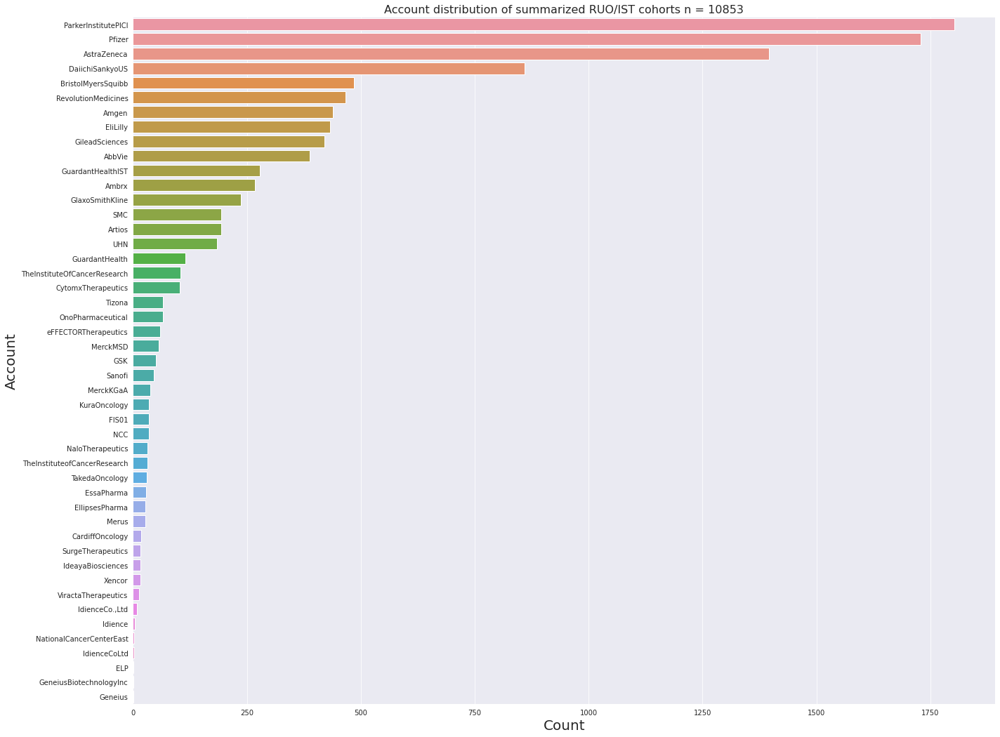

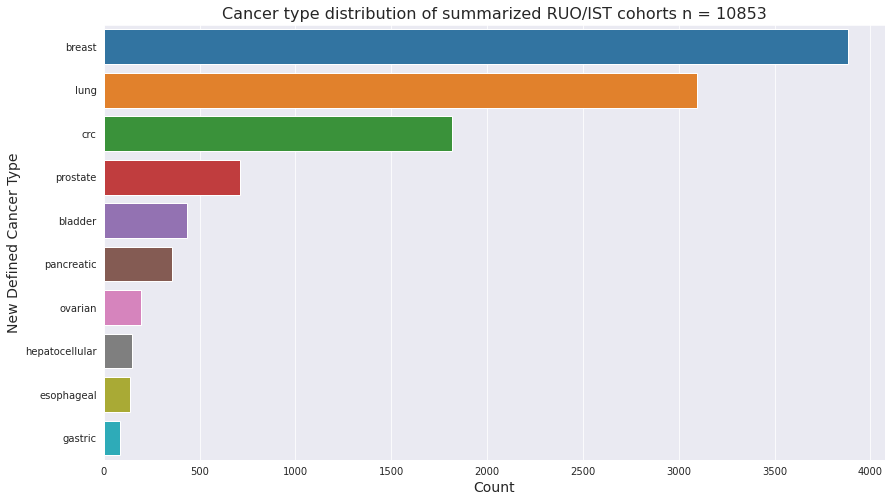

In [15]:
# Account distribution check 

plt.figure(figsize=(22, 18))
sns.set_style('darkgrid')
sns.countplot(data=top_prd_df, y='Account', order=top_prd_df['Account'].value_counts().index)

# Set plot title and labels
plt.title(f'Account distribution of summarized RUO/IST cohorts n = {top_prd_df.shape[0]}', fontsize=16)
plt.xlabel('Count', fontsize=20)
plt.ylabel('Account', fontsize=20)

# Plot the count plot for 'new_defined_cancer_type'
plt.figure(figsize=(14, 8))
sns.set_style('darkgrid')
sns.countplot(data=top_prd_df, y='new_defined_cancer_type', order=top_prd_df['new_defined_cancer_type'].value_counts().index)

# Set plot title and labels
plt.title(f'Cancer type distribution of summarized RUO/IST cohorts n = {top_prd_df.shape[0]}', fontsize=16)
plt.xlabel('Count', fontsize=14)
plt.ylabel('New Defined Cancer Type', fontsize=14)

# Show the plot
plt.show()


## Check CSO result of the outlier samples that Kyle identified (TF significantly changed after removing treatment-induced DMRs identified based on Pfizer Crown ArmB)

In [23]:
# Readin data
df_kyle_interest = pd.read_csv("/ghsfa/projects/omni_v2/users/kchang/lm_dev/data/all_ruo/tfv2_accn_hy.csv")
df_kyle_interest.head()

,runid,run_sample_id,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,qc_status,fc_dir,sample_id,GHSampleID,sample_path,mbd_path,mbd_avail,tfv2_force,tfv2_q5,tfv2_q95,n_region3_pan,n_regions_tail_trim,neat_ratio_newfit3_pan,Tumor_methylation_score,tfv2_force_treat,tfv2_q5_treat,tfv2_q95_treat,n_region3_pan_treat,n_regions_tail_trim_treat,neat_ratio_newfit3_pan_treat,Tumor_methylation_score_treat,accn_id,customerpatientid,bloodcolldate,visitname,cancertype,cancerother,addicancelcomment,requeststudyid,projectid,GHRequestID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,Account,SOW_num,cancer_category,cancerstage,visit_final,visit_clean,binary_visit,cancer_report,cbl_cancer_type,tfv2_ratio,flag
0,240104_A02048_0096_AHMGFFDSX7,A091100601,GCAATGGTAG,Female,Research,2024-01-06T22:59:58Z,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,KGA_31,lung adenocarcinoma,33.0,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0911006,cgp,PASS,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859,A091100601,A091100601,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091100601,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091100601/A091100601.mbd_hyper_molecules.tsv,2,0.000373,0.000341,0.000414,316,6,0.341046,0.000373,0.000375,0.000344,0.000411,307,6,0.342026,0.000375,A0911006,8040002,11/30/2023,Screening,Lung adenocarcinoma,NaN,NaN,MS201924_0022,KGA_31,A0911006,8040002,NaN,SUCCESS,NaN,6.76,3.0,Lung adenocarcinoma,20240202_MerckKGaA_SOW31_Batch6_3Samples_InfinityReport.csv,MerckKGaA,31.0,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Screening,screening,baseline,NSCLC,NSCLC,0.994571,NaN
1,240114_A00441_0930_BHMJ7VDSX7,A091102401,CGCAGGATCG,Female,Research,2024-01-16T20:51:14Z,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0911024,cgp,PASS,/ghsfa/projects/omni_v2/flowcells/240114_A00441_0930_BHMJ7VDSX7_PS3C365LDT_AP3.Sirius-1.1.2-RLS,A091102401,A091102401,/ghsfa/projects/omni_v2/flowcells/240114_A00441_0930_BHMJ7VDSX7_PS3C365LDT_AP3.Sirius-1.1.2-RLS/A091102401,/ghsfa/projects/omni_v2/flowcells/240114_A00441_0930_BHMJ7VDSX7_PS3C365LDT_AP3.Sirius-1.1.2-RLS/A091102401/A091102401.mbd_hyper_molecules.tsv,2,0.023403,0.022513,0.024252,556,6,0.999172,0.023403,0.023471,0.022606,0.024277,528,6,0.999163,0.023471,A0911024,0077,11/30/2023,Post-CRT,Rectal Cancer,NaN,NaN,GHStudy,NCC_14,A0911024,77.0,Post-CRT,SUCCESS,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,NaN,NaN,Other,NaN,Post-CRT,postcrt,non-baseline,CRC,CRC,0.997089,NaN
2,240104_A02048_0096_AHMGFFDSX7,A091540201,GATCACTAGG,Male,Research,2024-01-06T22:59:58Z,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,KGA_31,lung adenocarcinoma,67.0,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0915402,cgp,PASS,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859,A091540201,A091540201,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091540201,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091540201/A091540201.mbd_hyper_molecules.tsv,2,0.000081,0.000066,0.000098,129,6,0.214305,0.000081,0.000051,0.000042,0.000062,118,6,0.174658,0.000051,A0915402,8040001,12/06/2023,P2D1,Lung adenocarcinoma,NaN,NaN,MS201924_0022,KGA_31,A0915402,8040001,NaN,SUCCESS,NaN,11.91,4.0,Lung adenocarcinoma,20240202_MerckKGaA_SOW31_Batch6_3Samples_InfinityReport.csv,MerckKGaA,31.0,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",P2D1,p2d1,non-baseline,NSCLC,NSCLC,1.590982,NaN
3,240208_A00569_0732_AHNNHWDS

In [24]:
# Create the baseline and non-baseline conditions
baseline = df_kyle_interest['binary_visit'] == 'baseline'
non_baseline = df_kyle_interest['binary_visit'] == 'non-baseline'

# Create the conditions based on the "flag" column
flag_1_3 = df_kyle_interest['flag'] == 'ratio > 1.3'
flag_2 = df_kyle_interest['flag'] == 'ratio > 2'

# Create the new columns based on the flag conditions
df_kyle_interest['baseline_TFratio1.3'] = (baseline & flag_1_3).astype(int)
df_kyle_interest['baseline_TFratio2'] = (baseline & flag_2).astype(int)
df_kyle_interest['non_baseline_TFratio1.3'] = (non_baseline & flag_1_3).astype(int)
df_kyle_interest['non_baseline_TFratio2'] = (non_baseline & flag_2).astype(int)

# Check the sample size for each group
print(df_kyle_interest.flag.value_counts())

# Check the head of the DataFrame to confirm the changes
df_kyle_interest.head()

ratio > 1.3    93
ratio > 2      56
Name: flag, dtype: int64


,runid,run_sample_id,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,qc_status,fc_dir,sample_id,GHSampleID,sample_path,mbd_path,mbd_avail,tfv2_force,tfv2_q5,tfv2_q95,n_region3_pan,n_regions_tail_trim,neat_ratio_newfit3_pan,Tumor_methylation_score,tfv2_force_treat,tfv2_q5_treat,tfv2_q95_treat,n_region3_pan_treat,n_regions_tail_trim_treat,neat_ratio_newfit3_pan_treat,Tumor_methylation_score_treat,accn_id,customerpatientid,bloodcolldate,visitname,cancertype,cancerother,addicancelcomment,requeststudyid,projectid,GHRequestID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,Account,SOW_num,cancer_category,cancerstage,visit_final,visit_clean,binary_visit,cancer_report,cbl_cancer_type,tfv2_ratio,flag,baseline_TFratio1.3,baseline_TFratio2,non_baseline_TFratio1.3,non_baseline_TFratio2
0,240104_A02048_0096_AHMGFFDSX7,A091100601,GCAATGGTAG,Female,Research,2024-01-06T22:59:58Z,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,KGA_31,lung adenocarcinoma,33.0,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0911006,cgp,PASS,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859,A091100601,A091100601,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091100601,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091100601/A091100601.mbd_hyper_molecules.tsv,2,0.000373,0.000341,0.000414,316,6,0.341046,0.000373,0.000375,0.000344,0.000411,307,6,0.342026,0.000375,A0911006,8040002,11/30/2023,Screening,Lung adenocarcinoma,NaN,NaN,MS201924_0022,KGA_31,A0911006,8040002,NaN,SUCCESS,NaN,6.76,3.0,Lung adenocarcinoma,20240202_MerckKGaA_SOW31_Batch6_3Samples_InfinityReport.csv,MerckKGaA,31.0,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Screening,screening,baseline,NSCLC,NSCLC,0.994571,NaN,0,0,0,0
1,240114_A00441_0930_BHMJ7VDSX7,A091102401,CGCAGGATCG,Female,Research,2024-01-16T20:51:14Z,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0911024,cgp,PASS,/ghsfa/projects/omni_v2/flowcells/240114_A00441_0930_BHMJ7VDSX7_PS3C365LDT_AP3.Sirius-1.1.2-RLS,A091102401,A091102401,/ghsfa/projects/omni_v2/flowcells/240114_A00441_0930_BHMJ7VDSX7_PS3C365LDT_AP3.Sirius-1.1.2-RLS/A091102401,/ghsfa/projects/omni_v2/flowcells/240114_A00441_0930_BHMJ7VDSX7_PS3C365LDT_AP3.Sirius-1.1.2-RLS/A091102401/A091102401.mbd_hyper_molecules.tsv,2,0.023403,0.022513,0.024252,556,6,0.999172,0.023403,0.023471,0.022606,0.024277,528,6,0.999163,0.023471,A0911024,0077,11/30/2023,Post-CRT,Rectal Cancer,NaN,NaN,GHStudy,NCC_14,A0911024,77.0,Post-CRT,SUCCESS,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,NaN,NaN,Other,NaN,Post-CRT,postcrt,non-baseline,CRC,CRC,0.997089,NaN,0,0,0,0
2,240104_A02048_0096_AHMGFFDSX7,A091540201,GATCACTAGG,Male,Research,2024-01-06T22:59:58Z,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,KGA_31,lung adenocarcinoma,67.0,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0915402,cgp,PASS,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859,A091540201,A091540201,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091540201,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091540201/A091540201.mbd_hyper_molecules.tsv,2,0.000081,0.000066,0.000098,129,6,0.214305,0.000081,0.000051,0.000042,0.000062,118,6,0.174658,0.000051,A0915402,8040001,12/06/2023,P2D1,Lung adenocarcinoma,NaN,NaN,MS201924_0022,KGA_31,A0915402,8040001,NaN,SUCCESS,NaN,11.91,4.0,Lung adenocarcinoma,20240202_MerckKGaA_SOW31_Batch6_3Samples_InfinityReport.csv,MerckKGaA,31.0,LUNG,"Stage IIIB/IV NSCLC, Stage III/I

In [25]:
# Create a filter that checks if any of the new columns have a value of 1
filter_any_positive = (
    (df_kyle_interest['baseline_TFratio1.3'] == 1) |
    (df_kyle_interest['baseline_TFratio2'] == 1) |
    (df_kyle_interest['non_baseline_TFratio1.3'] == 1) |
    (df_kyle_interest['non_baseline_TFratio2'] == 1)
)

# Apply the filter to the original DataFrame to get only relevant rows
filtered_df = df_kyle_interest[filter_any_positive]
filtered_df.shape

(149, 75)

In [26]:
# List of columns to include from filtered_df (including the 4 new columns)
columns_to_include = [
    'run_sample_id', 'baseline_TFratio1.3', 'baseline_TFratio2',
    'non_baseline_TFratio1.3', 'non_baseline_TFratio2'
]

# Perform an inner join using 'run_sample_id' and 'GHSampleID'
merged_df = top_prd_df.merge(
    filtered_df[columns_to_include],
    left_on='GHSampleID',
    right_on='run_sample_id',
    how='inner'
)

# Verify the merged DataFrame
merged_df.head()


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id_x,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,run_sample_id_y,baseline_TFratio1.3,baseline_TFratio2,non_baseline_TFratio1.3,non_baseline_TFratio2
0,B00324233_230404_A01744_0071_AHVJGVDSX5,-10.724451,CSO_breast,-7.740379,PICI0009,A0675069,B00324233,PICI0009.PICI0009-3-1789,6 MONTHS POST 1ST DOSE,SUCCESS,NaN,1.76,5.220,1.0,NSCLC,20230929_ParkerInstitutePICI_RP_01_1024Samples_InfinityReport.csv,jinwang,2023-09-29,ParkerInstitutePICI,RP,Other,NaN,NaN,TAGATTACCC,Unknown,Research,2023-04-06 23:14:09-07:00,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0675069,NaN,230404_A01744_0071_AHVJGVDSX5,/ghsfa/projects/omni_v2/flowcells/230404_A01744_0071_AHVJGVDSX5_PS3R225_AP3.Sirius-1.1.0-RLS_20230825-115900,NaN,NaN,NaN,lung,other,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230404_A01744_0071_AHVJGVDSX5_PS3R225_AP3.Sirius-1.0.0-RLS,True,/ghsfa/projects/omni_v2/flowcells/230404_A01744_0071_AHVJGVDSX5_PS3R225_AP3.Sirius-1.1.0-RLS_20230825-115900/B00324233/B00324233.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/230404_A01744_0071_AHVJGVDSX5_PS3R225_AP3.Sirius-1.1.0-RLS_20230825-115900/B00324233/B00324233.ghcnv_qc.combined.hdr.tsv,B00324233,Female,Female,breast,1,NSCLC,B00324233,0,0,1,0
1,B00353154_230420_A01810_0121_AH37FCDSX7,-22.172777,CSO_lung,-18.226144,PICI0009,A0675432,B00353154,PICI0009.PICI0009-3-1023,4-6 WEEKS POST EOSI,SUCCESS,NaN,1.66,20.605,1.0,NSCLC,20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv,jinwang,2023-06-15,ParkerInstitutePICI,RP,Other,NaN,NaN,CACGATTCCA,Unknown,Research,2023-04-23 00:19:55-07:00,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0675432,NaN,230420_A01810_0121_AH37FCDSX7,/ghsfa/projects/omni_v2/flowcells/230420_A01810_0121_AH37FCDSX7_PS3R233_AP2.Sirius-1.1.0-RLS_20230829-101009,NaN,NaN,NaN,lung,other,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230420_A01810_0121_AH37FCDSX7_PS3R233_AP2.Sirius-1.1.0-RC4_20230524-122758,False,/ghsfa/projects/omni_v2/flowcells/230420_A01810_0121_AH37FCDSX7_PS3R233_AP2.Sirius-1.1.0-RLS_20230829-101009/B00353154/B00353154.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/230420_A01810_0121_AH37FCDSX7_PS3R233_AP2.Sirius-1.1.0-RLS_20230829-101009/B00353154/B00353154.ghcnv_qc.combined.hdr.tsv,B00353154,Male,Male,lung,1,NSCLC,B00353154,0,0,1,0
2,B00386407_230518_A01902_0142_BH3VYFDSX7,-19.058590,CSO_hepatocellular,-15.157302,B7461006,A0702325,B00386407,10381001,BC2D1,SUCCESS,NaN,0.12,241.150,3.5,Lung Cancer,20230718_Pfizer_RC1_462_Samples_InfinityReport.csv,clai,2023-07-18,Pfizer,RC1,Other,NaN,NaN,AGCGCTTATA,Male,Research,2023-05-20 16:55:41-07:00,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PFE_RC1,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0702325,NaN,230518_A01902_0142_BH3VYFDSX7,/ghsfa/ivd/flowcentral/230518_A01902_0142_BH3VYFDSX7.d9daf6c7-8336-4ef5-96ab-2086c6851a47.20230520165459,NaN,NaN,NaN,lung,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230518_A01902_0142_BH3VYFDSX7_PS3R288_AP3.Sirius-1.0.0-RLS,True,/ghsfa/ivd/flowcentral/230518_A01902_0142_BH3VYFDSX7.d9daf6c7-8336-4ef5-96ab-2086c6851a47.20230520165459/B00386407/B00386407.ghcnv_qc.hdr.tsv,/ghsfa/i

In [27]:
# Extract run_sample_id from merged_df
merged_sample_ids = merged_df['GHSampleID'].unique()

# Filter df_kyle_interest to find rows where run_sample_id is not in merged_sample_ids
df_not_in_merged = df_kyle_interest[~df_kyle_interest['run_sample_id'].isin(merged_sample_ids)]

# Display the result
df_not_in_merged.GHSampleID.unique()


array(['A091100601', 'A091102401', 'A091540201', ..., 'B00651694',
       'B00651695', 'B00651696'], dtype=object)

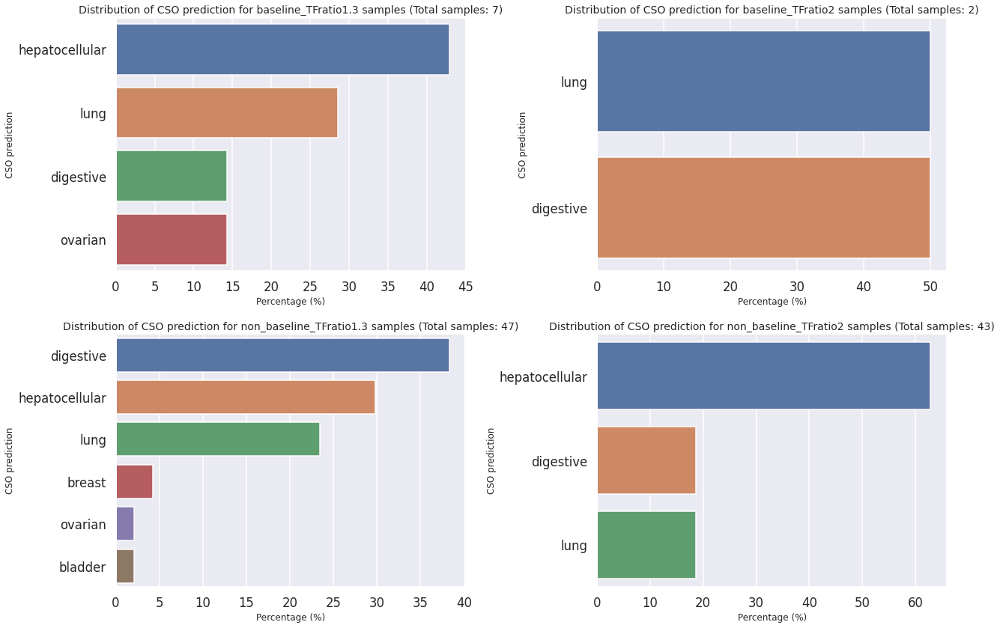

In [28]:
# Set up a 2x2 grid for subplots
fig, axs = plt.subplots(2, 2, figsize=(18, 12))
sns.set_style('darkgrid')

# Define a mapping of columns to subplot indices and titles
plot_data = [
    ("baseline_TFratio1.3", 0, 0, 'Distribution of CSO prediction for baseline_TFratio1.3 samples'),
    ("baseline_TFratio2", 0, 1, 'Distribution of CSO prediction for baseline_TFratio2 samples'),
    ("non_baseline_TFratio1.3", 1, 0, 'Distribution of CSO prediction for non_baseline_TFratio1.3 samples'),
    ("non_baseline_TFratio2", 1, 1, 'Distribution of CSO prediction for non_baseline_TFratio2 samples')
]

# Loop through each set of parameters and create percentage plots
for column, row, col, base_title in plot_data:
    # Filter data where the column value is 1
    filtered_df = merged_df[merged_df[column] == 1]
    total_samples = len(filtered_df)
    
    # Calculate the percentage of each cso_prediction
    prediction_counts = filtered_df['cso_prediction'].value_counts(normalize=True).mul(100).reset_index()
    prediction_counts.columns = ['cso_prediction', 'percentage']
    
    # Plot on the respective subplot
    ax = axs[row, col]
    sns.barplot(data=prediction_counts, y='cso_prediction', x='percentage', ax=ax)
    
    # Set titles and labels with total sample size
    ax.set_title(f'{base_title} (Total samples: {total_samples})', fontsize=14)
    ax.set_xlabel('Percentage (%)', fontsize=12)
    ax.set_ylabel('CSO prediction', fontsize=12)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()


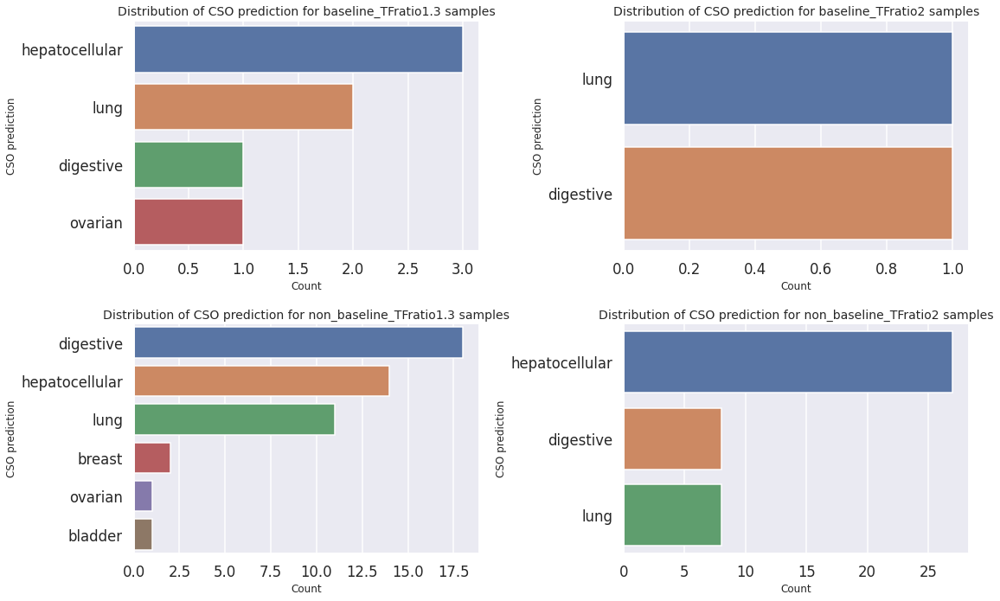

In [29]:
# Set up a 2x2 grid for subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
sns.set_style('darkgrid')

# Define a mapping of columns to subplot indices and titles
plot_data = [
    ("baseline_TFratio1.3", 0, 0, 'Distribution of CSO prediction for baseline_TFratio1.3 samples'),
    ("baseline_TFratio2", 0, 1, 'Distribution of CSO prediction for baseline_TFratio2 samples'),
    ("non_baseline_TFratio1.3", 1, 0, 'Distribution of CSO prediction for non_baseline_TFratio1.3 samples'),
    ("non_baseline_TFratio2", 1, 1, 'Distribution of CSO prediction for non_baseline_TFratio2 samples')
]

# Loop through each set of parameters and create count plots
for column, row, col, title in plot_data:
    # Filter data where the column value is 1
    filtered_df = merged_df[merged_df[column] == 1]
    
    # Plot on the respective subplot
    sns.countplot(data=filtered_df, y='cso_prediction', 
                  order=filtered_df['cso_prediction'].value_counts().index,
                  ax=axs[row, col])
    
    # Set titles and labels
    axs[row, col].set_title(title, fontsize=14)
    axs[row, col].set_xlabel('Count', fontsize=12)
    axs[row, col].set_ylabel('CSO prediction', fontsize=12)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()


Text(0, 0.5, 'Provided cancer type')

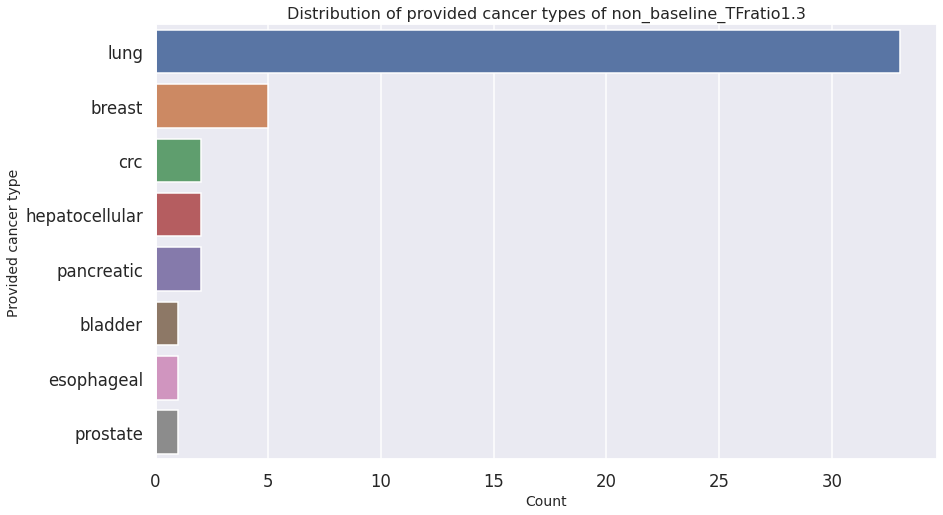

In [30]:
merged_df_1 = merged_df[merged_df["non_baseline_TFratio1.3"] == 1]
plt.figure(figsize=(14, 8))
sns.set_style('darkgrid')
sns.countplot(data=merged_df_1, y='new_defined_cancer_type', order=merged_df_1['new_defined_cancer_type'].value_counts().index)

# Set plot title and labels
plt.title('Distribution of provided cancer types of non_baseline_TFratio1.3', fontsize=16)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Provided cancer type', fontsize=14)

## CSO caller performance on RUO/IST samples

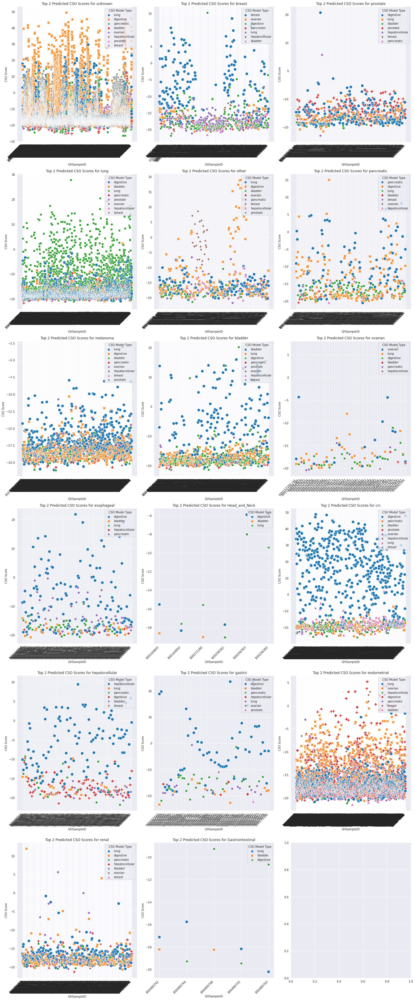

In [46]:
cancer_types = top_2_prd_df['new_defined_cancer_type'].unique()

n = len(cancer_types)
ncols = 3
nrows = (n + 1) // ncols  

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 8 * nrows)) 
axes = axes.flatten()  

for ax, cancer in zip(axes, cancer_types):
    df_subset = top_2_prd_df[top_2_prd_df['new_defined_cancer_type'] == cancer]
    
    # sns.scatterplot(data=df_subset, x='GHSampleID', y='cso_score', hue='cso_model_type', style='cso_model_type', s=100, ax=ax)
    sns.scatterplot(data=df_subset, x='GHSampleID', y='cso_score', hue='cso_prediction', style='cso_prediction', s=100, ax=ax)

    
    ax.set_title(f'Top 2 Predicted CSO Scores for {cancer}')
    ax.set_xlabel('GHSampleID')
    ax.set_ylabel('CSO Score')
    
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    
    ax.legend(title='CSO Model Type', loc='upper right')

plt.tight_layout()
plt.show()


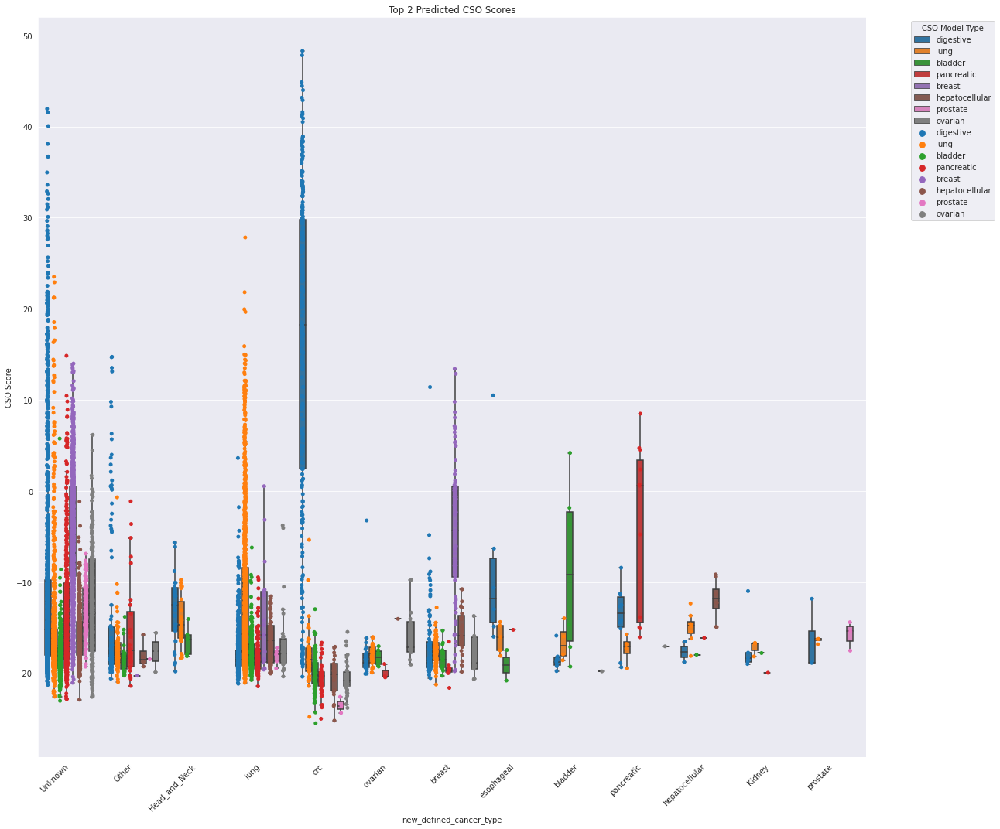

In [47]:
sns.set_style('darkgrid')

plt.figure(figsize=(18, 15))

sns.boxplot(data=top_prd_df, x='new_defined_cancer_type', y='cso_score', hue='cso_prediction', showfliers=False)

sns.stripplot(data=top_2_prd_df, x='new_defined_cancer_type', y='cso_score', hue='cso_prediction', jitter=True, size=5, dodge=True, linewidth=0.5, edgecolor='none')

plt.title('Top 2 Predicted CSO Scores')
plt.xlabel('new_defined_cancer_type')
plt.ylabel('CSO Score')

plt.xticks(rotation=45, ha='right')

plt.legend(title='CSO Model Type', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


# Identify suspicious samples (CSO predicted cancer that is inconsistent with provided cancer type)

In [7]:
# Filter to find rows where 'cso_prediction' is 'digestive'
digestive_pred = top_prd_df[top_prd_df['cso_prediction'] == 'digestive']

# Find unique GHSampleIDs that have 'digestive' in the top1 predictions
digestive_ghsample_ids = digestive_pred['GHSampleID'].unique()

# Filter the original DataFrame to get entries for these GHSampleIDs
filtered_df = top_prd_df[top_prd_df['GHSampleID'].isin(digestive_ghsample_ids)]

# Filter out rows where 'new_defined_cancer_type' is either 'crc', 'esophageal', or 'gastric' as this is how digestive CSO designed. 
df_digestive_cso = filtered_df[~filtered_df['new_defined_cancer_type'].isin(['crc', 'esophageal', 'gastric'])]

print("Total size of digestive CSO samples with non-digestive cancer type is " + str(df_digestive_cso.shape[0]) + "\n") 

df_digestive_cso.head()

Total size of digestive CSO samples with non-digestive cancer type is 1498



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother
4,A087355001_231019_A01112_0449_BHHTLMDSX7,-22.793513,CSO_esophageal,-19.290252,MS201924-0022,A0873550,A087355001,1060002,NaN,SUCCESS,NaN,NaN,14.300,2.5,Lung adenocarcinoma,20231030_MerckKGaA_SOW31_3_2_infinityReport.csv,amak,2023-10-30,MerckKGaA,SOW31,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Lung adenocarcinoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,231019_A01112_0449_BHHTLMDSX7,/ghsfa/ivd/flowcentral/231019_A01112_0449_BHHTLMDSX7.bd5e16cf-f71f-415b-943f-b4df73261037.20231021121846,NaN,NaN,NaN,lung,unknown,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/231019_A01112_0449_BHHTLMDSX7.bd5e16cf-f71f-415b-943f-b4df73261037.20231021121846/A087355001/A087355001.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/231019_A01112_0449_BHHTLMDSX7.bd5e16cf-f71f-415b-943f-b4df73261037.20231021121846/A087355001/A087355001.ghcnv_qc.combined.hdr.tsv,A087355001,Female,Female,digestive,1,Lung adenocarcinoma
6,A089298101_231209_A01021_0581_AH3H53DSX7,-22.074361,CSO_crc,-19.491651,MS201924-0022,A0892981,A089298101,8040001,NaN,SUCCESS,NaN,NaN,11.960,3.0,Lung adenocarcinoma,20231214_MerckKGaA_SOW31_4_3_infinityReport.csv,produser,2023-12-14,MerckKGaA,SOW31,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Lung adenocarcinoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,231209_A01021_0581_AH3H53DSX7,/ghsfa/ivd/flowcentral/231209_A01021_0581_AH3H53DSX7.ed08bddc-5270-4e08-9aa2-9512578cc742.20231211135636,NaN,NaN,NaN,lung,unknown,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/231209_A01021_0581_AH3H53DSX7.ed08bddc-5270-4e08-9aa2-9512578cc742.20231211135636/A089298101/A089298101.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/231209_A01021_0581_AH3H53DSX7.ed08bddc-5270-4e08-9aa2-9512578cc742.20231211135636/A089298101/A089298101.ghcnv_qc.combined.hdr.tsv,A089298101,Male,Male,digestive,1,Lung adenocarcinoma
229,B00148365_220628_A01744_0012_AHVJTGDSX3,-21.657424,CSO_crc,-18.524329,BTBC,A0513433,B00148365,KCL644,Timepoint 1,SUCCESS,NaN,0.58,20.345,3.6,Breast,20221007_TheInstituteOfCancerResearch_SOW01_78Samples_InfinityReport.csv,jyen,2022-10-07,TheInstituteOfCancerResearch,SOW01,Other,IV,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220628_A01744_0012_AHVJTGDSX3,/ghsfa/projects/omni_v2/flowcells/220628_A01744_0012_AHVJTGDSX3_PROD20_AP1.Sirius-1.1.2-RLS_20240123-170111,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/220628_A01744_0012_AHVJTGDSX3_PROD20_AP1.Sirius-1.0.0-RLS_20221002-103856,False,/ghsfa/projects/omni_v2/flowcells/220628_A01744_0012_AHVJTGDSX3_PROD20_AP1.Sirius-1.1.2-RLS_20240123-170111/B00148365/B00148365.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/220628_A01744_0012_AHVJTGDSX3_PROD20_AP1.Sirius-1.1.2-RLS_20240123-170111/B00148365/B00148365.ghcnv_qc.combined.hdr.tsv,B00148365,Female,Female,digestive,1,Breast
246,B00157189_220706_A01744_0015_AHVJHMDSX3,-0.431163,CSO_crc,-16.043715,BTBC,A0513403,B00157189,KCL682,Timepoint 1,SUCCESS,NaN,

In [8]:
# Filter for rows where 'cso_prediction' is 'hepatocellular' but provided cancer type is not 'hepatocellular'

# Filter to find rows where 'cso_prediction' is 'hepatocellular'
hepato_pred = top_prd_df[top_prd_df['cso_prediction'] == 'hepatocellular']

# Find unique GHSampleIDs that have 'hepatocellular' in the top-1 predictions
hepato_ghsample_ids = hepato_pred['GHSampleID'].unique()

# Filter the original DataFrame to get entries for these GHSampleIDs
filtered_df = top_prd_df[top_prd_df['GHSampleID'].isin(hepato_ghsample_ids)]

# Filter out rows where 'new_defined_cancer_type' is either 'hepatocellular'
df_liver_cso = filtered_df[~filtered_df['new_defined_cancer_type'].isin(['hepatocellular'])]

print("Total size of hepatocellular CSO samples with non-hepatocellular cancer type is " + str(df_liver_cso.shape[0]) + "\n") 

df_liver_cso.head()

Total size of hepatocellular CSO samples with non-hepatocellular cancer type is 126



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother
1062,B00193239_220916_A01744_0041_BHNLMMDSX3,-21.802477,CSO_hepatocellular,-19.567337,CGG21-016P,A0540370,B00193239,z1236,Pre-surgery,SUCCESS,NaN,12.95,36.14,5.4,Bladder Cancer,20220926_BristolMyersSquibb_SOW21_258Samples_InfinityReport.csv,kchang,2022-09-26,BristolMyersSquibb,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220916_A01744_0041_BHNLMMDSX3,/ghsfa/projects/omni_v2/flowcells/220916_A01744_0041_BHNLMMDSX3_PROD100_AP1.Sirius-1.1.0-RLS_20230717-191553,NaN,NaN,NaN,bladder,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/220916_A01744_0041_BHNLMMDSX3_PROD100_AP1.Sirius-1.0.0-RLS_20221205-163141,False,/ghsfa/projects/omni_v2/flowcells/220916_A01744_0041_BHNLMMDSX3_PROD100_AP1.Sirius-1.1.0-RLS_20230717-191553/B00193239/B00193239.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/220916_A01744_0041_BHNLMMDSX3_PROD100_AP1.Sirius-1.1.0-RLS_20230717-191553/B00193239/B00193239.ghcnv_qc.combined.hdr.tsv,B00193239,Female,Female,hepatocellular,1,Bladder Cancer
1540,B00248255_221208_A01902_0052_BHKMVCDSX5,-13.312687,CSO_hepatocellular,-16.893520,ART0380C001,A0618045,B00248255,5000-062,Cycle 3 Day 1 Predose,SUCCESS,NaN,2.49,87.10,1.0,NaN,20230421_Artios_SOW01_49Samples_InfinityReport.csv,psafabakhsh,2023-04-21,Artios,SOW01,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,221208_A01902_0052_BHKMVCDSX5,/ghsfa/projects/omni_v2/flowcells/221208_A01902_0052_BHKMVCDSX5_PROD147_AP2.Sirius-1.1.1-RLS_20231024-112301,ART0380C001,Advanced Cancer|Metastatic Cancer|Ovarian Cancer|Primary Peritoneal Cancer|Fallopian Tube Cancer,Artios Pharma Ltd,ovarian,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/221208_A01902_0052_BHKMVCDSX5_PROD147_AP2.Sirius-1.1.0-RLS_20230815-150048,True,/ghsfa/projects/omni_v2/flowcells/221208_A01902_0052_BHKMVCDSX5_PROD147_AP2.Sirius-1.1.1-RLS_20231024-112301/B00248255/B00248255.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/221208_A01902_0052_BHKMVCDSX5_PROD147_AP2.Sirius-1.1.1-RLS_20231024-112301/B00248255/B00248255.ghcnv_qc.combined.hdr.tsv,B00248255,Female,Female,hepatocellular,1,Advanced Cancer|Metastatic Cancer|Ovarian Cancer|Primary Peritoneal Cancer|Fallopian Tube Cancer
1541,B00248256_221208_A01902_0052_BHKMVCDSX5,-11.410867,CSO_hepatocellular,-15.731571,ART0380C001,A0618044,B00248256,5000-062,Screening,SUCCESS,NaN,2.92,47.19,1.0,NaN,20230421_Artios_SOW01_49Samples_InfinityReport.csv,psafabakhsh,2023-04-21,Artios,SOW01,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,221208_A01902_0052_BHKMVCDSX5,/ghsfa/projects/omni_v2/flowcells/221208_A01902_0052_BHKMVCDSX5_PROD147_AP2.Sirius-1.1.1-RLS_20231024-112301,ART0380C001,Advanced Cancer|Metastatic Cancer|Ovarian Cancer|Primary Peritoneal Cancer|Fallopian Tube Cancer,Artios Pharma Ltd,ovarian,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/221208_A01902_0052_BHKMVCDSX5_PROD147_AP2.Sirius-1.1.0-RLS_20230815-150048,True,/ghsfa/projects/omni_v2/flowcells/221208_A01902_0052_BHKMVCDSX5_PROD147_AP2.Sirius-1.1.1-RLS_20231024-112301/B00248256/B00248256.ghcnv_qc.hdr.tsv,/ghsfa/projects

In [10]:
# Filter for rows where 'cso_prediction' is 'lung' but provided cancer type is not 'lung'

# Filter to find rows where 'cso_prediction' is 'lung'
lung_pred = top_prd_df[top_prd_df['cso_prediction'] == 'lung']

# Find unique GHSampleIDs that have 'lung' in the top-1 predictions
lung_ghsample_ids = lung_pred['GHSampleID'].unique()

# Filter the original DataFrame to get entries for these GHSampleIDs
filtered_df = top_prd_df[top_prd_df['GHSampleID'].isin(lung_ghsample_ids)]

# Filter out rows where 'new_defined_cancer_type' is either 'lung'
df_lung_cso = filtered_df[~filtered_df['new_defined_cancer_type'].isin(['lung'])]

print("Total size of lung CSO samples with non-lung cancer type is " + str(df_lung_cso.shape[0]) + "\n") 

df_lung_cso.head()

Total size of lung CSO samples with non-lung cancer type is 1719



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother
0,A084877801_240114_A00441_0930_BHMJ7VDSX7,-22.105544,CSO_lung,-17.544355,JCOG1801 A1,A0848778,A084877801,81.0,Pre-CRT,SUCCESS,NaN,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,GCTCGGGCCT,Male,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0848778,cgp,240114_A00441_0930_BHMJ7VDSX7,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.combined.hdr.tsv,A084877801,Male,Male,lung,1,CRC
9,A090727101_240114_A00441_0930_BHMJ7VDSX7,-22.207529,CSO_lung,-18.065400,GHStudy,A0907271,A090727101,81.0,Post-CRT,SUCCESS,NaN,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,AGAACACGGC,Male,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0907271,cgp,240114_A00441_0930_BHMJ7VDSX7,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A090727101/A090727101.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A090727101/A090727101.ghcnv_qc.combined.hdr.tsv,A090727101,Male,Male,lung,1,CRC
219,B00148355_220628_A01744_0012_AHVJTGDSX3,-18.875681,CSO_lung,-17.488741,BTBC,A0513393,B00148355,KCL632,Timepoint 1,SUCCESS,NaN,1.58,64.090,3.6,Breast,20221007_TheInstituteOfCancerResearch_SOW01_78Samples_InfinityReport.csv,jyen,2022-10-07,TheInstituteOfCancerResearch,SOW01,Other,IV,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220628_A01744_0012_AHVJTGDSX3,/ghsfa/projects/omni_v2/flowcells/220628_A01744_0012_AHVJTGDSX3_PROD20_AP1.Sirius-1.1.2-RLS_20240123-170111,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/220628_A01744_0012_AHVJTGDSX3_PROD20_AP1.Sirius-1.0.0-RLS_20221002-103856,True,/ghsfa/projects/omni_v2/flowcells/220628_A01744_0012_AHVJTGDSX3_PROD20_AP1.Sirius-1.1.2-RLS_20240123-170111/B00148355/B00148355.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/220628_A01744_0012_AHVJTGDSX3_PROD20_AP1.Sirius-1.1.2-RLS_20240123-170111/B00148355/B00148355.ghcnv_qc.combined.hdr.tsv,B00148355,Female,Female,lung,1,Breast
226,B00148362_220628_A01744_0012_AHVJTGDSX3,-20.415868,CSO_lung,-18.949093,BTBC,A0513451,B00148362,KCL625,Timepoint 1,SUCCESS,NaN,0.86,42.640,3.6,Breast,20221007_TheInstituteOfCancerResearch_SOW01_78Samples_InfinityReport.csv,jyen,2022-10-07,TheInstituteOfCancerResearch,SOW01,Other,IV,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220628_A01744_0012_AHVJTGDSX3,/ghsfa/projects/omni_v2/flowcells/220628_A01744_0

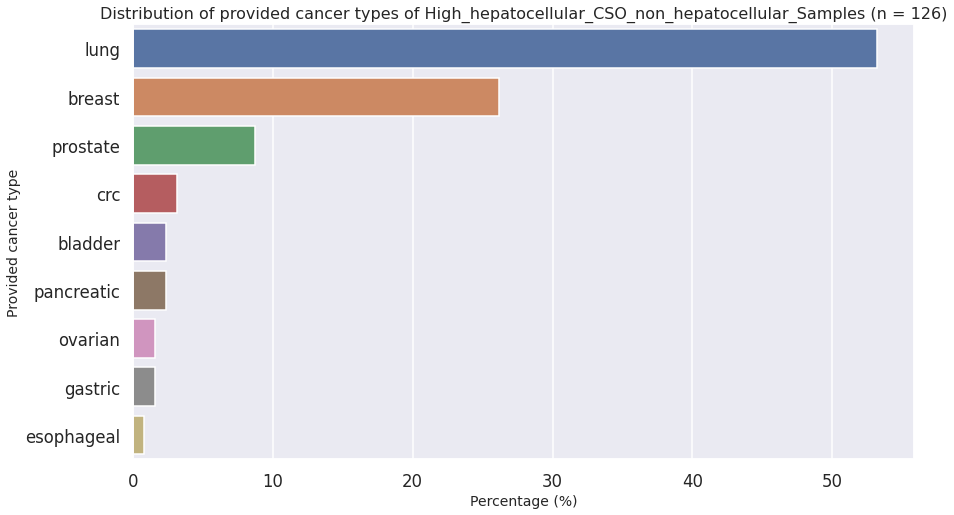

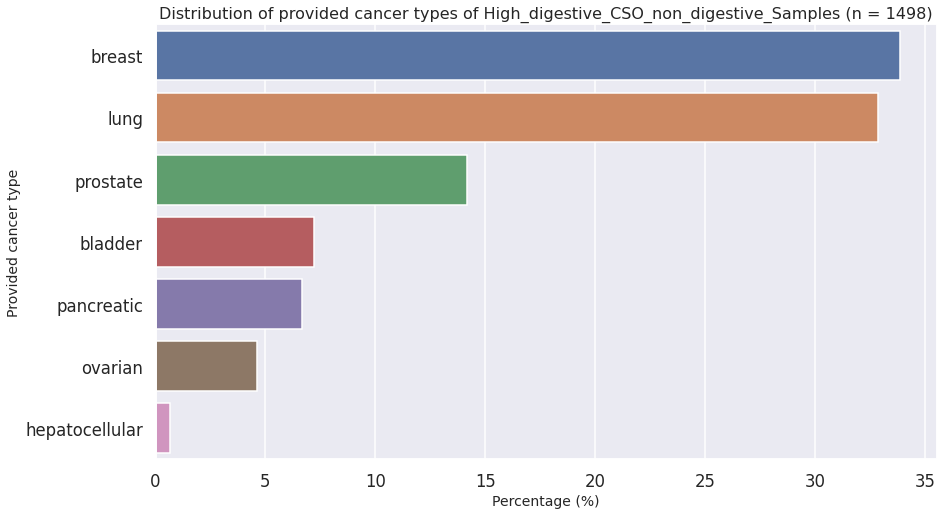

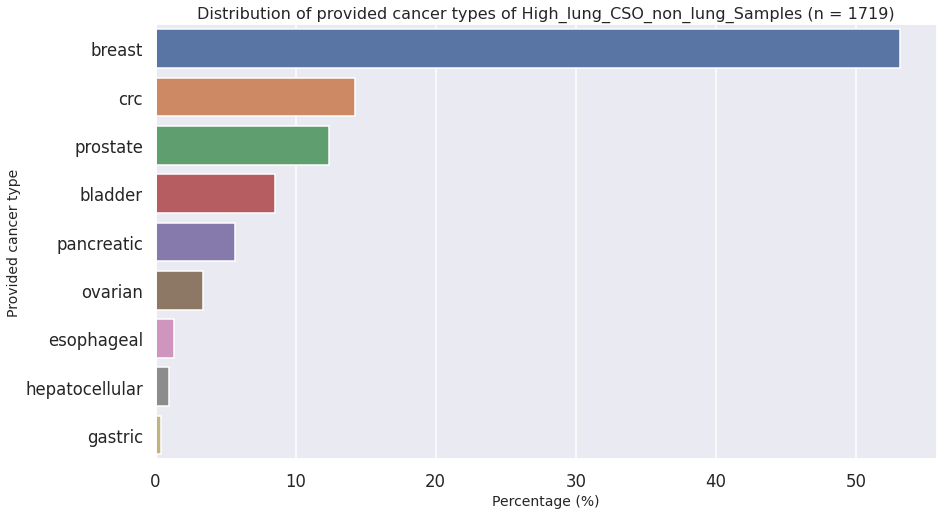

In [9]:
# Plot cancer type distribution of those high CSO suspicious by percentage
sns.set(style="darkgrid", context="talk")

def plot_cancer_distribution_percentage(df, title_suffix):
    # Create a figure with a predefined size
    plt.figure(figsize=(14, 8))
    
    # Calculate percentage of each cancer type
    value_counts = df['new_defined_cancer_type'].value_counts(normalize=True) * 100
    order = value_counts.index
    
    # Generate a countplot with percentages
    sns.barplot(x=value_counts, y=order)
    
    # Set title and labels with dynamic titles based on the input parameter
    plt.title(f'Distribution of provided cancer types of {title_suffix} (n = {df.shape[0]})', fontsize=16)
    plt.xlabel('Percentage (%)', fontsize=14)
    plt.ylabel('Provided cancer type', fontsize=14)
    
    # Show the plot
    plt.show()

# Call the function with different datasets and titles
plot_cancer_distribution_percentage(df_liver_cso, 'High_hepatocellular_CSO_non_hepatocellular_Samples')
plot_cancer_distribution_percentage(df_digestive_cso, 'High_digestive_CSO_non_digestive_Samples')
plot_cancer_distribution_percentage(df_lung_cso, 'High_lung_CSO_non_lung_Samples')


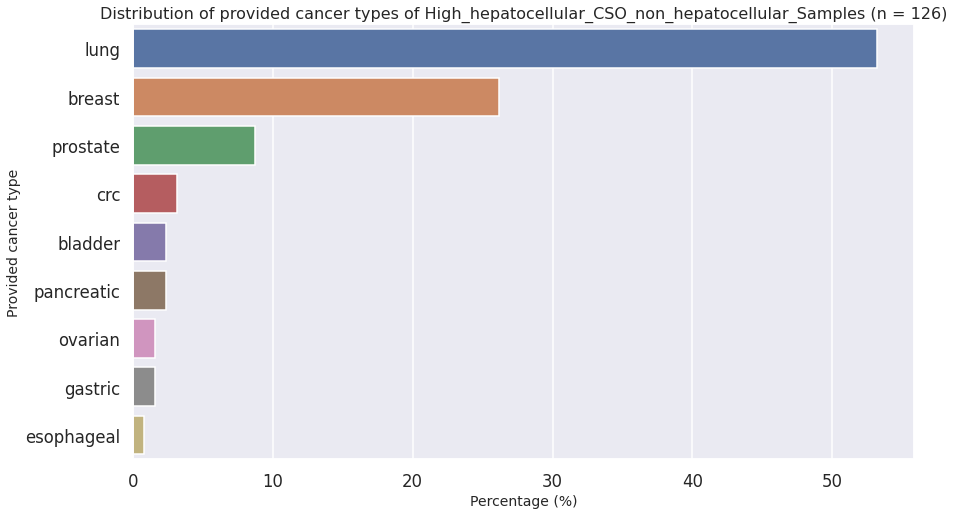

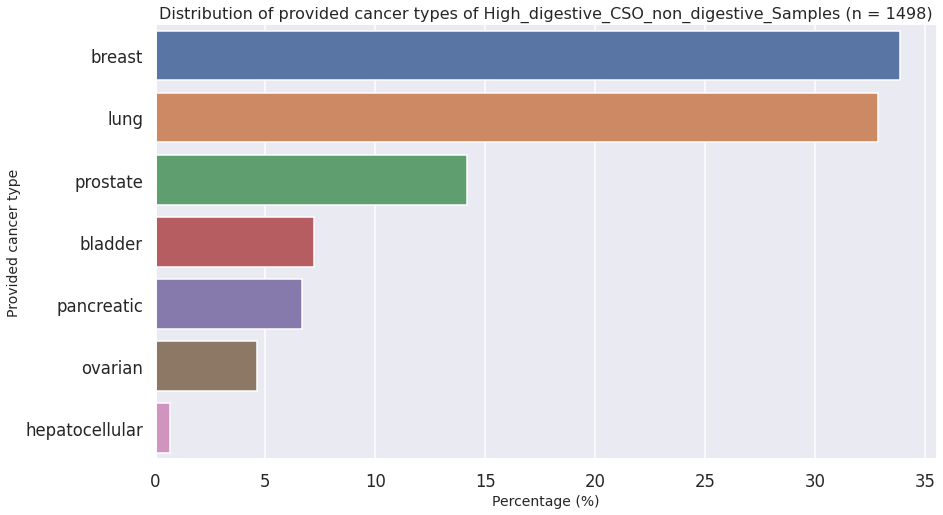

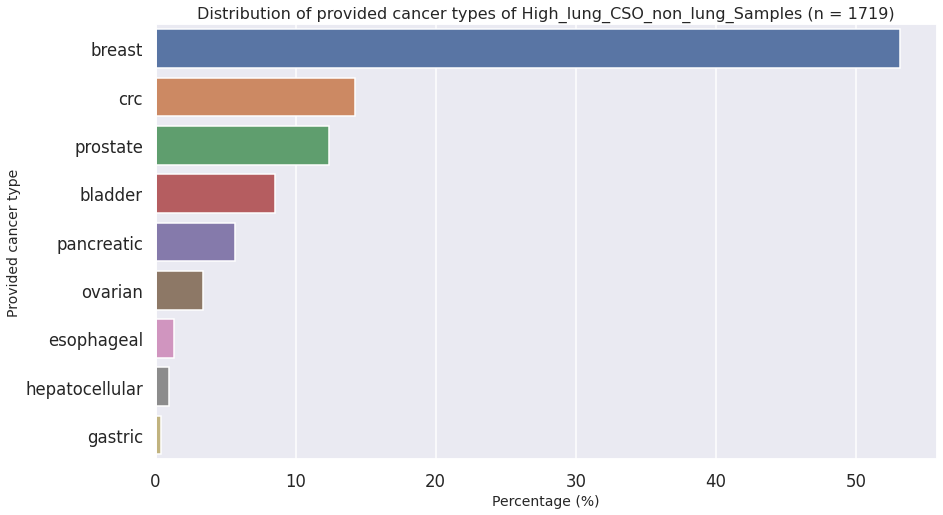

In [16]:
# Plot cancer type distribution of those high CSO suspicious by percentage
sns.set(style="darkgrid", context="talk")

def plot_cancer_distribution_percentage(df, title_suffix):
    # Create a figure with a predefined size
    plt.figure(figsize=(14, 8))
    
    # Calculate percentage of each cancer type
    value_counts = df['new_defined_cancer_type'].value_counts(normalize=True) * 100
    order = value_counts.index
    
    # Generate a countplot with percentages
    sns.barplot(x=value_counts, y=order)
    
    # Set title and labels with dynamic titles based on the input parameter
    plt.title(f'Distribution of provided cancer types of {title_suffix} (n = {df.shape[0]})', fontsize=16)
    plt.xlabel('Percentage (%)', fontsize=14)
    plt.ylabel('Provided cancer type', fontsize=14)
    
    # Show the plot
    plt.show()

# Call the function with different datasets and titles
plot_cancer_distribution_percentage(df_liver_cso, 'High_hepatocellular_CSO_non_hepatocellular_Samples')
plot_cancer_distribution_percentage(df_digestive_cso, 'High_digestive_CSO_non_digestive_Samples')
plot_cancer_distribution_percentage(df_lung_cso, 'High_lung_CSO_non_lung_Samples')


### Prevalence of suspicious sample in different categories

In [11]:
# Select treatment samples only
df_liver_cso_treatment = df_liver_cso[df_liver_cso['treatment'] == "Treatment"]
print(str(df_liver_cso_treatment.Visit_name.unique()) + "\n")
print("Total sample size of is " + str(df_liver_cso_treatment.shape[0]) + "\n")

df_digestive_cso_treatment = df_digestive_cso[df_digestive_cso['treatment'] == "Treatment"]
print(str(df_digestive_cso_treatment.Visit_name.unique()) + "\n")
print("Total sample size is " + str(df_digestive_cso_treatment.shape[0]) + "\n")


df_lung_cso_treatment = df_lung_cso[df_lung_cso['treatment'] == "Treatment"]
print(str(df_lung_cso_treatment.Visit_name.unique()) + "\n")
print("Total sample size is " + str(df_lung_cso_treatment.shape[0]) + "\n")

# Select baseline samples only
df_liver_cso_baseline = df_liver_cso[df_liver_cso['treatment'] == "Baseline"]
print(str(df_liver_cso_baseline.Visit_name.unique()) + "\n")
print("Total sample size is " + str(df_liver_cso_baseline.shape[0]) + "\n")

df_digestive_cso_baseline = df_digestive_cso[df_digestive_cso['treatment'] == "Baseline"]
print(str(df_digestive_cso_baseline.Visit_name.unique()) + "\n")
print("Total sample size is " + str(df_digestive_cso_baseline.shape[0]) + "\n")

df_lung_cso_baseline = df_lung_cso[df_lung_cso['treatment'] == "Baseline"]
print(str(df_lung_cso_baseline.Visit_name.unique()) + "\n")
print("Total sample size is " + str(df_lung_cso_baseline.shape[0]) + "\n")


['C2D1J' 'C3D1' 'BC2D1' 'AC2D1' 'End of Treatment' 'ON-TREATMENT' 'C2D1']

Total sample size of is 65

['C2D1J' 'ON-TREATMENT' 'C6D1' 'C10D1' 'C2D1' 'C4D1' 'C8D1' 'C3D1' 'C14D1'
 'BC2D1' 'AC2D1' 'C5D1' 'C04D1' 'CCRTC3D1' 'MAINTC3D1' 'MAINTC1D1'
 'MAINTC8D1' 'CCRTC2D1' 'MAINTC2D1' 'MAINT C1/8 D1' 'ARM C MAINT C1/8 D1'
 'QD: C2D1' 'C1D15' 'C7D1' 'C13D1' 'C29D1' 'Tx Naïve' 'C12D1' 'C3D1*'
 'AMD2 C5D1']

Total sample size is 467

['C2D1J' 'C2D1' 'C3D1' 'C4D1' 'C6D1' 'C05D1' 'C8D1' 'C04D1'
 'End of Treatment' 'C5D1' 'C3D1 PART 2-4' 'C3D1 EXPANSION' 'C9D1*' 'C7D1'
 'C11D1' 'ON-TREATMENT' 'On-treatment' 'C1D15' 'C10D1' 'C39D1' 'C17D1'
 'C23D1' 'C18D1' 'C13D1' 'C35D1' 'C31D1' 'C28D1' 'C47D1' 'C44D1' 'C25D1'
 'C38D1' 'C34D1' 'C59D1' 'C55D1' 'C50D1' 'C42D1' 'Tx Naïve' 'C3D1*'
 'C2D1*']

Total sample size is 562

['Pre-surgery' 'Cycle 3 Day 1 Predose' 'Screening' 'BSLJ' 'SCRN' 'C1D1'
 'PRE-TREATMENT' 'Dose Expansion C1D1 (Grp2)' 'Baseline' 'C1D1PRE']

Total sample size is 20

['Timepoint 1' 'Scrn

### Check the suspicious treatment samples that have high TFv2 change (>1.3) after removing treatment effect DMRs 

In [32]:
# High CSO digestive samples 

# List of columns to include from filtered_df (including the 4 new columns)
columns_to_include = [
    'run_sample_id_y', 'baseline_TFratio1.3', 'baseline_TFratio2',
    'non_baseline_TFratio1.3', 'non_baseline_TFratio2'
]

# Perform an inner join using 'run_sample_id' and 'GHSampleID'
df_digestive_tf_suspicious = df_liver_cso_treatment.merge(
    merged_df[columns_to_include],
    left_on='GHSampleID',
    right_on='run_sample_id_y',
    how='inner'
)

# Verify the merged DataFrame
df_digestive_tf_suspicious.head()

print(df_digestive_tf_suspicious.csv_file_name.value_counts())
df_digestive_tf_suspicious_no_pfizer = df_digestive_tf_suspicious[df_digestive_tf_suspicious["csv_file_name"] != "20230718_Pfizer_RC1_462_Samples_InfinityReport.csv"]
df_digestive_tf_suspicious_no_pfizer

20230718_Pfizer_RC1_462_Samples_InfinityReport.csv    26
Name: csv_file_name, dtype: int64


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,run_sample_id_y,baseline_TFratio1.3,baseline_TFratio2,non_baseline_TFratio1.3,non_baseline_TFratio2


In [33]:
# High hepatoceulluar CSO samples 

# List of columns to include from filtered_df (including the 4 new columns)
columns_to_include = [
    'run_sample_id_y', 'baseline_TFratio1.3', 'baseline_TFratio2',
    'non_baseline_TFratio1.3', 'non_baseline_TFratio2'
]

# Perform an inner join using 'run_sample_id' and 'GHSampleID'
df_liver_tf_suspicious = df_liver_cso_treatment.merge(
    merged_df[columns_to_include],
    left_on='GHSampleID',
    right_on='run_sample_id_y',
    how='inner'
)

# Verify the merged DataFrame
print(df_liver_tf_suspicious.csv_file_name.value_counts())
print(df_liver_tf_suspicious.shape)
print(df_liver_tf_suspicious.csv_file_name.value_counts())
df_liver_tf_suspicious.head()

20230718_Pfizer_RC1_462_Samples_InfinityReport.csv    26
Name: csv_file_name, dtype: int64
(26, 64)
20230718_Pfizer_RC1_462_Samples_InfinityReport.csv    26
Name: csv_file_name, dtype: int64


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,run_sample_id_y,baseline_TFratio1.3,baseline_TFratio2,non_baseline_TFratio1.3,non_baseline_TFratio2
0,B00386407_230518_A01902_0142_BH3VYFDSX7,-19.058590,CSO_hepatocellular,-15.157302,B7461006,A0702325,B00386407,10381001,BC2D1,SUCCESS,NaN,0.12,241.150,3.5,Lung Cancer,20230718_Pfizer_RC1_462_Samples_InfinityReport.csv,clai,2023-07-18,Pfizer,RC1,Other,NaN,NaN,AGCGCTTATA,Male,Research,2023-05-20 16:55:41-07:00,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PFE_RC1,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0702325,NaN,230518_A01902_0142_BH3VYFDSX7,/ghsfa/ivd/flowcentral/230518_A01902_0142_BH3VYFDSX7.d9daf6c7-8336-4ef5-96ab-2086c6851a47.20230520165459,NaN,NaN,NaN,lung,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230518_A01902_0142_BH3VYFDSX7_PS3R288_AP3.Sirius-1.0.0-RLS,True,/ghsfa/ivd/flowcentral/230518_A01902_0142_BH3VYFDSX7.d9daf6c7-8336-4ef5-96ab-2086c6851a47.20230520165459/B00386407/B00386407.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230518_A01902_0142_BH3VYFDSX7.d9daf6c7-8336-4ef5-96ab-2086c6851a47.20230520165459/B00386407/B00386407.ghcnv_qc.combined.hdr.tsv,B00386407,Male,Male,hepatocellular,1,Lung Cancer,B00386407,0,0,0,1
1,B00386460_230518_A01902_0142_BH3VYFDSX7,-16.868683,CSO_hepatocellular,-13.763405,B7461006,A0702337,B00386460,10431006,BC2D1,SUCCESS,NaN,0.00,24.440,3.5,Lung Cancer,20230718_Pfizer_RC1_462_Samples_InfinityReport.csv,clai,2023-07-18,Pfizer,RC1,Other,NaN,NaN,TGCCCTAGTC,Female,Research,2023-05-20 16:55:41-07:00,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PFE_RC1,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0702337,NaN,230518_A01902_0142_BH3VYFDSX7,/ghsfa/ivd/flowcentral/230518_A01902_0142_BH3VYFDSX7.d9daf6c7-8336-4ef5-96ab-2086c6851a47.20230520165459,NaN,NaN,NaN,lung,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230518_A01902_0142_BH3VYFDSX7_PS3R288_AP3.Sirius-1.0.0-RLS,True,/ghsfa/ivd/flowcentral/230518_A01902_0142_BH3VYFDSX7.d9daf6c7-8336-4ef5-96ab-2086c6851a47.20230520165459/B00386460/B00386460.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230518_A01902_0142_BH3VYFDSX7.d9daf6c7-8336-4ef5-96ab-2086c6851a47.20230520165459/B00386460/B00386460.ghcnv_qc.combined.hdr.tsv,B00386460,Female,Female,hepatocellular,1,Lung Cancer,B00386460,0,0,0,1
2,B00386855_230520_A01907_0099_BH3TFGDSX7,-17.567101,CSO_hepatocellular,-12.934311,B7461006,A0702480,B00386855,11401003,BC2D1,SUCCESS,NaN,1.03,180.700,3.5,Lung Cancer,20230718_Pfizer_RC1_462_Samples_InfinityReport.csv,clai,2023-07-18,Pfizer,RC1,Other,NaN,NaN,CAGGCGTTGC,Female,Research,2023-05-22 18:38:56-07:00,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PFE_RC1,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0702480,NaN,230520_A01907_0099_BH3TFGDSX7,/ghsfa/ivd/flowcentral/230520_A01907_0099_BH3TFGDSX7.fe47f7cf-c3cb-4ce7-85c8-515eb3e414be.20230522183819,NaN,NaN,NaN,lung,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230520_A01907_0099_BH3TFGDSX7_PS3R290_AP1.Sirius-1.0.0-RLS,True,/ghsfa/ivd/flowcentral/230520_A01907_0099_BH3TFGDSX7.fe47f7cf-c3cb-4ce7-85c8-515eb3e414be.20230522183819/B00386855/B00386855.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230520_A01907_0099_BH3TFGDSX7.fe47f7cf-c3cb-4ce7-85c8-515eb3e414be.20230522183819/B00

In [34]:
df_liver_tf_suspicious_no_pfizer = df_liver_tf_suspicious[df_liver_tf_suspicious["csv_file_name"] != "20230718_Pfizer_RC1_462_Samples_InfinityReport.csv"]
df_liver_tf_suspicious_no_pfizer

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,run_sample_id_y,baseline_TFratio1.3,baseline_TFratio2,non_baseline_TFratio1.3,non_baseline_TFratio2


In [35]:
# High lung CSO samples 

# List of columns to include from filtered_df (including the 4 new columns)
columns_to_include = [
    'run_sample_id_y', 'baseline_TFratio1.3', 'baseline_TFratio2',
    'non_baseline_TFratio1.3', 'non_baseline_TFratio2'
]

# Perform an inner join using 'run_sample_id' and 'GHSampleID'
df_lung_tf_suspicious = df_lung_cso_treatment.merge(
    merged_df[columns_to_include],
    left_on='GHSampleID',
    right_on='run_sample_id_y',
    how='inner'
)

# Verify the merged DataFrame
print(df_lung_tf_suspicious.csv_file_name.value_counts())
print(df_lung_tf_suspicious.shape)
print(df_lung_tf_suspicious.csv_file_name.value_counts())
df_lung_tf_suspicious.head()

20240110_RevolutionMedicines_SOW12_Batch5_51Samples_InfinityReport.csv    1
20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv          1
Name: csv_file_name, dtype: int64
(2, 64)
20240110_RevolutionMedicines_SOW12_Batch5_51Samples_InfinityReport.csv    1
20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv          1
Name: csv_file_name, dtype: int64


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,run_sample_id_y,baseline_TFratio1.3,baseline_TFratio2,non_baseline_TFratio1.3,non_baseline_TFratio2
0,B00572259_240104_A02056_0111_BHMF3VDSX7,-19.946955,CSO_lung,-16.615891,RMC-6236-001,A0928555,B00572259,6236-001-008-0169,C2D1,SUCCESS,NaN,1.33,20.44,4.0,NaN,20240110_RevolutionMedicines_SOW12_Batch5_51Samples_InfinityReport.csv,produser,2024-01-10,RevolutionMedicines,SOW12,Other,NaN,NaN,TGGTTACGGC,Unknown,Research,2024-01-06 15:30:27-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,REV_12,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0928555,cgp,240104_A02056_0111_BHMF3VDSX7,/ghsfa/ivd/flowcentral/240104_A02056_0111_BHMF3VDSX7,RMC-6236-001,Non-small Cell Lung Cancer (NSCLC)|Colorectal Cancer (CRC)|Pancreatic Ductal Adenocarcinoma (PDAC)|Advanced Solid Tumors,"Revolution Medicines, Inc.",breast,Treatment,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,True,/ghsfa/ivd/flowcentral/240104_A02056_0111_BHMF3VDSX7/B00572259/B00572259.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240104_A02056_0111_BHMF3VDSX7/B00572259/B00572259.ghcnv_qc.combined.hdr.tsv,B00572259,Female,Female,lung,1,Non-small Cell Lung Cancer (NSCLC)|Colorectal Cancer (CRC)|Pancreatic Ductal Adenocarcinoma (PDAC)|Advanced Solid Tumors,B00572259,0,0,1,0
1,B00646470_240418_A01020_0781_AH37KCDSXC,-22.014417,CSO_lung,-17.385304,D9268C00001,A0989103,B00646470,E7003001,C2D1,SUCCESS,NaN,NaN,40.87,3.0,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,ATCCACGGAG,Unknown,Research,2024-04-20 06:40:43-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0989103,cgp,240418_A01020_0781_AH37KCDSXC,/ghsfa/ivd/flowcentral/240418_A01020_0781_AH37KCDSXC.9aed9491-cf5b-49bd-a3f3-f366f7b29ba8.20240419233958,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240418_A01020_0781_AH37KCDSXC.9aed9491-cf5b-49bd-a3f3-f366f7b29ba8.20240419233958/B00646470,False,/ghsfa/ivd/flowcentral/240418_A01020_0781_AH37KCDSXC.9aed9491-cf5b-49bd-a3f3-f366f7b29ba8.20240419233958/B00646470/B00646470.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240418_A01020_0781_AH37KCDSXC.9aed9491-cf5b-49bd-a3f3-f366f7b29ba8.20240419233958/B00646470/B00646470.ghcnv_qc.combined.hdr.tsv,B00646470,Female,Female,lung,1,Breast,B00646470,0,0,1,0


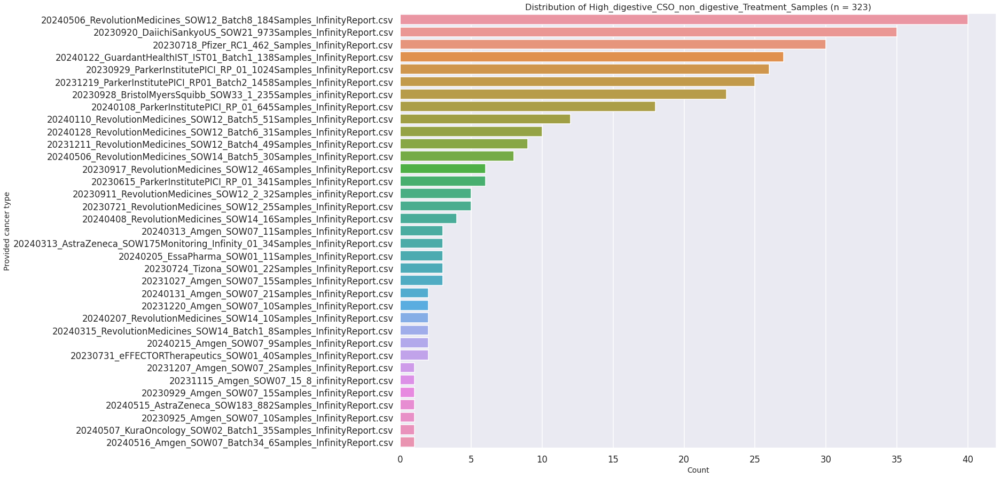

In [58]:
# Plot cancer type distribution of those high CSO suspicious 
sns.set(style="darkgrid", context="talk")

def plot_csv(df, title_suffix):
    # Create a figure with a predefined size
    plt.figure(figsize=(20, 15))
    
    # Generate a countplot
    sns.countplot(data=df, y='csv_file_name', 
                  order=df['csv_file_name'].value_counts().index)
    
    # Set title and labels with dynamic titles based on the input parameter
    plt.title(f'Distribution of {title_suffix} (n = {df.shape[0]})', fontsize=16)
    plt.xlabel('Count', fontsize=14)
    plt.ylabel('Provided cancer type', fontsize=14)
    
    # Show the plot
    plt.show()

# Call the function with different datasets and titles
plot_csv(df_digestive_cso_treatment, 'High_digestive_CSO_non_digestive_Treatment_Samples')


### Checking the prevalence of suspicous samples by binning the TFv2

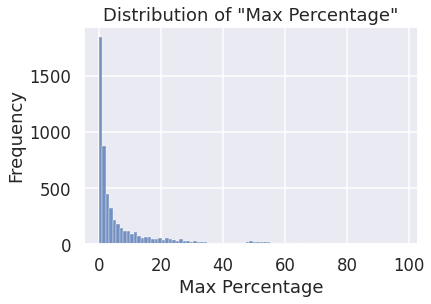

In [65]:
# Bin the samples based on the genomic maf "Max_percentage" column in the report
sns.histplot(top_prd_df['Max_percentage'])
plt.title('Distribution of "Max Percentage"')
plt.xlabel('Max Percentage')
plt.ylabel('Frequency')
plt.show()

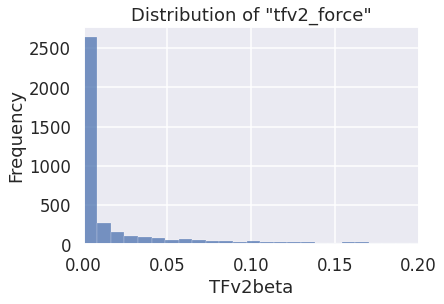

In [13]:
# Bin the samples based on the genomic maf "tfv2_force" column in the report
sns.histplot(top_prd_df['tfv2_force'])
plt.title('Distribution of "tfv2_force"')
plt.xlabel('TFv2beta')
plt.xlim(0, 0.2)
plt.ylabel('Frequency')
plt.show()

In [8]:
# Check for duplicates in the 'GHSampleID' column
duplicates = top_prd_df.duplicated(subset='GHSampleID', keep=False)

# Display rows where 'GHSampleID' is duplicated
duplicate_rows = top_prd_df[duplicates]

# Print the duplicate rows
duplicate_rows


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank


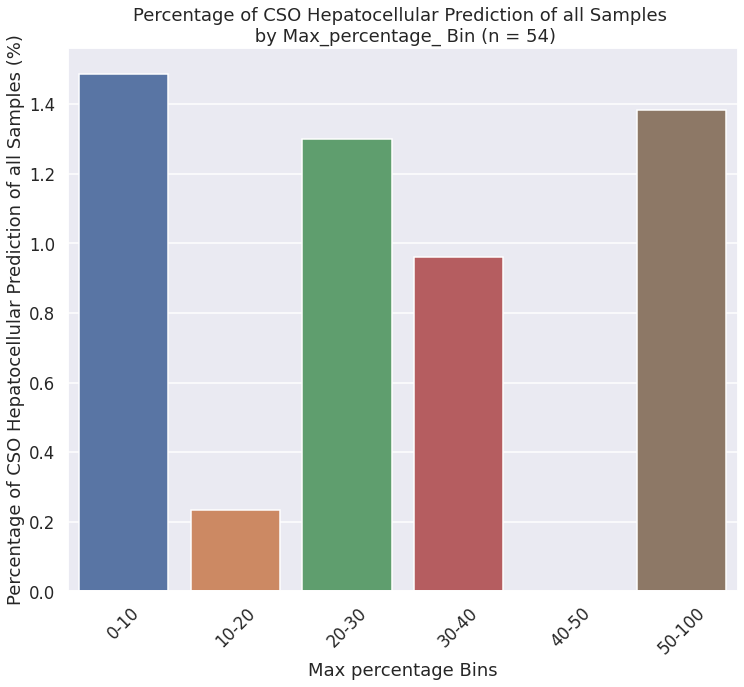

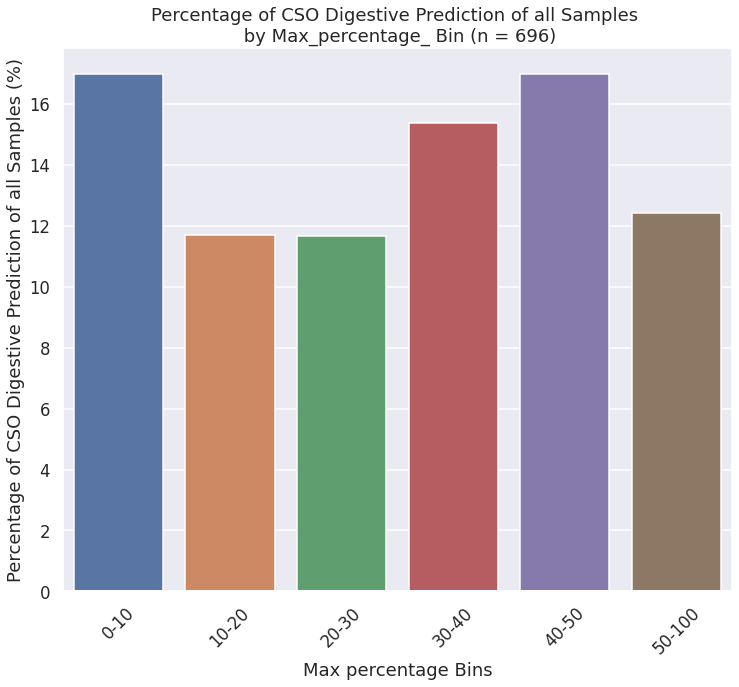

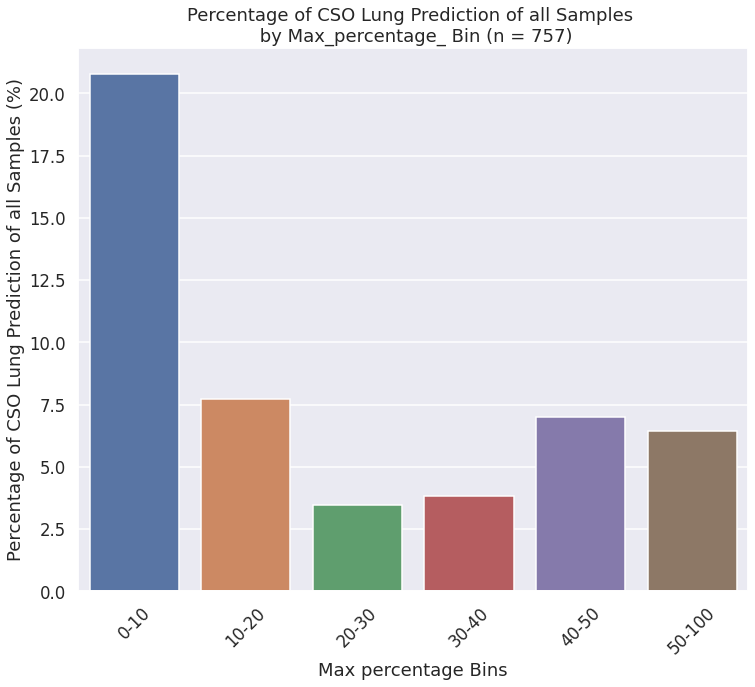

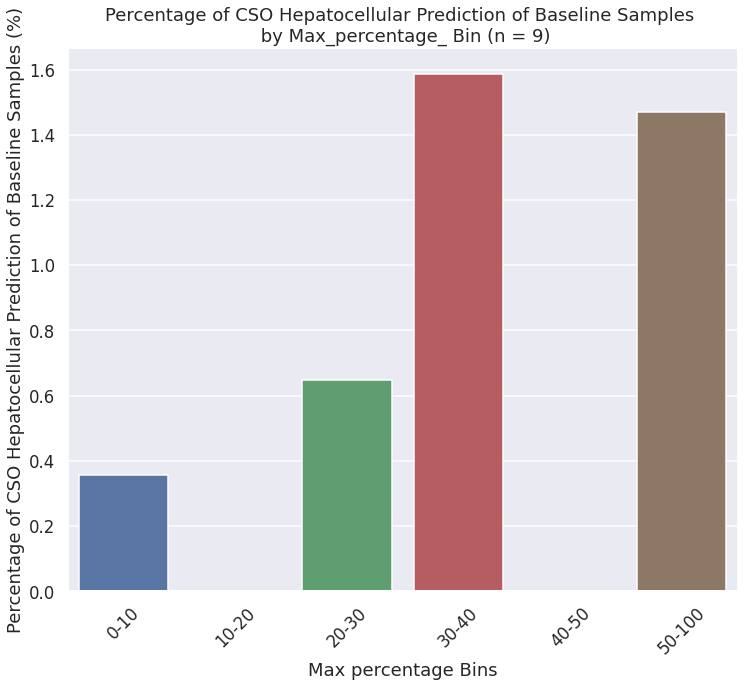

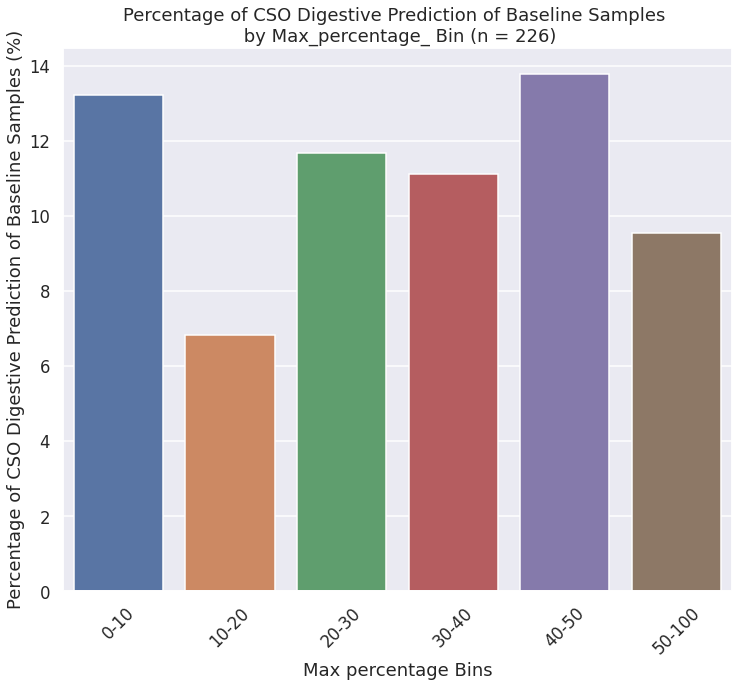

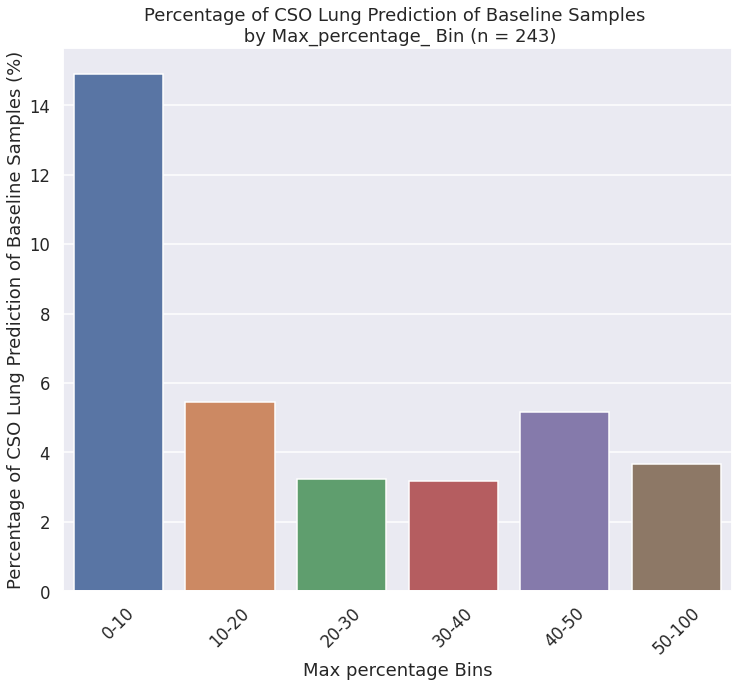

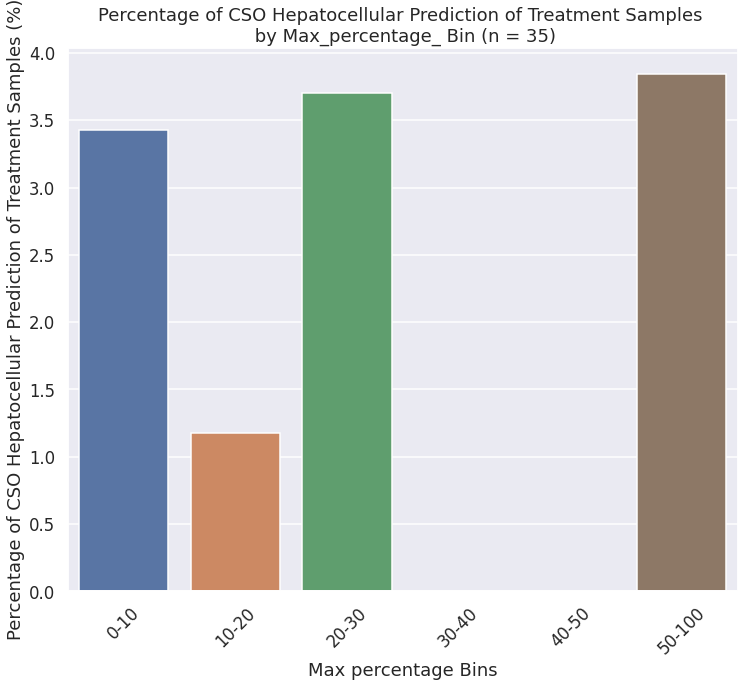

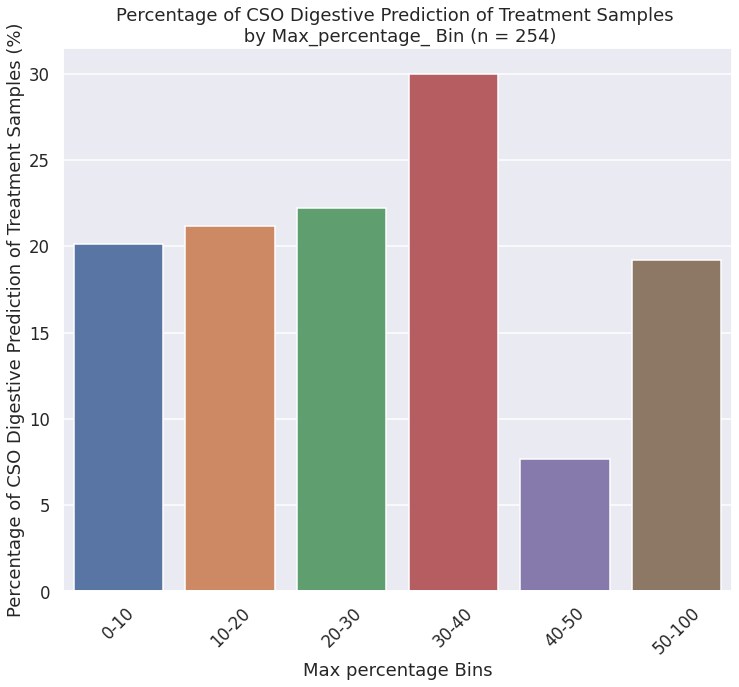

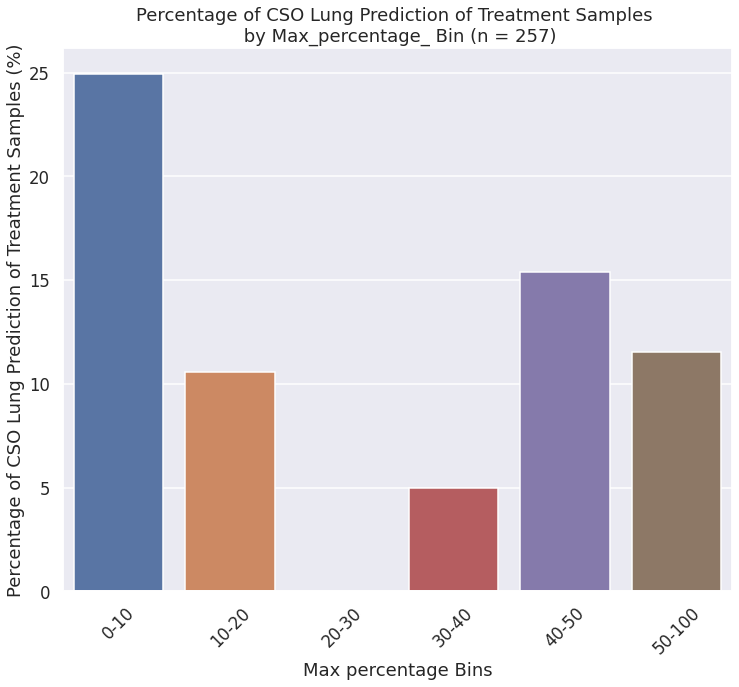

In [14]:
# Define bins for Max_percentage for baseline and treatment samples
top_prd_df_baseline = top_prd_df[top_prd_df["treatment"] == "Baseline"]
top_prd_df_treatment = top_prd_df[top_prd_df["treatment"] == "Treatment"]

def plot_Max_percentage_distribution_percentage(df, df_total, title_suffix):
    # Define bins for Max_percentage
    bins = [0, 10, 20, 30, 40, 50, 100]  # Adjust these values based on your data range and granularity needed
    labels = ['0-10', '10-20', '20-30', '30-40', '40-50', '50-100']

    # Add a binning column
    df['Max_percentage_bin'] = pd.cut(df['Max_percentage'], bins=bins, labels=labels, right=False)
    df_total['Max_percentage_bin'] = pd.cut(df_total['Max_percentage'], bins=bins, labels=labels, right=False)

    # Calculate total samples in each bin
    total_samples_per_bin = df_total['Max_percentage_bin'].value_counts().sort_index()

    # Calculate hepatocellular samples in each bin
    hepato_samples_per_bin = df['Max_percentage_bin'].value_counts().sort_index()

    # Calculate percentages
    percentage_hepato = (hepato_samples_per_bin / total_samples_per_bin) * 100

    # Reset index to use in seaborn barplot
    percentage_hepato = percentage_hepato.reset_index()
    percentage_hepato.columns = ['Max_percentage_bin', 'Percentage']

    # Plotting
    plt.figure(figsize=(12, 10))
    # percentage_hepato.plot(kind='bar', color='blue')
    sns.barplot(x='Max_percentage_bin', y='Percentage', data=percentage_hepato)
    plt.title(f'Percentage of {title_suffix} Samples \n by Max_percentage_ Bin (n = {df.shape[0]})')
    plt.xlabel('Max percentage Bins')
    plt.ylabel(f'Percentage of {title_suffix} Samples (%)')
    plt.xticks(rotation=45)
    plt.show()

# For all sample prevelance 
plot_Max_percentage_distribution_percentage(df_liver_cso, top_prd_df, 'CSO Hepatocellular Prediction of all')
plot_Max_percentage_distribution_percentage(df_digestive_cso, top_prd_df, 'CSO Digestive Prediction of all')
plot_Max_percentage_distribution_percentage(df_lung_cso, top_prd_df, 'CSO Lung Prediction of all')

# For baseline sample prevelance 
plot_Max_percentage_distribution_percentage(df_liver_cso_baseline, top_prd_df_baseline, 'CSO Hepatocellular Prediction of Baseline')
plot_Max_percentage_distribution_percentage(df_digestive_cso_baseline, top_prd_df_baseline, 'CSO Digestive Prediction of Baseline')
plot_Max_percentage_distribution_percentage(df_lung_cso_baseline, top_prd_df_baseline, 'CSO Lung Prediction of Baseline')

# For all treatment prevelance 
plot_Max_percentage_distribution_percentage(df_liver_cso_treatment, top_prd_df_treatment, 'CSO Hepatocellular Prediction of Treatment')
plot_Max_percentage_distribution_percentage(df_digestive_cso_treatment, top_prd_df_treatment, 'CSO Digestive Prediction of Treatment')
plot_Max_percentage_distribution_percentage(df_lung_cso_treatment, top_prd_df_treatment, 'CSO Lung Prediction of Treatment')


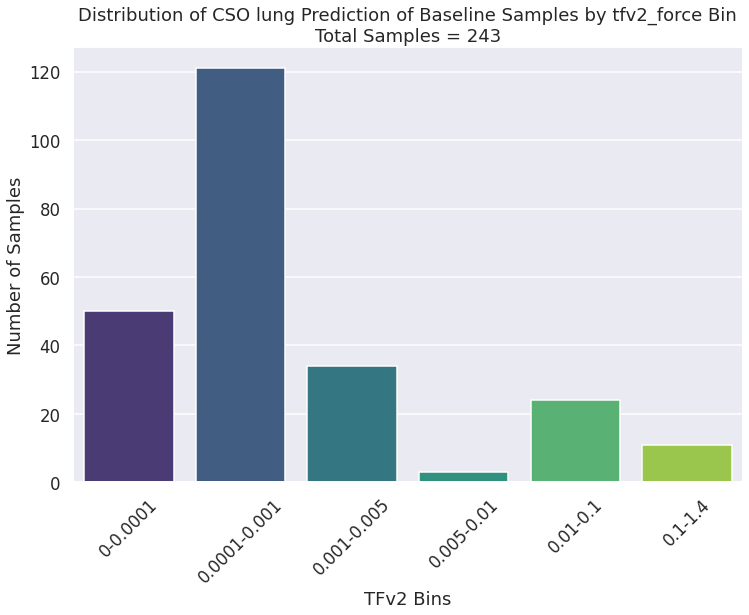

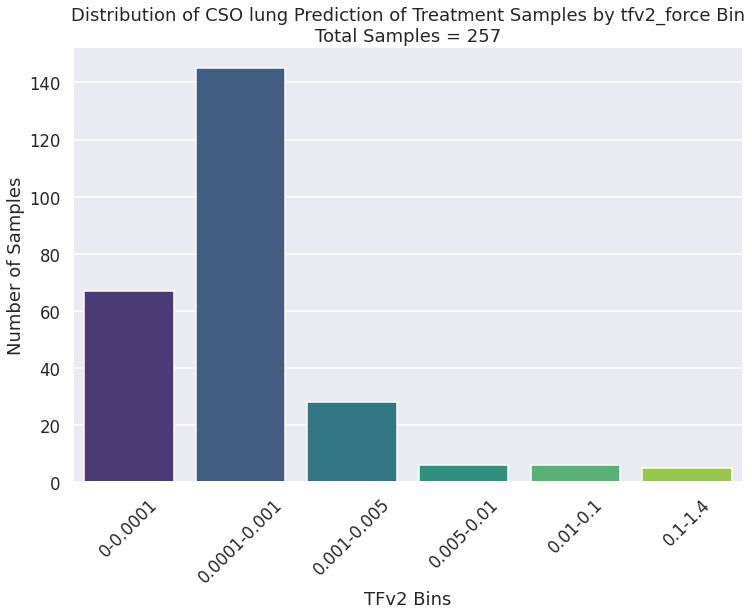

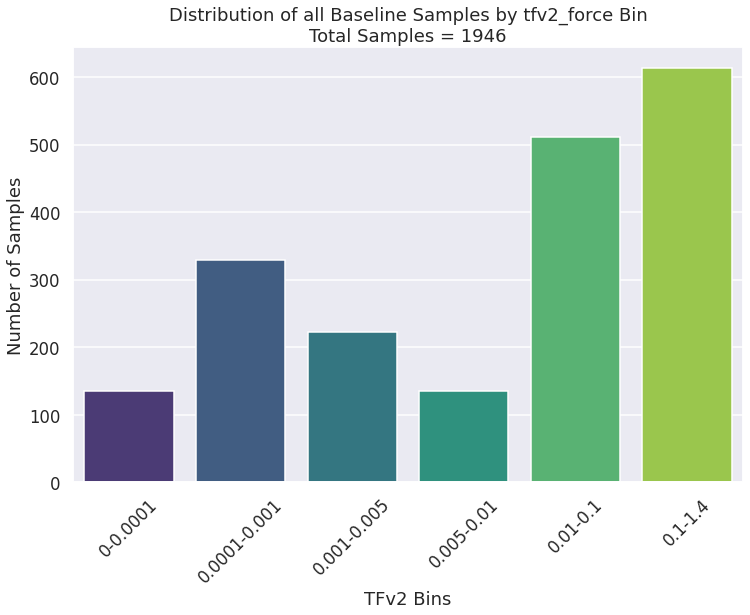

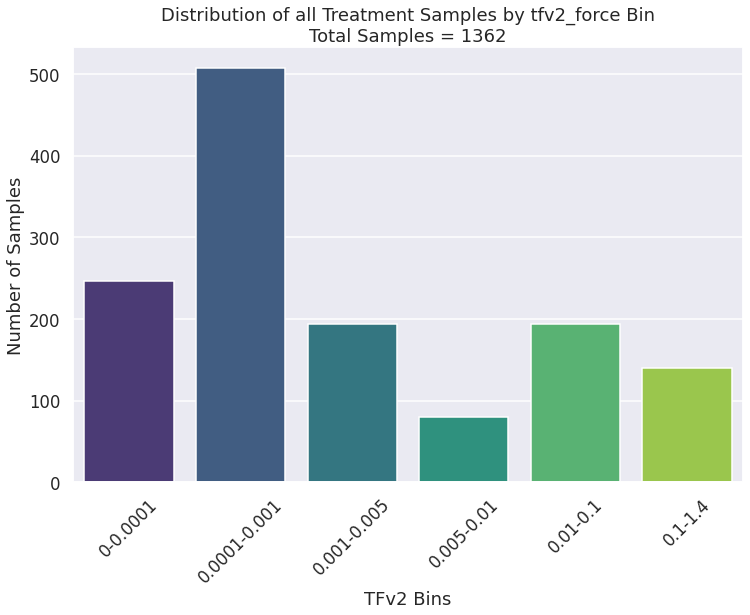

In [239]:
def plot_total_distribution(df_total, title_suffix):
    # Define bins for tfv2_force
    bins = [0, 0.0001, 0.001, 0.005, 0.01, 0.1, 1.4] # Check the max value top_prd_df.tfv2_force.max()! The binning is based on Princy's CSO caller performance talk 
    labels = ['0-0.0001', '0.0001-0.001', '0.001-0.005', '0.005-0.01', '0.01-0.1', '0.1-1.4']

    # Add a binning column
    df_total['tfv2_bin'] = pd.cut(df_total['tfv2_force'], bins=bins, labels=labels, right=False)

    # Calculate total samples in each bin
    total_samples_per_bin = df_total['tfv2_bin'].value_counts().sort_index()

    # Reset index to use in seaborn barplot
    total_samples_per_bin = total_samples_per_bin.reset_index()
    total_samples_per_bin.columns = ['tfv2_bin', 'Count']

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(x='tfv2_bin', y='Count', data=total_samples_per_bin, palette='viridis')
    plt.title(f'Distribution of {title_suffix} Samples by tfv2_force Bin\nTotal Samples = {df_total.shape[0]}')
    plt.xlabel('TFv2 Bins')
    plt.ylabel('Number of Samples')
    plt.xticks(rotation=45)
    plt.show()

# Call the function with the appropriate DataFrame and title suffix
plot_total_distribution(df_lung_cso_baseline, 'CSO lung Prediction of Baseline')
plot_total_distribution(df_lung_cso_treatment, 'CSO lung Prediction of Treatment')
plot_total_distribution(top_prd_df_baseline, 'all Baseline')
plot_total_distribution(top_prd_df_treatment, 'all Treatment')


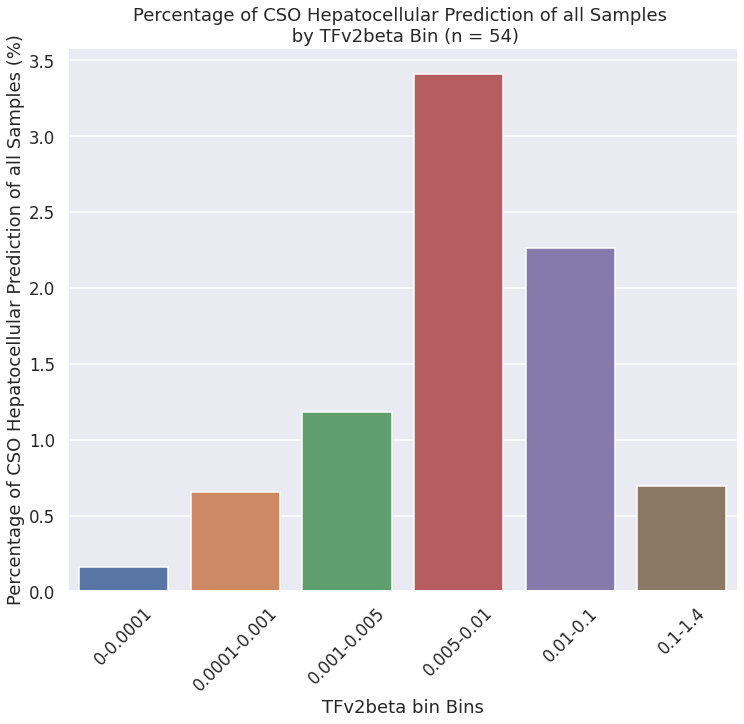

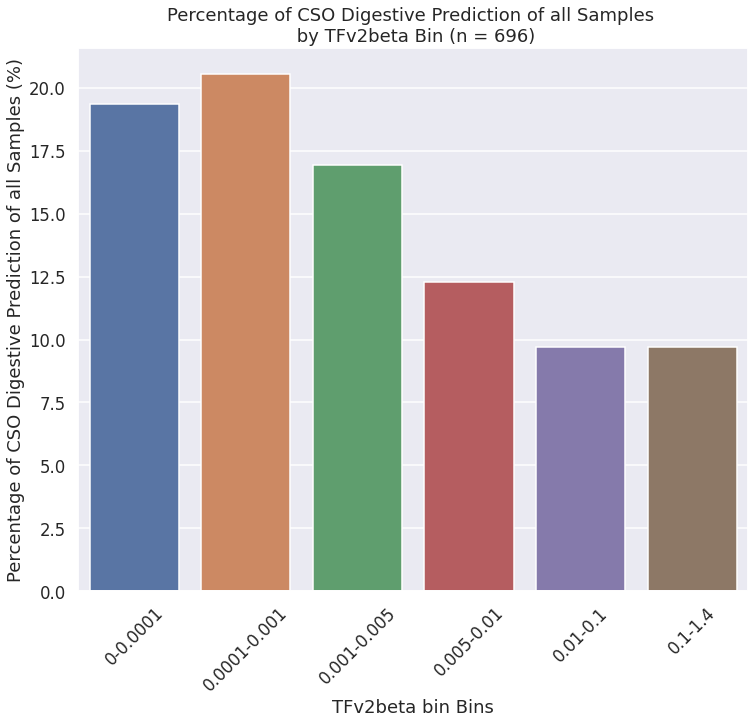

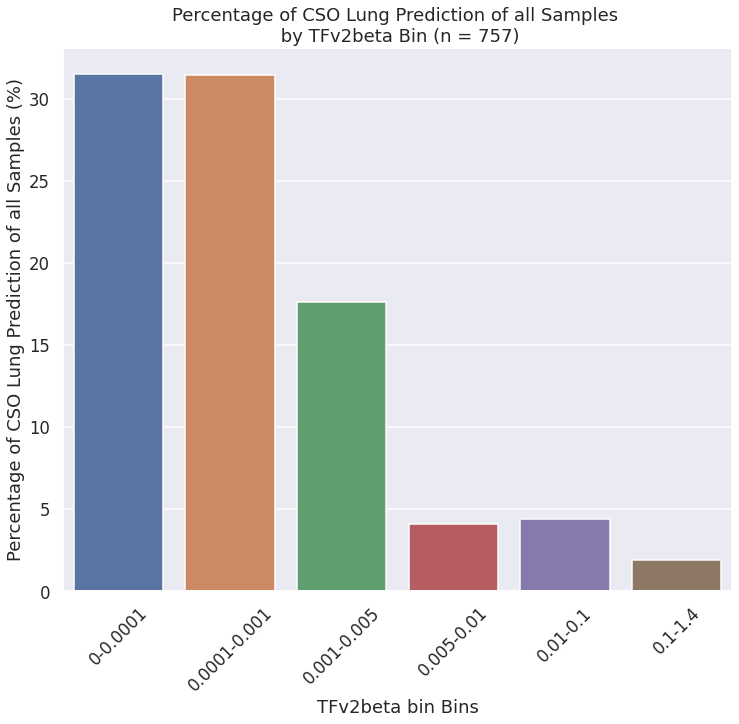

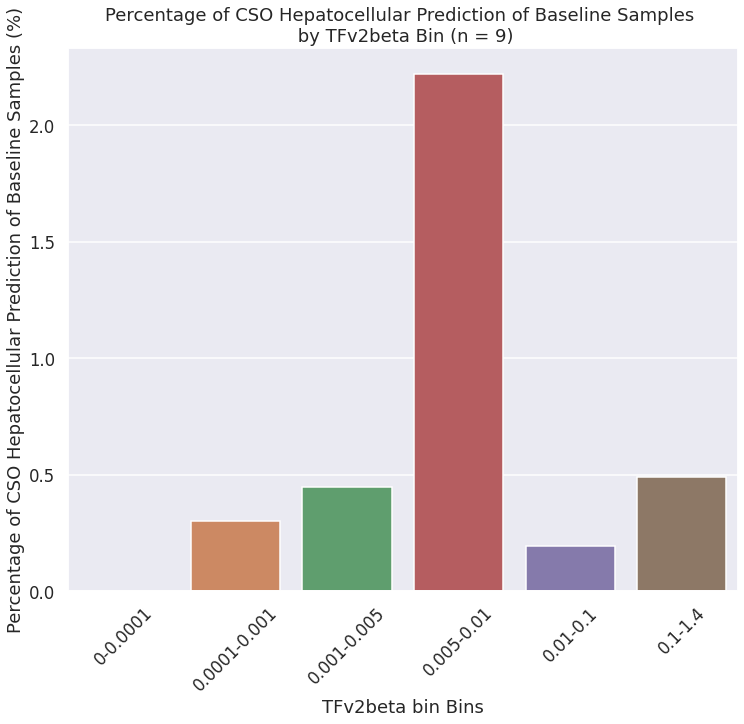

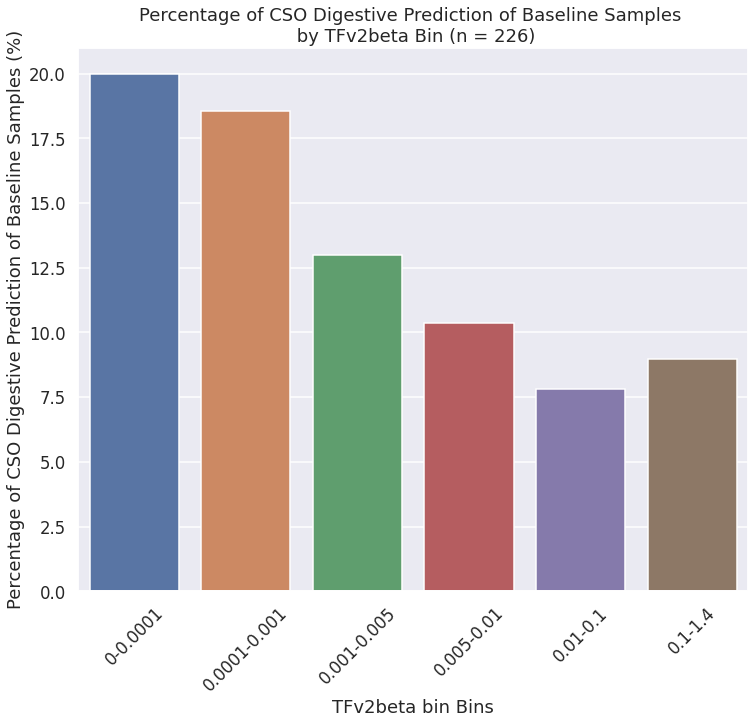

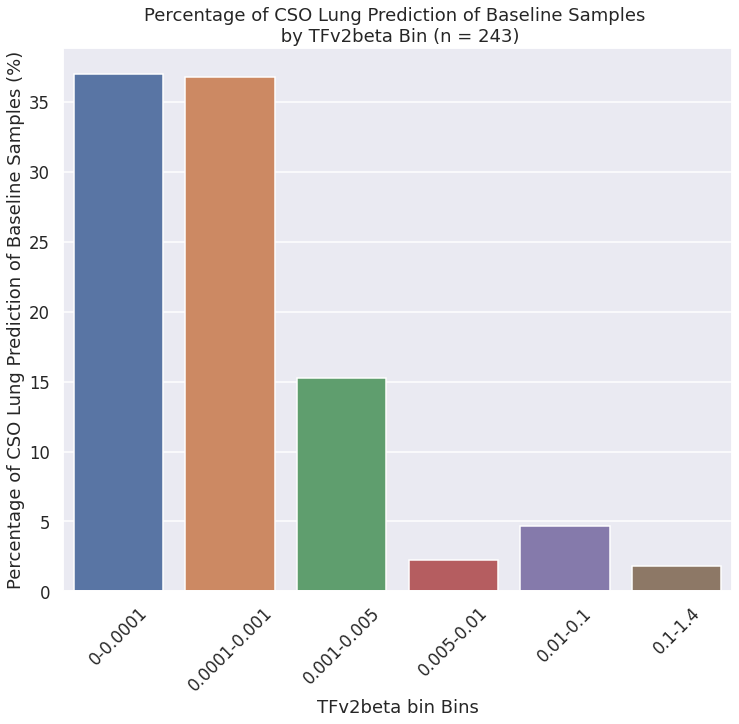

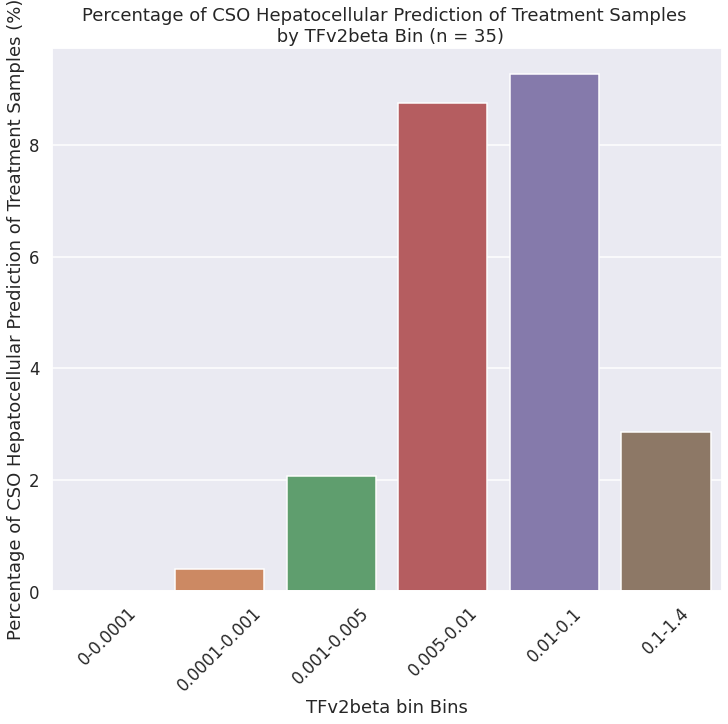

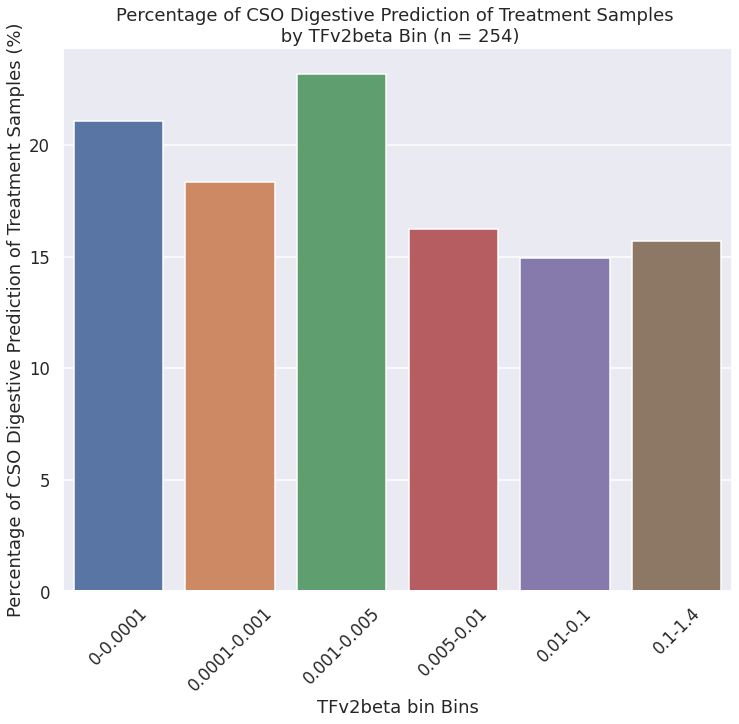

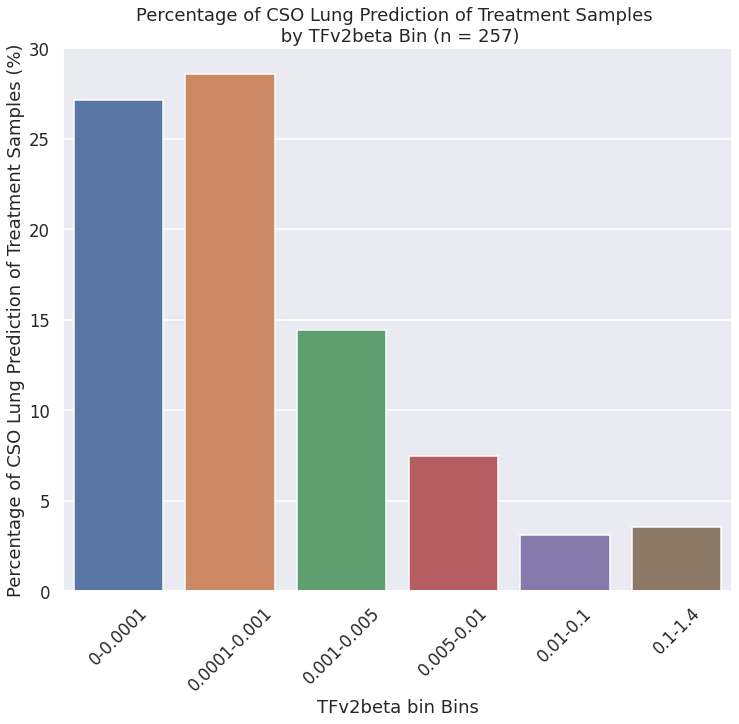

In [240]:
# Define bins for tfv2_force for baseline and treatment samples
top_prd_df_baseline = top_prd_df[top_prd_df["treatment"] == "Baseline"]
top_prd_df_treatment = top_prd_df[top_prd_df["treatment"] == "Treatment"]

# To run this code, need to run the merging step (with Kyle's tfv2 file) and run all the above steps including df_liver_cso/df_digestive_cso/df_lung_cso and corresponding baseline/treatment samples as well
def plot_tfv2_distribution_percentage(df, df_total, title_suffix):
    # Define bins for tfv2_force
    bins = [0, 0.0001, 0.001, 0.005, 0.01, 0.1, 1.4] # Check the max value top_prd_df.tfv2_force.max()! The binning is based on Princy's CSO caller performance talk 
    labels = ['0-0.0001', '0.0001-0.001', '0.001-0.005', '0.005-0.01', '0.01-0.1', '0.1-1.4']

    # Add a binning column
    df['tfv2_bin'] = pd.cut(df['tfv2_force'], bins=bins, labels=labels, right=False)
    df_total['tfv2_bin'] = pd.cut(df_total['tfv2_force'], bins=bins, labels=labels, right=False)

    # Calculate total samples in each bin
    total_samples_per_bin = df_total['tfv2_bin'].value_counts().sort_index()

    # Calculate hepatocellular samples in each bin
    hepato_samples_per_bin = df['tfv2_bin'].value_counts().sort_index()

    # Calculate percentages
    percentage_hepato = (hepato_samples_per_bin / total_samples_per_bin) * 100

    # Reset index to use in seaborn barplot
    percentage_hepato = percentage_hepato.reset_index()
    percentage_hepato.columns = ['tfv2_bin', 'Percentage']

    # Plotting
    plt.figure(figsize=(12, 10))
    # percentage_hepato.plot(kind='bar', color='blue')
    sns.barplot(x='tfv2_bin', y='Percentage', data=percentage_hepato)
    plt.title(f'Percentage of {title_suffix} Samples \n by TFv2beta Bin (n = {df.shape[0]})')
    plt.xlabel('TFv2beta bin Bins')
    plt.ylabel(f'Percentage of {title_suffix} Samples (%)')
    plt.xticks(rotation=45)
    plt.show()

# For all sample prevelance 
plot_tfv2_distribution_percentage(df_liver_cso, top_prd_df, 'CSO Hepatocellular Prediction of all')
plot_tfv2_distribution_percentage(df_digestive_cso, top_prd_df, 'CSO Digestive Prediction of all')
plot_tfv2_distribution_percentage(df_lung_cso, top_prd_df, 'CSO Lung Prediction of all')

# For baseline sample prevelance 
plot_tfv2_distribution_percentage(df_liver_cso_baseline, top_prd_df_baseline, 'CSO Hepatocellular Prediction of Baseline')
plot_tfv2_distribution_percentage(df_digestive_cso_baseline, top_prd_df_baseline, 'CSO Digestive Prediction of Baseline')
plot_tfv2_distribution_percentage(df_lung_cso_baseline, top_prd_df_baseline, 'CSO Lung Prediction of Baseline')

# For all treatment prevelance 
plot_tfv2_distribution_percentage(df_liver_cso_treatment, top_prd_df_treatment, 'CSO Hepatocellular Prediction of Treatment')
plot_tfv2_distribution_percentage(df_digestive_cso_treatment, top_prd_df_treatment, 'CSO Digestive Prediction of Treatment')
plot_tfv2_distribution_percentage(df_lung_cso_treatment, top_prd_df_treatment, 'CSO Lung Prediction of Treatment')


## Evaluate suspicious samples by cohorts

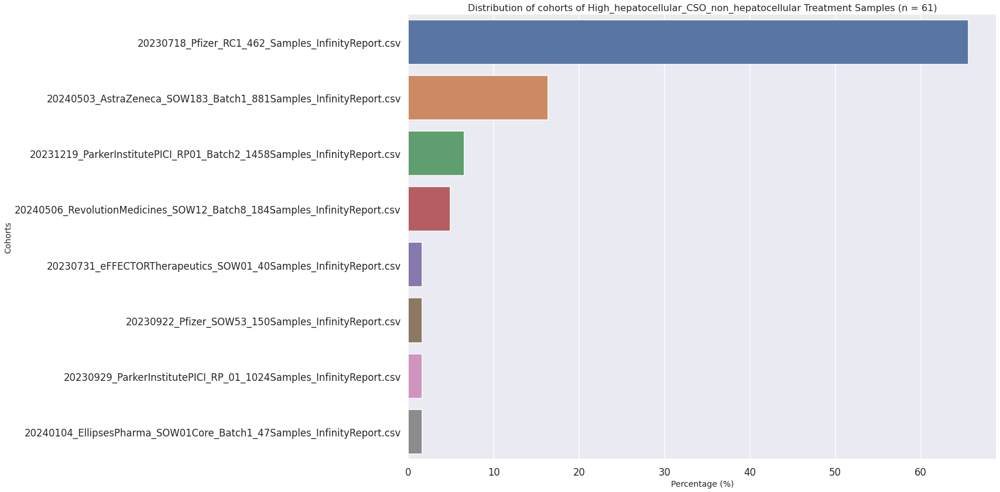

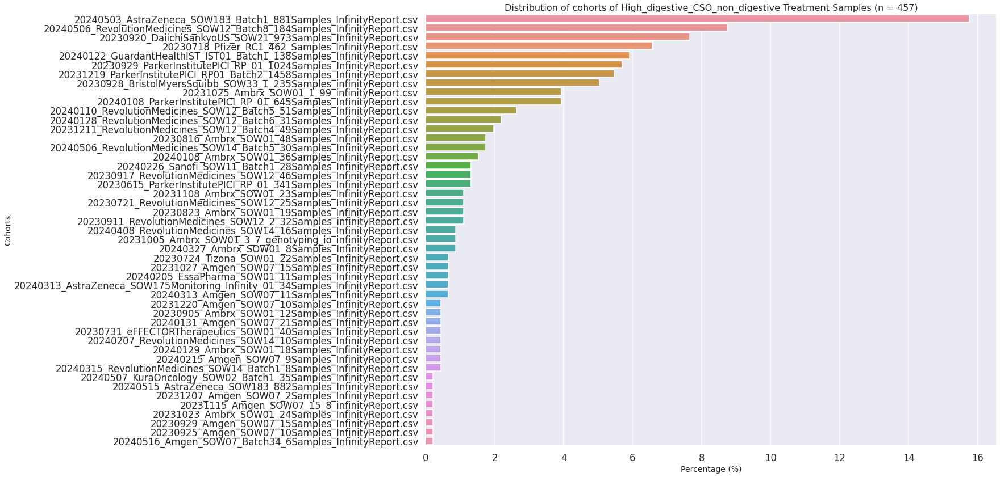

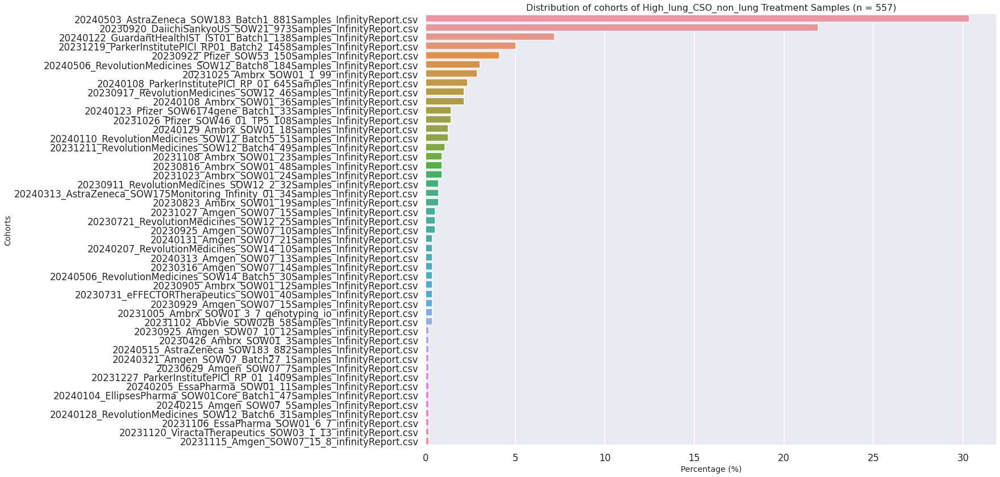

In [202]:
# Plot cancer type distribution of those high CSO suspicious by percentage
sns.set(style="darkgrid", context="talk")

def plot_cohort_distribution_percentage(df, title_suffix):
    # Create a figure with a predefined size
    plt.figure(figsize=(18, 14))
    
    # Calculate percentage of each cancer type
    value_counts = df['csv_file_name'].value_counts(normalize=True) * 100
    order = value_counts.index
    
    # Generate a countplot with percentages
    sns.barplot(x=value_counts, y=order)
    
    # Set title and labels with dynamic titles based on the input parameter
    plt.title(f'Distribution of cohorts of {title_suffix} (n = {df.shape[0]})', fontsize=16)
    plt.xlabel('Percentage (%)', fontsize=14)
    plt.ylabel('Cohorts', fontsize=14)
    
    # Show the plot
    plt.show()

# Call the function with different datasets and titles
plot_cohort_distribution_percentage(df_liver_cso_treatment, 'High_hepatocellular_CSO_non_hepatocellular Treatment Samples')
plot_cohort_distribution_percentage(df_digestive_cso_treatment, 'High_digestive_CSO_non_digestive Treatment Samples')
plot_cohort_distribution_percentage(df_lung_cso_treatment, 'High_lung_CSO_non_lung Treatment Samples')


### Deep dive on Parker PICI cohort

In [139]:
# Get the suspicious samples in Parker cohort

# CSO-Lung treatment samples in Parker
df_lung_cso_treatment_ParkerInstitutePICI = df_lung_cso_treatment[df_lung_cso_treatment["Account"] == "ParkerInstitutePICI"]
print('# of CSO-Lung treatment samples in Parker is ' + str(df_lung_cso_treatment_ParkerInstitutePICI.shape[0]))

# CSO-digestive treatment samples in Parker
df_digestive_cso_treatment_ParkerInstitutePICI = df_digestive_cso_treatment[df_digestive_cso_treatment["Account"] == "ParkerInstitutePICI"]
print('# of CSO-digestive treatment samples in Parker is ' + str(df_digestive_cso_treatment_ParkerInstitutePICI.shape[0]))

# Load Parker PICI clinical data provided by Jing
df_clinical_data_lung_patient_Parker = pd.read_table(f"{work_dir}/PICI0009-Radiohead-nsclc-Release-2.0-subjects.tsv")
df_clinical_data_pan_cancer_patient_Parker = pd.read_table(f"{work_dir}/PICI0009-Radiohead-pan-cancer-Release-2.0-subjects.tsv")

df_clinical_data_lung_patient_Parker.head()
df_clinical_data_pan_cancer_patient_Parker.head()

# of CSO-Lung treatment samples in Parker is 42
# of CSO-digestive treatment samples in Parker is 75


,subject.id,subject.dead,subject.age,subject.freetext.disease,subject.tobacco,meddra.disease.preferred.name,subject.sex,subject.ethnicity,subject.cause.of.death,treatment.regimen.name,therapy.previous,subject.race,clinical.observation.pfs.event,clinical.observation.pfs,clinical.observation.os,clinical.observation.os.event,clinical.observation.os.reason,clinical.observation.pfs.reason,clinical.observation.metastatic,clinical.observation.disease.stage,clinical.observation.bmi,clinical.observation.metastasis.gdc.anatomic.sites,disease.stage.at.diagnosis,pneumo_vax_hist,zoster_vax_hist,baseline_influenza_vax,antibiotics_yn,infection_hist_yn,comorbidities
0,3-1001,True,84.0,Urothelial carcinoma (UC);HIGH-GRADE UROTHELIAL CARCINOMA WITH GLADULAR AND CLEAR CELL FEATURES,former,Bladder cancer,male,not-hispanic,NaN,nivolumab:1,"chemotherapy,surgery",white,True,1.900,1.900,True,:clinical-observation.event-reason/dead,:clinical-observation.event-reason/dead,False,:clinical-observation.disease-stage/iv,NaN,NaN,:clinical-observation.disease-stage/iv,Yes,No,Yes,Yes,Yes,"cardiac/heart disease,respiratory disease,gastrointestinal problems,kidney/genitourinary disease,vision condition/problem,hearing condition/problem,musculoskeletal condition/problem,allergies,neurological problem,previous cancer"
1,3-1004,True,77.0,Urothelial carcinoma (UC),former,Bladder cancer,male,not-hispanic,NaN,nivolumab:1,"chemotherapy,targeted-therapy,surgery,treated",white,True,21.200,21.200,True,:clinical-observation.event-reason/dead,:clinical-observation.event-reason/dead,True,:clinical-observation.disease-stage/iv,NaN,Lymph Node,:clinical-observation.disease-stage/i,Yes,Yes,Yes,Yes,Yes,"cardiac/heart disease,respiratory disease,gastrointestinal problems,kidney/genitourinary disease,blood condition,infectious disease,vision condition/problem,musculoskeletal condition/problem,allergies,neurological problem"
2,3-1005,False,53.0,Small cell lung cancer;UNDIFFERENTIATED EXTENSIVE STAGE,former,Small cell lung cancer,male,not-hispanic,NaN,chemo+nivolumab:1,"chemotherapy,surgery,radiation",african-american,True,6.300,6.300,False,:clinical-observation.event-reason/progressed,:clinical-observation.event-reason/progressed,True,:clinical-observation.disease-stage/iv,NaN,"Adrenal, Brain, Lymph Node",:clinical-observation.disease-stage/iv,No,No,No,Yes,Yes,"respiratory disease,gastrointestinal problems,blood condition,endocrine condition/problem,allergies,neurological problem"
3,3-1006,False,48.0,Melanoma,never,Malignant melanoma,male,not-hispanic,NaN,nivolumab:1,surgery,white,False,26.867,26.867,False,:clinical-observation.event-reason/censored-study-period-ended,:clinical-observation.event-reason/censored-study-period-ended,True,:clinical-observation.disease-stage/iii,NaN,Lymph Node,:clinical-observation.disease-stage/iii,No,No,No,No,NaN,allergies
4,3-1007,True,77.0,"Renal cell carcinoma (RCC);CLEAR CELL CARCINOMA OF KIDNEY, FUHRMAN",never,Renal cell carcinoma,male,not-hispanic,NaN,nivolumab:1;ipilimumab+nivolumab:2;other:3,"targeted-therapy,surgery",white,True,22.833,22.833,True,:clinical-observation.event-reason/dead,:clinical-observation.event-reason/dead,True,:clinical-observation.disease-stage/iv,NaN,Peritoneum,:clinical-observation.disease-stage/i,Yes,Yes,Yes,No,NaN,"cardiac/heart disease,respiratory disease,gastrointestinal problems,kidney/genitourinary disease,blood condition,musculoskeletal condition/problem,abnormal blood pressure,sleep apnea,previous cancer"


In [122]:
# Merge the clinical data for the CSO-lung samples

# Create a new column by slicing the last 6 characters of 'Patient_ID'
df_lung_cso_treatment_ParkerInstitutePICI['Patient_ID_Parker'] = df_lung_cso_treatment_ParkerInstitutePICI['Patient_ID'].str[-6:]

# Rename the column in the dataframe
df_clinical_data_pan_cancer_patient_Parker_new = df_clinical_data_pan_cancer_patient_Parker.rename(columns={"subject.id": "Patient_ID_Parker"})

# Merge dataframes on 'Patient_ID_Parker' (as all the clinical data for CSO-lung only from df_clinical_data_pan_cancer_patient_Parker_new)
df_lung_cso_treatment_ParkerInstitutePICI_all = df_lung_cso_treatment_ParkerInstitutePICI.merge(
    df_clinical_data_pan_cancer_patient_Parker_new[['Patient_ID_Parker', 'treatment.regimen.name', 'clinical.observation.metastasis.gdc.anatomic.sites', 'comorbidities']],
    on="Patient_ID_Parker", 
    how="left"
)

print('# of CSO-lung treatment samples in Parker with clinical data is ' + str(df_lung_cso_treatment_ParkerInstitutePICI_all.shape[0]))
df_lung_cso_treatment_ParkerInstitutePICI_all.head()

# of CSO-lung treatment samples in Parker with clinical data is 42


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,Patient_ID_Parker,treatment.regimen.name,clinical.observation.metastasis.gdc.anatomic.sites,comorbidities
0,B00538679_231118_A01907_0174_BHKJHYDSX7,-21.947590,CSO_lung,-17.179823,PICI0009,A0723607,B00538679,PICI0009.PICI0009-3-1555,ON-TREATMENT,SUCCESS,NaN,1.440,18.46,1.0,Breast cancer,20231219_ParkerInstitutePICI_RP01_Batch2_1458Samples_InfinityReport.csv,amak,2023-12-19,ParkerInstitutePICI,RP01,Other,NaN,NaN,AACACCGCAG,Unknown,Research,2023-11-24 01:11:21-08:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0723607,cgp,231118_A01907_0174_BHKJHYDSX7,Breast cancer,/ghsfa/ivd/flowcentral/231118_A01907_0174_BHKJHYDSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/231118_A01907_0174_BHKJHYDSX7/B00538679/B00538679.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/231118_A01907_0174_BHKJHYDSX7/B00538679/B00538679.ghcnv_qc.combined.hdr.tsv,B00538679,Female,Female,lung,1,3-1555,chemo+pembrolizumab:1,NaN,"cardiac/heart disease,respiratory disease,gastrointestinal problems,kidney/genitourinary disease,blood condition,infectious disease,vision condition/problem,endocrine condition/problem,diabetes,musculoskeletal condition/problem,allergies"
1,B00539148_231121_A01613_0271_BHKJ32DSX7,-21.562583,CSO_lung,-16.946164,PICI0009,A0724626,B00539148,PICI0009.PICI0009-3-1697,ON-TREATMENT,SUCCESS,NaN,0.000,5.46,1.0,Bladder cancer,20231219_ParkerInstitutePICI_RP01_Batch2_1458Samples_InfinityReport.csv,amak,2023-12-19,ParkerInstitutePICI,RP01,Other,NaN,NaN,TTTAACTCAC,Unknown,Research,2023-11-23 21:05:01-08:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0724626,cgp,231121_A01613_0271_BHKJ32DSX7,Bladder cancer,/ghsfa/ivd/flowcentral/231121_A01613_0271_BHKJ32DSX7.d4ce05a8-511a-4cba-8c22-fec730f58fe8.20231123130405,NaN,NaN,NaN,bladder,Treatment,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/231121_A01613_0271_BHKJ32DSX7.d4ce05a8-511a-4cba-8c22-fec730f58fe8.20231123130405/B00539148/B00539148.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/231121_A01613_0271_BHKJ32DSX7.d4ce05a8-511a-4cba-8c22-fec730f58fe8.20231123130405/B00539148/B00539148.ghcnv_qc.combined.hdr.tsv,B00539148,Male,Male,lung,1,3-1697,pembrolizumab:1,NaN,"hearing condition/problem,musculoskeletal condition/problem"
2,B00541363_231122_A01552_0342_BHKJGGDSX7,-22.556643,CSO_lung,-17.667100,PICI0009,A0725593,B00541363,PICI0009.PICI0009-3-1900,ON-TREATMENT,SUCCESS,NaN,9.885,2.21,1.0,Bladder cancer,20231219_ParkerInstitutePICI_RP01_Batch2_1458Samples_InfinityReport.csv,amak,2023-12-19,ParkerInstitutePICI,RP01,Other,NaN,NaN,CGCTCCAAAG,Unknown,Research,2023-11-24 21:43:08-08:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0725593,cgp,231122_A01552_0342_BHKJGGDSX7,Bladder cancer,/ghsfa/ivd/flowcentral/231122_A01552_0342_BHKJGGDSX7.750569bd-0615-4b90-9b51-35093ac8d5b2.20231124134200,NaN,NaN,NaN,bladder,Treatment,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect

In [157]:
# Chech how many CSO-lung samples has lung meta condition in Parker
df_lung_cso_treatment_ParkerInstitutePICI_all_lung_meta = df_lung_cso_treatment_ParkerInstitutePICI_all[df_lung_cso_treatment_ParkerInstitutePICI_all["clinical.observation.metastasis.gdc.anatomic.sites"].str.contains("lung", case=False, na=False)]

df_lung_cso_treatment_ParkerInstitutePICI_all_lung_meta.shape

(4, 64)

In [123]:
# Merge the clinical data for the CSO-digestive samples

# Create a new column by slicing the last 6 characters of 'Patient_ID'
df_digestive_cso_treatment_ParkerInstitutePICI['Patient_ID_Parker'] = df_digestive_cso_treatment_ParkerInstitutePICI['Patient_ID'].str[-6:]

# Perform the first merge
df_digestive_cso_treatment_ParkerInstitutePICI_all = df_digestive_cso_treatment_ParkerInstitutePICI.merge(
    df_clinical_data_pan_cancer_patient_Parker_new[['Patient_ID_Parker', 'treatment.regimen.name', 'clinical.observation.metastasis.gdc.anatomic.sites', 'comorbidities']],
    on="Patient_ID_Parker", 
    how="left"
)

# Perform the second merge and directly update the columns using combine_first
temp_merge = df_digestive_cso_treatment_ParkerInstitutePICI.merge(
    df_clinical_data_lung_patient_Parker_new[['Patient_ID_Parker', 'treatment.regimen.name', 'clinical.observation.metastasis.gdc.anatomic.sites', 'comorbidities']],
    on="Patient_ID_Parker", 
    how="left"
)

# Using combine_first to integrate data from the second merge where the first is missing
df_digestive_cso_treatment_ParkerInstitutePICI_all['treatment.regimen.name'] = df_digestive_cso_treatment_ParkerInstitutePICI_all['treatment.regimen.name'].combine_first(temp_merge['treatment.regimen.name'])
df_digestive_cso_treatment_ParkerInstitutePICI_all['clinical.observation.metastasis.gdc.anatomic.sites'] = df_digestive_cso_treatment_ParkerInstitutePICI_all['clinical.observation.metastasis.gdc.anatomic.sites'].combine_first(temp_merge['clinical.observation.metastasis.gdc.anatomic.sites'])
df_digestive_cso_treatment_ParkerInstitutePICI_all['comorbidities'] = df_digestive_cso_treatment_ParkerInstitutePICI_all['comorbidities'].combine_first(temp_merge['comorbidities'])

# Display the shape of the merged dataframe
print('# of CSO-digestive treatment samples in Parker with clinical data is ' + str(df_digestive_cso_treatment_ParkerInstitutePICI_all.shape[0]))
df_digestive_cso_treatment_ParkerInstitutePICI_all.head()

# of CSO-digestive treatment samples in Parker with clinical data is 75


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,Patient_ID_Parker,treatment.regimen.name,clinical.observation.metastasis.gdc.anatomic.sites,comorbidities
0,B00319551_230915_A01810_0209_BHCYV2DSX7,-20.394915,CSO_crc,-17.196340,PICI0009,A0676068,B00319551,PICI0009.PICI0009-3-1604,ON-TREATMENT,SUCCESS,Low Diversity Warning; Methylation Suppression Warning,3.54,3.0732,1.0,NSCLC,20230929_ParkerInstitutePICI_RP_01_1024Samples_InfinityReport.csv,jinwang,2023-09-29,ParkerInstitutePICI,RP,Other,NaN,NaN,AGATCGATTG,Unknown,Research,2023-09-17 19:15:21-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0676068,cgp,230915_A01810_0209_BHCYV2DSX7,NSCLC,/ghsfa/ivd/flowcentral/230915_A01810_0209_BHCYV2DSX7,NaN,NaN,NaN,lung,Treatment,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,True,/ghsfa/ivd/flowcentral/230915_A01810_0209_BHCYV2DSX7/B00319551/B00319551.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230915_A01810_0209_BHCYV2DSX7/B00319551/B00319551.ghcnv_qc.combined.hdr.tsv,B00319551,Male,Male,digestive,1,3-1604,chemo+pembrolizumab:1,Lymph Node,"respiratory disease,abnormal blood pressure,previous cancer"
1,B00319617_230915_A01835_0127_AHCYLTDSX7,-22.271317,CSO_crc,-19.234268,PICI0009,A0676081,B00319617,PICI0009.PICI0009-3-1532,ON-TREATMENT,SUCCESS,NaN,0.40,8.8400,1.0,NSCLC,20230929_ParkerInstitutePICI_RP_01_1024Samples_InfinityReport.csv,jinwang,2023-09-29,ParkerInstitutePICI,RP,Other,NaN,NaN,ATTCACGGTC,Unknown,Research,2023-09-17 19:11:22-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0676081,cgp,230915_A01835_0127_AHCYLTDSX7,NSCLC,/ghsfa/ivd/flowcentral/230915_A01835_0127_AHCYLTDSX7.1766aeaa-576c-45fe-8c14-8d8c8fb817fc.20230917121017,NaN,NaN,NaN,lung,Treatment,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/230915_A01835_0127_AHCYLTDSX7.1766aeaa-576c-45fe-8c14-8d8c8fb817fc.20230917121017/B00319617/B00319617.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230915_A01835_0127_AHCYLTDSX7.1766aeaa-576c-45fe-8c14-8d8c8fb817fc.20230917121017/B00319617/B00319617.ghcnv_qc.combined.hdr.tsv,B00319617,Female,Female,digestive,1,3-1532,chemo+pembrolizumab:1;pembrolizumab:2;chemo:3,"Bone, Brain, Lung, Lymph Node","respiratory disease,gastrointestinal problems,blood condition,dematological conditions,vision condition/problem,musculoskeletal condition/problem,abnormal blood pressure,allergies"
2,B00319690_230329_A01552_0213_AHVJ3HDSX5,-20.526824,CSO_esophageal,-17.835698,PICI0009,A0676009,B00319690,PICI0009.PICI0009-3-1459,ON-TREATMENT,SUCCESS,NaN,8.37,5.2130,1.0,NSCLC,20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv,jinwang,2023-06-15,ParkerInstitutePICI,RP,Other,NaN,NaN,AGGAAATCTG,Unknown,Research,2023-03-31 21:53:35-07:00,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0676009,NaN,230329_A01552_0213_AHVJ3HDSX5,NSCLC,/ghsfa/projects/omni_v2/flowcells/230329_A01552_0213_AHVJ3HDSX5_PS3R216_AP1.Sirius-1.1.0-RLS_20230821-104026,NaN,NaN,NaN,lung,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regu

In [124]:
# For all Parker samples to merge the clinical data

target_Account = [ "ParkerInstitutePICI"]

top_prd_df_Parker = top_prd_df[top_prd_df['Account'].isin(target_Account)]

top_prd_df_Parker_treatment = top_prd_df_Parker[top_prd_df_Parker["treatment"] == "Treatment"]

# Create a new column by slicing the last 6 characters of 'Patient_ID'
top_prd_df_Parker_treatment['Patient_ID_Parker'] = top_prd_df_Parker_treatment['Patient_ID'].str[-6:]

# Perform the first merge
top_prd_df_Parker_treatment_all = top_prd_df_Parker_treatment.merge(
    df_clinical_data_pan_cancer_patient_Parker_new[['Patient_ID_Parker', 'treatment.regimen.name', 'clinical.observation.metastasis.gdc.anatomic.sites', 'comorbidities']],
    on="Patient_ID_Parker", 
    how="left"
)

# Perform the second merge and directly update the columns using combine_first
temp_merge = top_prd_df_Parker_treatment.merge(
    df_clinical_data_lung_patient_Parker_new[['Patient_ID_Parker', 'treatment.regimen.name', 'clinical.observation.metastasis.gdc.anatomic.sites', 'comorbidities']],
    on="Patient_ID_Parker", 
    how="left"
)

# Using combine_first to integrate data from the second merge where the first is missing
top_prd_df_Parker_treatment_all['treatment.regimen.name'] = top_prd_df_Parker_treatment_all['treatment.regimen.name'].combine_first(temp_merge['treatment.regimen.name'])
top_prd_df_Parker_treatment_all['clinical.observation.metastasis.gdc.anatomic.sites'] = top_prd_df_Parker_treatment_all['clinical.observation.metastasis.gdc.anatomic.sites'].combine_first(temp_merge['clinical.observation.metastasis.gdc.anatomic.sites'])
top_prd_df_Parker_treatment_all['comorbidities'] = top_prd_df_Parker_treatment_all['comorbidities'].combine_first(temp_merge['comorbidities'])

# Display the shape of the merged dataframe
print('# of all treatment samples in Parker with clinical data is ' + str(top_prd_df_Parker_treatment_all.shape[0]))
top_prd_df_Parker_treatment_all.head()

# of all treatment samples in Parker with clinical data is 470


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,Patient_ID_Parker,treatment.regimen.name,clinical.observation.metastasis.gdc.anatomic.sites,comorbidities
0,B00313630_230322_A00770_0652_BHN2MCDSX5,-21.378918,CSO_lung,-17.029682,PICI0009,A0675131,B00313630,PICI0009.PICI0009-3-2016,ON-TREATMENT,SUCCESS,NaN,1.61,8.4500,1.0,NSCLC,20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv,jinwang,2023-06-15,ParkerInstitutePICI,RP,Other,NaN,NaN,GAACGATTAG,Unknown,Research,2023-03-24 23:35:50-07:00,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0675131,NaN,230322_A00770_0652_BHN2MCDSX5,NSCLC,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235,NaN,NaN,NaN,lung,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235,False,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235/B00313630/B00313630.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235/B00313630/B00313630.ghcnv_qc.combined.hdr.tsv,B00313630,Male,Male,lung,1,3-2016,durvalumab:1,NaN,"cardiac/heart disease,respiratory disease,kidney/genitourinary disease,musculoskeletal condition/problem,abnormal blood pressure,neurological problem"
1,B00313667_230322_A00770_0652_BHN2MCDSX5,-10.654608,CSO_lung,-10.918009,PICI0009,A0675119,B00313667,PICI0009.PICI0009-5-1102,ON-TREATMENT,SUCCESS,NaN,2.86,3.9260,1.0,NSCLC,20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv,jinwang,2023-06-15,ParkerInstitutePICI,RP,Other,NaN,NaN,GTACTCTGGG,Unknown,Research,2023-03-24 23:35:50-07:00,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0675119,NaN,230322_A00770_0652_BHN2MCDSX5,NSCLC,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235,NaN,NaN,NaN,lung,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235,True,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235/B00313667/B00313667.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235/B00313667/B00313667.ghcnv_qc.combined.hdr.tsv,B00313667,Female,Female,lung,1,5-1102,pembrolizumab:1,NaN,"cardiac/heart disease,diabetes,abnormal blood pressure,previous cancer"
2,B00313681_230322_A00770_0652_BHN2MCDSX5,-22.554683,CSO_lung,-14.808050,PICI0009,A0675151,B00313681,PICI0009.PICI0009-3-2024,ON-TREATMENT,SUCCESS,NaN,0.75,5.7590,1.0,NSCLC,20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv,jinwang,2023-06-15,ParkerInstitutePICI,RP,Other,NaN,NaN,CCTAGTCGTT,Unknown,Research,2023-03-24 23:35:50-07:00,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0675151,NaN,230322_A00770_0652_BHN2MCDSX5,NSCLC,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235,NaN,NaN,NaN,lung,Treatment,/ghsfa/p

#### For CSO-Lung Parker analysis 

In [159]:
# Regroup the comorbidities
import re

# Define a function to categorize comorbidities using regular expressions
def categorize_comorbidities(comorbidity):
    if pd.isna(comorbidity):
        return 'Other'  # or some other category for NaN or missing data
    
    # Regex patterns for each category
    lung_pattern = re.compile(r'\b(respiratory)\b', re.IGNORECASE)
    digestive_pattern = re.compile(r'\b(gastrointestinal|crc|esophageal|gastric)\b', re.IGNORECASE)
    liver_pattern = re.compile(r'\b(hepatocellular|liver)\b', re.IGNORECASE)

    # Check and categorize based on the presence of keywords
    if lung_pattern.search(comorbidity):
        return 'Lung Disease Related'
    else:
        return 'Other'

# Apply the function to categorize comorbid use
top_prd_df_Parker_treatment_all['comorbidity_category'] = top_prd_df_Parker_treatment_all['comorbidities'].apply(categorize_comorbidities)

# Display the DataFrame to see the new column
top_prd_df_Parker_treatment_all['comorbidity_category'].value_counts()

Other                   251
Lung Disease Related    219
Name: comorbidity_category, dtype: int64

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Lung Disease Related vs. Other: t-test independent samples, P_val:3.966e-01 t=8.485e-01


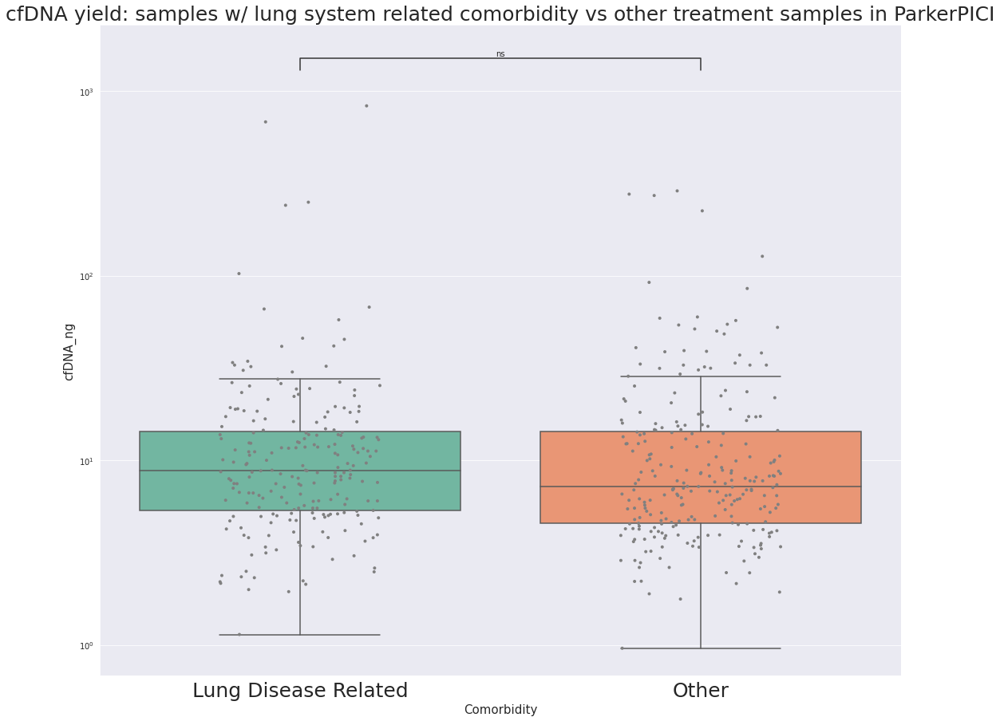

In [161]:
# Compare the cfDNA between samples with lung-related comorbidities and other treatment samples

from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_comorbidity_one_batch_with_annotation(df):
    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'comorbidity_category' categories
    hue_order = df['comorbidity_category'].unique().tolist()

    # # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="comorbidity_category", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="comorbidity_category", y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # # Offset for sample size annotation, adjust as needed
    # offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    # for plot_type, cancer_group in df.groupby('treatment.regimen.name'):
    #     n = cancer_group.shape[0]
    #     type_pos = hue_order.index(plot_type)
    #     center = ax.get_xticks()[type_pos]  # Center position of each category
    #     ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="comorbidity_category", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title('cfDNA yield: samples w/ lung system related comorbidity vs other treatment samples in ParkerPICI', fontsize=25)
    ax.set_xlabel('Comorbidity', fontsize=15)
    ax.set_ylabel('cfDNA_ng', fontsize=15)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=25)

    plt.show()


cfDNA_boxplot_by_comorbidity_one_batch_with_annotation(top_prd_df_Parker_treatment_all)

In [168]:
# Define a new column called "CSO_Lung_Sample" to indicate if this sample is High CSO lung prediction sample in Parker

# limited to certain cohorts
target_Account = [
    "ParkerInstitutePICI"
]

top_prd_df_Parker = top_prd_df[top_prd_df['Account'].isin(target_Account)]

# Identify CSO-lung samples
high_lung_samples = df_lung_cso_treatment_ParkerInstitutePICI_all['GHSampleID'].unique()


# Create a new column that will be True if the sample is in high_lung_samples
top_prd_df_Parker['CSO_Lung_Sample'] = top_prd_df_Parker['GHSampleID'].isin(high_lung_samples)

# Create a new column for plotting that combines original cancer types and the new category
top_prd_df_Parker['CSO_Lung_Sample'] = top_prd_df_Parker.apply(
    lambda row: 'High_CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
    # lambda row: 'High_CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Other Treatment samples',
    axis=1
)

# Remove missing values in cfDNA_ng before plotting
top_prd_df_Parker = top_prd_df_Parker.dropna(subset=['cfDNA_ng'])

(470, 60)
(1801, 60)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: lung vs. Provided Cancer type: bladder: t-test independent samples, P_val:2.298e-01 t=-1.203e+00
Provided Cancer type: bladder vs. Provided Cancer type: crc: t-test independent samples, P_val:8.054e-01 t=2.474e-01
Provided Cancer type: crc vs. High_CSO_lung_Samples: t-test independent samples, P_val:1.975e-03 t=3.252e+00
High_CSO_lung_Samples vs. Provided Cancer type: hepatocellular: t-test independent samples, P_val:9.397e-03 t=-2.676e+00
Provided Cancer type: hepatocellular vs. Provided Cancer type: breast: t-test independent samples, P_val:7.449e-01 t=-3.279e-01
Provided Cancer type: breast vs. Provided Cancer type: esophageal: t-test independent samples, P_val:4.674e-01 t=7.350e-01
Provided Cancer type: esophageal vs. Provided Cancer type: prostate: t-test indep

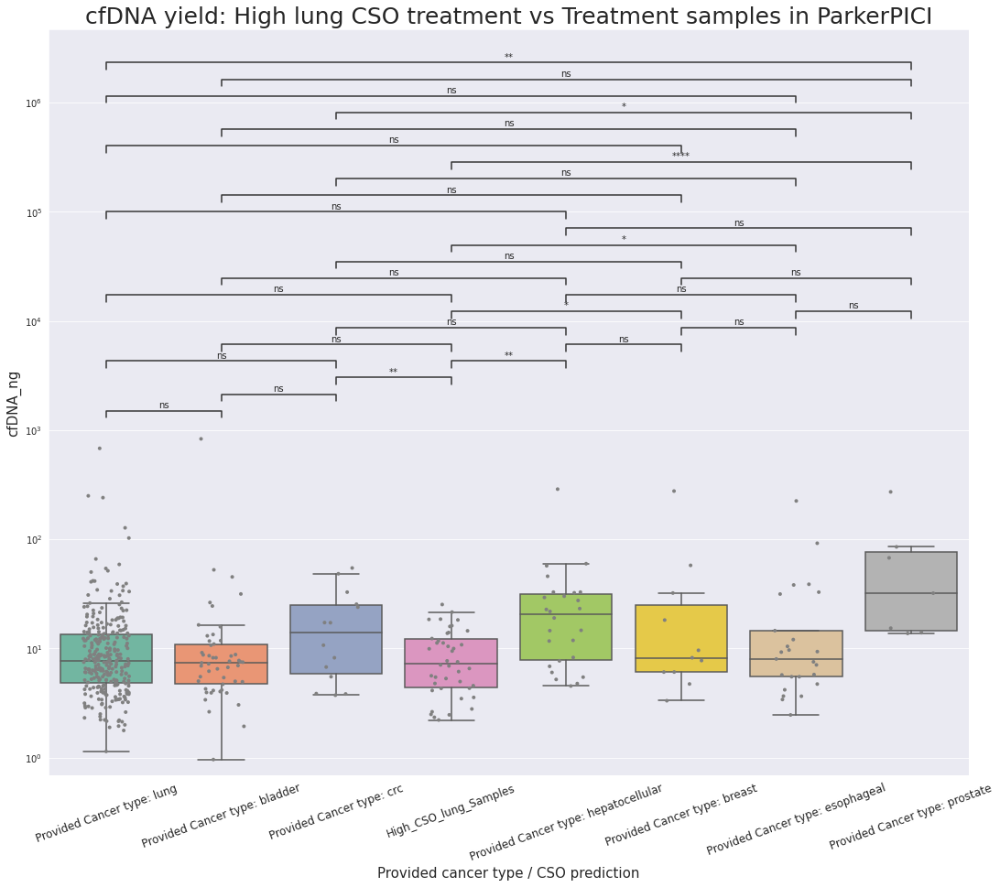

In [184]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_therapy_one_batch_with_annotation(df):
    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'CSO_Lung_Sample' categories
    hue_order = df['CSO_Lung_Sample'].unique().tolist()

    # # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="CSO_Lung_Sample", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="CSO_Lung_Sample", y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # # Offset for sample size annotation, adjust as needed
    # offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    # for plot_type, cancer_group in df.groupby('treatment.regimen.name'):
    #     n = cancer_group.shape[0]
    #     type_pos = hue_order.index(plot_type)
    #     center = ax.get_xticks()[type_pos]  # Center position of each category
    #     ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="CSO_Lung_Sample", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title('cfDNA yield: High lung CSO treatment vs Treatment samples in ParkerPICI', fontsize=25)
    ax.set_xlabel('Provided cancer type / CSO prediction', fontsize=15)
    ax.set_ylabel('cfDNA_ng', fontsize=15)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=12, rotation = 20)
    # ax.set_xticklabels(ax.get_xticklabels(), fontsize=25)


    plt.show()

# For treatment sample only
top_prd_df_Parker_treatment = top_prd_df_Parker[top_prd_df_Parker['treatment'] == "Treatment"]
print(top_prd_df_Parker_treatment.shape)
print(top_prd_df_Parker.shape)
cfDNA_boxplot_by_therapy_one_batch_with_annotation(top_prd_df_Parker_treatment)

In [172]:
# Redefine the regimen

def categorize_immunotherapy(name):
    # Lowercase the name to standardize it and remove references to chemo or radiation
    name = name.lower().replace('chemo', '').replace('radiation', '')
    
    # Identify if key immunotherapy agents are in the treatment string
    has_pembrolizumab = 'pembrolizumab' in name
    has_atezolizumab = 'atezolizumab' in name
    has_nivolumab = 'nivolumab' in name
    has_cemiplimab = 'cemiplimab' in name
    has_ipilimumab = 'ipilimumab' in name

    # Build the treatment category based on the agents found
    agents = []
    if has_pembrolizumab:
        agents.append('Pembrolizumab')
    if has_atezolizumab:
        agents.append('Atezolizumab')
    if has_nivolumab:
        agents.append('Nivolumab')
    if has_cemiplimab:
        agents.append('Cemiplimab')
    if has_ipilimumab:
        agents.append('Ipilimumab')
    
    if not agents:
        return 'Other Treatments'
    
    # Join the agents to form a combination category or single depending on the number of agents involved
    return '+'.join(agents)

# Apply the function to the treatment regimen column
top_prd_df_Parker_treatment_all['immunotherapy_type'] = top_prd_df_Parker_treatment_all['treatment.regimen.name'].apply(categorize_immunotherapy)

# Display the value counts for the new immunotherapy type categories
top_prd_df_Parker_treatment_all['immunotherapy_type'].value_counts()



Pembrolizumab                         246
Atezolizumab                           73
Nivolumab                              67
Other Treatments                       62
Nivolumab+Ipilimumab                    7
Cemiplimab                              5
Atezolizumab+Nivolumab+Ipilimumab       4
Pembrolizumab+Nivolumab                 2
Pembrolizumab+Atezolizumab              1
Pembrolizumab+Nivolumab+Ipilimumab      1
Atezolizumab+Nivolumab                  1
Pembrolizumab+Cemiplimab                1
Name: immunotherapy_type, dtype: int64


In [185]:
top_prd_df_Parker_treatment_all_test = top_prd_df_Parker_treatment_all[top_prd_df_Parker_treatment_all["immunotherapy_type"] == "Nivolumab+Ipilimumab"]
top_prd_df_Parker_treatment_all_test

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,Patient_ID_Parker,treatment.regimen.name,clinical.observation.metastasis.gdc.anatomic.sites,comorbidities,comorbidity_category,immunotherapy_type
35,B00319716_230329_A01552_0214_BHVJW3DSX5,-2.853154,CSO_lung,2.908154,PICI0009,A0676134,B00319716,PICI0009.PICI0009-3-1591,ON-TREATMENT,SUCCESS,NaN,2.97,25.285,1.0,NSCLC,20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv,jinwang,2023-06-15,ParkerInstitutePICI,RP,Other,NaN,NaN,GAAGCACGTG,Unknown,Research,2023-03-31 21:56:49-07:00,Sirius_v1.0,NaN,Sirius-1.0.0-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_v1.0,NaN,NaN,NaN,A0676134,NaN,230329_A01552_0214_BHVJW3DSX5,NSCLC,/ghsfa/projects/omni_v2/flowcells/230329_A01552_0214_BHVJW3DSX5_PS3R216_AP2.Sirius-1.1.0-RLS_20230821-104214,NaN,NaN,NaN,lung,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230329_A01552_0214_BHVJW3DSX5_PS3R216_AP2.Sirius-1.0.0-RLS,True,/ghsfa/projects/omni_v2/flowcells/230329_A01552_0214_BHVJW3DSX5_PS3R216_AP2.Sirius-1.1.0-RLS_20230821-104214/B00319716/B00319716.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/230329_A01552_0214_BHVJW3DSX5_PS3R216_AP2.Sirius-1.1.0-RLS_20230821-104214/B00319716/B00319716.ghcnv_qc.combined.hdr.tsv,B00319716,Male,Male,lung,1,3-1591,ipilimumab+nivolumab:1,"Bone, Lung","cardiac/heart disease,respiratory disease,gastrointestinal problems,kidney/genitourinary disease,blood condition,endocrine condition/problem,diabetes,musculoskeletal condition/problem,abnormal blood pressure,sinus condition/problem",Lung Disease Related,Nivolumab+Ipilimumab
131,B00470733_230821_A02048_0007_BH7HFFDSX7,-22.228539,CSO_lung,-17.056733,PICI0009,A0675361,B00470733,PICI0009.PICI0009-3-1817,ON-TREATMENT,SUCCESS,NaN,1.32,14.612,1.0,NSCLC,20230929_ParkerInstitutePICI_RP_01_1024Samples_InfinityReport.csv,jinwang,2023-09-29,ParkerInstitutePICI,RP,Other,NaN,NaN,CCATTAAGCT,Unknown,Research,2023-08-23 19:44:14-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,PIC_RP_01,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0675361,cgp,230821_A02048_0007_BH7HFFDSX7,NSCLC,/ghsfa/ivd/flowcentral/230821_A02048_0007_BH7HFFDSX7.f1552c87-9e79-4220-9af8-f44be467de53.20230823124314,NaN,NaN,NaN,lung,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230821_A02048_0007_BH7HFFDSX7.f1552c87-9e79-4220-9af8-f44be467de53.20230823124314,False,/ghsfa/ivd/flowcentral/230821_A02048_0007_BH7HFFDSX7.f1552c87-9e79-4220-9af8-f44be467de53.20230823124314/B00470733/B00470733.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230821_A02048_0007_BH7HFFDSX7.f1552c87-9e79-4220-9af8-f44be467de53.20230823124314/B00470733/B00470733.ghcnv_qc.combined.hdr.tsv,B00470733,Female,Female,lung,1,3-1817,ipilimumab+nivolumab:1,Lung,"cardiac/heart disease,respiratory disease,kidney/genitourinary disease,blood condition,abnormal blood pressure",Lung Disease Related,Nivolumab+Ipilimumab
162,B00489817_230915_A01835_0127_AHCYLTDSX7,-21.712941,CSO_lung,-14.255454,PICI0009,A0676118,B00489817,PICI0009.PICI0009-5-1059,ON-TREATMENT,SUCCESS,NaN,1.01,7.592,1.0,NSCLC,20230929_ParkerInstitutePICI_RP_01_1024Samples_InfinityReport.csv,jinwang,2023-09-29,ParkerInstitutePICI,RP,Other,NaN,NaN,TATTAACATG,Unknown,Research,2023-09-17 19:11:22-07:00,Sirius_v1.0,NaN,Sirius-1.

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Other Treatments vs. Pembrolizumab: t-test independent samples, P_val:2.162e-01 t=-1.239e+00
Pembrolizumab vs. Nivolumab: t-test independent samples, P_val:5.611e-02 t=-1.917e+00
Nivolumab vs. Nivolumab+Ipilimumab: t-test independent samples, P_val:8.986e-02 t=-1.719e+00
Nivolumab+Ipilimumab vs. Pembrolizumab+Atezolizumab: t-test independent samples, P_val:nan t=nan
Pembrolizumab+Atezolizumab vs. Atezolizumab: t-test independent samples, P_val:nan t=nan
Atezolizumab vs. Atezolizumab+Nivolumab+Ipilimumab: t-test independent samples, P_val:6.538e-01 t=4.503e-01
Atezolizumab+Nivolumab+Ipilimumab vs. Pembrolizumab+Nivolumab+Ipilimumab: t-test independent samples, P_val:nan t=nan
Pembrolizumab+Nivolumab+Ipilimumab vs. Cemiplimab: t-test independent samples, P_val:nan t=nan
Cemiplimab vs. Atezolizumab+Nivolumab: t

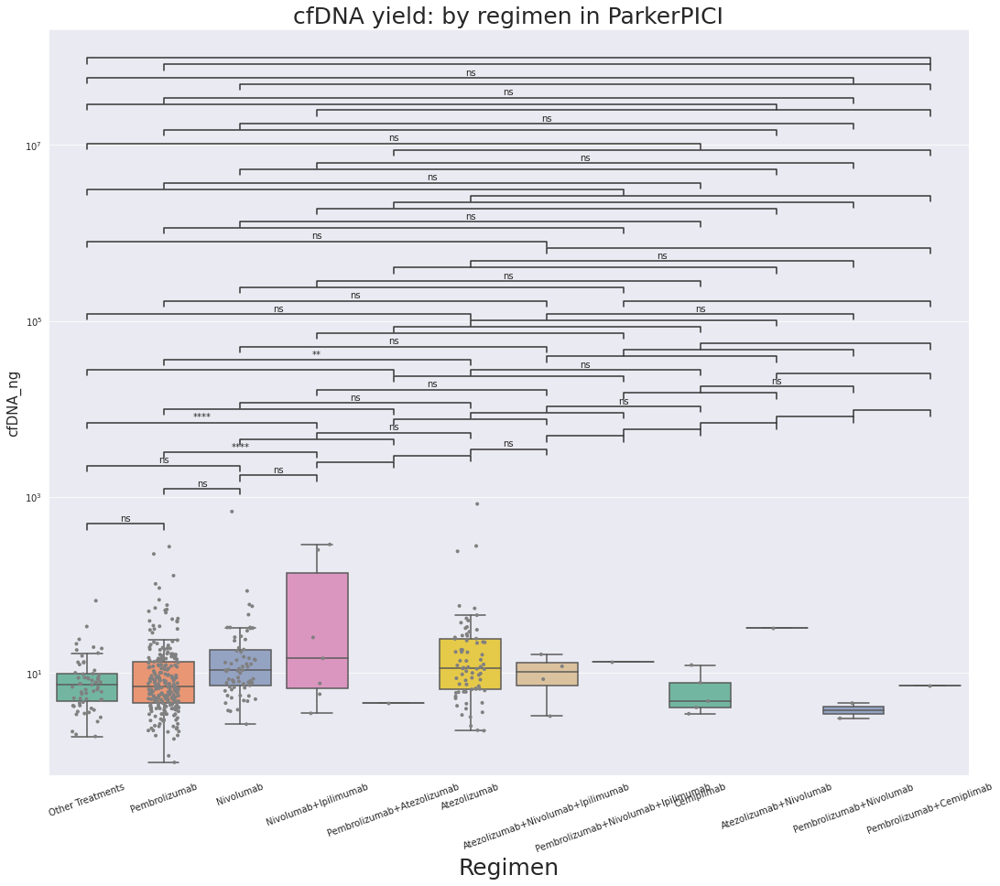

In [183]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_therapy_one_batch_with_annotation(df):
    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'treatment.regimen.name' categories
    hue_order = df['immunotherapy_type'].unique().tolist()

    # # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="immunotherapy_type", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="immunotherapy_type", y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # # Offset for sample size annotation, adjust as needed
    # offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    # for plot_type, cancer_group in df.groupby('treatment.regimen.name'):
    #     n = cancer_group.shape[0]
    #     type_pos = hue_order.index(plot_type)
    #     center = ax.get_xticks()[type_pos]  # Center position of each category
    #     ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="immunotherapy_type", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title('cfDNA yield: by regimen in ParkerPICI', fontsize=25)
    ax.set_xlabel('Regimen', fontsize=25)
    ax.set_ylabel('cfDNA_ng', fontsize=15)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=10, rotation = 20)

    plt.show()

# For treatment sample only
cfDNA_boxplot_by_therapy_one_batch_with_annotation(top_prd_df_Parker_treatment_all)

#### For CSO-digestive Parker analysis 

In [163]:
# Regroup the comorbidities

import re

# Define a function to categorize comorbidities using regular expressions
def categorize_comorbidities(comorbidity):
    if pd.isna(comorbidity):
        return 'Other'  # or some other category for NaN or missing data
    
    # Regex patterns for each category
    lung_pattern = re.compile(r'\b(respiratory)\b', re.IGNORECASE)
    digestive_pattern = re.compile(r'\b(gastrointestinal|crc|esophageal|gastric)\b', re.IGNORECASE)
    liver_pattern = re.compile(r'\b(hepatocellular|liver)\b', re.IGNORECASE)

    # Check and categorize based on the presence of keywords
    if lung_pattern.search(comorbidity):
        # return 'Lung Disease Related'
        return 'Other'
    elif digestive_pattern.search(comorbidity):
        return 'Digestive System Related'
    elif liver_pattern.search(comorbidity):
        # return 'Liver/Hepatocellular Related'
        return 'Other'
    else:
        return 'Other'

# Apply the function to categorize comorbid use
df_digestive_cso_treatment_ParkerInstitutePICI_all['comorbidity_category'] = df_digestive_cso_treatment_ParkerInstitutePICI_all['comorbidities'].apply(categorize_comorbidities)

# Display the DataFrame to see the new column
df_digestive_cso_treatment_ParkerInstitutePICI_all['comorbidity_category'].value_counts()

Other                       54
Digestive System Related    21
Name: comorbidity_category, dtype: int64

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Lung Disease Related vs. Other: t-test independent samples, P_val:3.966e-01 t=8.485e-01


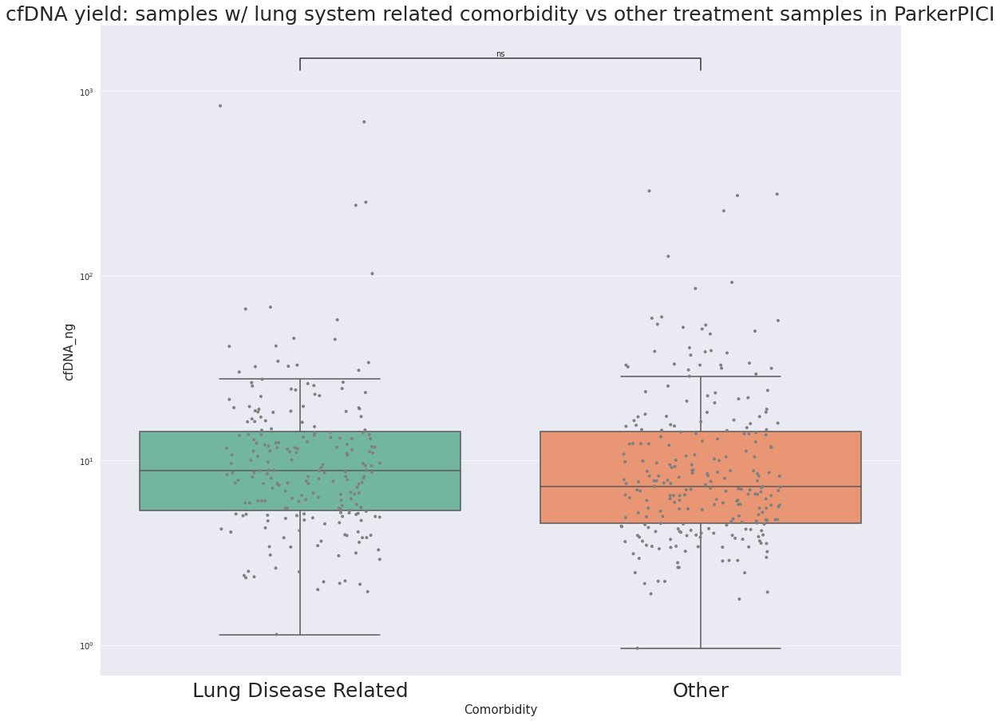

In [164]:
# Compare the cfDNA between 
cfDNA_boxplot_by_comorbidity_one_batch_with_annotation(top_prd_df_Parker_treatment_all)

### Deep dive on Daiichi SOW21 cohort

#### CSO score distribution

In [12]:
# CSO score distribution of Daiichi SOW21
top_8_prd_df = pd.read_csv(f"{work_dir}/top_8_prd_df.csv", header=0)
print("Total GHSampleID is " + str(top_8_prd_df.shape[0]) + "\n")
top_8_prd_df.head()

Total GHSampleID is 122649



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank
0,A084877801_240114_A00441_0930_BHMJ7VDSX7,-22.105544,CSO_lung,-17.544355,JCOG1801 A1,A0848778,A084877801,81.0,Pre-CRT,SUCCESS,NaN,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,GCTCGGGCCT,Male,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0848778,cgp,240114_A00441_0930_BHMJ7VDSX7,CRC,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.combined.hdr.tsv,A084877801,Male,Male,lung,1
1,A084877801_240114_A00441_0930_BHMJ7VDSX7,-22.105544,CSO_crc,-19.667884,JCOG1801 A1,A0848778,A084877801,81.0,Pre-CRT,SUCCESS,NaN,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,GCTCGGGCCT,Male,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0848778,cgp,240114_A00441_0930_BHMJ7VDSX7,CRC,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.combined.hdr.tsv,A084877801,Male,Male,digestive,2
2,A084877801_240114_A00441_0930_BHMJ7VDSX7,-22.105544,CSO_bladder,-20.431467,JCOG1801 A1,A0848778,A084877801,81.0,Pre-CRT,SUCCESS,NaN,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,GCTCGGGCCT,Male,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0848778,cgp,240114_A00441_0930_BHMJ7VDSX7,CRC,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.combined.hdr.tsv,A084877801,Male,Male,bladder,3
3,A084877801_240114_A00441_0930_BHMJ7VDSX7,-22.105544,CSO_pancreatic,-20.770105,JCOG1801 A1,A0848778,A084877801,81.0,Pre-CRT,SUCCESS,NaN,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,GCTCGGGCCT,Male,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0848778,cgp,240114_A00441_0930_BHMJ7VDSX7,CRC,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharm

In [13]:
# Merge the data 
top_8_prd_df_new = top_8_prd_df.merge(df_bibp_annotated[["csv_file_name", 'cancerother']], on = 'csv_file_name', how = "left")
print("Total size of the merged data with missing cancer type is " + str(top_8_prd_df.cancerother.isnull().sum()) + "\n") 

# Handle the 'cancerother' duplication issue caused by merging
top_8_prd_df_new['cancerother'] = np.where(top_8_prd_df_new['cancerother_y'].notna(), top_8_prd_df_new['cancerother_y'], top_8_prd_df_new['cancerother_x'])

# Drop the original 'cancerother_x', and 'cancerother_y' columns
top_8_prd_df_new = top_8_prd_df_new.drop(columns=['cancerother_x', 'cancerother_y'])

# Drop nan
print("Total size of the merged data with missing cancer type is " + str(top_8_prd_df_new.cancerother.isnull().sum()) + "\n") 

# Update the 'cancerother' column by first checking 'Cancertype' and then 'Conditions'
top_8_prd_df_new['cancerother'] = top_8_prd_df_new.apply(
    lambda row: row['Cancertype'] if pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown' else row['cancerother'],
    axis=1
)

# Update the 'cancerother' column by first checking 'Cancertype' and then 'Conditions'
top_8_prd_df_new['cancerother'] = top_8_prd_df_new.apply(
    lambda row: row['Cancertype'] if pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown' else row['cancerother'],
    axis=1
)

# Further update 'cancerother' by checking 'Conditions'
top_8_prd_df_new['cancerother'] = top_8_prd_df_new.apply(
    lambda row: row['Conditions'] if (pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown') and pd.notnull(row['Conditions']) else row['cancerother'],
    axis=1
)

# Regex patterns for each cancer type
regex_patterns = {
    'breast': r'(?i)\bbreast|DCIS|ductal|infiltrating|Triple\s*Negative|TNBC',
    'prostate': r'(?i)\bprostate|Castration-Resistant|mCRPC',
    'esophageal': r'(?i)\besophagus|esophageal',
    'ovarian': r'(?i)\bovarian|BRCA1|Sertoli-Leydig',
    'lung': r'(?i)\blung|NSCLC|SCLC|ADC|SCC|ALK-expressing|adenosquamous|bronchioloalveolar|mixed subtype|papillary type|invasive|small cell|non[-\s]*small[-\s]*cell',
    'bladder': r'(?i)\bbladder|urothelial|transitional\s*cell',
    'pancreatic': r'(?i)\bpancreas|pancreatic|adenocarcinoma',
    'hepatocellular': r'(?i)\bhepatocellular|cholangiocarcinoma|hepatocholangiocarcinoma|intrahepatic',
    'crc': r'(?i)\bcrc|colorectal|colon|rectal|mucinous|rectum',
    'Head_and_Neck': r'(?i)\bhead\s*and\s*neck|HNSCC|adenocarcinoma\sof\ssalivary\sgland',
    'renal': r'(?i)\brenal|kidney',
    'gastric': r'(?i)\bgastric|stomach',
    'endometrial': r'(?i)\bendometrial|uterine|leiomyosarcoma|endometrium',
    'melanoma': r'(?i)\bmelanoma',
    'Gastrointestinal': r'(?i)\bgastrointestinal|gastrooesophageal|gastroesophageal\sjunction|small\sbowel'
}

# Function to categorize cancer based on regex patterns
def categorize_cancer(text):
    if pd.isnull(text):
        return 'unknown'
    for cancer_type, pattern in regex_patterns.items():
        if re.search(pattern, text):
            return cancer_type
    if re.search(r'(?i)unknown', text):  # Check if 'unknown' is anywhere in the text
        return 'unknown'
    return 'other'  # Assign 'other' if no patterns match and it's not 'unknown'

# Apply the categorization function to the 'cancerother' column
top_8_prd_df_new['new_defined_cancer_type'] = top_8_prd_df_new['cancerother'].apply(categorize_cancer)

# Rename
top_8_prd_df = top_8_prd_df_new.copy()

# Output the results
top_8_prd_df['new_defined_cancer_type'].value_counts()


Total size of the merged data with missing cancer type is 60430

Total size of the merged data with missing cancer type is 2427



breast              26878
endometrial         23992
lung                18338
other               17107
crc                 11612
unknown              5283
melanoma             4256
prostate             4233
bladder              2689
renal                2322
pancreatic           2272
ovarian              1286
hepatocellular        908
esophageal            860
gastric               523
Gastrointestinal       47
Head_and_Neck          43
Name: new_defined_cancer_type, dtype: int64

In [14]:
# For top_8_prd_df, for CSO score distribution analysis 
target_files = [
    "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv"
]

top_8_prd_df.loc[top_8_prd_df['csv_file_name'].isin(target_files), ['new_defined_cancer_type']] = ["breast"]

# CSO caller limited to 8 CSO predictable cancer types (digestive inlcludes 'crc', 'esophageal', 'gastric'
top_8_prd_df = top_8_prd_df[top_8_prd_df['new_defined_cancer_type'].isin(['lung', 'crc', 'esophageal', 'gastric', "bladder", 'breast', 'prostate', 'pancreatic', 'hepatocellular', 'ovarian'])]
print("Total size of this RUO summary data with known cancer type is " + str(top_8_prd_df.shape[0]) + "\n") 

# Daiichi SOW21 only
top_8_prd_df_sub = top_8_prd_df[top_8_prd_df['csv_file_name'].isin(target_files)]
print("Total size of this Daiichi SOW21 is " + str(top_8_prd_df_sub.shape[0]) + "\n") 
top_8_prd_df_sub.head()

# For later control cohort analysis

# Gilead SOW3
top_8_prd_df_gliead = top_8_prd_df[top_8_prd_df['csv_file_name'].isin(["20221227_GileadSciences_SOW03_750Samples_InfinityReport.csv"])]

# Then, assign treatment information to the "treatment" column for Gilead SOW3 only
top_8_prd_df_gliead.loc[top_8_prd_df_gliead['Visit_name'] == "BSLJ", ['treatment']] = ["Baseline"]
top_8_prd_df_gliead.loc[top_8_prd_df_gliead['Visit_name'].isin(['C2D1J']), ['treatment']] = ["Treatment"]

# Remove EOT samples
top_8_prd_df_gliead = top_8_prd_df_gliead[top_8_prd_df_gliead['treatment'] != 'other']

print("Total size of this Gilead SOW3 is " + str(top_8_prd_df_gliead.shape[0]) + "\n") 

# AZ SOW183
top_8_prd_df_az183 = top_8_prd_df[top_8_prd_df['csv_file_name'].isin(["20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv"])]
print("Total size of this AZ SOW183 is " + str(top_8_prd_df_az183.shape[0]) + "\n") 



Total size of this RUO summary data with known cancer type is 69599

Total size of this Daiichi SOW21 is 6019

Total size of this Gilead SOW3 is 1816

Total size of this AZ SOW183 is 6118



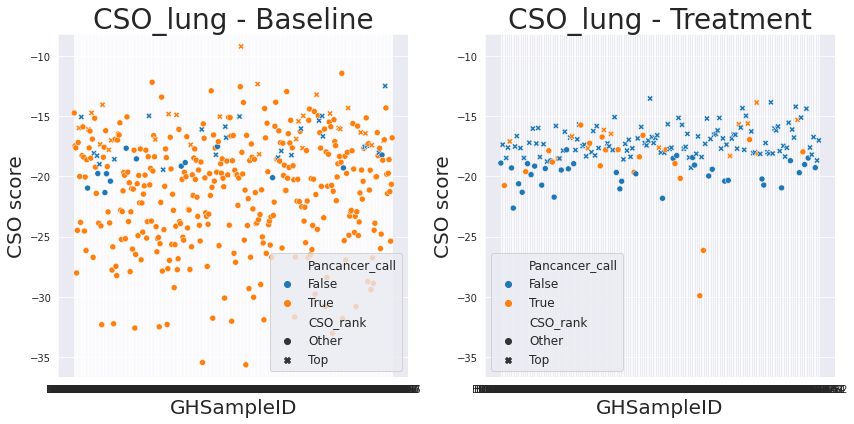

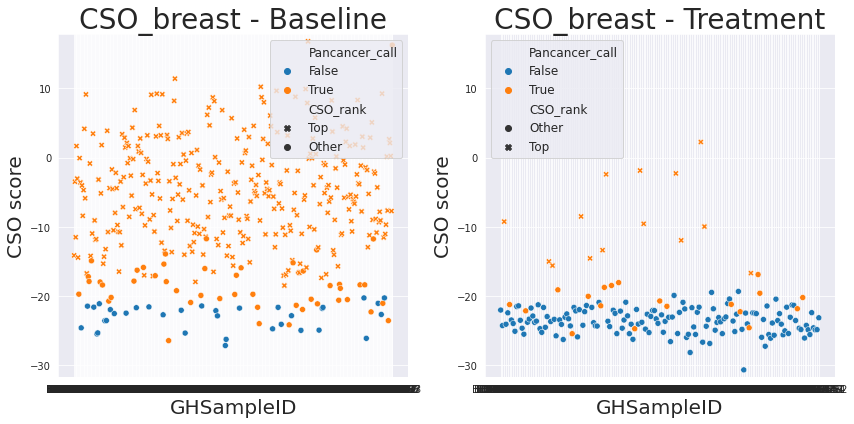

In [15]:
def plot_cso_lung_scores(data, CSO_pred_type):
    sns.set_style('darkgrid')
    # Filter for CSO lung / CSO breast data
    baseline_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]
    
    # Define subplot structure
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
    
    # Determine common y-axis limits based on overall data
    y_min = min(baseline_data['cso_score'].min(), treatment_data['cso_score'].min()) - 1
    y_max = max(baseline_data['cso_score'].max(), treatment_data['cso_score'].max()) + 1
    
    # Baseline plot
    sns.scatterplot(x='GHSampleID', y='cso_score', data=baseline_data, hue='Pancancer_call', 
                    style=baseline_data['CSO_rank'].apply(lambda x: 'Top' if x == 1 else 'Other'), 
                    markers={'Top': 'X', 'Other': 'o'}, ax=axs[0])
    axs[0].set_title(f'{CSO_pred_type} - Baseline', fontsize = 28)
    axs[0].set_ylim([y_min, y_max])
    axs[0].set_ylabel('CSO score', fontsize=20)
    axs[0].set_xlabel('GHSampleID', fontsize=20)
    axs[0].legend(fontsize=12)

    # Treatment plot
    sns.scatterplot(x='GHSampleID', y='cso_score', data=treatment_data, hue='Pancancer_call', 
                    style=treatment_data['CSO_rank'].apply(lambda x: 'Top' if x == 1 else 'Other'), 
                    markers={'Top': 'X', 'Other': 'o'}, ax=axs[1])
    axs[1].set_title(f'{CSO_pred_type} - Treatment', fontsize = 28)
    axs[1].set_ylim([y_min, y_max])
    axs[1].set_ylabel('CSO score', fontsize=20)
    axs[1].set_xlabel('GHSampleID', fontsize=20)
    axs[1].legend(fontsize=12)

    plt.tight_layout()
    plt.show()

plot_cso_lung_scores(top_8_prd_df_sub, 'CSO_lung')
plot_cso_lung_scores(top_8_prd_df_sub, 'CSO_breast')



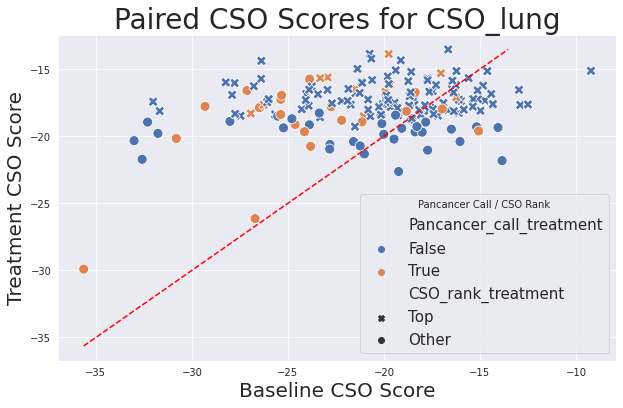

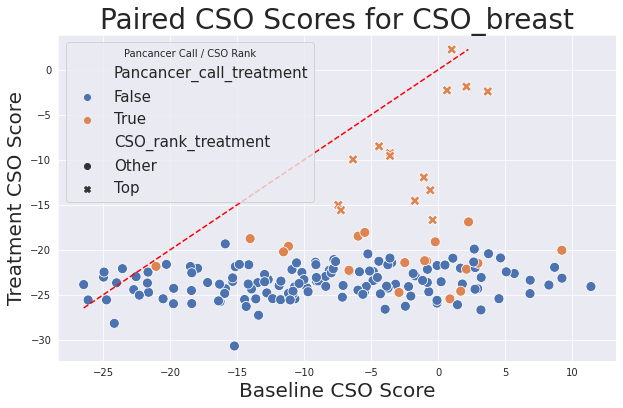

In [16]:
def plot_and_compare_paired_cso_scores(data, CSO_pred_type):
    sns.set_style('darkgrid')
    # Filter data for specific CSO type and treatments
    baseline_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]
    
    # Merge data ensuring only patients with both records are included
    paired_data = pd.merge(baseline_data, treatment_data, on='Patient_ID', suffixes=('_baseline', '_treatment'))

    # Convert CSO scores to numeric and check for NaNs
    paired_data['cso_score_baseline'] = pd.to_numeric(paired_data['cso_score_baseline'], errors='coerce')
    paired_data['cso_score_treatment'] = pd.to_numeric(paired_data['cso_score_treatment'], errors='coerce')
    paired_data.dropna(subset=['cso_score_baseline', 'cso_score_treatment'], inplace=True)

    # Define the plot
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='cso_score_baseline', y='cso_score_treatment', data=paired_data, 
                    hue='Pancancer_call_treatment', style=paired_data['CSO_rank_treatment'].apply(lambda x: 'Top' if x == 1 else 'Other'), 
                    markers={'Top': 'X', 'Other': 'o'}, palette='deep', s=100)

    # Add the x=y line for reference
    plt.plot([paired_data['cso_score_baseline'].min(), paired_data['cso_score_treatment'].max()], 
             [paired_data['cso_score_baseline'].min(), paired_data['cso_score_treatment'].max()], 'r--')
    
    plt.title(f'Paired CSO Scores for {CSO_pred_type}', fontsize = 28)
    plt.xlabel('Baseline CSO Score', fontsize = 20)
    plt.ylabel('Treatment CSO Score', fontsize = 20)
    plt.legend(title='Pancancer Call / CSO Rank', fontsize = 15)
    plt.grid(True)
    plt.show()

plot_and_compare_paired_cso_scores(top_8_prd_df_sub, 'CSO_lung')
plot_and_compare_paired_cso_scores(top_8_prd_df_sub, 'CSO_breast')



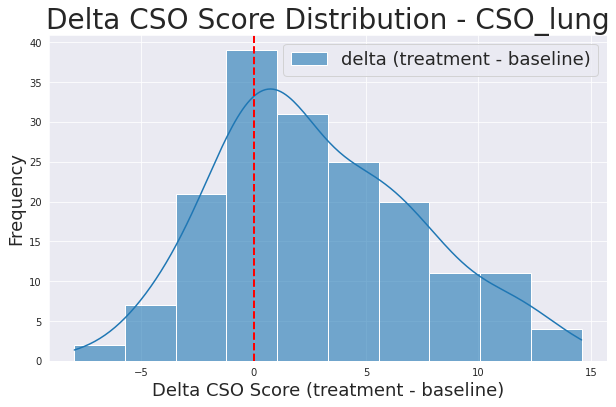

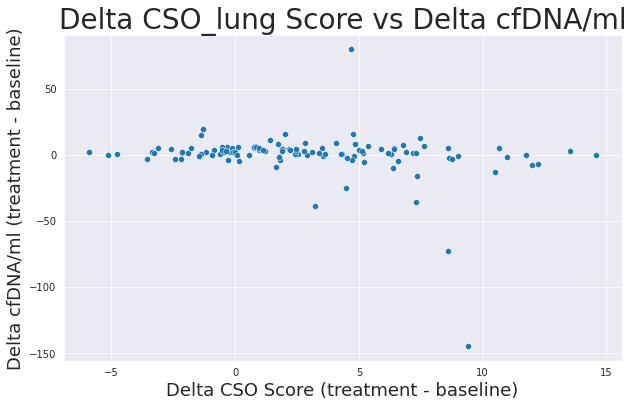

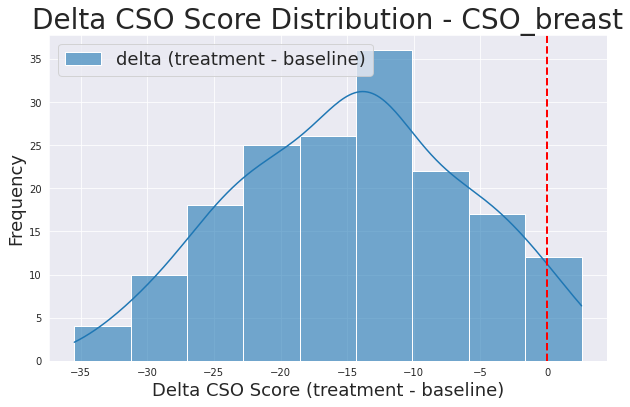

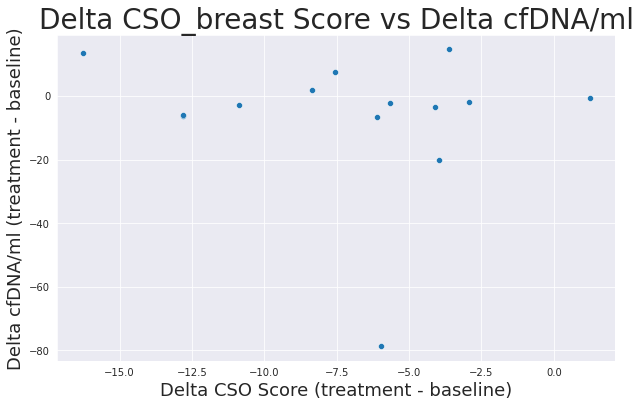

In [17]:
def plot_and_compare_paired_cso_scores_delta(data, CSO_pred_type):
    data = data.copy()

    sns.set_style('darkgrid')
    # Filter data for specific CSO type and treatments
    baseline_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]
    
    # Merge data ensuring only patients with both records are included
    paired_data = pd.merge(baseline_data, treatment_data, on='Patient_ID', suffixes=('_baseline', '_treatment'))

    # Convert CSO scores to numeric and check for NaNs
    paired_data['cso_score_baseline'] = pd.to_numeric(paired_data['cso_score_baseline'], errors='coerce')
    paired_data['cso_score_treatment'] = pd.to_numeric(paired_data['cso_score_treatment'], errors='coerce')
    paired_data.dropna(subset=['cso_score_baseline', 'cso_score_treatment'], inplace=True)

    # Get the delta score
    paired_data['delta_' + str(CSO_pred_type)] = paired_data['cso_score_treatment'] - paired_data['cso_score_baseline']
    plot_paired_data_cso = paired_data['delta_' + str(CSO_pred_type)]

    # Get the delta cfDNA
    paired_data['delta_cfDNA/ml'] = (paired_data['cfDNA_ng_treatment'] / paired_data['Plasma_ml_input_treatment']) - (paired_data['cfDNA_ng_baseline'] / paired_data['Plasma_ml_input_baseline'])

    # Plot delta CSO distribution
    plt.figure(figsize=(10, 6))
    sns.histplot(plot_paired_data_cso, kde=True, label='delta (treatment - baseline)', alpha=0.6)
    plt.xlabel('Delta CSO Score (treatment - baseline)', fontsize = 18)
    plt.ylabel('Frequency', fontsize = 18)
    plt.title(f'Delta CSO Score Distribution - {CSO_pred_type}', fontsize = 28)
    plt.legend(fontsize = 18)

    # Add vertical red dashed line at x=0
    plt.axvline(x=0, color='red', linestyle='--', linewidth=2)

    # Plot delta CSO vs delta cfDNA yield of top ranking samples
    plt.figure(figsize=(10, 6))
    paired_data_treatment_top = paired_data[paired_data['CSO_rank_treatment'] == 1]
    sns.scatterplot(data=paired_data_treatment_top, x=('delta_' + str(CSO_pred_type)), y="delta_cfDNA/ml")

    plt.xlabel('Delta CSO Score (treatment - baseline)', fontsize = 18)
    plt.ylabel('Delta cfDNA/ml (treatment - baseline)', fontsize = 18)
    plt.title(f'Delta {CSO_pred_type} Score vs Delta cfDNA/ml', fontsize = 28)
    plt.show()


    return paired_data

paired_data_daichii_lung = plot_and_compare_paired_cso_scores_delta(top_8_prd_df_sub, 'CSO_lung')
paired_data_daichii_breast = plot_and_compare_paired_cso_scores_delta(top_8_prd_df_sub, 'CSO_breast')



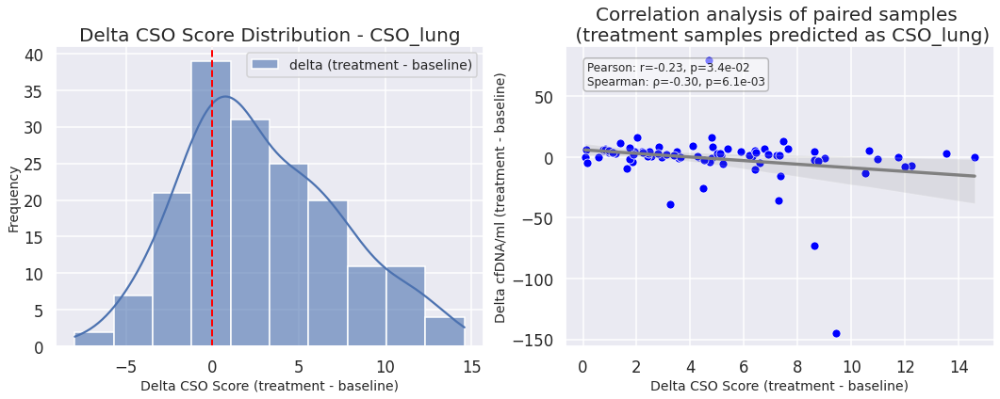

In [25]:
def plot_and_compare_paired_cso_scores_delta(data, CSO_pred_type):
    data = data.copy()

    sns.set_style('darkgrid')
    # Filter data for specific CSO type and treatments
    baseline_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]
    
    # Merge data ensuring only patients with both records are included
    paired_data = pd.merge(baseline_data, treatment_data, on='Patient_ID', suffixes=('_baseline', '_treatment'))

    # Convert CSO scores to numeric and check for NaNs
    paired_data['cso_score_baseline'] = pd.to_numeric(paired_data['cso_score_baseline'], errors='coerce')
    paired_data['cso_score_treatment'] = pd.to_numeric(paired_data['cso_score_treatment'], errors='coerce')
    paired_data.dropna(subset=['cso_score_baseline', 'cso_score_treatment'], inplace=True)

    # Get the delta score
    paired_data['delta_' + str(CSO_pred_type)] = paired_data['cso_score_treatment'] - paired_data['cso_score_baseline']
    
    # Get the delta cfDNA
    paired_data['delta_cfDNA/ml'] = (paired_data['cfDNA_ng_treatment'] / paired_data['Plasma_ml_input_treatment']) - (paired_data['cfDNA_ng_baseline'] / paired_data['Plasma_ml_input_baseline'])

    # Setup plots
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Plot delta CSO distribution
    sns.histplot(paired_data['delta_' + str(CSO_pred_type)], kde=True, label='delta (treatment - baseline)', alpha=0.6, ax=axes[0])
    axes[0].set_xlabel('Delta CSO Score (treatment - baseline)', fontsize=14)
    axes[0].set_ylabel('Frequency', fontsize=14)
    axes[0].set_title(f'Delta CSO Score Distribution - {CSO_pred_type}', fontsize=20)
    axes[0].legend(fontsize=14)
    axes[0].axvline(x=0, color='red', linestyle='--', linewidth=2)

    # Prepare data for scatter plot
    paired_data_treatment_top = paired_data[(paired_data['CSO_rank_treatment'] == 1) & (paired_data['delta_' + str(CSO_pred_type)] > 0)]

    # Calculate the Pearson and Spearman correlations
    pearson_corr, pearson_p_val = scipy.stats.pearsonr(paired_data_treatment_top['delta_' + str(CSO_pred_type)].dropna(), paired_data_treatment_top['delta_cfDNA/ml'].dropna())
    spearman_corr, spearman_p_val = scipy.stats.spearmanr(paired_data_treatment_top['delta_' + str(CSO_pred_type)].dropna(), paired_data_treatment_top['delta_cfDNA/ml'].dropna())

    # Plot delta CSO vs delta cfDNA yield of top ranking samples
    sns.scatterplot(data=paired_data_treatment_top, x=('delta_' + str(CSO_pred_type)), y="delta_cfDNA/ml", ax=axes[1], color='blue')
    sns.regplot(data=paired_data_treatment_top, x=('delta_' + str(CSO_pred_type)), y="delta_cfDNA/ml", ax=axes[1], scatter=False, color="gray")
    axes[1].set_xlabel('Delta CSO Score (treatment - baseline)', fontsize=14)
    axes[1].set_ylabel('Delta cfDNA/ml (treatment - baseline)', fontsize=14)
    axes[1].set_title(f'Correlation analysis of paired samples \n (treatment samples predicted as {CSO_pred_type})', fontsize=20)

    # Annotate correlation results on the second plot
    axes[1].text(0.05, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
                 ha='left', va='top', transform=axes[1].transAxes, fontsize=12, bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))

    plt.tight_layout()
    plt.show()

    return paired_data

# Usage of the function
paired_data_daichii_lung = plot_and_compare_paired_cso_scores_delta(top_8_prd_df_sub, 'CSO_lung')

# # For CSO breast samples, the error is due to no paired samples
# paired_data_daichii_breast = plot_and_compare_paired_cso_scores_delta(top_8_prd_df_sub, 'CSO_breast')


In [32]:
# Compare the cfDNA straifitied by CSO delta for Daiichi SOW21
# Lung
paired_data_daichii_lung["cso_lung_score_increased"] = np.where(paired_data_daichii_lung["delta_CSO_lung"] >= 0, 'cso_lung_score_increased', "cso_lung_score_decreased")

# # Optional: select for'CSO_rank_treatment'] == 1
# paired_data_daichii_lung = paired_data_daichii_lung[(paired_data_daichii_lung['CSO_rank_treatment'] == 1) & (paired_data_daichii_lung['cso_prediction_treatment'] == "lung")]

list_1 = paired_data_daichii_lung.GHSampleID_baseline.tolist()
list_2 = paired_data_daichii_lung.GHSampleID_treatment.tolist()
list_all = list_1 + list_2
print(len(list_all))

df_paired_daiichi_lung_delta = top_prd_df[top_prd_df['GHSampleID'].isin(list_all)]
df_paired_daiichi_lung_delta_plot = df_paired_daiichi_lung_delta.merge(paired_data_daichii_lung[['Patient_ID', 'cso_lung_score_increased']], on = "Patient_ID", how = 'left')


# select for treatment sample of the paired data
df_paired_daiichi_lung_delta_plot = df_paired_daiichi_lung_delta_plot[df_paired_daiichi_lung_delta_plot['treatment'] == 'Treatment']
print(df_paired_daiichi_lung_delta_plot.shape)

# Select for pancancer caller negative samples
df_paired_daiichi_lung_delta_plot = df_paired_daiichi_lung_delta_plot[df_paired_daiichi_lung_delta_plot['Pancancer_call'] == False]
print(df_paired_daiichi_lung_delta_plot.shape)

# Breast
paired_data_daichii_breast["cso_breast_score_increased"] = np.where(paired_data_daichii_breast["delta_CSO_breast"] >= 0, 'cso_breast_score_increased', "cso_breast_score_decreased")
# Optional: select for'CSO_rank_treatment'] == 1
# paired_data_daichii_breast = paired_data_daichii_breast[(paired_data_daichii_breast['CSO_rank_treatment'] == 1) & (paired_data_daichii_breast['cso_prediction_treatment'] == "breast")]

list_1 = paired_data_daichii_breast.GHSampleID_baseline.tolist()
list_2 = paired_data_daichii_breast.GHSampleID_treatment.tolist()
list_all_breast = list_1 + list_2
print(len(list_all_breast))

df_paired_daiichi_breast_delta = top_prd_df[top_prd_df['GHSampleID'].isin(list_all_breast)]
df_paired_daiichi_breast_delta_plot = df_paired_daiichi_breast_delta.merge(paired_data_daichii_breast[['Patient_ID', 'cso_breast_score_increased']], on = "Patient_ID", how = 'left')

# select for treatment sample of the paired data
df_paired_daiichi_breast_delta_plot = df_paired_daiichi_breast_delta_plot[df_paired_daiichi_breast_delta_plot['treatment'] == 'Treatment']
print(df_paired_daiichi_breast_delta_plot.shape)

# select for treatment sample of the paired data
df_paired_daiichi_breast_delta_plot = df_paired_daiichi_breast_delta_plot[df_paired_daiichi_breast_delta_plot['Pancancer_call'] == False]
df_paired_daiichi_breast_delta_plot.shape

342
(171, 60)
(139, 60)
340
(170, 60)


(138, 60)

In [180]:
# df_paired_daiichi_lung_delta_plot["cso_lung_score_increased_new"] = np.where((df_paired_daiichi_lung_delta_plot["cso_lung_score_increased"] == "cso_lung_score_increased") & (df_paired_daiichi_lung_delta_plot["treatment"] == "Treatment"), 'cso_lung_score_increased', "other")
# df_paired_daiichi_lung_delta_plot.groupby('treatment').cso_lung_score_increased_new.value_counts()
# df_paired_daiichi_lung_delta_plot_new = df_paired_daiichi_lung_delta_plot[df_paired_daiichi_lung_delta_plot['Pancancer_call'] == False]
# df_paired_daiichi_lung_delta_plot_new.groupby('treatment').cso_lung_score_increased_new.value_counts()
# cfDNA_deta_plot(df_paired_daiichi_lung_delta_plot_new, "cso_lung_score_increased_new", 'cfDNA yield by CSO lung score delta stratification')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

cso_lung_score_increased vs. cso_lung_score_decreased: t-test independent samples, P_val:1.526e-01 t=1.438e+00


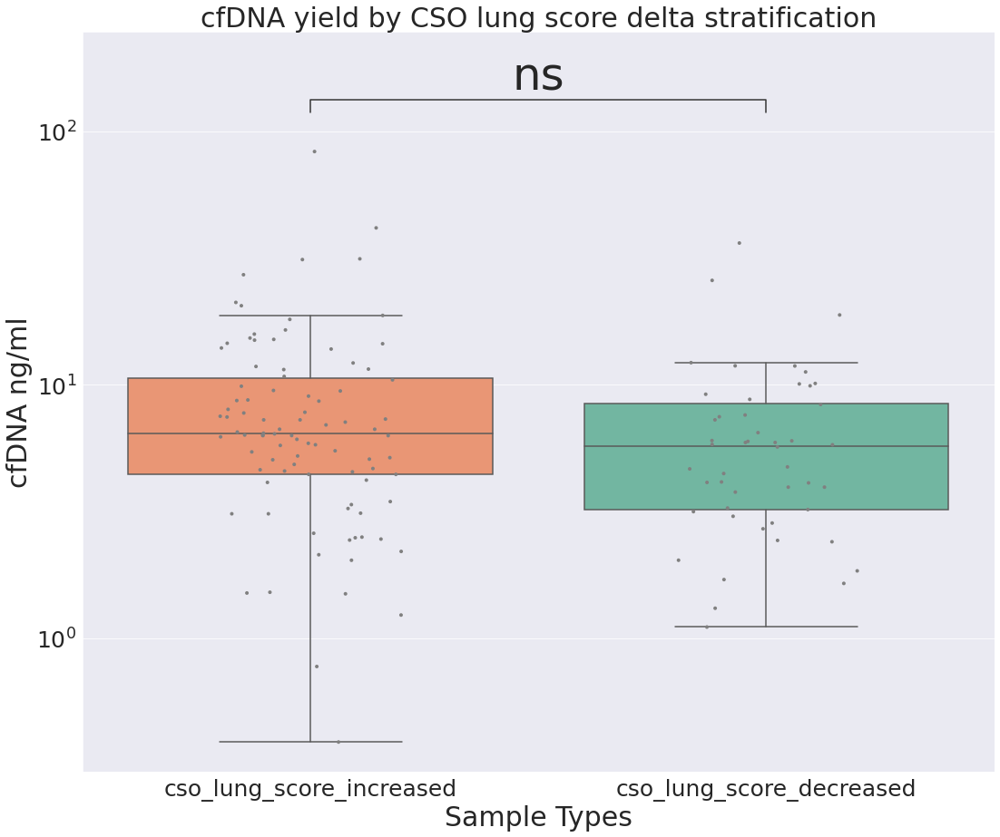

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

cso_breast_score_decreased vs. cso_breast_score_increased: t-test independent samples, P_val:2.675e-01 t=1.113e+00


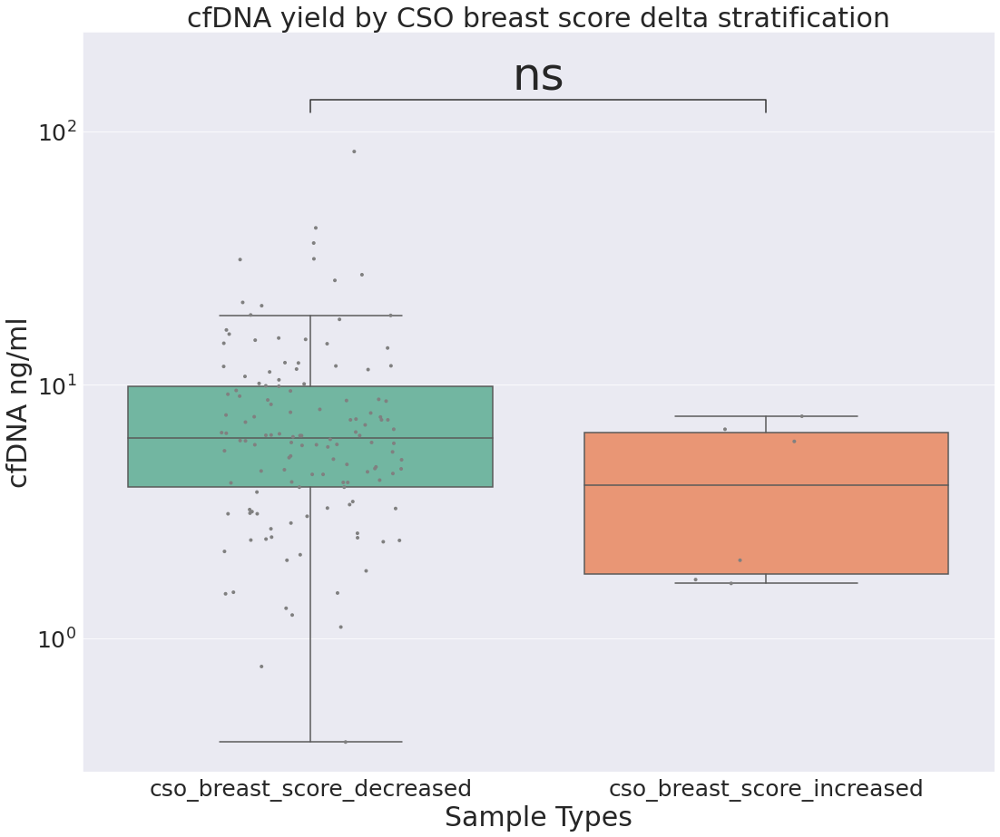

In [33]:
from statannotations.Annotator import Annotator

def cfDNA_deta_plot(df, column_name, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    if column_name == "cso_lung_score_increased":
        hue_order = ['cso_lung_score_decreased', 'cso_lung_score_increased']
        default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
        color_map = {cat: col for cat, col in zip(hue_order, default_colors)}
        sns.boxplot(data=df, x=column_name, y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette=color_map)
    else:
        hue_order = df[column_name].unique().tolist()
        sns.boxplot(data=df, x=column_name, y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette="Set2")


    # # Order based on the 'CSO_Lung_Sample' categories
    # hue_order = df[column_name].unique().tolist()

    # Create boxplot and stripplot without using csv_file_name
    # sns.boxplot(data=df, x=column_name, y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette=color_map)
    sns.stripplot(data=df, x=column_name, y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # # Annotate sample sizes with offset
    # # Offset for sample size annotation, adjust as needed
    # offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    # for plot_type, cancer_group in df.groupby(column_name):
    #     n = cancer_group.shape[0]
    #     type_pos = hue_order.index(plot_type)
    #     center = ax.get_xticks()[type_pos]  # Center position of each category
    #     ax.text(center, cancer_group['cfDNA_ng'].min(), f'n = {n}', ha='center', va='bottom', fontsize=30, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x=column_name, y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize = 50)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Sample Types', fontsize=30)
    ax.set_ylabel('cfDNA ng/ml', fontsize=30)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=25)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=25)


    plt.show()


cfDNA_deta_plot(df_paired_daiichi_lung_delta_plot, "cso_lung_score_increased", 'cfDNA yield by CSO lung score delta stratification')
cfDNA_deta_plot(df_paired_daiichi_breast_delta_plot, "cso_breast_score_increased", 'cfDNA yield by CSO breast score delta stratification')


In [181]:
top_prd_df_gliead.groupby('treatment').Pancancer_call.value_counts()

treatment  Pancancer_call
Baseline   True              133
           False               2
Treatment  True              123
           False               2
Name: Pancancer_call, dtype: int64

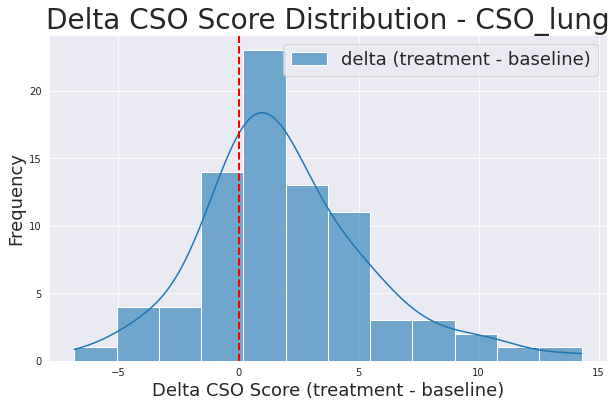

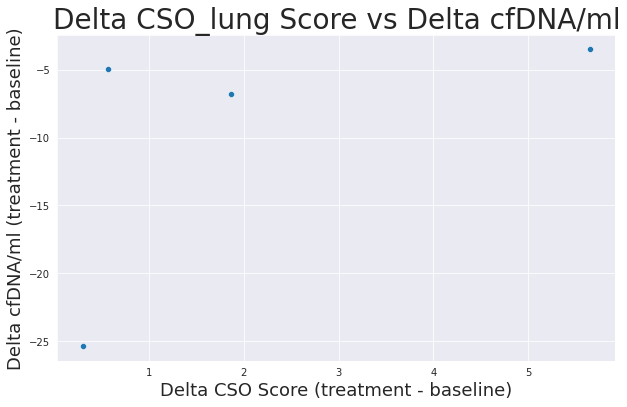

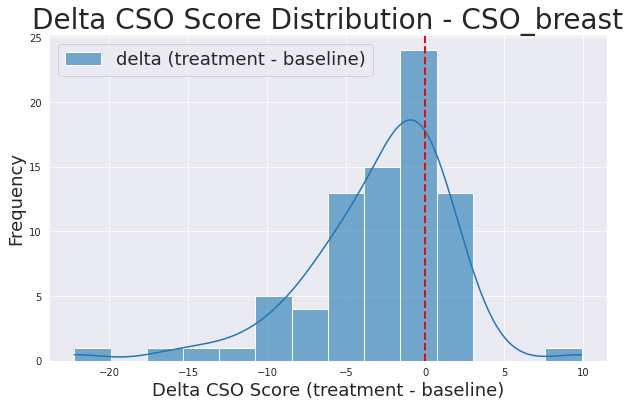

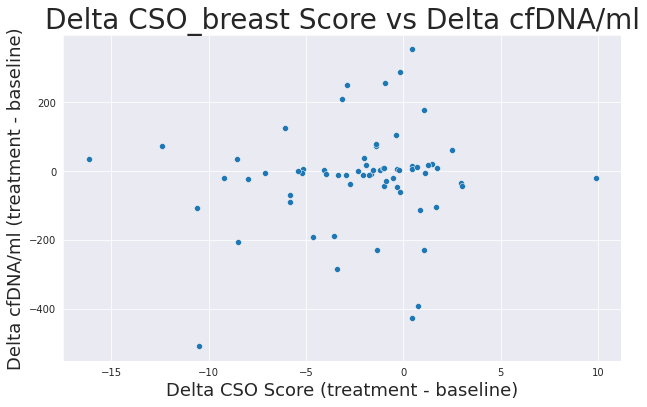

160
(80, 61)
158


(79, 61)

In [34]:
# Important Note: Need to run top_prd_df_gliead first in 

# For control cohort Gilead SOW3
paired_data_gilead_lung = plot_and_compare_paired_cso_scores_delta(top_8_prd_df_gliead, 'CSO_lung')
paired_data_gilead_breast = plot_and_compare_paired_cso_scores_delta(top_8_prd_df_gliead, 'CSO_breast')

# Compare the cfDNA straifitied by CSO delta
# Lung
paired_data_gilead_lung["cso_lung_score_increased"] = np.where(paired_data_gilead_lung["delta_CSO_lung"] >= 0, 'cso_lung_score_increased', "cso_lung_score_decreased")

# Optional: select for'CSO_rank_treatment'] == 1
# paired_data_gilead_lung = paired_data_gilead_lung[(paired_data_gilead_lung['CSO_rank_treatment'] == 1) & (paired_data_gilead_lung['cso_prediction_treatment'] == "lung")]

list_1 = paired_data_gilead_lung.GHSampleID_baseline.tolist()
list_2 = paired_data_gilead_lung.GHSampleID_treatment.tolist()
list_all = list_1 + list_2
print(len(list_all))

df_paired_gilead_lung_delta = top_prd_df_gliead[top_prd_df_gliead['GHSampleID'].isin(list_all)]
df_paired_gilead_lung_delta_plot = df_paired_gilead_lung_delta.merge(paired_data_gilead_lung[['Patient_ID', 'cso_lung_score_increased']], on = "Patient_ID", how = 'left')

# select for treatment sample of the paired data
df_paired_gilead_lung_delta_plot = df_paired_gilead_lung_delta_plot[df_paired_gilead_lung_delta_plot['treatment'] == 'Treatment']
print(df_paired_gilead_lung_delta_plot.shape)

# Breast
paired_data_gilead_breast["cso_breast_score_increased"] = np.where(paired_data_gilead_breast["delta_CSO_breast"] >= 0, 'cso_breast_score_increased', "cso_breast_score_decreased")

# Optional: select for'CSO_rank_treatment'] == 1
# paired_data_gilead_breast = paired_data_gilead_breast[(paired_data_gilead_breast['CSO_rank_treatment'] == 1) & (paired_data_gilead_breast['cso_prediction_treatment'] == "breast")]

list_1 = paired_data_gilead_breast.GHSampleID_baseline.tolist()
list_2 = paired_data_gilead_breast.GHSampleID_treatment.tolist()
list_all_breast = list_1 + list_2
print(len(list_all_breast))

df_paired_gilead_breast_delta = top_prd_df_gliead[top_prd_df_gliead['GHSampleID'].isin(list_all_breast)]
df_paired_gilead_breast_delta_plot = df_paired_gilead_breast_delta.merge(paired_data_gilead_breast[['Patient_ID', 'cso_breast_score_increased']], on = "Patient_ID", how = 'left')

# select for treatment sample of the paired data
df_paired_gilead_breast_delta_plot = df_paired_gilead_breast_delta_plot[df_paired_gilead_breast_delta_plot['treatment'] == 'Treatment']

df_paired_gilead_breast_delta_plot.shape


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

cso_lung_score_increased vs. cso_lung_score_decreased: t-test independent samples, P_val:1.076e-02 t=-2.613e+00


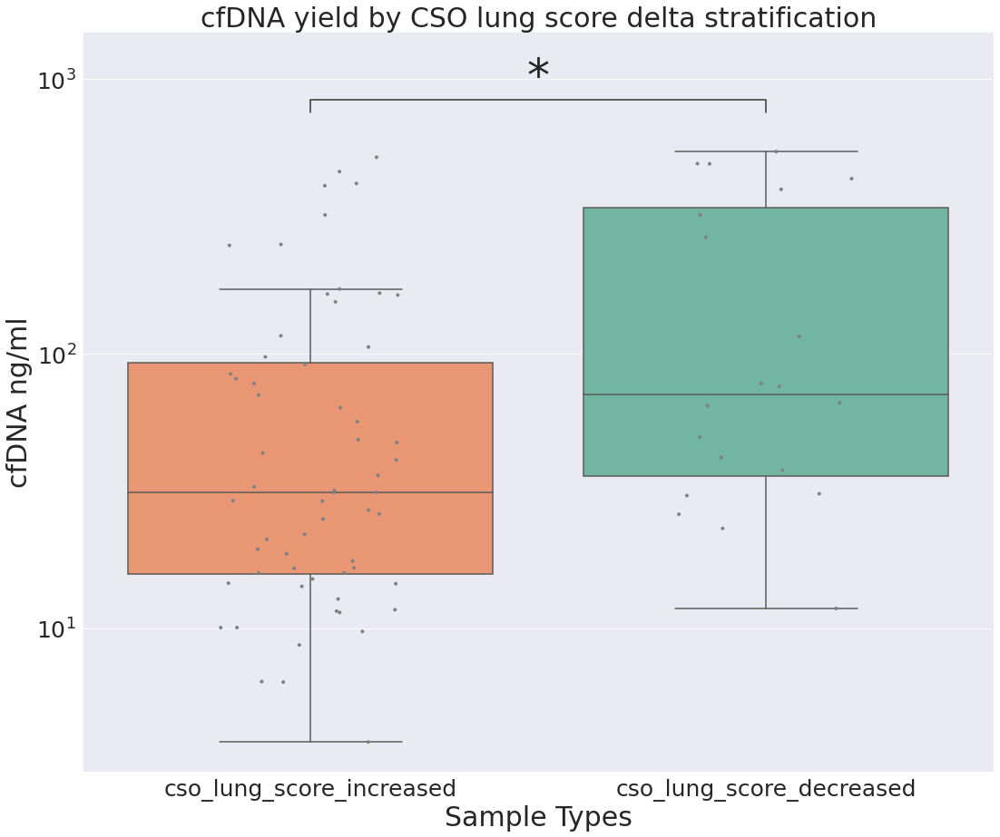

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

cso_breast_score_decreased vs. cso_breast_score_increased: t-test independent samples, P_val:2.518e-01 t=-1.155e+00


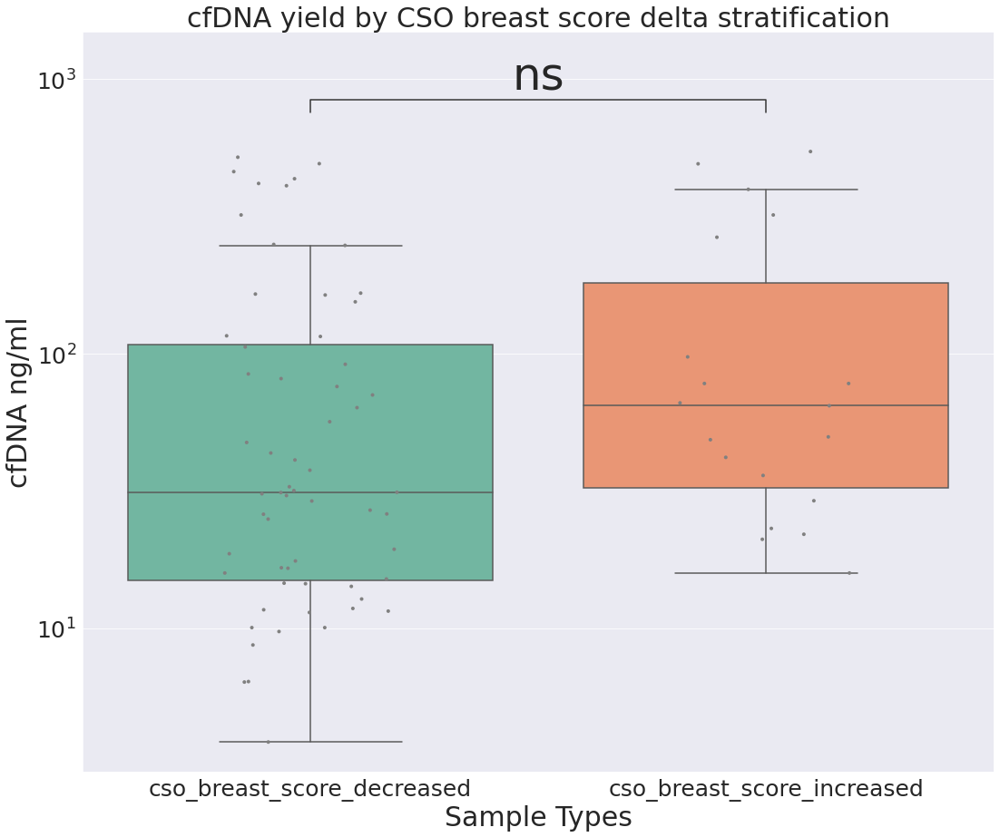

In [35]:
cfDNA_deta_plot(df_paired_gilead_lung_delta_plot, "cso_lung_score_increased", 'cfDNA yield by CSO lung score delta stratification')
cfDNA_deta_plot(df_paired_gilead_breast_delta_plot, "cso_breast_score_increased", 'cfDNA yield by CSO breast score delta stratification')

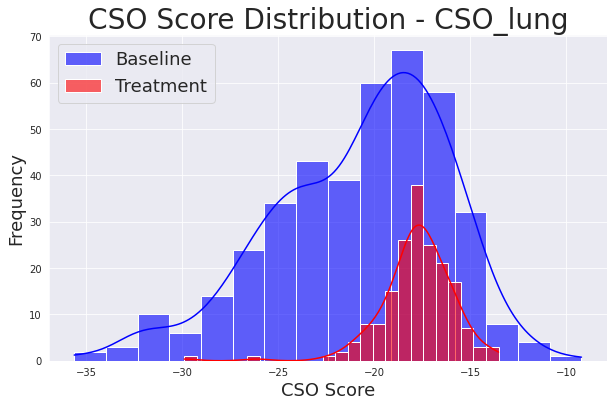

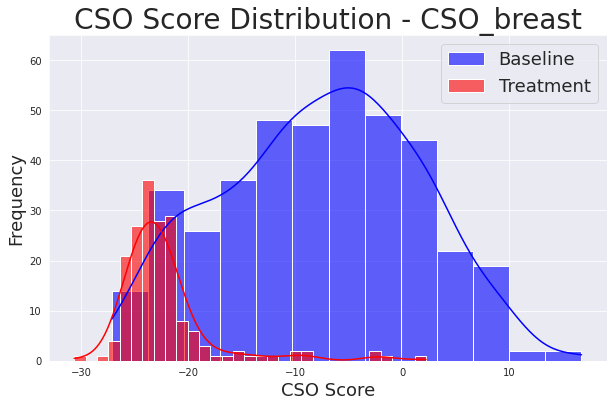

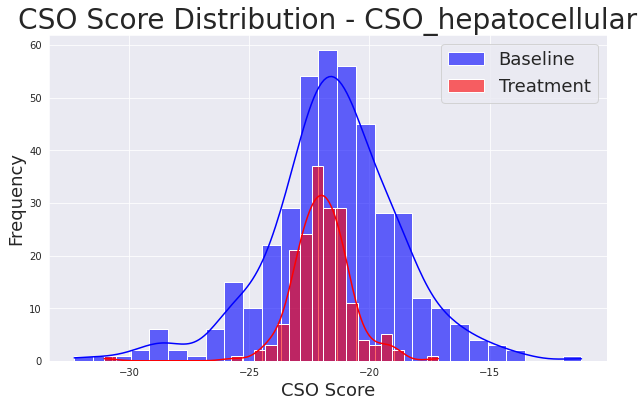

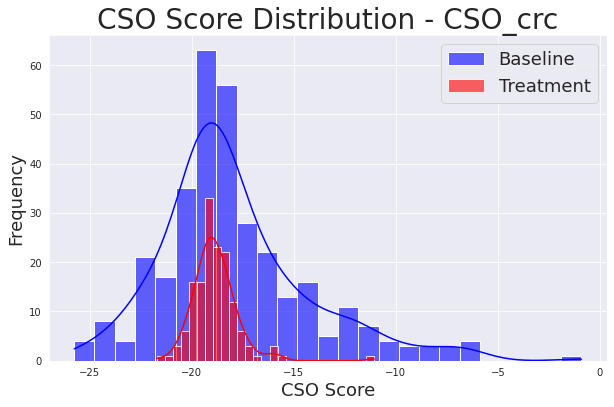

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


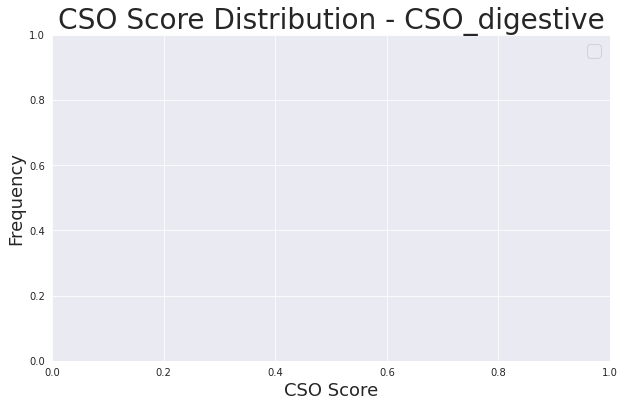

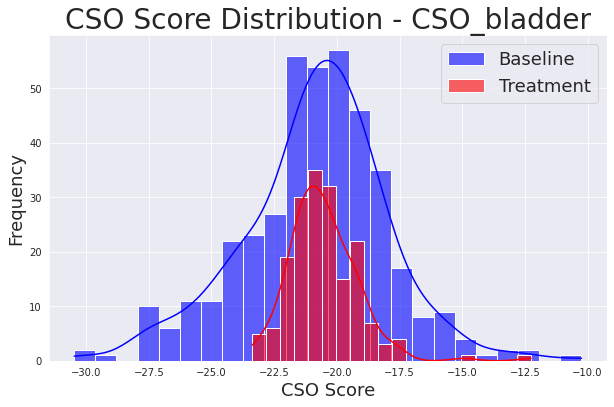

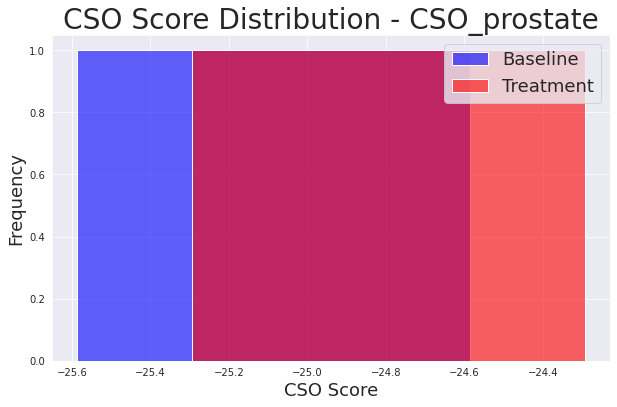

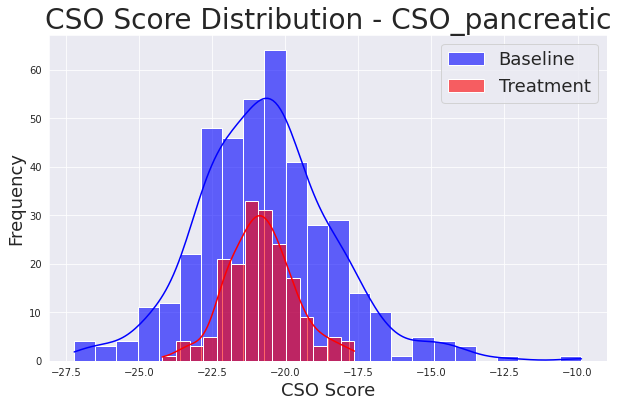

In [140]:
def plot_histogram(data, CSO_pred_type):
    baseline_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]['cso_score']
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]['cso_score']
    
    plt.figure(figsize=(10, 6))
    sns.histplot(baseline_data, color="blue", kde=True, label='Baseline', alpha=0.6)
    sns.histplot(treatment_data, color="red", kde=True, label='Treatment', alpha=0.6)
    plt.xlabel('CSO Score', fontsize = 18)
    plt.ylabel('Frequency', fontsize = 18)
    plt.title(f'CSO Score Distribution - {CSO_pred_type}', fontsize = 28)
    plt.legend(fontsize = 18)
    plt.show()

plot_histogram(top_8_prd_df_sub, 'CSO_lung')
plot_histogram(top_8_prd_df_sub, 'CSO_breast')
plot_histogram(top_8_prd_df_sub, 'CSO_hepatocellular')
plot_histogram(top_8_prd_df_sub, 'CSO_crc')
plot_histogram(top_8_prd_df_sub, 'CSO_digestive')
plot_histogram(top_8_prd_df_sub, 'CSO_bladder')
plot_histogram(top_8_prd_df_sub, 'CSO_prostate')
plot_histogram(top_8_prd_df_sub, 'CSO_pancreatic')

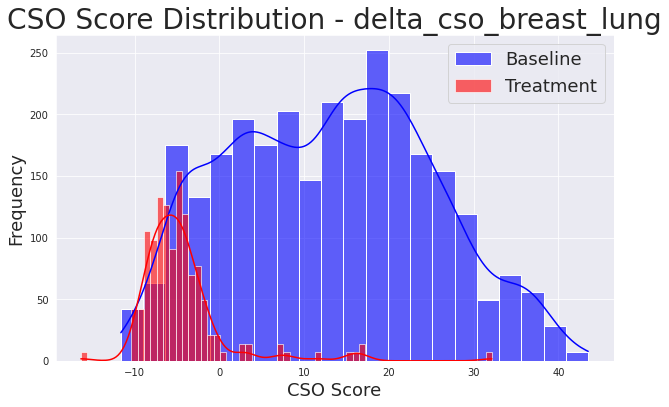

In [19]:
# Get the delta between CSO_lung and CSO_breast can reflect the relative relationship of breast cancer signal and lung damage.

# Step 1: Filter for relevant cso_model_type
filtered_df = top_8_prd_df_sub[top_8_prd_df_sub['cso_model_type'].isin(['CSO_breast', 'CSO_lung'])]

# Step 2: Pivot to get cso_scores for breast and lung in separate columns for each GHSampleID
pivot_df = filtered_df.pivot_table(index='GHSampleID', columns='cso_model_type', values='cso_score', aggfunc='first')

# Step 3: Calculate the delta of cso_scores between CSO_breast and CSO_lung
pivot_df['delta_cso_breast_lung'] = pivot_df['CSO_breast'] - pivot_df['CSO_lung']

# Step 4: Merge this delta back into the original DataFrame
# Ensuring that pivot_df's index is properly set for the merge
pivot_df.reset_index(inplace=True)
top_8_prd_df_sub = top_8_prd_df_sub.merge(pivot_df[['GHSampleID', 'delta_cso_breast_lung']], on='GHSampleID', how='left')

# Verify the new column
top_8_prd_df_sub[['GHSampleID', 'delta_cso_breast_lung']].head()


baseline_data = top_8_prd_df_sub[(top_8_prd_df_sub['treatment'] == 'Baseline')]['delta_cso_breast_lung']
treatment_data = top_8_prd_df_sub[(top_8_prd_df_sub['treatment'] == 'Treatment')]['delta_cso_breast_lung']

plt.figure(figsize=(10, 6))
sns.histplot(baseline_data, color="blue", kde=True, label='Baseline', alpha=0.6)
sns.histplot(treatment_data, color="red", kde=True, label='Treatment', alpha=0.6)
plt.xlabel('CSO Score', fontsize = 18)
plt.ylabel('Frequency', fontsize = 18)
plt.title(f'CSO Score Distribution - delta_cso_breast_lung', fontsize = 28)
plt.legend(fontsize = 18)
plt.show()


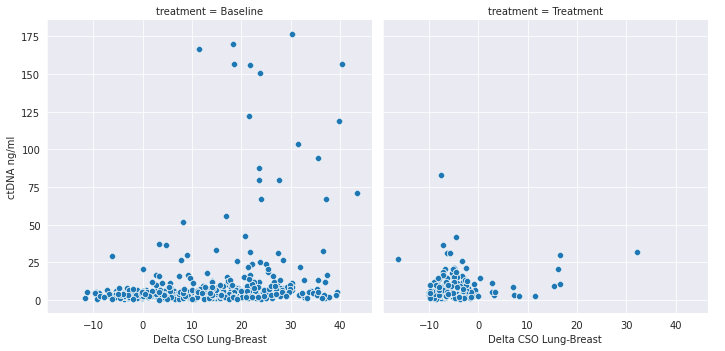

                            OLS Regression Results                            
Dep. Variable:        cfDNA_ng_per_ml   R-squared:                       0.069
Model:                            OLS   Adj. R-squared:                  0.069
Method:                 Least Squares   F-statistic:                     209.1
Date:                Thu, 27 Jun 2024   Prob (F-statistic):           8.79e-46
Time:                        10:47:03   Log-Likelihood:                -13009.
No. Observations:                2828   AIC:                         2.602e+04
Df Residuals:                    2826   BIC:                         2.603e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     4.14

In [62]:
import statsmodels.api as sm

top_8_prd_df = top_8_prd_df_sub.copy()

# Filtering out a specific treatment for clarity in the dataset
top_8_prd_df = top_8_prd_df[top_8_prd_df['treatment'] != 'other']

# Calculate cfDNA_ng per ml if not already calculated
top_8_prd_df['cfDNA_ng_per_ml'] = top_8_prd_df['cfDNA_ng'] / top_8_prd_df['Plasma_ml_input']

# Replace infinities with NaN
top_8_prd_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows where any NaN values in 'delta_cso_breast_lung' or 'cfDNA_ng_per_ml'
top_8_prd_df = top_8_prd_df.dropna(subset=['delta_cso_breast_lung', 'cfDNA_ng_per_ml'])

# Visualize the relationship using FacetGrid
g = sns.FacetGrid(top_8_prd_df, col="treatment", height=5)
g.map_dataframe(sns.scatterplot, 'delta_cso_breast_lung', 'cfDNA_ng_per_ml')
g.set_axis_labels("Delta CSO Lung-Breast", "ctDNA ng/ml")
g.add_legend()
plt.show()

# Prepare data for regression analysis
baseline_data = top_8_prd_df[top_8_prd_df['treatment'] == 'Baseline']
baseline_data = sm.add_constant(baseline_data)  # Adding a constant for the intercept in the regression model

# Conduct OLS regression
model = sm.OLS(baseline_data['cfDNA_ng_per_ml'], baseline_data[['const', 'delta_cso_breast_lung']])
results = model.fit()

# Display the results
print(results.summary())


In [154]:
from scipy.stats import ttest_ind

def perform_ttest(data, CSO_pred_type):
    baseline_scores = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]['cso_score']
    treatment_scores = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]['cso_score']
    
    t_stat, p_value = ttest_ind(baseline_scores, treatment_scores, equal_var=False)  # Assuming unequal variances
    print(f'T-test results for {CSO_pred_type} - Baseline vs. Treatment:\nT-Statistic: {t_stat}, P-value: {p_value}')
    # Calculating mean values
    baseline_mean = baseline_scores.mean()
    treatment_mean = treatment_scores.mean()
    print(f'Mean Baseline score: {baseline_mean}, Mean Treatment score: {treatment_mean}')



perform_ttest(top_8_prd_df_sub, 'CSO_lung')
perform_ttest(top_8_prd_df_sub, 'CSO_breast')



T-test results for CSO_lung - Baseline vs. Treatment:
T-Statistic: -11.005597541766182, P-value: 1.00614281124226e-25
Mean Baseline score: -20.76954763097779, Mean Treatment score: -17.801135416722946
T-test results for CSO_breast - Baseline vs. Treatment:
T-Statistic: 25.610806856907505, P-value: 4.803253827991101e-97
Mean Baseline score: -7.695148765581018, Mean Treatment score: -22.225881032217362


##### evaluate how significant between top1 and top2 CSO prediction of pan-cancer negative, treatment CSO lung prediction samples in Daiichi and AZ cohort

In [36]:
# Select Top2 CSO prediction treatment CSO lung samples in Daiichi SOW21
top_8_prd_df_sub_filtered = top_8_prd_df_sub[(top_8_prd_df_sub['CSO_rank'] < 3) & (top_8_prd_df_sub['Pancancer_call'] == False) & (top_8_prd_df_sub['treatment'] == "Treatment")]
sample_list = top_8_prd_df_sub_filtered[(top_8_prd_df_sub_filtered['CSO_rank'] == 1) & (top_8_prd_df_sub_filtered['cso_prediction'] == 'lung')]['GHSampleID'].values
top_8_prd_df_sub_filtered_1 = top_8_prd_df_sub_filtered[top_8_prd_df_sub_filtered['GHSampleID'].isin(sample_list)]
print('Total treatment CSO lung prediction samples (TOP2) in Daiichi are ' + str(top_8_prd_df_sub_filtered_1.shape[0]))

# Select Top2 CSO prediction treatment CSO lung samples in AZ183

top_8_prd_df_az183_filtered = top_8_prd_df_az183[(top_8_prd_df_az183['CSO_rank'] < 3) & (top_8_prd_df_az183['Pancancer_call'] == False) & (top_8_prd_df_az183['treatment'] == "Treatment")]
sample_list_az = top_8_prd_df_az183_filtered[(top_8_prd_df_az183_filtered['CSO_rank'] == 1) & (top_8_prd_df_az183_filtered['cso_prediction'] == 'lung')]['GHSampleID'].values
top_8_prd_df_az183_filtered_1 = top_8_prd_df_az183_filtered[top_8_prd_df_az183_filtered['GHSampleID'].isin(sample_list_az)]
print('Total treatment CSO lung prediction samples (TOP2) in AZ are ' + str(top_8_prd_df_az183_filtered_1.shape[0]))

Total treatment CSO lung prediction samples (TOP2) in Daiichi are 220
Total treatment CSO lung prediction samples (TOP2) in AZ are 162


Paired t-test t-statistic: 16.158633651332, p-value: 1.0534883252909694e-30
Mean difference: 1.8032031001971445, Standard Deviation of differences: 1.1704054979789185
Pearson correlation: 0.8471670381622205 (p-value: 1.9668306629955251e-31)
Spearman correlation: 0.7983274350246827 (p-value: 1.5619418021043011e-25)


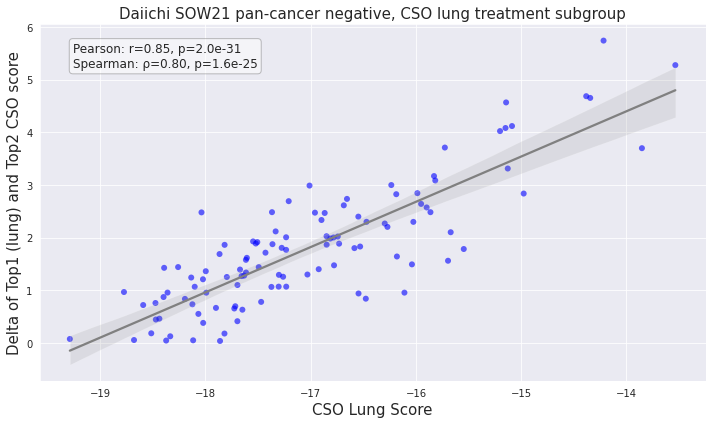

In [37]:
from scipy.stats import ttest_rel, pearsonr, spearmanr

# Load DataFrame
df = top_8_prd_df_sub_filtered_1
# df = top_8_prd_df_az183_filtered_1

# Filter to get only top 1 and top 2 ranks
df_top1 = df[df['CSO_rank'] == 1]
df_top2 = df[df['CSO_rank'] == 2]

# Merge the top 1 and top 2 DataFrames on 'unique_sample_id'
df_merged = pd.merge(df_top1, df_top2, on='unique_sample_id', suffixes=('_top1', '_top2'))

# Calculate the difference between top 1 and top 2 scores
df_merged['score_difference'] = df_merged['cso_score_top1'] - df_merged['cso_score_top2']

# Performing a paired t-test
t_stat, p_value = ttest_rel(df_merged['cso_score_top1'], df_merged['cso_score_top2'])
mean_diff = df_merged['score_difference'].mean()
std_diff = df_merged['score_difference'].std()

# Calculate Pearson and Spearman correlations
pearson_corr, pearson_p_val = pearsonr(df_merged['cso_score_top1'], df_merged['score_difference'])
spearman_corr, spearman_p_val = spearmanr(df_merged['cso_score_top1'], df_merged['score_difference'])

# Print the t-test results, mean difference, and correlation results
print(f"Paired t-test t-statistic: {t_stat}, p-value: {p_value}")
print(f"Mean difference: {mean_diff}, Standard Deviation of differences: {std_diff}")
print(f"Pearson correlation: {pearson_corr} (p-value: {pearson_p_val})")
print(f"Spearman correlation: {spearman_corr} (p-value: {spearman_p_val})")

# Plotting the scatter plot with regression line of score differences vs. top 1 score
plt.figure(figsize=(10, 6))
sns.scatterplot(x='cso_score_top1', y='score_difference', data=df_merged, alpha=0.6, edgecolor='none', color='blue')
sns.regplot(x='cso_score_top1', y='score_difference', data=df_merged, scatter=False, color="gray")
plt.title('Daiichi SOW21 pan-cancer negative, CSO lung treatment subgroup', fontsize = 15)
plt.xlabel('CSO Lung Score', fontsize = 15)
plt.ylabel('Delta of Top1 (lung) and Top2 CSO score', fontsize = 15)
plt.grid(True)

# Annotate correlation results on the plot
plt.text(0.05, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
         ha='left', va='top', transform=plt.gca().transAxes, fontsize=12,
         bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))

plt.tight_layout()
plt.show()


##### check the CSO score distribution for other control cohorts

In [32]:
# Gilead SOW3
print("Total size of this Gilead SOW3 is " + str(top_8_prd_df_gliead.shape[0]) + "\n") 
top_8_prd_df_gliead.head()

# AZ SOW183
print("Total size of this AZ SOW183 is " + str(top_8_prd_df_az183.shape[0]) + "\n") 

Total size of this Gilead SOW3 is 1816

Total size of this AZ SOW183 is 6118



In [42]:
# Then, assign treatment information to the "treatment" column for Gilead SOW3 only
top_8_prd_df_gliead.loc[top_8_prd_df_gliead['Visit_name'] == "BSLJ", ['treatment']] = ["Baseline"]
top_8_prd_df_gliead.loc[top_8_prd_df_gliead['Visit_name'].isin(['C2D1J']), ['treatment']] = ["Treatment"]

# Remove EOT samples
top_8_prd_df_gliead = top_8_prd_df_gliead[top_8_prd_df_gliead['treatment'] != 'other']
top_8_prd_df_gliead.treatment.value_counts()


Baseline     942
Treatment    874
Name: treatment, dtype: int64

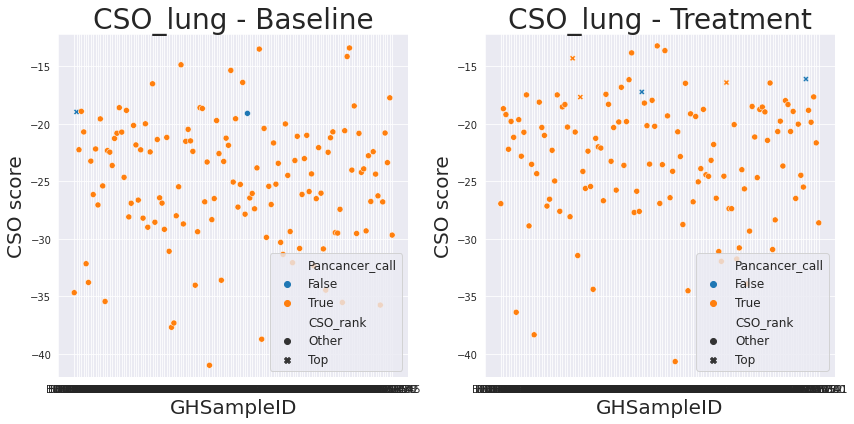

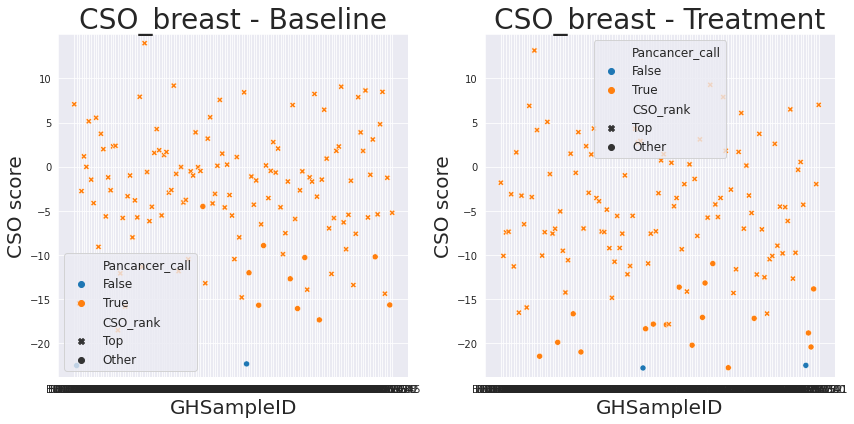

(80, 117)


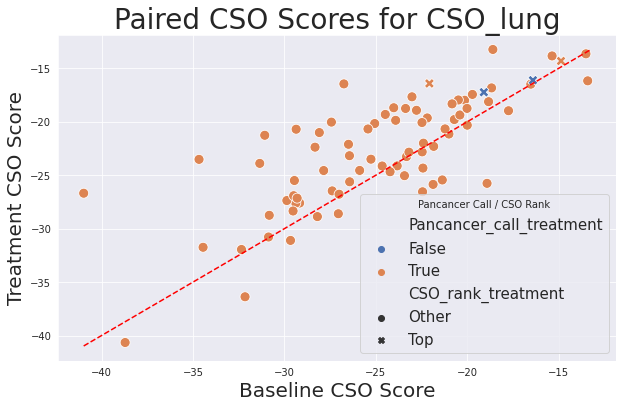

(79, 117)


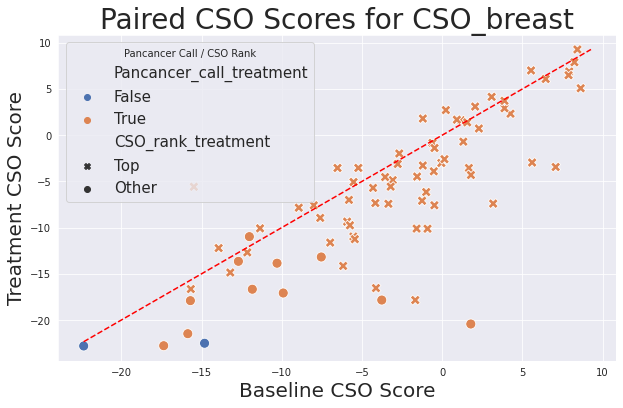

In [62]:
plot_cso_lung_scores(top_8_prd_df_gliead, 'CSO_lung')
plot_cso_lung_scores(top_8_prd_df_gliead, 'CSO_breast')

plot_and_compare_paired_cso_scores(top_8_prd_df_gliead, 'CSO_lung')
plot_and_compare_paired_cso_scores(top_8_prd_df_gliead, 'CSO_breast')


In [153]:
from scipy.stats import ttest_ind
def perform_ttest(data, CSO_pred_type):
    baseline_scores = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]['cso_score']
    treatment_scores = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]['cso_score']
    
    t_stat, p_value = ttest_ind(baseline_scores, treatment_scores, equal_var=False)  # Assuming unequal variances
    print(f'T-test results for {CSO_pred_type} - Baseline vs. Treatment:\nT-Statistic: {t_stat}, P-value: {p_value}')
    # Calculating mean values
    baseline_mean = baseline_scores.mean()
    treatment_mean = treatment_scores.mean()
    print(f'Mean Baseline score: {baseline_mean}, Mean Treatment score: {treatment_mean}')

perform_ttest(top_8_prd_df_gliead, 'CSO_lung')
perform_ttest(top_8_prd_df_gliead, 'CSO_breast')

T-test results for CSO_lung - Baseline vs. Treatment:
T-Statistic: -3.0650555504784105, P-value: 0.0024077999093989767
Mean Baseline score: -24.959271686043117, Mean Treatment score: -22.95288267162966
T-test results for CSO_breast - Baseline vs. Treatment:
T-Statistic: 3.646099091352534, P-value: 0.00032462761834233477
Mean Baseline score: -3.1227823889660202, Mean Treatment score: -6.526756052135155


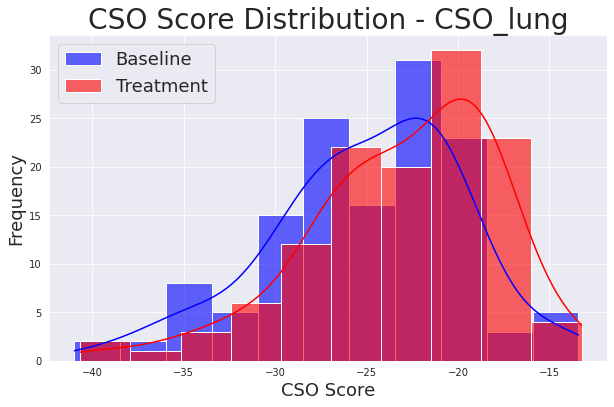

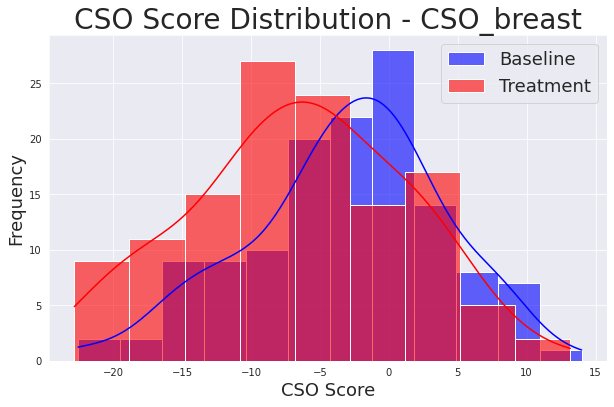

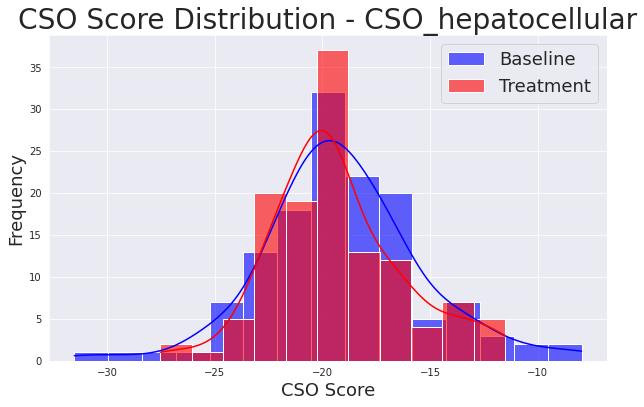

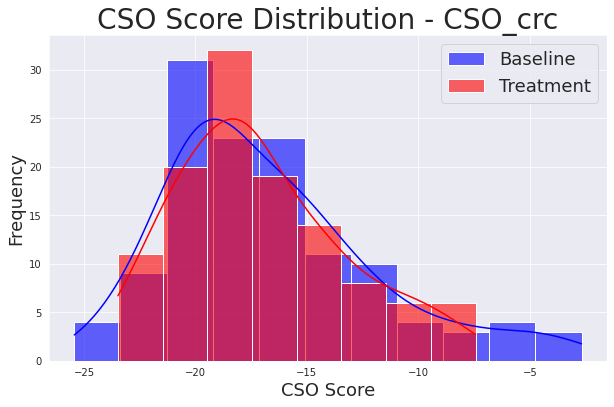

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


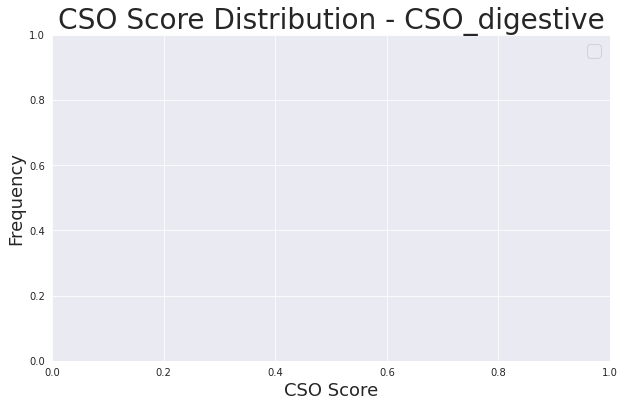

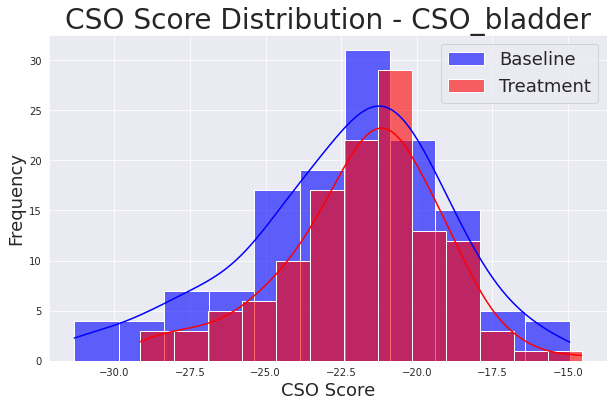

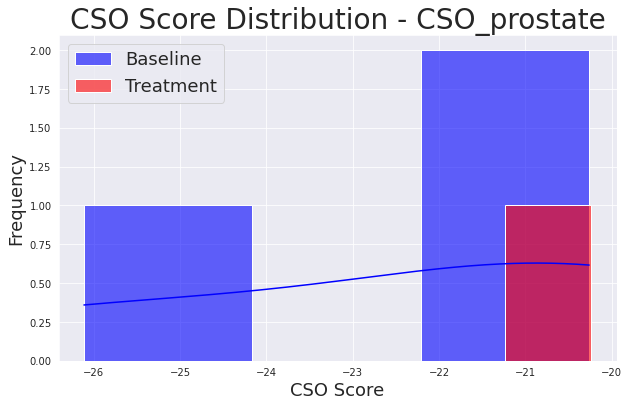

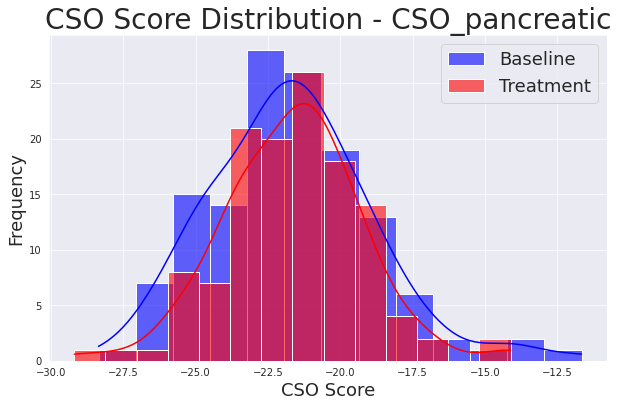

In [141]:
# Gilead SOW3
plot_histogram(top_8_prd_df_gliead, 'CSO_lung')
plot_histogram(top_8_prd_df_gliead, 'CSO_breast')
plot_histogram(top_8_prd_df_gliead, 'CSO_hepatocellular')
plot_histogram(top_8_prd_df_gliead, 'CSO_crc')
plot_histogram(top_8_prd_df_gliead, 'CSO_digestive')
plot_histogram(top_8_prd_df_gliead, 'CSO_bladder')
plot_histogram(top_8_prd_df_gliead, 'CSO_prostate')
plot_histogram(top_8_prd_df_gliead, 'CSO_pancreatic')

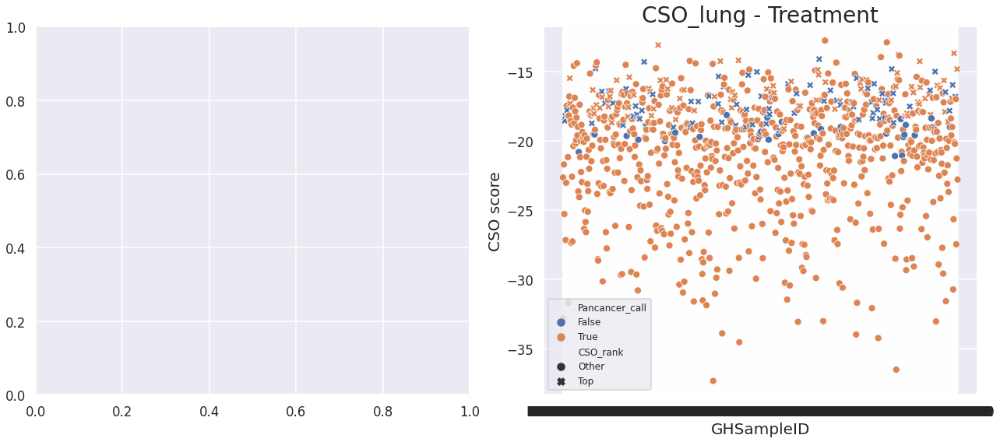

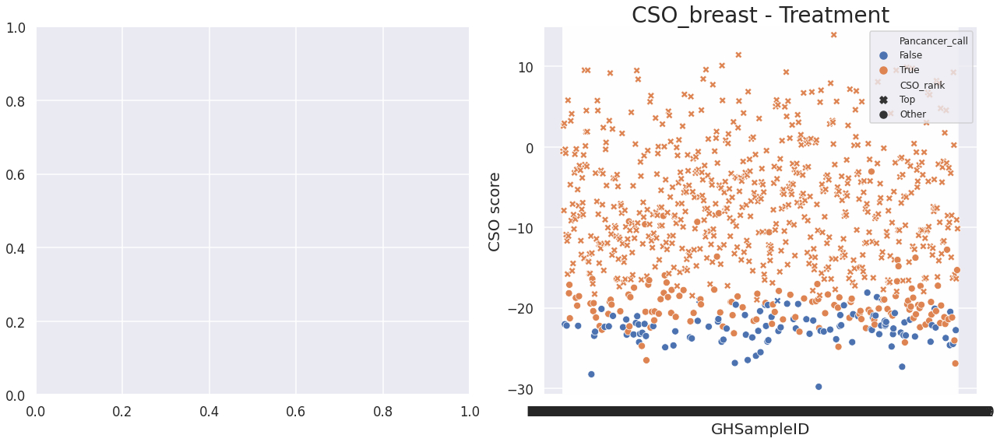

In [169]:
def plot_cso_lung_scores_treatment(data, CSO_pred_type):
    sns.set_style('darkgrid')
    # Filter for CSO lung / CSO breast data
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]
    
    # Define subplot structure
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))
    
    # Determine common y-axis limits based on overall data
    y_min = treatment_data['cso_score'].min() - 1
    y_max = treatment_data['cso_score'].max() + 1

    # Treatment plot
    sns.scatterplot(x='GHSampleID', y='cso_score', data=treatment_data, hue='Pancancer_call', 
                    style=treatment_data['CSO_rank'].apply(lambda x: 'Top' if x == 1 else 'Other'), 
                    markers={'Top': 'X', 'Other': 'o'}, ax=axs[1])
    axs[1].set_title(f'{CSO_pred_type} - Treatment', fontsize = 28)
    axs[1].set_ylim([y_min, y_max])
    axs[1].set_ylabel('CSO score', fontsize=20)
    axs[1].set_xlabel('GHSampleID', fontsize=20)
    axs[1].legend(fontsize=12)

    plt.tight_layout()
    plt.show()

plot_cso_lung_scores_treatment(top_8_prd_df_az183, 'CSO_lung')
plot_cso_lung_scores_treatment(top_8_prd_df_az183, 'CSO_breast')




#### cfDNA evaluation evluation

In [23]:
# Define a new column called "CSO_Lung_Sample" to indicate if this sample is High CSO lung prediction for all the sample not just limited to treatment

target_files = [
    "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv"
    # "20221227_GileadSciences_SOW03_750Samples_InfinityReport.csv",
    # "20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv"
    # "20221007_TheInstituteOfCancerResearch_SOW01_78Samples_InfinityReport.csv"
]

top_prd_df_sub = top_prd_df[top_prd_df['csv_file_name'].isin(target_files)]

# Extract the GHSampleIDs from df_lung_cso_treatment
# all_cso_lung_samples = df_lung_cso['GHSampleID'].unique()
all_cso_lung_samples = df_lung_cso_treatment['GHSampleID'].unique()

# Create a new column that will be True if the sample is in all_cso_lung_samples
top_prd_df_sub['CSO_Lung_Sample'] = top_prd_df_sub['GHSampleID'].isin(all_cso_lung_samples)

# Create a new column for plotting that combines original cancer types and the new category
top_prd_df_sub['CSO_Lung_Sample'] = top_prd_df_sub.apply(
    lambda row: 'CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
    axis=1
)

# Remove missing values in cfDNA_ng before plotting
top_prd_df_sub = top_prd_df_sub.dropna(subset=['cfDNA_ng'])
top_prd_df_sub = top_prd_df_sub.dropna(subset=['Plasma_ml_input'])

# Remove EOT samples
top_prd_df_sub = top_prd_df_sub[top_prd_df_sub['treatment'] != 'other']

print(top_prd_df_sub.CSO_Lung_Sample.value_counts())

top_prd_df_sub.head()

Provided Cancer type: breast    463
CSO_lung_Samples                122
Name: CSO_Lung_Sample, dtype: int64


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample
4086,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_breast,-14.140784,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,0.54,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,breast,1,Breast,Provided Cancer type: breast
4087,B00460891_230812_A01810_0184_AH7GK3DSX7,0.392185,CSO_breast,-3.497001,DS8201-A-U302,A0808357,B00460891,32012004,C1D1,SUCCESS,NaN,5.94,12.532,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.combined.hdr.tsv,B00460891,Female,Female,breast,1,Breast,Provided Cancer type: breast
4088,B00460892_230812_A01810_0184_AH7GK3DSX7,-14.477896,CSO_breast,-11.522599,DS8201-A-U302,A0808359,B00460892,33102003,C1D1,SUCCESS,NaN,0.74,6.396,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460892/B00460892.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460892/B00460892.ghcnv_qc.combined.hdr.tsv,B00460892,Female,Female,breast,1,Breast,Provided Cancer type: breast
4089,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_breast,1.651901,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,7.19,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c

In [24]:
# all CSO_lung vs all other pan-cancer negative samples
top_prd_df_sub_1 = top_prd_df_sub[~((top_prd_df_sub['CSO_Lung_Sample'] == 'Provided Cancer type: breast') & (top_prd_df_sub['Pancancer_call'] == True))]
print(top_prd_df_sub_1.groupby('CSO_Lung_Sample').Pancancer_call.value_counts())

# all CSO_lung treatment vs all other pan-cancer negative samples
top_prd_df_sub_2 = top_prd_df_sub_1[~((top_prd_df_sub_1['CSO_Lung_Sample'] == 'CSO_lung_Samples') & (top_prd_df_sub_1['treatment'] == 'Baseline'))]
print(top_prd_df_sub_2.groupby('CSO_Lung_Sample').treatment.value_counts())

# all CSO_lung pan-cancer negative treatment vs all other pan-cancer negative samples
top_prd_df_sub_3 = top_prd_df_sub_2[top_prd_df_sub_2["Pancancer_call"] == False]
top_prd_df_sub_3 = top_prd_df_sub[top_prd_df_sub["Pancancer_call"] == False]

print(top_prd_df_sub_3.groupby('CSO_Lung_Sample').treatment.value_counts())


CSO_Lung_Sample               Pancancer_call
CSO_lung_Samples              False             110
                              True               12
Provided Cancer type: breast  False              73
Name: Pancancer_call, dtype: int64
CSO_Lung_Sample               treatment
CSO_lung_Samples              Treatment    122
Provided Cancer type: breast  Treatment     37
                              Baseline      36
Name: treatment, dtype: int64
CSO_Lung_Sample               treatment
CSO_lung_Samples              Treatment    110
Provided Cancer type: breast  Treatment     37
                              Baseline      36
Name: treatment, dtype: int64


268
Not Detected    94
Detected        13
Name: Tumor_methylation_status, dtype: int64


<Axes: >

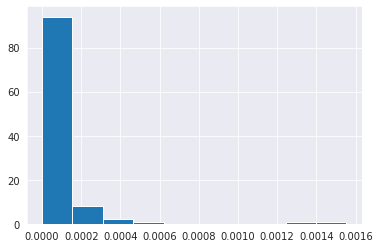

In [57]:
# Readin Daiichi SOW21 with S3 MB breast caller report by Jing
df_daiichi_report = pd.read_csv("/ghsfa/projects/pharma/customers/DaiichiSankyoUS/Infinity/DSI_SOW21_Infinity/DSI_SOW21_Infinity_01/data/report/20240430_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv", header=1)
df_daiichi_report = df_daiichi_report[df_daiichi_report['Sample_status'] == 'SUCCESS']
df_daiichi_report = df_daiichi_report.drop_duplicates(subset = "GHSampleID")

target_sample_list_negative = df_daiichi_report[df_daiichi_report['Tumor_methylation_status'] == 'Not Detected']['GHSampleID'].values
print(len(target_sample_list_negative))

# Check the precentage of S3 MB breast caller in CSO_lung pancancer negative samples
target_sample_list = top_prd_df_sub_3[top_prd_df_sub_3['CSO_Lung_Sample'] == 'CSO_lung_Samples']['GHSampleID'].values
df_daiichi_report_1 = df_daiichi_report[df_daiichi_report['GHSampleID'].isin(target_sample_list)]
df_daiichi_report_1.shape

print(df_daiichi_report_1.Tumor_methylation_status.value_counts())
df_daiichi_report_1.Tumor_methylation_score.hist()

In [58]:
# all CSO_lung pan-cancer negative treatment vs all other pan-cancer negative samples by S3 MB breast caller
top_prd_df_sub_4 = top_prd_df_sub[top_prd_df_sub["GHSampleID"].isin(target_sample_list_negative)]
# top_prd_df_sub_4 = top_prd_df_sub_4[top_prd_df_sub_4['treatment'] == 'Treatment']
top_prd_df_sub_4.shape

(156, 60)

In [25]:
# For later control cohort analysis

# Gilead SOW3
top_prd_df_gliead = top_prd_df[top_prd_df['csv_file_name'].isin(["20221227_GileadSciences_SOW03_750Samples_InfinityReport.csv"])]
print("Total size of this Gilead SOW3 is " + str(top_prd_df_gliead.shape[0]) + "\n") 

# Extract the GHSampleIDs from df_lung_cso
all_cso_lung_samples = df_lung_cso['GHSampleID'].unique()
all_cso_lung_samples = df_lung_cso_treatment['GHSampleID'].unique()

# Create a new column that will be True if the sample is in all_cso_lung_samples
top_prd_df_gliead['CSO_Lung_Sample'] = top_prd_df_gliead['GHSampleID'].isin(all_cso_lung_samples)

# Create a new column for plotting that combines original cancer types and the new category
top_prd_df_gliead['CSO_Lung_Sample'] = top_prd_df_gliead.apply(
    lambda row: 'CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
    axis=1
)

# Remove missing values in cfDNA_ng before plotting
top_prd_df_gliead = top_prd_df_gliead.dropna(subset=['cfDNA_ng'])
top_prd_df_gliead = top_prd_df_gliead.dropna(subset=['Plasma_ml_input'])


# Then, assign treatment information to the "treatment" column for Gilead SOW3 only
top_prd_df_gliead.loc[top_prd_df_gliead['Visit_name'] == "BSLJ", ['treatment']] = ["Baseline"]
top_prd_df_gliead.loc[top_prd_df_gliead['Visit_name'].isin(['C2D1J']), ['treatment']] = ["Treatment"]

# Remove EOT samples
top_prd_df_gliead = top_prd_df_gliead[top_prd_df_gliead['treatment'] != 'other']
print("Gilead SOW3 " + str(top_prd_df_gliead.treatment.value_counts()) +  "\n")
print("Gilead SOW3 " + str(top_prd_df_gliead.CSO_Lung_Sample.value_counts()) +  "\n")

Total size of this Gilead SOW3 is 420

Gilead SOW3 Baseline     135
Treatment    125
Name: treatment, dtype: int64

Gilead SOW3 Provided Cancer type: breast    255
CSO_lung_Samples                  5
Name: CSO_Lung_Sample, dtype: int64



In [26]:
# all CSO_lung vs all other pan-cancer negative samples
top_prd_df_gliead_1 = top_prd_df_gliead[~((top_prd_df_gliead['CSO_Lung_Sample'] == 'Provided Cancer type: breast') & (top_prd_df_gliead['Pancancer_call'] == True))]
print(top_prd_df_gliead_1.groupby('CSO_Lung_Sample').Pancancer_call.value_counts())

# all CSO_lung treatment vs all other pan-cancer negative samples
top_prd_df_gliead_2 = top_prd_df_gliead_1[~((top_prd_df_gliead_1['CSO_Lung_Sample'] == 'CSO_lung_Samples') & (top_prd_df_gliead_1['treatment'] == 'Baseline'))]
print(top_prd_df_gliead_2.groupby('CSO_Lung_Sample').treatment.value_counts())

# all CSO_lung treatment pan-cancer negative samples vs all other pan-cancer negative samples
top_prd_df_gliead_3 = top_prd_df_gliead_2[top_prd_df_gliead_2["Pancancer_call"] == False]
top_prd_df_gliead_3.groupby('CSO_Lung_Sample').treatment.value_counts()

CSO_Lung_Sample               Pancancer_call
CSO_lung_Samples              True              3
                              False             2
Provided Cancer type: breast  False             2
Name: Pancancer_call, dtype: int64
CSO_Lung_Sample               treatment
CSO_lung_Samples              Treatment    5
Provided Cancer type: breast  Baseline     2
Name: treatment, dtype: int64


CSO_Lung_Sample               treatment
CSO_lung_Samples              Treatment    2
Provided Cancer type: breast  Baseline     2
Name: treatment, dtype: int64

In [27]:
# Control cohort AZ SOW183 and corresponding paired baseline samples in AZ SOW117

# AZ SOW183
top_prd_df_az183 = top_prd_df[top_prd_df['csv_file_name'].isin(["20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv"])]
print("Total size of this AZ SOW183 is " + str(top_prd_df_az183.shape[0]) + "\n") 

# Extract the GHSampleIDs from df_lung_cso_treatment
# all_cso_lung_samples = df_lung_cso['GHSampleID'].unique()
all_cso_lung_samples = df_lung_cso_treatment['GHSampleID'].unique()

# Create a new column that will be True if the sample is in all_cso_lung_samples
top_prd_df_az183['CSO_Lung_Sample'] = top_prd_df_az183['GHSampleID'].isin(all_cso_lung_samples)

# Create a new column for plotting that combines original cancer types and the new category
top_prd_df_az183['CSO_Lung_Sample'] = top_prd_df_az183.apply(
    lambda row: 'CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
    axis=1
)

# Remove missing values in cfDNA_ng before plotting
top_prd_df_az183 = top_prd_df_az183.dropna(subset=['cfDNA_ng'])
top_prd_df_az183 = top_prd_df_az183.dropna(subset=['Plasma_ml_input'])


# Remove EOT samples
top_prd_df_az183 = top_prd_df_az183[top_prd_df_az183['treatment'] != 'other']
print("AZ SOW183 " + str(top_prd_df_az183.treatment.value_counts()) +  "\n")
print("AZ SOW183 " + str(top_prd_df_az183.CSO_Lung_Sample.value_counts()) +  "\n")

top_prd_df_az183.head()

Total size of this AZ SOW183 is 876

AZ SOW183 Treatment    876
Name: treatment, dtype: int64

AZ SOW183 Provided Cancer type: breast    707
CSO_lung_Samples                169
Name: CSO_Lung_Sample, dtype: int64



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample
16963,B00640392_240411_A01020_0776_BH37JNDSXC,-0.343106,CSO_breast,-0.544965,D9268C00001,A0988598,B00640392,E7801003,C2D1,SUCCESS,NaN,NaN,37.60,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,GAGCAAACCC,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988598,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392/B00640392.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392/B00640392.ghcnv_qc.combined.hdr.tsv,B00640392,Female,Female,breast,1,Breast,Provided Cancer type: breast
16964,B00640395_240411_A01020_0776_BH37JNDSXC,5.092291,CSO_breast,2.605303,D9268C00001,A0988597,B00640395,E7801002,C2D1,SUCCESS,NaN,NaN,11.96,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,TGGCCTGAGC,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988597,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395/B00640395.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395/B00640395.ghcnv_qc.combined.hdr.tsv,B00640395,Female,Female,breast,1,Breast,Provided Cancer type: breast
16965,B00640398_240411_A01020_0776_BH37JNDSXC,-3.413267,CSO_breast,-7.899741,D9268C00001,A0988596,B00640398,E7002015,C3D1,SUCCESS,NaN,NaN,17.73,3.0,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,CCTTTCCGAT,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988596,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398/B00640398.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398/B00640398.ghcnv_qc.combined.hdr.tsv,B00640398,Female,Female,breast,1,Breast,Provided Cancer type: breast
16966,B00640406_240411_A01020_0776_BH37JNDSXC,4.252119,CSO_breast,2.931992,D9268C00001,A0988591,B00640406,E4105008,C2D1,SUCCESS,NaN,NaN,28.29,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,TCCTTACCGG,Unknown,Research,2024-04-13 02:43:35-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988591,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640406,True,/ghsfa/ivd/f

In [28]:
# Control cohort AZ SOW183 and corresponding paired baseline samples in AZ SOW117

# Control cohort paired baseline samples in AZ SOW117
# Readin data

# List to store the dataframes for final merge
dfs = []

# List to store the dataframes for final merge
folder = f"{work_dir}/AZ_SOW117"

# List all csv files in the folder
for file in os.listdir(folder):
    try:
        file_path = os.path.join(folder, file)
        df = pd.read_csv(file_path, header=1)

        # Select specified columns, handling cases where some columns might not exist
        columns = ['Study_ID', 'GHRequestID', 'GHSampleID', 'Patient_ID', 'Visit_name', 'Max_percentage', 'Sample_status', 'Sample_comment', 'cfDNA_ng', 'Plasma_ml_input', 'Cancertype']
        df_sub = df.loc[:, df.columns.isin(columns)].copy()

        # Drop duplicates based on 'GHSampleID'
        df_sub_dedup = df_sub.drop_duplicates(subset=["GHSampleID"])

        # Append the processed dataframe to the list
        dfs.append(df_sub_dedup)

    except pd.errors.ParserError:
        print(f"Error reading file: {file_path} - possibly incorrect header.")
    except Exception as e:
        print(f"An unexpected error occurred with file: {file_path} - {str(e)}")



# Merge all dataframes into a final DataFrame
df_az117 = pd.concat(dfs, ignore_index=True)

df_az117 = df_az117[df_az117['Sample_status'] == 'SUCCESS']
df_az117 = df_az117.drop_duplicates(subset=["GHSampleID"])


print('total baseline samples for AZ 117 is ' + str(df_az117.shape[0]))
df_az117.head()

total baseline samples for AZ 117 is 597


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype
0,D9268C00001,A0629463,B00272543,E0204001,SCRN,SUCCESS,NaN,1.68,18.1350,3.5,Breast
1,D9268C00001,A0629464,B00272546,E0204002,SCRN,SUCCESS,NaN,25.00,27.4950,3.5,Breast
2,D9268C00001,A0629465,B00272548,E0204003,SCRN,SUCCESS,NaN,20.37,27.1700,3.5,Breast
3,D9268C00001,A0629466,B00272551,E0205006,SCRN,SUCCESS,NaN,5.08,29.5750,3.5,Breast
4,D9268C00001,A0629467,B00271714,E0501012,SCRN,SUCCESS,NaN,0.51,3.2435,1.5,Breast


In [29]:
# merge all AZ 183 and AZ 117 SOW data together
# AZ SOW183
top_prd_df_az183 = top_prd_df[top_prd_df['csv_file_name'].isin(["20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv"])]
print("Total size of this AZ SOW183 is " + str(top_prd_df_az183.shape[0]) + "\n") 

# Concatenate the dataframes
top_prd_df_az = pd.concat([top_prd_df_az183, df_az117], ignore_index=True, sort=False)

# Add the cancer type and treatment information
top_prd_df_az.loc[top_prd_df_az['Visit_name'] == 'SCRN', ['new_defined_cancer_type']] = ["breast"]
top_prd_df_az.loc[top_prd_df_az['Visit_name'] == 'SCRN', ['treatment']] = ["Baseline"]
top_prd_df_az.loc[top_prd_df_az['Visit_name'].isin(['RETEST', 'RETEST*', 'C5D1', 'C6D1']), ['treatment']] = ["other"]

# Remove uncertained treatment samples
top_prd_df_az = top_prd_df_az[top_prd_df_az['treatment'] != 'other']

# fillna with breast
top_prd_df_az['new_defined_cancer_type'] = top_prd_df_az['new_defined_cancer_type'].fillna("breast")

print('total samples for AZ is ' + str(top_prd_df_az.shape[0]))
top_prd_df_az.head()

Total size of this AZ SOW183 is 876

total samples for AZ is 1459


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother
0,B00640392_240411_A01020_0776_BH37JNDSXC,-0.343106,CSO_breast,-0.544965,D9268C00001,A0988598,B00640392,E7801003,C2D1,SUCCESS,NaN,NaN,37.60,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,GAGCAAACCC,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988598,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392/B00640392.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392/B00640392.ghcnv_qc.combined.hdr.tsv,B00640392,Female,Female,breast,1.0,Breast
1,B00640395_240411_A01020_0776_BH37JNDSXC,5.092291,CSO_breast,2.605303,D9268C00001,A0988597,B00640395,E7801002,C2D1,SUCCESS,NaN,NaN,11.96,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,TGGCCTGAGC,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988597,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395/B00640395.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395/B00640395.ghcnv_qc.combined.hdr.tsv,B00640395,Female,Female,breast,1.0,Breast
2,B00640398_240411_A01020_0776_BH37JNDSXC,-3.413267,CSO_breast,-7.899741,D9268C00001,A0988596,B00640398,E7002015,C3D1,SUCCESS,NaN,NaN,17.73,3.0,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,CCTTTCCGAT,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988596,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398/B00640398.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398/B00640398.ghcnv_qc.combined.hdr.tsv,B00640398,Female,Female,breast,1.0,Breast
3,B00640406_240411_A01020_0776_BH37JNDSXC,4.252119,CSO_breast,2.931992,D9268C00001,A0988591,B00640406,E4105008,C2D1,SUCCESS,NaN,NaN,28.29,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,TCCTTACCGG,Unknown,Research,2024-04-13 02:43:35-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988591,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640406,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640406/B00640406.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A0102

In [30]:
# Define the CSO lung sample in top_prd_df_az

# Extract the GHSampleIDs from df_lung_cso
# all_cso_lung_samples = df_lung_cso['GHSampleID'].unique()
all_cso_lung_samples = df_lung_cso_treatment['GHSampleID'].unique()

# Create a new column that will be True if the sample is in all_cso_lung_samples
top_prd_df_az['CSO_Lung_Sample'] = top_prd_df_az['GHSampleID'].isin(all_cso_lung_samples)

# Create a new column for plotting that combines original cancer types and the new category
top_prd_df_az['CSO_Lung_Sample'] = top_prd_df_az.apply(
    lambda row: 'CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
    axis=1
)

# Remove missing values in cfDNA_ng before plotting
top_prd_df_az = top_prd_df_az.dropna(subset=['cfDNA_ng'])
top_prd_df_az = top_prd_df_az.dropna(subset=['Plasma_ml_input'])


# Remove EOT samples
top_prd_df_az = top_prd_df_az[top_prd_df_az['treatment'] != 'other']
print("AZ SOW183&117 " + str(top_prd_df_az.treatment.value_counts()) +  "\n")
print("AZ SOW183&117 " + str(top_prd_df_az.CSO_Lung_Sample.value_counts()) +  "\n")

top_prd_df_az.head()

AZ SOW183&117 Treatment    876
Baseline     583
Name: treatment, dtype: int64

AZ SOW183&117 Provided Cancer type: breast    1290
CSO_lung_Samples                 169
Name: CSO_Lung_Sample, dtype: int64



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample
0,B00640392_240411_A01020_0776_BH37JNDSXC,-0.343106,CSO_breast,-0.544965,D9268C00001,A0988598,B00640392,E7801003,C2D1,SUCCESS,NaN,NaN,37.60,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,GAGCAAACCC,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988598,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392/B00640392.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392/B00640392.ghcnv_qc.combined.hdr.tsv,B00640392,Female,Female,breast,1.0,Breast,Provided Cancer type: breast
1,B00640395_240411_A01020_0776_BH37JNDSXC,5.092291,CSO_breast,2.605303,D9268C00001,A0988597,B00640395,E7801002,C2D1,SUCCESS,NaN,NaN,11.96,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,TGGCCTGAGC,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988597,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395/B00640395.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395/B00640395.ghcnv_qc.combined.hdr.tsv,B00640395,Female,Female,breast,1.0,Breast,Provided Cancer type: breast
2,B00640398_240411_A01020_0776_BH37JNDSXC,-3.413267,CSO_breast,-7.899741,D9268C00001,A0988596,B00640398,E7002015,C3D1,SUCCESS,NaN,NaN,17.73,3.0,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,CCTTTCCGAT,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988596,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398/B00640398.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398/B00640398.ghcnv_qc.combined.hdr.tsv,B00640398,Female,Female,breast,1.0,Breast,Provided Cancer type: breast
3,B00640406_240411_A01020_0776_BH37JNDSXC,4.252119,CSO_breast,2.931992,D9268C00001,A0988591,B00640406,E4105008,C2D1,SUCCESS,NaN,NaN,28.29,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,TCCTTACCGG,Unknown,Research,2024-04-13 02:43:35-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988591,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640406,True,/ghsfa/ivd/flowcentral

In [55]:
# all CSO_lung vs all other pan-cancer negative samples
top_prd_df_az_1 = top_prd_df_az[~((top_prd_df_az['CSO_Lung_Sample'] == 'Provided Cancer type: breast') & (top_prd_df_az['Pancancer_call'] == True))]
print(top_prd_df_az_1.groupby('CSO_Lung_Sample').Pancancer_call.value_counts())

# all CSO_lung treatment vs all other pan-cancer negative samples
top_prd_df_az_2 = top_prd_df_az_1[~((top_prd_df_az_1['CSO_Lung_Sample'] == 'CSO_lung_Samples') & (top_prd_df_az_1['treatment'] == 'Baseline'))]
print(top_prd_df_az_2.groupby('CSO_Lung_Sample').treatment.value_counts())

# all CSO_lung treatment pan-cancer negative samples vs all other pan-cancer negative samples
top_prd_df_az_3 = top_prd_df_az_2[top_prd_df_az_2["Pancancer_call"] == False]
top_prd_df_az_3 = top_prd_df_az[top_prd_df_az["Pancancer_call"] == False]
print(top_prd_df_az_3.groupby('CSO_Lung_Sample').treatment.value_counts())

# Readin AZSOW with S3 MB breast caller binary result
df_az183_S3_MB_breast = pd.read_csv(f'{work_dir}/df_az_183_2.csv', header=0)
target_sample_list_negative_az = df_az183_S3_MB_breast[df_az183_S3_MB_breast['MB_Breast_call'] == 'Not Detected']['run_sample_id'].values
print(len(target_sample_list_negative_az))
top_prd_df_az_4 = top_prd_df_az[top_prd_df_az["GHSampleID"].isin(target_sample_list_negative_az)]
top_prd_df_az_4.shape


CSO_Lung_Sample               Pancancer_call
CSO_lung_Samples              True              88
                              False             81
Provided Cancer type: breast  False             31
Name: Pancancer_call, dtype: int64
CSO_Lung_Sample               treatment
CSO_lung_Samples              Treatment    169
Provided Cancer type: breast  Baseline     583
                              Treatment     31
Name: treatment, dtype: int64
CSO_Lung_Sample               treatment
CSO_lung_Samples              Treatment    81
Provided Cancer type: breast  Treatment    31
Name: treatment, dtype: int64
64


(64, 60)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:5.308e-03 t=-2.822e+00


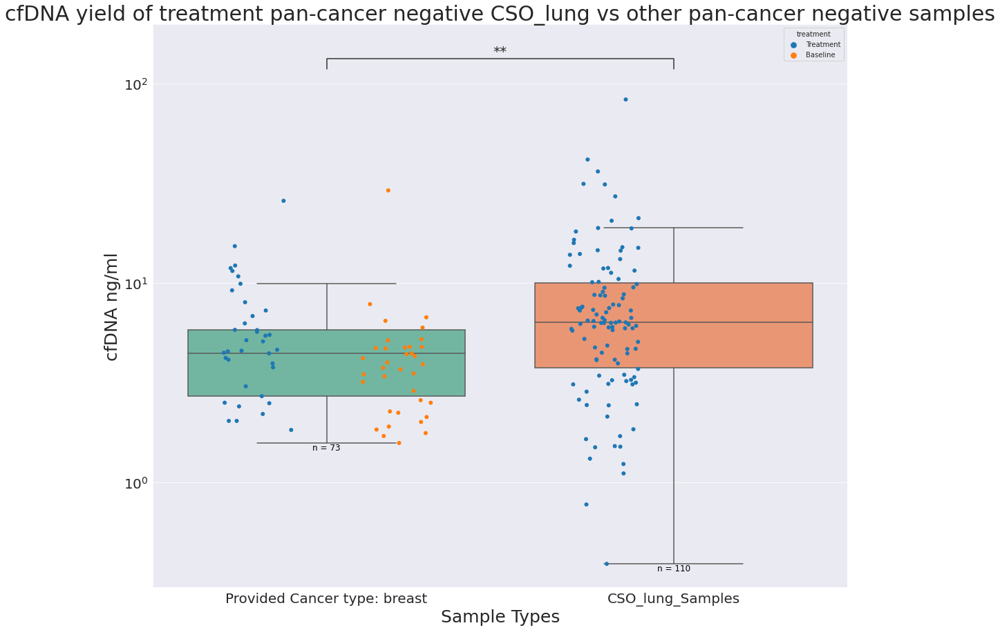

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:2.404e-02 t=-2.279e+00


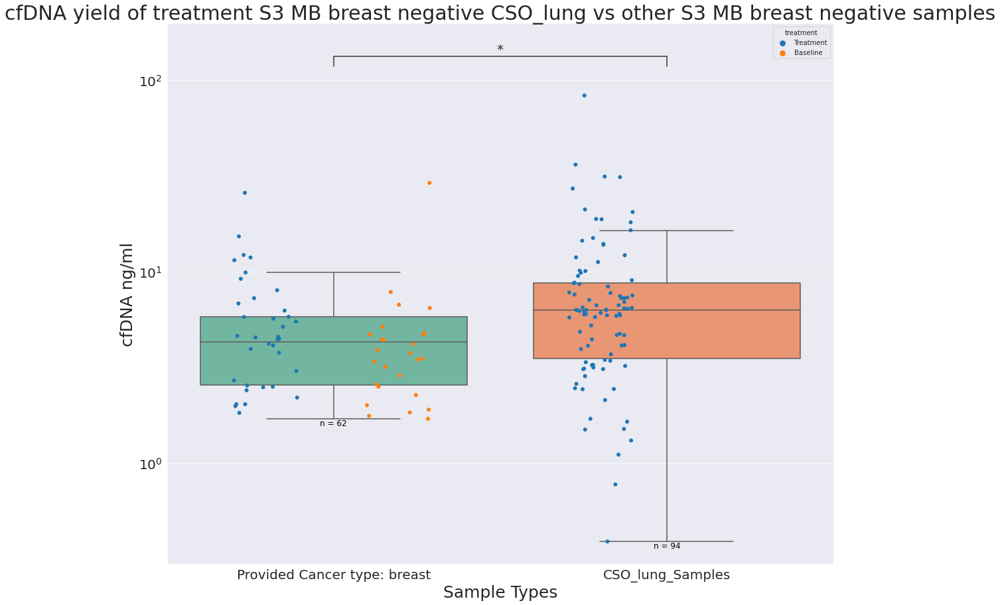

In [61]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(df, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'CSO_Lung_Sample' categories
    hue_order = df['CSO_Lung_Sample'].unique().tolist()

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    hue_order = ['Provided Cancer type: breast', 'CSO_lung_Samples']
    default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="CSO_Lung_Sample", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette=color_map)
    sns.stripplot(data=df, x="CSO_Lung_Sample", y="cfDNA_ng", hue = "treatment", ax=ax, dodge=True, jitter=0.2, size=6)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # Offset for sample size annotation, adjust as needed
    offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    for plot_type, cancer_group in df.groupby('CSO_Lung_Sample'):
        n = cancer_group.shape[0]
        type_pos = hue_order.index(plot_type)
        center = ax.get_xticks()[type_pos]  # Center position of each category
        ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="CSO_Lung_Sample", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize=20)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Sample Types', fontsize=25)
    ax.set_ylabel('cfDNA ng/ml', fontsize=25)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=20)


    plt.show()

# Daichi sow21
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub, 'cfDNA yield of all CSO_lung vs other samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_1, 'cfDNA yield of all CSO_lung vs other pan-cancer negative samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_2, 'cfDNA yield of treatment CSO_lung vs other pan-cancer negative samples')
cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_3, 'cfDNA yield of treatment pan-cancer negative CSO_lung vs other pan-cancer negative samples')
cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_4, 'cfDNA yield of treatment S3 MB breast negative CSO_lung vs other S3 MB breast negative samples')



treatment  Pancancer_call
Baseline   False               2
Treatment  True              123
           False               2
Name: Pancancer_call, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:3.293e-01 t=9.793e-01


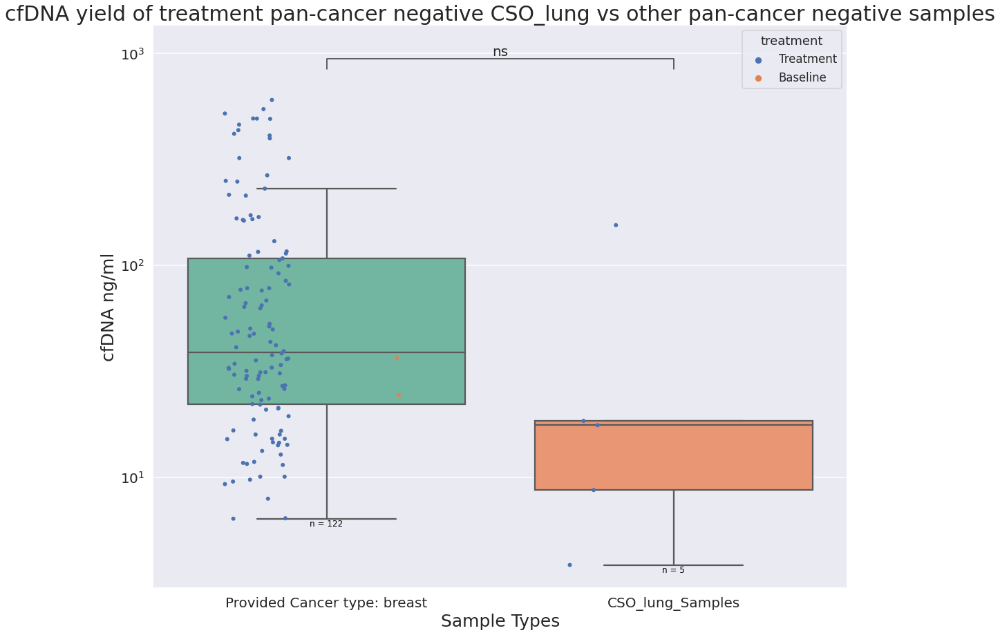

In [134]:

# top_prd_df_gliead_4 = top_prd_df_gliead[~((top_prd_df_gliead['Pancancer_call'] == True) & (top_prd_df_gliead['treatment'] == 'Baseline'))]

# print(top_prd_df_gliead_4.groupby('treatment').Pancancer_call.value_counts())
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_gliead_4, 'cfDNA yield of treatment pan-cancer negative CSO_lung vs other pan-cancer negative samples')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CSO_lung_Samples vs. Provided Cancer type: breast: t-test independent samples, P_val:1.849e-01 t=-1.334e+00


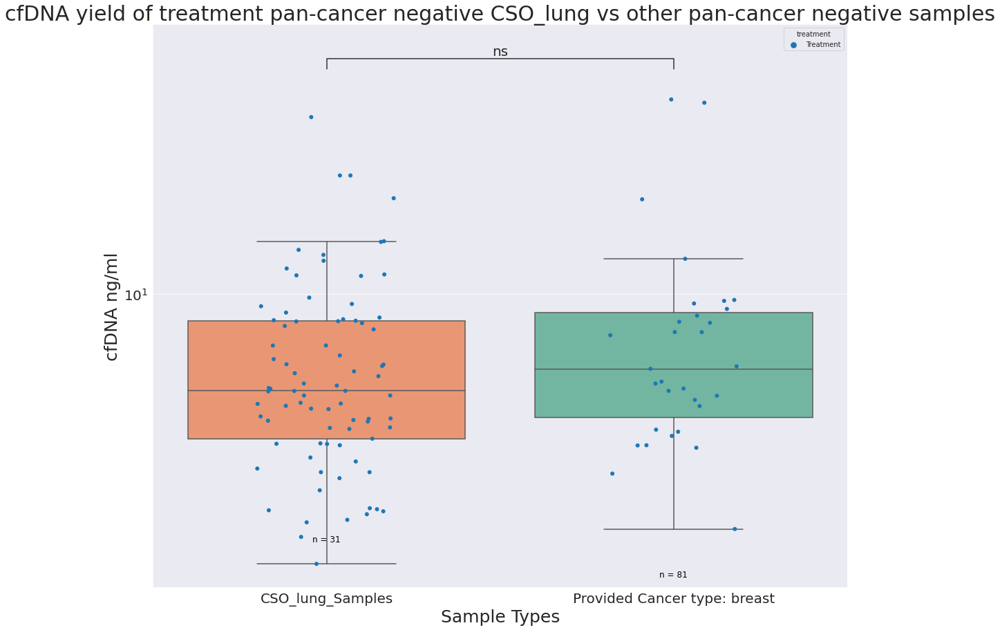

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CSO_lung_Samples vs. Provided Cancer type: breast: t-test independent samples, P_val:8.735e-01 t=-1.599e-01


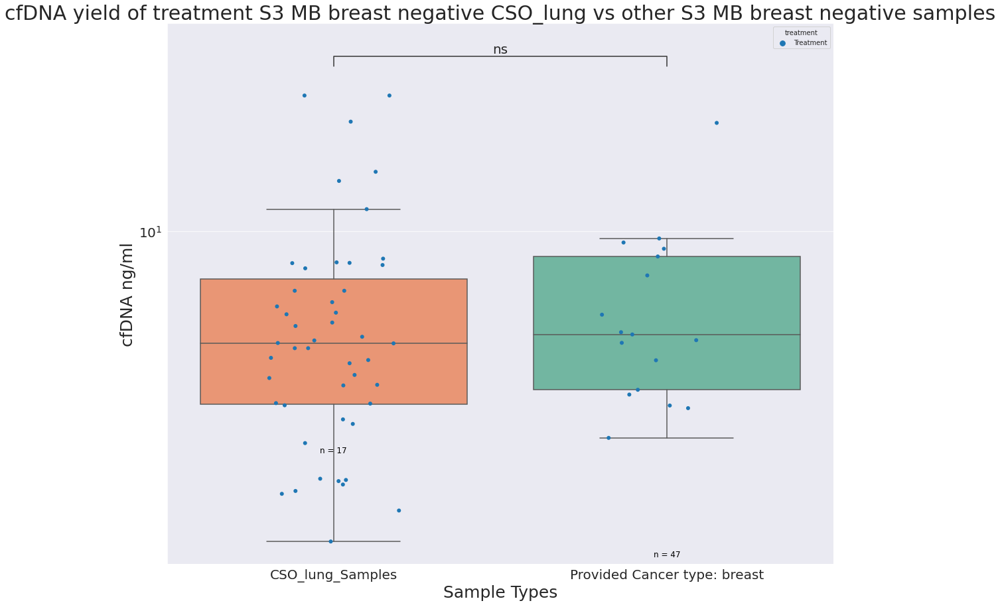

In [62]:
# For Control cohort AZ SOW183 & 117
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_az, 'cfDNA yield of all CSO_lung vs other samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_az_1, 'cfDNA yield of all CSO_lung vs other pan-cancer negative samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_az_2, 'cfDNA yield of treatment CSO_lung vs other pan-cancer negative samples')
cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_az_3, 'cfDNA yield of treatment pan-cancer negative CSO_lung vs other pan-cancer negative samples')
cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_az_4, 'cfDNA yield of treatment S3 MB breast negative CSO_lung vs other S3 MB breast negative samples')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:5.032e-01 t=-8.095e-01


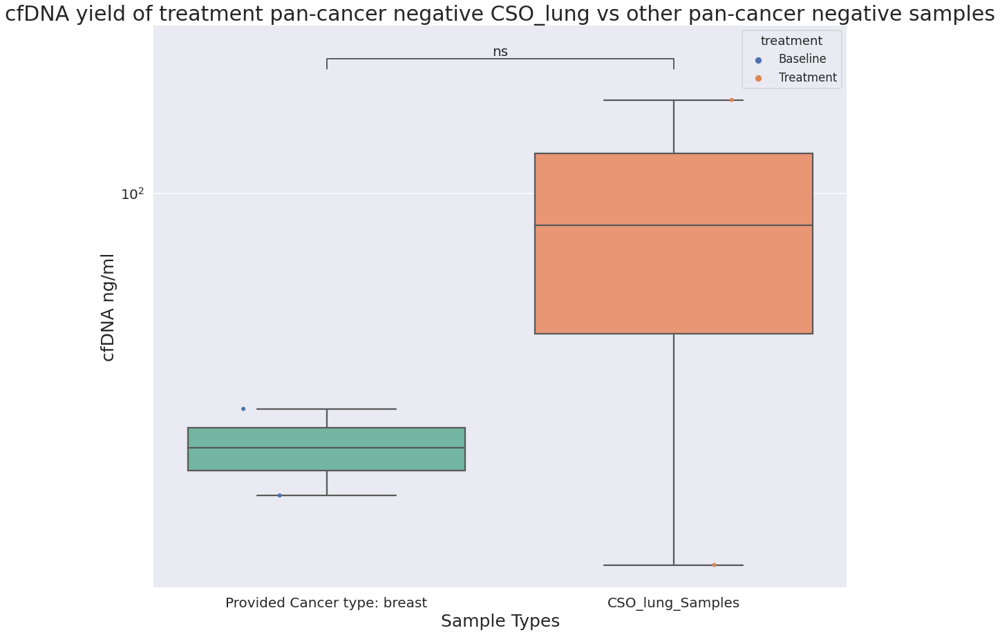

In [111]:
# For control cohort Gilead SOW3
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_gliead, 'cfDNA yield of all CSO_lung vs other samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_gliead_1, 'cfDNA yield of all CSO_lung vs other pan-cancer negative samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_gliead_2, 'cfDNA yield of treatment CSO_lung vs other pan-cancer negative samples')
cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_gliead_3, 'cfDNA yield of treatment pan-cancer negative CSO_lung vs other pan-cancer negative samples')

##### Deprecated plots start here

In [80]:
# Define a new column called "CSO_Lung_Sample" to indicate if this sample is High CSO lung prediction sample (treatment)

# Prepare the cfDNA plot data by 
## 1. limited to certain cohorts
## 2. Identify the CSO group

# 1. limited to certain cohorts
target_files = [
    "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv", 
    "20240122_GuardantHealthIST_IST01_Batch1_138Samples_InfinityReport.csv"
    # "20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv"
    # "20231219_ParkerInstitutePICI_RP01_Batch2_1458Samples_InfinityReport.csv",
    # "20240108_ParkerInstitutePICI_RP_01_645Samples_InfinityReport.csv"
]

top_prd_df_sub = top_prd_df[top_prd_df['csv_file_name'].isin(target_files)]

# Extract the GHSampleIDs from df_lung_cso
# high_digestive_samples = df_lung_cso['GHSampleID'].unique()
# high_lung_samples = df_lung_cso_baseline['GHSampleID'].unique()
high_lung_samples = df_lung_cso_treatment['GHSampleID'].unique()


# Create a new column that will be True if the sample is in high_lung_samples
top_prd_df_sub['CSO_Lung_Sample'] = top_prd_df_sub['GHSampleID'].isin(high_lung_samples)

# Create a new column for plotting that combines original cancer types and the new category
top_prd_df_sub['CSO_Lung_Sample'] = top_prd_df_sub.apply(
    lambda row: 'High_CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
    axis=1
)

# Remove missing values in cfDNA_ng before plotting
top_prd_df_sub = top_prd_df_sub.dropna(subset=['cfDNA_ng'])
top_prd_df_sub = top_prd_df_sub.dropna(subset=['Plasma_ml_input'])

T-test between Provided Cancer type: breast and High_CSO_lung_Samples in 20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv: t-statistic = -1.459, p-value = 0.147
T-test between High_CSO_lung_Samples and Provided Cancer type: pancreatic in 20240122_GuardantHealthIST_IST01_Batch1_138Samples_InfinityReport.csv: t-statistic = 0.577, p-value = 0.567


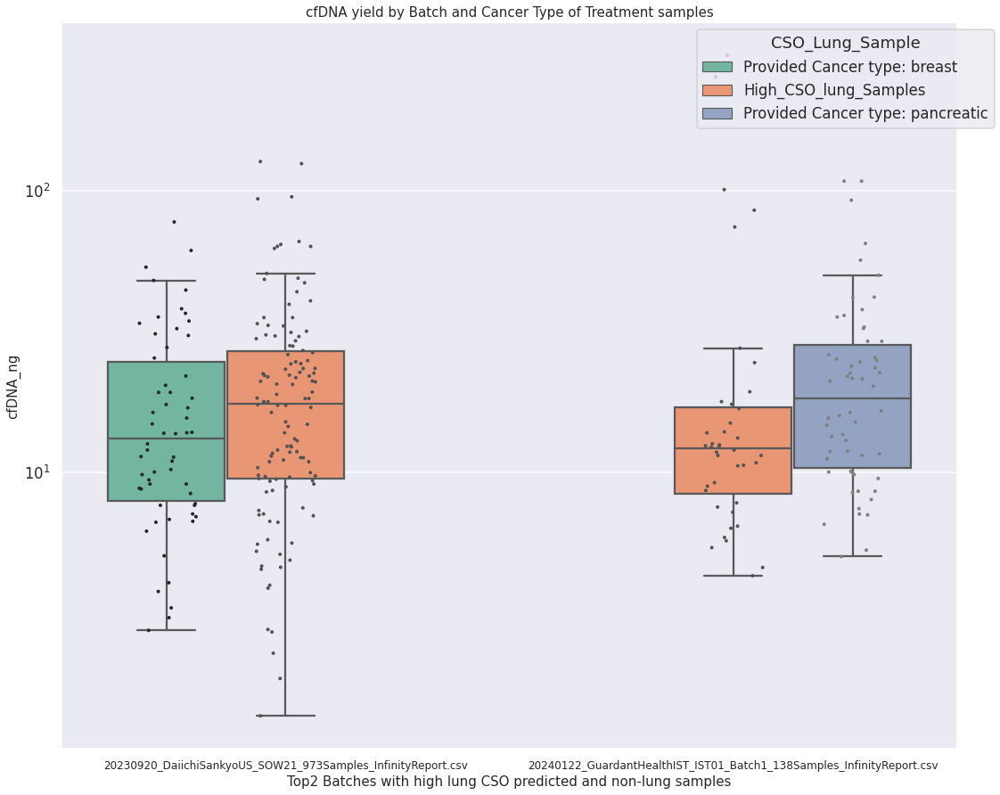

In [81]:
# Compare cfDNA between High lung CSO samples and other samples by csv_file_name

def cfDNA_boxplot_cancer_type_csv(df):
    fig, ax0 = plt.subplots(nrows=1, figsize=(18, 15))
    sns.set_style('darkgrid')

    order = df['csv_file_name'].unique().tolist()
    hue_order = df['CSO_Lung_Sample'].unique().tolist()

    sns.boxplot(data=df, x="csv_file_name", y="cfDNA_ng", hue="CSO_Lung_Sample", showfliers=False, 
                ax=ax0, order=order, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="csv_file_name", y="cfDNA_ng", hue="CSO_Lung_Sample",
                  ax=ax0, order=order, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax0.set_yscale('log')

    # Perform and print t-test results for each csv_file_name
    for csv_file in order:
        sub_df = df[df['csv_file_name'] == csv_file]
        types = sub_df['CSO_Lung_Sample'].unique().tolist()
        if len(types) > 1:
            for i in range(len(types)):
                for j in range(i+1, len(types)):
                    group1 = sub_df[sub_df['CSO_Lung_Sample'] == types[i]]['cfDNA_ng']
                    group2 = sub_df[sub_df['CSO_Lung_Sample'] == types[j]]['cfDNA_ng']
                    t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)  # Welch's t-test
                    print(f"T-test between {types[i]} and {types[j]} in {csv_file}: t-statistic = {t_stat:.3f}, p-value = {p_val:.3g}")
    
    # Handle the legend to only show boxplot color coding
    handles, labels = ax0.get_legend_handles_labels()
    l = len(df['CSO_Lung_Sample'].unique())  # Number of unique categories in hue
    ax0.legend(handles[:l], labels[:l], title='CSO_Lung_Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    
    # Labels
    plt.title('cfDNA yield by Batch and Cancer Type of Treatment samples', fontsize=15)
    ax0.set_xlabel('Top2 Batches with high lung CSO predicted and non-lung samples', fontsize=15)
    ax0.set_ylabel('cfDNA_ng', fontsize=15)
    # ax0.set_xticklabels(ax0.get_xticklabels(), fontsize=12, rotation=45, ha="right")
    ax0.set_xticklabels(ax0.get_xticklabels(), fontsize=12)

    
    plt.show()

# For treatment sample only
top_prd_df_sub_treatment = top_prd_df_sub[top_prd_df_sub["treatment"] == "Treatment"]
cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_treatment)


In [ ]:
# from statannotations.Annotator import Annotator

# def cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(df):
#     # Set up the figure with original size and grid style
#     fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
#     sns.set_style('darkgrid')

#     # Order based on the 'CSO_Lung_Sample' categories
#     hue_order = df['CSO_Lung_Sample'].unique().tolist()

#     # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
#     # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
#     hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
#     default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
#     color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

#     # Create boxplot and stripplot without using csv_file_name
#     sns.boxplot(data=df, x="CSO_Lung_Sample", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette=color_map)
#     sns.stripplot(data=df, x="CSO_Lung_Sample", y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

#     # Log scale for the y-axis
#     ax.set_yscale('log')

#     # Annotate sample sizes with offset
#     # # Offset for sample size annotation, adjust as needed
#     # offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
#     # for plot_type, cancer_group in df.groupby('CSO_Lung_Sample'):
#     #     n = cancer_group.shape[0]
#     #     type_pos = hue_order.index(plot_type)
#     #     center = ax.get_xticks()[type_pos]  # Center position of each category
#     #     ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


#     # Setting up the Annotator with the appropriate pairs
#     if len(hue_order) > 1:
#         pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
#         annotator = Annotator(ax, pairs, data=df, x="CSO_Lung_Sample", y="cfDNA_ng")
#         annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
#         annotator.apply_and_annotate()

#     # # Adjusting the legend to match original settings
#     # handles, labels = ax.get_legend_handles_labels()
#     # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

#     # Set plot labels and title to match the original
#     plt.title('cfDNA yield: High lung CSO treatment vs Treatment samples in Daiichi SOW21', fontsize=25)
#     ax.set_xlabel('CSO Lung Sample Types', fontsize=15)
#     ax.set_ylabel('cfDNA_ng', fontsize=15)
#     ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)

#     plt.show()

# # cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_treatment)

# # For treatment sample only
# top_prd_df_sub_treatment = top_prd_df_sub[top_prd_df_sub["treatment"] == "Treatment"]
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_treatment)

# # # For treatment pan-cancer negative sample only
# # top_prd_df_sub_treatmen_neg = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Treatment") & (top_prd_df_sub["Pancancer_call"] == False)]
# # cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_treatmen_neg)

# # For baseline sample only and you will need to change the title
# top_prd_df_sub_baseline = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Baseline") | (top_prd_df_sub["CSO_Lung_Sample"] == "High_CSO_lung_Samples")]
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_baseline)

In [71]:
# To do an apple-to-apple comparison as Yuval's result: control vs IPF vs ILD. So among all treatment, pan-cancer binary call is used. 
top_prd_df_sub_treatment = top_prd_df_sub[top_prd_df_sub["treatment"] == "Treatment"]
print(top_prd_df_sub_treatment.groupby("CSO_Lung_Sample").Pancancer_call.value_counts())

# Define a function to categorize based on the conditions
def categorize_pan_cancer(row):
    if row['Pancancer_call'] == False:
        return 'pan_cancer_negative'
    elif row['Pancancer_call'] == True:
        if row['CSO_Lung_Sample'] == 'High_CSO_lung_Samples':
            return 'Pan_cancer_positive_High_CSO_lung_Sample'
        else:
            return 'Pan_cancer_positive_Provided_Breast_Sample'

# Apply the function to create the new column
top_prd_df_sub_treatment['pan_cancer_category'] = top_prd_df_sub_treatment.apply(categorize_pan_cancer, axis=1)

top_prd_df_sub_treatment.pan_cancer_category.value_counts()

CSO_Lung_Sample               Pancancer_call
CSO_lung_Samples              False             110
                              True               12
Provided Cancer type: breast  False              37
                              True               21
Name: Pancancer_call, dtype: int64


pan_cancer_negative                           147
Pan_cancer_positive_Provided_Breast_Sample     33
Name: pan_cancer_category, dtype: int64

ValueError: Missing x value(s) `Pan_cancer_positive_High_CSO_lung_Sample` in pan_cancer_category (specified in `pairs`) in data

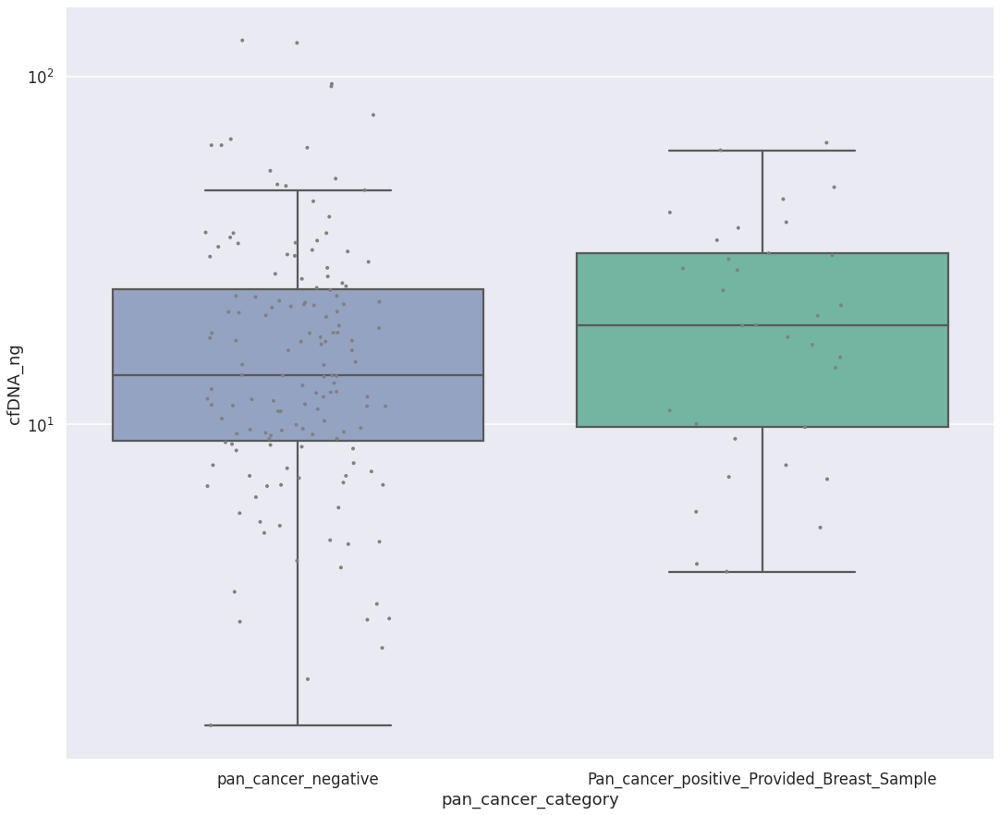

In [73]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_byPanCancerCall_with_annotation(df):
    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'pan_cancer_category' categories
    hue_order = df['pan_cancer_category'].unique().tolist()

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    hue_order = ['Pan_cancer_positive_Provided_Breast_Sample', 'Pan_cancer_positive_High_CSO_lung_Sample', 'pan_cancer_negative']
    default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="pan_cancer_category", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette=color_map)
    sns.stripplot(data=df, x="pan_cancer_category", y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # # Offset for sample size annotation, adjust as needed
    # offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    # for plot_type, cancer_group in df.groupby('pan_cancer_category'):
    #     n = cancer_group.shape[0]
    #     type_pos = hue_order.index(plot_type)
    #     center = ax.get_xticks()[type_pos]  # Center position of each category
    #     ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="pan_cancer_category", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title('cfDNA yield of Treatment samples: Pan-cancer - treatment vs High lung CSO treatment (pan-cancer +) vs Other treatment (pan-cancer +)', fontsize=25)
    ax.set_xlabel('Pan-cancery call & CSO prediction', fontsize=15)
    ax.set_ylabel('cfDNA_ng', fontsize=15)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)

    plt.show()


cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_byPanCancerCall_with_annotation(top_prd_df_sub_treatment)


T-test between Provided Cancer type: breast and High_CSO_lung_Samples in 20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv: t-statistic = 1.313, p-value = 0.19
T-test between Provided Cancer type: pancreatic and High_CSO_lung_Samples in 20240122_GuardantHealthIST_IST01_Batch1_138Samples_InfinityReport.csv: t-statistic = -0.484, p-value = 0.63


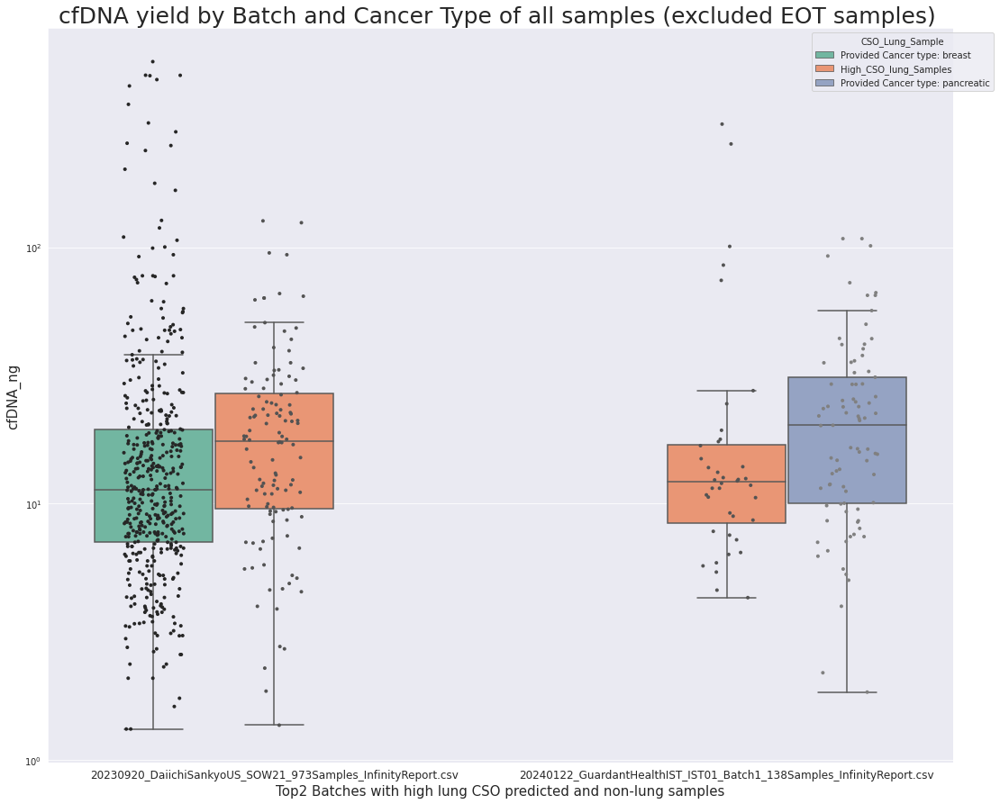

T-test between Provided Cancer type: breast and High_CSO_lung_Samples in 20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv: t-statistic = -3.514, p-value = 0.000563
T-test between Provided Cancer type: pancreatic and High_CSO_lung_Samples in 20240122_GuardantHealthIST_IST01_Batch1_138Samples_InfinityReport.csv: t-statistic = -1.194, p-value = 0.238


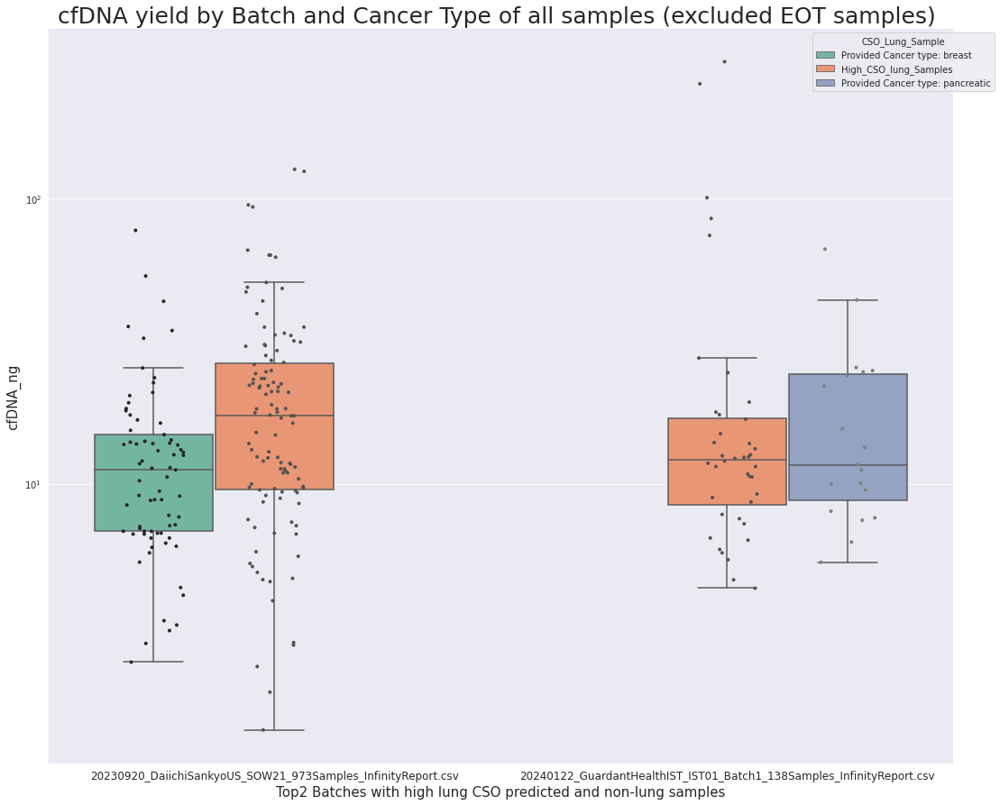

In [145]:
# Compare cfDNA between High lung CSO samples and other samples by csv_file_name

def cfDNA_boxplot_cancer_type_csv(df):
    fig, ax0 = plt.subplots(nrows=1, figsize=(18, 15))
    sns.set_style('darkgrid')

    order = df['csv_file_name'].unique().tolist()
    hue_order = df['CSO_Lung_Sample'].unique().tolist()

    # # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples', 'Provided Cancer type: pancreatic']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    sns.boxplot(data=df, x="csv_file_name", y="cfDNA_ng", hue="CSO_Lung_Sample", showfliers=False, 
                ax=ax0, order=order, dodge=True, palette='Set2')
    sns.stripplot(data=df, x="csv_file_name", y="cfDNA_ng", hue="CSO_Lung_Sample",
                  ax=ax0, order=order, dodge=True, color='gray', jitter=0.2, size=4)

    # Annotate sample sizes with offset

    # Log scale for the y-axis
    ax0.set_yscale('log')

    # # Offset for sample size annotation, adjust as needed
    # offset = 1  # Adjust the value

    # for (csv_file, plot_type), cancer_group in df.groupby(['csv_file_name', 'CSO_Lung_Sample']):
    #     n = cancer_group.shape[0]
    #     file_pos = order.index(csv_file)
    #     type_pos = hue_order.index(plot_type)
    #     center = ax0.get_xticks()[file_pos] + (type_pos - (len(hue_order) - 1) / 2) * 0.2
    #     ax0.text(center, cancer_group['cfDNA_ng'].min() + offset, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')

    # Perform and print t-test results for each csv_file_name
    for csv_file in order:
        sub_df = df[df['csv_file_name'] == csv_file]
        types = sub_df['CSO_Lung_Sample'].unique().tolist()
        if len(types) > 1:
            for i in range(len(types)):
                for j in range(i+1, len(types)):
                    group1 = sub_df[sub_df['CSO_Lung_Sample'] == types[i]]['cfDNA_ng']
                    group2 = sub_df[sub_df['CSO_Lung_Sample'] == types[j]]['cfDNA_ng']
                    t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)  # Welch's t-test
                    print(f"T-test between {types[i]} and {types[j]} in {csv_file}: t-statistic = {t_stat:.3f}, p-value = {p_val:.3g}")
    
    # Handle the legend to only show boxplot color coding
    handles, labels = ax0.get_legend_handles_labels()
    l = len(df['CSO_Lung_Sample'].unique())  # Number of unique categories in hue
    ax0.legend(handles[:l], labels[:l], title='CSO_Lung_Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    
    # Labels
    plt.title('cfDNA yield by Batch and Cancer Type of all samples (excluded EOT samples) ', fontsize=25)
    ax0.set_xlabel('Top2 Batches with high lung CSO predicted and non-lung samples', fontsize=15)
    ax0.set_ylabel('cfDNA_ng', fontsize=15)
    # ax0.set_xticklabels(ax0.get_xticklabels(), fontsize=12, rotation=45, ha="right")
    ax0.set_xticklabels(ax0.get_xticklabels(), fontsize=12)

    
    plt.show()

# # For treatment sample only
# top_prd_df_sub_treatment = top_prd_df_sub[top_prd_df_sub["treatment"] == "Treatment"]
# cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_treatment)

# # For baseline sample only and you will need to change the title
# top_prd_df_sub_baseline = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Baseline") | (top_prd_df_sub["CSO_Lung_Sample"] == "High_CSO_lung_Samples")]
# cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_baseline)

# # For treatment sample only pan cancer caller positive
# top_prd_df_sub_treatment_pan_pos = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Treatment") & (top_prd_df_sub["Pancancer_call"] == True)]
# cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_treatment_pan_pos)

# # For baseline sample only and you will need to change the title pan cancer caller positive
# top_prd_df_sub_baseline_pan_pos = top_prd_df_sub[((top_prd_df_sub["treatment"] == "Baseline") | (top_prd_df_sub["CSO_Lung_Sample"] == "High_CSO_lung_Samples")) & (top_prd_df_sub["Pancancer_call"] == True)]
# cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_baseline_pan_pos)

# For all sample 
top_prd_df_sub_all = top_prd_df_sub[top_prd_df_sub["treatment"] != "other"]
cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_all)

# For all sample pan cancer caller negative
top_prd_df_sub_all_pan_neg = top_prd_df_sub[(top_prd_df_sub["treatment"] != "other") & (top_prd_df_sub["Pancancer_call"] == False)]
cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_all_pan_neg)

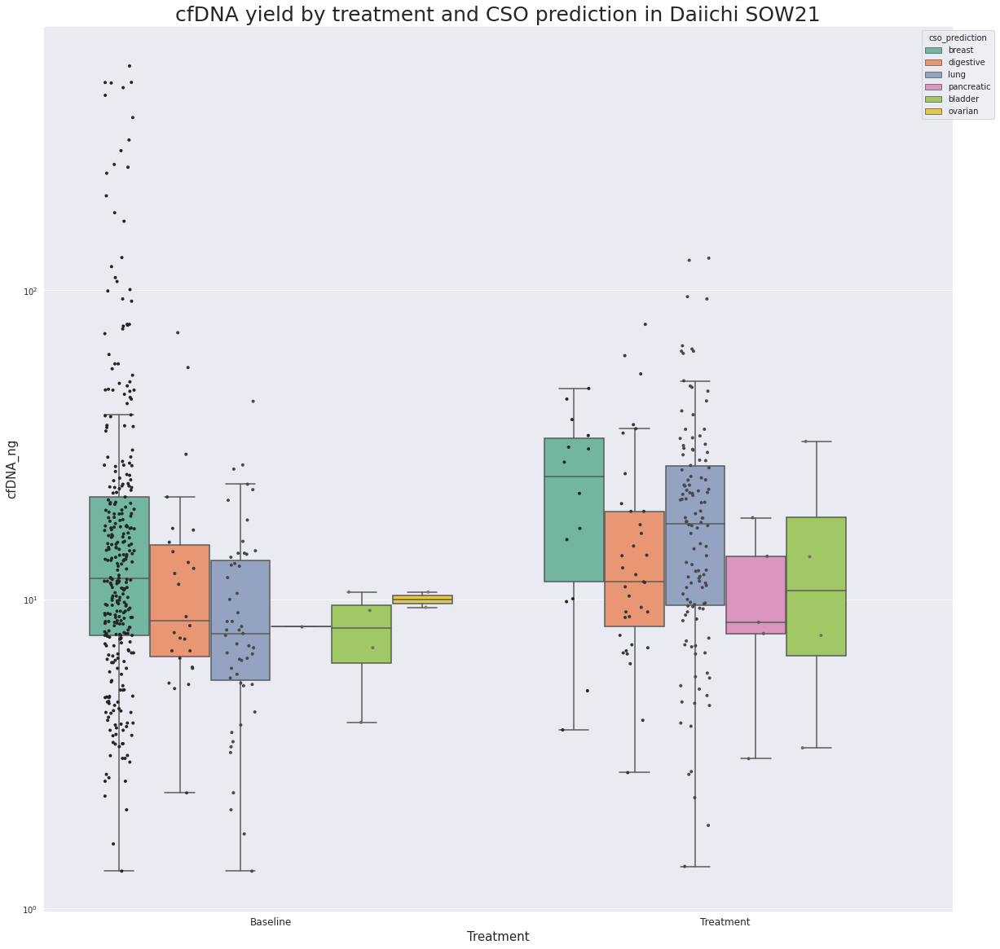

In [138]:
# Compare cfDNA between High lung CSO samples and other CSO predicted cancer type (only breast and lung) by treatment in Daiichi SOW21

df_cso_breast_lung_daiichi = top_prd_df_sub[(top_prd_df_sub["treatment"].isin(['Baseline', 'Treatment'])) & (top_prd_df_sub["csv_file_name"] == "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv")]
# (top_prd_df_sub["cso_prediction"].isin(['breast', 'lung'])) & 

def cfDNA_boxplot_cso_predict_treatment(df):
    fig, ax0 = plt.subplots(nrows=1, figsize=(20, 20))
    sns.set_style('darkgrid')

    order = df['treatment'].unique().tolist()
    hue_order = df['cso_prediction'].unique().tolist()

    # # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette="color_map"" in the sns.boxplot!!!!!
    # hue_order = ['breast', 'lung']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    sns.boxplot(data=df, x="treatment", y="cfDNA_ng", hue="cso_prediction", showfliers=False, 
                ax=ax0, order=order, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="treatment", y="cfDNA_ng", hue="cso_prediction",
                  ax=ax0, order=order, dodge=True, color='gray', jitter=0.2, size=4)

    # Annotate sample sizes with offset

    # Log scale for the y-axis
    ax0.set_yscale('log')

    # # Offset for sample size annotation, adjust as needed
    # offset = 1  # Adjust the value

    # for (csv_file, plot_type), cancer_group in df.groupby(['treatment', 'cso_prediction']):
    #     n = cancer_group.shape[0]
    #     file_pos = order.index(csv_file)
    #     type_pos = hue_order.index(plot_type)
    #     center = ax0.get_xticks()[file_pos] + (type_pos - (len(hue_order) - 1) / 2) * 0.2
    #     ax0.text(center, cancer_group['cfDNA_ng'].min() + offset, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')

    # # Perform and print t-test results for each treatment
    # for csv_file in order:
    #     sub_df = df[df['treatment'] == csv_file]
    #     types = sub_df['cso_prediction'].unique().tolist()
    #     if len(types) > 1:
    #         for i in range(len(types)):
    #             for j in range(i+1, len(types)):
    #                 group1 = sub_df[sub_df['cso_prediction'] == types[i]]['cfDNA_ng']
    #                 group2 = sub_df[sub_df['cso_prediction'] == types[j]]['cfDNA_ng']
    #                 t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)  # Welch's t-test
    #                 print(f"T-test between {types[i]} and {types[j]} in {csv_file}: t-statistic = {t_stat:.3f}, p-value = {p_val:.3g}")

    # Handle the legend to only show boxplot color coding
    handles, labels = ax0.get_legend_handles_labels()
    l = len(df['cso_prediction'].unique())  # Number of unique categories in hue
    ax0.legend(handles[:l], labels[:l], title='cso_prediction', loc='upper right', bbox_to_anchor=(1.05, 1))

    
    # Labels
    plt.title('cfDNA yield by treatment and CSO prediction in Daiichi SOW21', fontsize=25)
    ax0.set_xlabel('Treatment', fontsize=15)
    ax0.set_ylabel('cfDNA_ng', fontsize=15)
    ax0.set_xticklabels(ax0.get_xticklabels(), fontsize=12)
    
    plt.show()

# Call the function with the cleaned DataFrame
cfDNA_boxplot_cso_predict_treatment(df_cso_breast_lung_daiichi)


##### Deprecated plots end here

##### Paired analysis (treatment and baseline) e.g. CSO breast baseline vs CSO breast treatment; CSO breast baseline vs CSO lung treatment

In [ ]:
# # For suspicious high lung CSO treatment samples in Daiichi SOW21, find their paired baseline samples to compare cfDNA yield by using paired t-test

# # # Only run this when selecting pancancer positive samples
# # top_prd_df_sub = top_prd_df_sub[top_prd_df_sub['Pancancer_call'] == True]


# # Identify lung CSO treatment samples
# top_prd_tf_daiichi = top_prd_df_sub[(top_prd_df_sub["csv_file_name"] == "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv") & (top_prd_df_sub["CSO_Lung_Sample"] == "High_CSO_lung_Samples")]

# # Map corresponding baseline samples based on Paitent_ID
# top_prd_tf_daiichi_patient_id_list = top_prd_tf_daiichi.Patient_ID.unique().tolist()
# top_prd_df_daiichi_lung_pair = top_prd_df[top_prd_df.Patient_ID.isin(top_prd_tf_daiichi_patient_id_list)]
# top_prd_df_daiichi_lung_pair = top_prd_df_daiichi_lung_pair[top_prd_df_daiichi_lung_pair["treatment"] != "other"]
# print(top_prd_df_daiichi_lung_pair.treatment.value_counts())


# # Make sure the sample size n sample when do paired t-test

# # Filter the DataFrame to include only those patients who have both 'Treatment' and 'Baseline' entries
# valid_patients = top_prd_df_daiichi_lung_pair.groupby('Patient_ID').filter(
#     lambda x: 'Treatment' in x['treatment'].values and 'Baseline' in x['treatment'].values
# )

# # Initialize an empty DataFrame to store the matched pairs
# df_daiichi_pair = pd.DataFrame()

# # For each patient with both treatment types, match one 'Treatment' to one 'Baseline'
# for patient_id, group in valid_patients.groupby('Patient_ID'):
#     treatment_samples = group[group['treatment'] == 'Treatment']
#     baseline_samples = group[group['treatment'] == 'Baseline']
    
#     # Ensure that the number of samples from each treatment type is balanced
#     min_samples = min(len(treatment_samples), len(baseline_samples))
    
#     if min_samples > 0:  # If there are samples to add
#         balanced_treatment_samples = treatment_samples.iloc[:min_samples]
#         balanced_baseline_samples = baseline_samples.iloc[:min_samples]
        
#         # Append these balanced samples to the filtered DataFrame
#         df_daiichi_pair = pd.concat([df_daiichi_pair, balanced_treatment_samples, balanced_baseline_samples])

# print(df_daiichi_pair['treatment'].value_counts())

# # # Creat a new column "CSO_Lung_Sample" 
# # high_lung_samples = df_lung_cso_treatment['GHSampleID'].unique()

# # # Create a new column that will be True if the sample is in high_lung_samples
# # df_daiichi_pair['CSO_Lung_Sample'] = df_daiichi_pair['GHSampleID'].isin(high_lung_samples)

# # # Create a new column for plotting that combines original cancer types and the new category
# # df_daiichi_pair['CSO_Lung_Sample'] = df_daiichi_pair.apply(
# #     lambda row: 'High_CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
# #     axis=1
# # )



In [72]:
# For other paired sample comparison in Daiichi SOW21

# # Only run this when selecting pancancer positive samples
# top_prd_df_sub = top_prd_df_sub[top_prd_df_sub['Pancancer_call'] == True]

# Identify CSO breast treatment samples
top_prd_tf_breast_treat = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Treatment") & (top_prd_df_sub["cso_prediction"] == "breast") & (top_prd_df_sub["CSO_rank"] == 1)]

# Map corresponding baseline samples based on Paitent_ID
top_prd_tf_breast_treat_patient_id_list = top_prd_tf_breast_treat.Patient_ID.unique().tolist()
top_prd_df_breast_pair = top_prd_df[top_prd_df.Patient_ID.isin(top_prd_tf_breast_treat_patient_id_list)]
top_prd_df_breast_pair = top_prd_df_breast_pair[top_prd_df_breast_pair["treatment"] != "other"]
print(top_prd_df_breast_pair.treatment.value_counts())


# Make sure the sample size n sample when do paired t-test

# Filter the DataFrame to include only those patients who have both 'Treatment' and 'Baseline' entries
valid_patients = top_prd_df_breast_pair.groupby('Patient_ID').filter(
    lambda x: 'Treatment' in x['treatment'].values and 'Baseline' in x['treatment'].values
)

# Initialize an empty DataFrame to store the matched pairs
top_prd_df_breast_pair = pd.DataFrame()

# For each patient with both treatment types, match one 'Treatment' to one 'Baseline'
for patient_id, group in valid_patients.groupby('Patient_ID'):
    treatment_samples = group[group['treatment'] == 'Treatment']
    baseline_samples = group[group['treatment'] == 'Baseline']
    
    # Ensure that the number of samples from each treatment type is balanced
    min_samples = min(len(treatment_samples), len(baseline_samples))
    
    if min_samples > 0:  # If there are samples to add
        balanced_treatment_samples = treatment_samples.iloc[:min_samples]
        balanced_baseline_samples = baseline_samples.iloc[:min_samples]
        
        # Append these balanced samples to the filtered DataFrame
        top_prd_df_breast_pair = pd.concat([top_prd_df_breast_pair, balanced_treatment_samples, balanced_baseline_samples])

print(top_prd_df_breast_pair['treatment'].value_counts())

Baseline     16
Treatment    14
Name: treatment, dtype: int64
Treatment    14
Baseline     14
Name: treatment, dtype: int64


In [73]:
# For other paired sample comparison in Daiichi SOW21

# # Only run this when selecting pancancer positive samples
# top_prd_df_sub = top_prd_df_sub[top_prd_df_sub['Pancancer_call'] == True]


# Identify lung treatment samples
top_prd_df_lung_treat = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Treatment") & (top_prd_df_sub["cso_prediction"] == "lung") & (top_prd_df_sub["CSO_rank"] == 1)]
# top_prd_df_lung_treat = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Treatment") & (top_prd_df_sub["cso_prediction"] == "lung") & (top_prd_df_sub["CSO_rank"] == 1) & (top_prd_df_sub["Pancancer_call"] == False)]

# Map corresponding baseline samples based on Paitent_ID
top_prd_df_lung_treat_patient_id_list = top_prd_df_lung_treat.Patient_ID.unique().tolist()
top_prd_df_lung_pair = top_prd_df[top_prd_df.Patient_ID.isin(top_prd_df_lung_treat_patient_id_list)]
top_prd_df_lung_pair = top_prd_df_lung_pair[top_prd_df_lung_pair["treatment"] != "other"]

# Make sure the baseline sample prediction is breast
top_prd_df_lung_pair = top_prd_df_lung_pair[~((top_prd_df_lung_pair["cso_prediction"] != "breast") & (top_prd_df_lung_pair["treatment"] == "Baseline"))]

# filter for pan-cancer negative sample for baseline
# top_prd_df_lung_pair = top_prd_df_lung_pair[~((top_prd_df_lung_pair["Pancancer_call"] == True) & (top_prd_df_lung_pair["treatment"] == "Baseline"))]
top_prd_df_lung_pair.groupby('treatment').cso_prediction.value_counts()
print(top_prd_df_lung_pair.treatment.value_counts())

# Make sure the sample size n sample when do paired t-test

# Filter the DataFrame to include only those patients who have both 'Treatment' and 'Baseline' entries
valid_patients = top_prd_df_lung_pair.groupby('Patient_ID').filter(
    lambda x: 'Treatment' in x['treatment'].values and 'Baseline' in x['treatment'].values
)

# Initialize an empty DataFrame to store the matched pairs
top_prd_df_lung_pair = pd.DataFrame()

# For each patient with both treatment types, match one 'Treatment' to one 'Baseline'
for patient_id, group in valid_patients.groupby('Patient_ID'):
    treatment_samples = group[group['treatment'] == 'Treatment']
    baseline_samples = group[group['treatment'] == 'Baseline']
    
    # Ensure that the number of samples from each treatment type is balanced
    min_samples = min(len(treatment_samples), len(baseline_samples))
    
    if min_samples > 0:  # If there are samples to add
        balanced_treatment_samples = treatment_samples.iloc[:min_samples]
        balanced_baseline_samples = baseline_samples.iloc[:min_samples]
        
        # Append these balanced samples to the filtered DataFrame
        top_prd_df_lung_pair = pd.concat([top_prd_df_lung_pair, balanced_treatment_samples, balanced_baseline_samples])

print(top_prd_df_lung_pair['treatment'].value_counts())


Treatment    122
Baseline      89
Name: treatment, dtype: int64
Treatment    89
Baseline     89
Name: treatment, dtype: int64


In [82]:
# For other paired sample comparison in AZ SOW183&SWO117

# # Only run this when selecting pancancer positive samples
# top_prd_df_sub = top_prd_df_sub[top_prd_df_sub['Pancancer_call'] == True]

# Identify CSO breast treatment samples
top_prd_tf_breast_treat = top_prd_df_az[(top_prd_df_az["treatment"] == "Treatment") & (top_prd_df_az["cso_prediction"] == "breast") & (top_prd_df_az["CSO_rank"] == 1)]

# Map corresponding baseline samples based on Paitent_ID
top_prd_tf_breast_treat_patient_id_list = top_prd_tf_breast_treat.Patient_ID.unique().tolist()
top_prd_df_breast_pair_az = top_prd_df_az[top_prd_df_az.Patient_ID.isin(top_prd_tf_breast_treat_patient_id_list)]
top_prd_df_breast_pair_az = top_prd_df_breast_pair_az[top_prd_df_breast_pair_az["treatment"] != "other"]
print(top_prd_df_breast_pair_az.treatment.value_counts())


# Make sure the sample size n sample when do paired t-test

# Filter the DataFrame to include only those patients who have both 'Treatment' and 'Baseline' entries
valid_patients = top_prd_df_breast_pair_az.groupby('Patient_ID').filter(
    lambda x: 'Treatment' in x['treatment'].values and 'Baseline' in x['treatment'].values
)

# Initialize an empty DataFrame to store the matched pairs
top_prd_df_breast_pair_az = pd.DataFrame()

# For each patient with both treatment types, match one 'Treatment' to one 'Baseline'
for patient_id, group in valid_patients.groupby('Patient_ID'):
    treatment_samples = group[group['treatment'] == 'Treatment']
    baseline_samples = group[group['treatment'] == 'Baseline']
    
    # Ensure that the number of samples from each treatment type is balanced
    min_samples = min(len(treatment_samples), len(baseline_samples))
    
    if min_samples > 0:  # If there are samples to add
        balanced_treatment_samples = treatment_samples.iloc[:min_samples]
        balanced_baseline_samples = baseline_samples.iloc[:min_samples]
        
        # Append these balanced samples to the filtered DataFrame
        top_prd_df_breast_pair_az = pd.concat([top_prd_df_breast_pair_az, balanced_treatment_samples, balanced_baseline_samples])

print(top_prd_df_breast_pair_az['treatment'].value_counts())

Treatment    672
Baseline     372
Name: treatment, dtype: int64
Treatment    371
Baseline     371
Name: treatment, dtype: int64


In [83]:
# For other paired sample comparison in AZ SOW183&SWO117

# # Only run this when selecting pancancer positive samples
# top_prd_df_sub = top_prd_df_sub[top_prd_df_sub['Pancancer_call'] == True]


# Identify lung treatment samples
top_prd_df_lung_treat = top_prd_df_az[(top_prd_df_az["treatment"] == "Treatment") & (top_prd_df_az["cso_prediction"] == "lung") & (top_prd_df_az["CSO_rank"] == 1)]
# top_prd_df_lung_treat = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Treatment") & (top_prd_df_sub["cso_prediction"] == "lung") & (top_prd_df_sub["CSO_rank"] == 1) & (top_prd_df_sub["Pancancer_call"] == False)]

# Map corresponding baseline samples based on Paitent_ID
top_prd_df_lung_treat_patient_id_list = top_prd_df_lung_treat.Patient_ID.unique().tolist()
top_prd_df_lung_pair = top_prd_df_az[top_prd_df_az.Patient_ID.isin(top_prd_df_lung_treat_patient_id_list)]
# top_prd_df_lung_pair = top_prd_df_lung_pair[top_prd_df_lung_pair["treatment"] != "other"]

# Make sure the baseline sample prediction is breast
# top_prd_df_lung_pair = top_prd_df_lung_pair[~((top_prd_df_lung_pair["cso_prediction"] != "breast") & (top_prd_df_lung_pair["treatment"] == "Baseline"))]

# filter for pan-cancer negative sample for baseline
top_prd_df_lung_pair_az = top_prd_df_lung_pair[~((top_prd_df_lung_pair["Pancancer_call"] == True) & (top_prd_df_lung_pair["treatment"] == "Baseline"))]
top_prd_df_lung_pair_az.groupby('treatment').cso_prediction.value_counts()
print(top_prd_df_lung_pair_az.treatment.value_counts())

# Make sure the sample size n sample when do paired t-test

# Filter the DataFrame to include only those patients who have both 'Treatment' and 'Baseline' entries
valid_patients = top_prd_df_lung_pair_az.groupby('Patient_ID').filter(
    lambda x: 'Treatment' in x['treatment'].values and 'Baseline' in x['treatment'].values
)

# Initialize an empty DataFrame to store the matched pairs
top_prd_df_lung_pair_az = pd.DataFrame()

# For each patient with both treatment types, match one 'Treatment' to one 'Baseline'
for patient_id, group in valid_patients.groupby('Patient_ID'):
    treatment_samples = group[group['treatment'] == 'Treatment']
    baseline_samples = group[group['treatment'] == 'Baseline']
    
    # Ensure that the number of samples from each treatment type is balanced
    min_samples = min(len(treatment_samples), len(baseline_samples))
    
    if min_samples > 0:  # If there are samples to add
        balanced_treatment_samples = treatment_samples.iloc[:min_samples]
        balanced_baseline_samples = baseline_samples.iloc[:min_samples]
        
        # Append these balanced samples to the filtered DataFrame
        top_prd_df_lung_pair_az = pd.concat([top_prd_df_lung_pair_az, balanced_treatment_samples, balanced_baseline_samples])

print(top_prd_df_lung_pair_az['treatment'].value_counts())


Treatment    228
Baseline     113
Name: treatment, dtype: int64
Treatment    113
Baseline     113
Name: treatment, dtype: int64


Paired t-test between Treatment and Baseline in 20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv: t-statistic = -1.047, p-value = 0.298


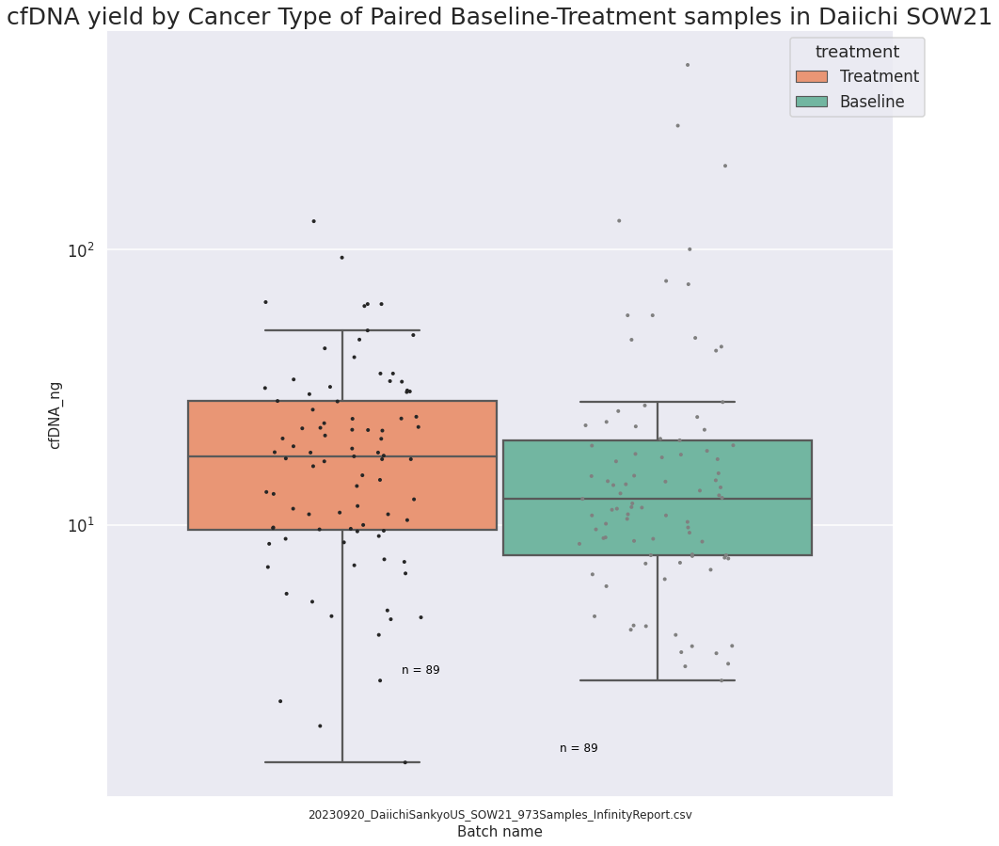

In [130]:
def cfDNA_boxplot_cancer_type_csv_paired(df):
    fig, ax0 = plt.subplots(nrows=1, figsize=(15, 15))
    sns.set_style('darkgrid')

    order = df['csv_file_name'].unique().tolist()
    hue_order = df['treatment'].unique().tolist()

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    hue_order = ['Baseline', 'Treatment']
    default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    sns.boxplot(data=df, x="csv_file_name", y="cfDNA_ng", hue="treatment", showfliers=False, 
                ax=ax0, order=order, dodge=True, palette=color_map)
    sns.stripplot(data=df, x="csv_file_name", y="cfDNA_ng", hue="treatment",
                  ax=ax0, order=order, dodge=True, color='gray', jitter=0.2, size=4)

    # Annotate sample sizes with offset

    # Log scale for the y-axis
    ax0.set_yscale('log')

    # Offset for sample size annotation, adjust as needed
    offset = 0.1  # Adjust the value

    # Annotate sample sizes with offset
    for (csv_file, treatment_type), group in df.groupby(['csv_file_name', 'treatment']):
        n = group.shape[0]
        file_pos = order.index(csv_file)
        type_pos = hue_order.index(treatment_type)
        center = ax0.get_xticks()[file_pos] + (type_pos - (len(hue_order) - 1) / 2) * 0.2
        ax0.text(center, group['cfDNA_ng'].min() + offset, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')

    # Perform and print paired t-test results for each csv_file_name
    for csv_file in order:
        sub_df = df[df['csv_file_name'] == csv_file]
        types = sub_df['treatment'].unique().tolist()
        if len(types) == 2:  # Ensure there are exactly two groups for a paired t-test
            group1 = sub_df[sub_df['treatment'] == types[0]]['cfDNA_ng']
            group2 = sub_df[sub_df['treatment'] == types[1]]['cfDNA_ng']
            t_stat, p_val = stats.ttest_rel(group1, group2)  # Paired t-test
            print(f"Paired t-test between {types[0]} and {types[1]} in {csv_file}: t-statistic = {t_stat:.3f}, p-value = {p_val:.3g}")

    # Handle the legend to only show boxplot color coding
    handles, labels = ax0.get_legend_handles_labels()
    l = len(df['treatment'].unique())  # Number of unique categories in hue
    ax0.legend(handles[:l], labels[:l], title='treatment', loc='upper right', bbox_to_anchor=(1.05, 1))

    plt.title('cfDNA yield by Cancer Type of Paired Baseline-Treatment samples in Daiichi SOW21', fontsize=25)
    ax0.set_xlabel('Batch name', fontsize=15)
    ax0.set_ylabel('cfDNA_ng', fontsize=15)
    ax0.set_xticklabels(ax0.get_xticklabels(), fontsize=12)
    
    plt.show()

# Call the function with the cleaned DataFrame
cfDNA_boxplot_cancer_type_csv_paired(top_prd_df_lung_pair)


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Treatment vs. Baseline: t-test independent samples, P_val:3.759e-01 t=-8.878e-01


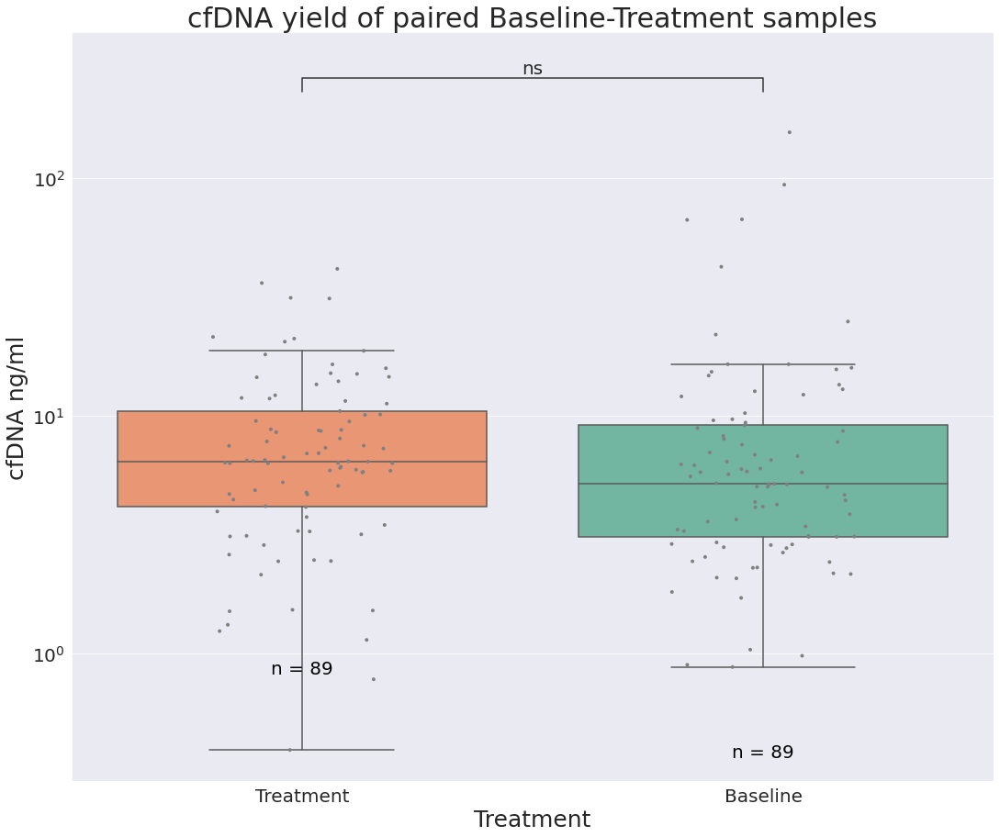

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Treatment vs. Baseline: t-test independent samples, P_val:3.350e-01 t=-9.823e-01


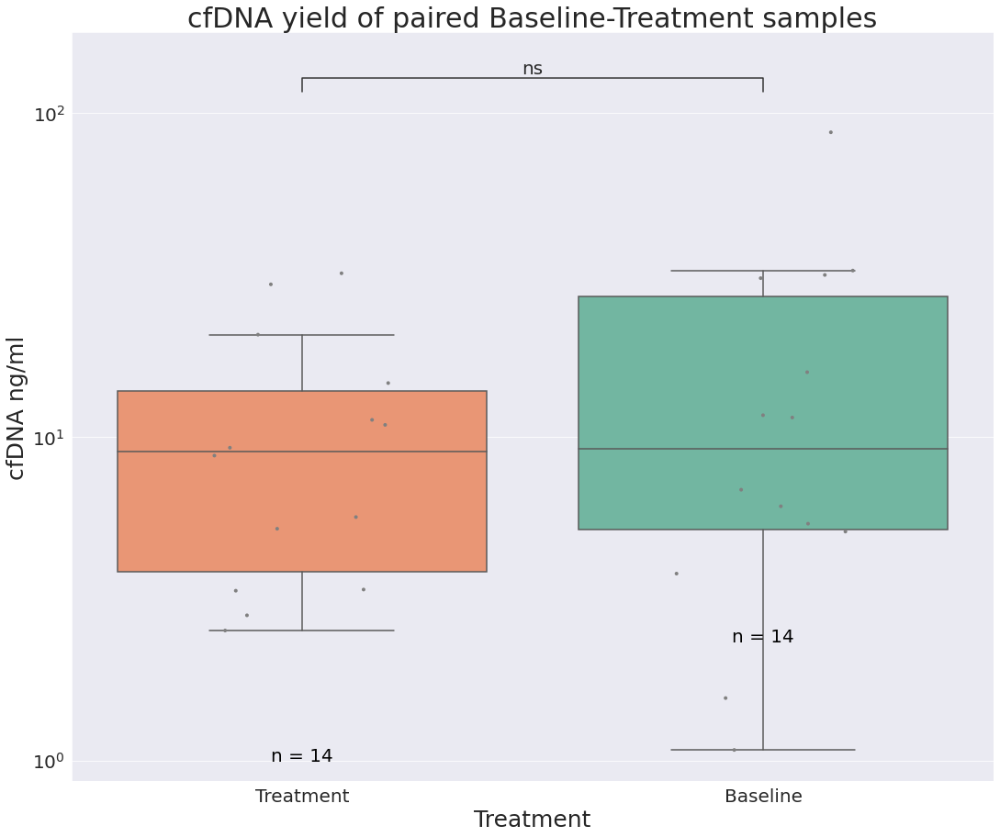

In [74]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_paired_CSOpred_TreatmentvsBaseline_one_batch_with_annotation(df, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'treatment' categories
    hue_order = df['treatment'].unique().tolist()

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    hue_order = ['Baseline', 'Treatment']
    default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="treatment", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette=color_map)
    sns.stripplot(data=df, x="treatment", y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    for plot_type, cancer_group in df.groupby('treatment'):
        n = cancer_group.shape[0]
        type_pos = hue_order.index(plot_type)
        center = ax.get_xticks()[type_pos]  # Center position of each category
        ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=20, color='black')

    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="treatment", y="cfDNA_ng", fontsize=20)
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize=20)
        annotator.apply_and_annotate()

    # Set plot labels and title to match the original
    suffix_title
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Treatment', fontsize=25)
    ax.set_ylabel('cfDNA ng/ml', fontsize=25)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=20)


    plt.show()


cfDNA_boxplot_by_paired_CSOpred_TreatmentvsBaseline_one_batch_with_annotation(top_prd_df_lung_pair, 'cfDNA yield of paired Baseline-Treatment samples')
cfDNA_boxplot_by_paired_CSOpred_TreatmentvsBaseline_one_batch_with_annotation(top_prd_df_breast_pair, 'cfDNA yield of paired Baseline-Treatment samples')

In [75]:
paired_data_daichii_lung.head()

,unique_sample_id_baseline,Pancancer_baseline,cso_model_type_baseline,cso_score_baseline,Study_ID_baseline,GHRequestID_baseline,GHSampleID_baseline,Patient_ID,Visit_name_baseline,Sample_status_baseline,Sample_comment_baseline,Max_percentage_baseline,cfDNA_ng_baseline,Plasma_ml_input_baseline,Cancertype_baseline,csv_file_name_baseline,file_creator_baseline,report_date_baseline,Account_baseline,SOW_num_baseline,cancer_category_baseline,cancerstage_baseline,cancertype_baseline,sample_index_baseline,gender_baseline,sample_type_baseline,timestamp_baseline,panel_baseline,control_lot_baseline,bip_version_baseline,git_version_baseline,run_mode_baseline,product_baseline,project_baseline,cancer_type_baseline,patient_age_baseline,parameter_set_baseline,lunar_caller_baseline,comment_baseline,provided_tumor_type_baseline,request_id_baseline,use_case_baseline,runid_baseline,fc_dir_baseline,Other ID_baseline,Conditions_baseline,Sponsor_baseline,new_defined_cancer_type_baseline,treatment_baseline,mbd_dir_baseline,Pancancer_call_baseline,primary_cnv_qc_file_path_baseline,alternative_cnv_qc_file_path_baseline,run_sample_id_baseline,predicted_sex_baseline,provided_sex_baseline,cso_prediction_baseline,CSO_rank_baseline,cancerother_baseline,unique_sample_id_treatment,Pancancer_treatment,cso_model_type_treatment,cso_score_treatment,Study_ID_treatment,GHRequestID_treatment,GHSampleID_treatment,Visit_name_treatment,Sample_status_treatment,Sample_comment_treatment,Max_percentage_treatment,cfDNA_ng_treatment,Plasma_ml_input_treatment,Cancertype_treatment,csv_file_name_treatment,file_creator_treatment,report_date_treatment,Account_treatment,SOW_num_treatment,cancer_category_treatment,cancerstage_treatment,cancertype_treatment,sample_index_treatment,gender_treatment,sample_type_treatment,timestamp_treatment,panel_treatment,control_lot_treatment,bip_version_treatment,git_version_treatment,run_mode_treatment,product_treatment,project_treatment,cancer_type_treatment,patient_age_treatment,parameter_set_treatment,lunar_caller_treatment,comment_treatment,provided_tumor_type_treatment,request_id_treatment,use_case_treatment,runid_treatment,fc_dir_treatment,Other ID_treatment,Conditions_treatment,Sponsor_treatment,new_defined_cancer_type_treatment,treatment_treatment,mbd_dir_treatment,Pancancer_call_treatment,primary_cnv_qc_file_path_treatment,alternative_cnv_qc_file_path_treatment,run_sample_id_treatment,predicted_sex_treatment,provided_sex_treatment,cso_prediction_treatment,CSO_rank_treatment,cancerother_treatment,delta_CSO_lung,delta_cfDNA/ml
0,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_lung,-14.741639,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,0.54,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,lung,2,Breast,B00472175_230823_A01907_0131_BH7GGHDSX7,-22.575949,CSO_lung,-17.333583,DS8201-A-U302,A0808445,B00472175,C04D1,SUCCESS,NaN,0.34,33.7480,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,AAGTCCCGGC,Female,Research,2023-08-25 20:51:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0808445,cgp,230823_A01907_0131_BH7GGHDSX7,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylat

120
(138, 59)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Treatment vs. Baseline: t-test independent samples, P_val:2.703e-01 t=-1.107e+00


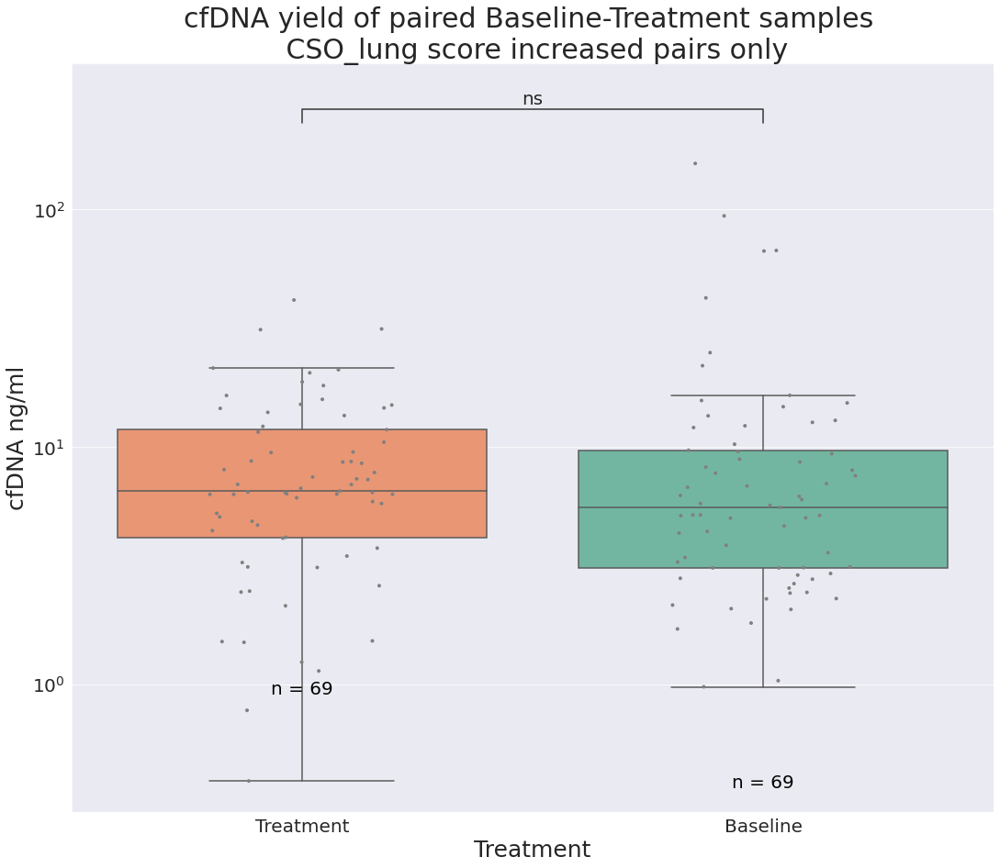

In [78]:

# Compare the cfDNA straifitied by CSO delta
# Lung
paired_data_daichii_lung["cso_lung_score_increased"] = np.where(paired_data_daichii_lung["delta_CSO_lung"] >= 0, 'cso_lung_score_increased', "cso_lung_score_decreased")

paired_data_daichii_lung_increased = paired_data_daichii_lung[paired_data_daichii_lung['cso_lung_score_increased'] == 'cso_lung_score_increased']

list_patient = paired_data_daichii_lung_increased.Patient_ID.tolist()
print(len(list_patient))

top_prd_df_lung_pair_increased = top_prd_df_lung_pair[top_prd_df_lung_pair['Patient_ID'].isin(list_patient)]
print(top_prd_df_lung_pair_increased.shape)
cfDNA_boxplot_by_paired_CSOpred_TreatmentvsBaseline_one_batch_with_annotation(top_prd_df_lung_pair_increased, 'cfDNA yield of paired Baseline-Treatment samples \n CSO_lung score increased pairs only')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Treatment vs. Baseline: t-test independent samples, P_val:3.903e-01 t=-8.608e-01


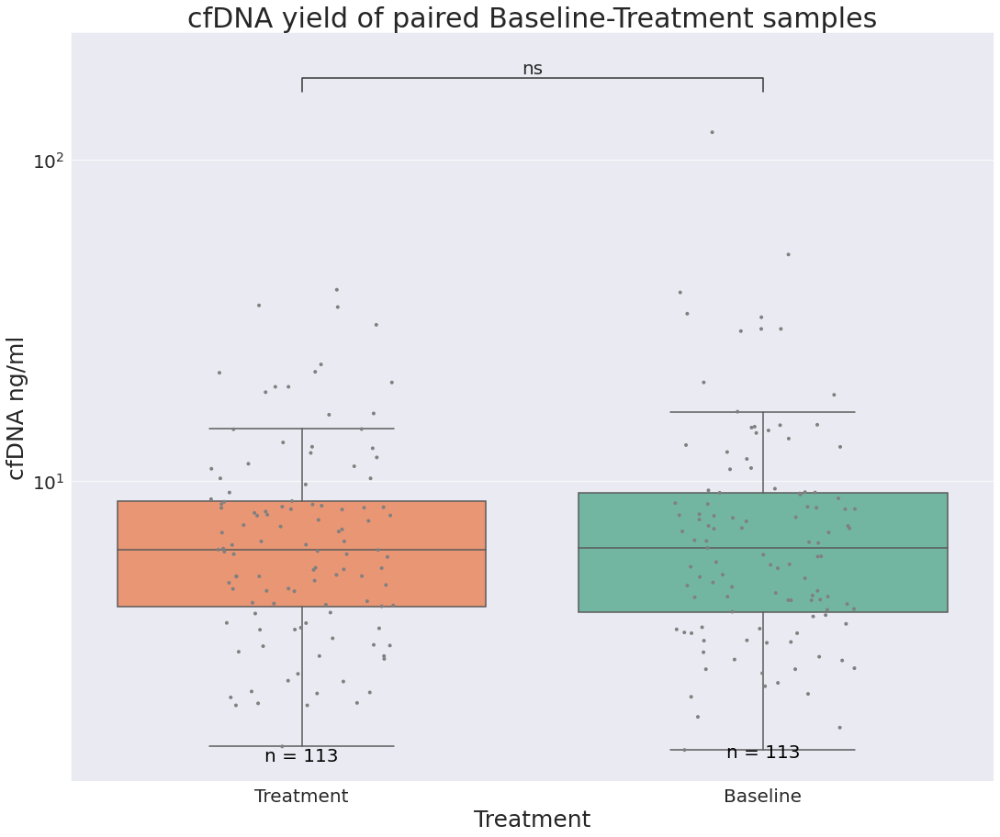

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Treatment vs. Baseline: t-test independent samples, P_val:1.769e-01 t=1.352e+00


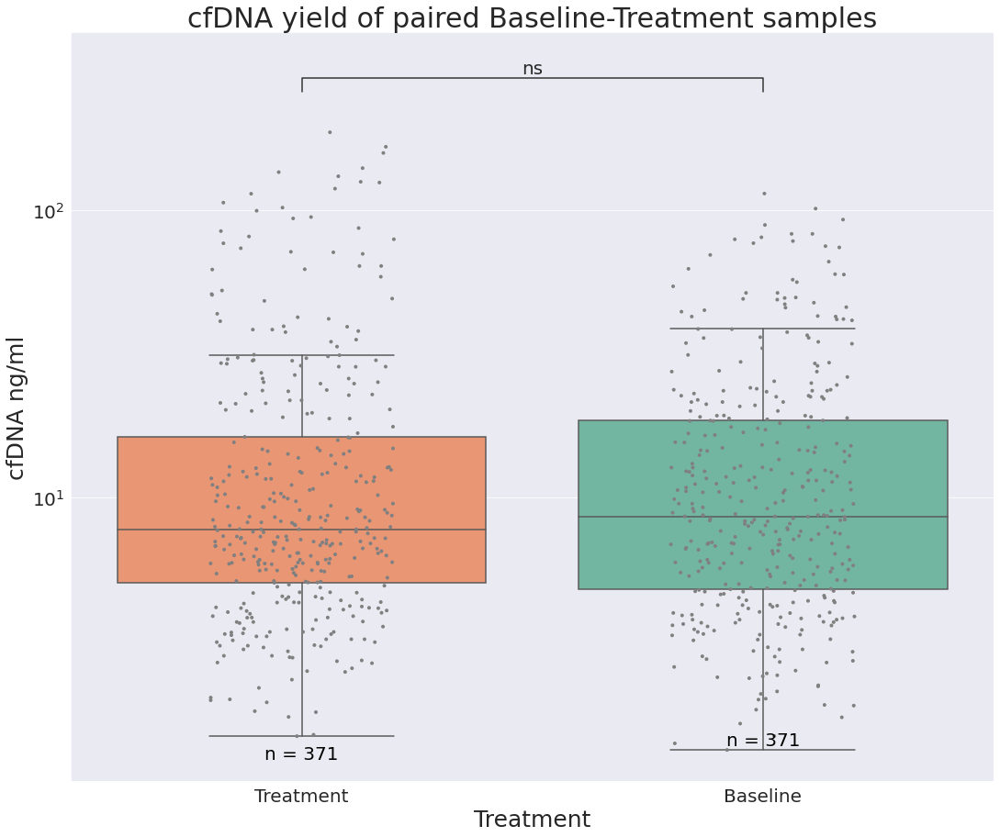

In [85]:
# For control cohort AZ SOW183&117

cfDNA_boxplot_by_paired_CSOpred_TreatmentvsBaseline_one_batch_with_annotation(top_prd_df_lung_pair_az, 'cfDNA yield of paired Baseline-Treatment samples')
cfDNA_boxplot_by_paired_CSOpred_TreatmentvsBaseline_one_batch_with_annotation(top_prd_df_breast_pair_az, 'cfDNA yield of paired Baseline-Treatment samples')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

True_Baseline vs. True_Treatment: t-test independent samples, P_val:6.736e-01 t=4.225e-01
False_Baseline vs. False_Treatment: t-test independent samples, P_val:nan t=nan


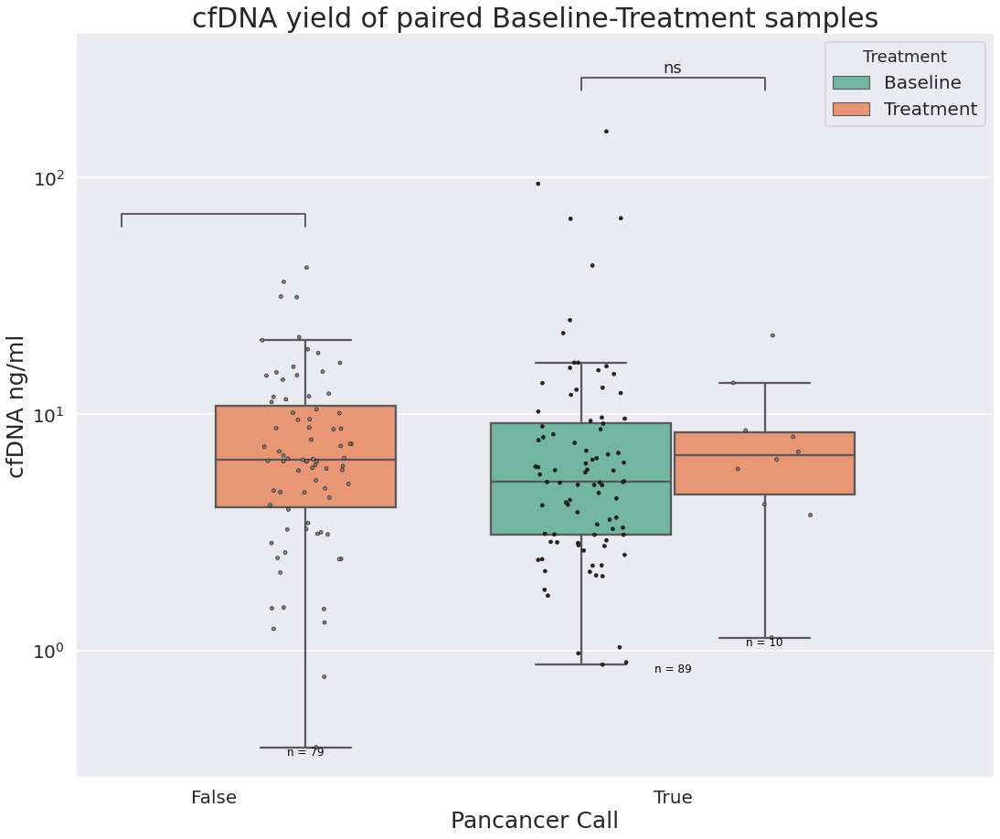

In [132]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_with_Pancancer_call_and_Treatment(df, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))
    sns.set_style('darkgrid')

    # Define order for 'treatment' and 'Pancancer_call'
    treatment_order = ['Baseline', 'Treatment']
    pancancer_order = sorted(df['Pancancer_call'].unique())

    # Create color palette
    treatment_colors = sns.color_palette("Set2", n_colors=len(treatment_order))
    color_map = {treatment: color for treatment, color in zip(treatment_order, treatment_colors)}

    # Create boxplot and stripplot
    box = sns.boxplot(data=df, x="Pancancer_call", y="cfDNA_ng", hue="treatment", hue_order=treatment_order,
                      order=pancancer_order, palette=color_map, ax=ax, dodge=True, showfliers=False)
    sns.stripplot(data=df, x="Pancancer_call", y="cfDNA_ng", hue="treatment", hue_order=treatment_order,
                  order=pancancer_order, color='gray', jitter=0.2, size=4, ax=ax, dodge=True, edgecolor='black', linewidth=0.5)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes, adjusted for hue and position
    for (pancancer_type, treatment_type), group in df.groupby(['Pancancer_call', 'treatment']):
        n = group.shape[0]
        x_pos = pancancer_order.index(pancancer_type) + (0.2 * treatment_order.index(treatment_type))
        y_pos = group['cfDNA_ng'].min() * 0.9
        ax.text(x_pos, y_pos, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')

    # Setting up the Annotator with the appropriate pairs
    pairs = [((pancancer_order[i], treatment_order[0]), (pancancer_order[i], treatment_order[1]))
             for i in range(len(pancancer_order))]
    annotator = Annotator(ax, pairs, data=df, x="Pancancer_call", y="cfDNA_ng", hue="treatment", order=pancancer_order, hue_order=treatment_order)
    annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
    annotator.apply_and_annotate()

    # Fix the legend to display both boxes and strips
    handles, labels = ax.get_legend_handles_labels()
    new_labels, new_handles = [], []
    # Ensure each label appears only once
    for handle, label in zip(handles, labels):
        if label not in new_labels:
            new_labels.append(label)
            new_handles.append(handle)
    ax.legend(new_handles, new_labels, title='Treatment', fontsize=20, loc='best')

    # Set plot labels and title
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Pancancer Call', fontsize=25)
    ax.set_ylabel('cfDNA ng/ml', fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.show()

# Example usage
cfDNA_boxplot_with_Pancancer_call_and_Treatment(top_prd_df_lung_pair, 'cfDNA yield of paired Baseline-Treatment samples')


##### Deprecated starts

T-test between High_CSO_lung_Samples and Provided Cancer type: breast in 0-0.0001: t-statistic = 1.303, p-value = 0.202
T-test between High_CSO_lung_Samples and Provided Cancer type: breast in 0.0001-0.001: t-statistic = 1.575, p-value = 0.121
T-test between Provided Cancer type: breast and High_CSO_lung_Samples in 0.001-0.005: t-statistic = -1.486, p-value = 0.182
T-test between Provided Cancer type: breast and High_CSO_lung_Samples in 0.005-0.01: t-statistic = nan, p-value = nan
T-test between Provided Cancer type: breast and High_CSO_lung_Samples in 0.01-0.1: t-statistic = nan, p-value = nan


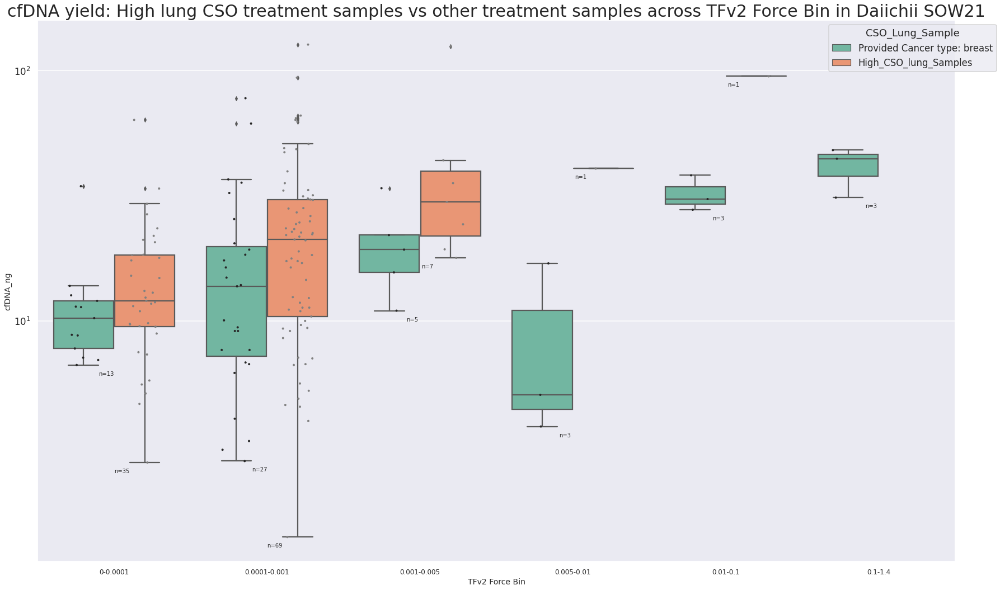

In [125]:
def cfDNA_boxplot_cancer_type_csv_binned(df):
    # Define bins for tfv2_force
    bins = [0, 0.0001, 0.001, 0.005, 0.01, 0.1, 1.4]
    labels = ['0-0.0001', '0.0001-0.001', '0.001-0.005', '0.005-0.01', '0.01-0.1', '0.1-1.4']
    # Add a binning column based on tfv2_force
    df['tfv2_bin'] = pd.cut(df['tfv2_force'], bins=bins, labels=labels, right=False)

    # Create a combined group key and ensure it's categorical
    # df['group_key'] = pd.Categorical(df['csv_file_name'] + '_' + df['tfv2_bin'].astype(str))
    df['group_key'] = pd.Categorical(df['tfv2_bin'].astype(str))

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    fig, ax0 = plt.subplots(nrows=1, figsize=(25, 15))
    sns.set_style('darkgrid')

    sns.boxplot(data=df, x='group_key', y='cfDNA_ng', hue='CSO_Lung_Sample', hue_order=hue_order,
                dodge=True, palette="Set2", ax=ax0)
    sns.stripplot(data=df, x='group_key', y='cfDNA_ng', hue='CSO_Lung_Sample', hue_order=hue_order,
                  dodge=True, color='gray', jitter=0.2, size=4, ax=ax0)

    # Log scale for the y-axis
    ax0.set_yscale('log')

    # Annotate sample sizes
    offset = df['cfDNA_ng'].min() * 0.1
    for key, group in df.groupby(['group_key', 'CSO_Lung_Sample']):
        n = group.shape[0]
        pos = df['group_key'].cat.categories.tolist().index(key[0])
        hue_pos = hue_order.index(key[1])
        text_x = pos + (hue_pos - (len(hue_order) - 1) / 2) * 0.1
        ax0.text(text_x, group['cfDNA_ng'].min() * 0.9, f'n={n}', ha='center', va='bottom', fontsize=10)

    # T-tests, handled within each bin only if sufficient data exists
    for key in df['group_key'].cat.categories:
        sub_df = df[df['group_key'] == key]
        types = sub_df['CSO_Lung_Sample'].dropna().unique().tolist()
        if len(types) > 1:
            for i in range(len(types)):
                for j in range(i+1, len(types)):
                    group1 = sub_df[sub_df['CSO_Lung_Sample'] == types[i]]['cfDNA_ng']
                    group2 = sub_df[sub_df['CSO_Lung_Sample'] == types[j]]['cfDNA_ng']
                    if not group1.empty and not group2.empty:
                        t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)
                        print(f"T-test between {types[i]} and {types[j]} in {key}: t-statistic = {t_stat:.3f}, p-value = {p_val:.3g}")

    # Handle the legend to only show boxplot color coding
    handles, labels = ax0.get_legend_handles_labels()
    l = len(df['CSO_Lung_Sample'].unique())  # Number of unique categories in hue
    ax0.legend(handles[:l], labels[:l], title='CSO_Lung_Sample', loc='upper right', bbox_to_anchor=(1.05, 1))


    # Labels
    plt.title('cfDNA yield: High lung CSO treatment samples vs other treatment samples across TFv2 Force Bin in Daiichii SOW21', fontsize=30)
    ax0.set_xlabel('TFv2 Force Bin', fontsize=14)
    ax0.set_ylabel('cfDNA_ng', fontsize=14)
    ax0.set_xticklabels(df['group_key'].cat.categories, fontsize=12)

    plt.tight_layout()
    plt.show()

# Call the function
# df_cso_breast_lung_daiichi = top_prd_df_sub[(top_prd_df_sub["treatment"].isin(['Baseline', 'Treatment'])) & (top_prd_df_sub["csv_file_name"] == "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv")]
# cfDNA_boxplot_cancer_type_csv_binned(df_cso_breast_lung_daiichi)

# Treatment only
df_cso_breast_lung_daiichi_treatment = df_cso_breast_lung_daiichi[df_cso_breast_lung_daiichi["treatment"] == "Treatment"]
cfDNA_boxplot_cancer_type_csv_binned(df_cso_breast_lung_daiichi_treatment)




T-test between High_CSO_lung_Samples and Provided Cancer type: breast in 0-0.0001: t-statistic = 1.303, p-value = 0.202
T-test between High_CSO_lung_Samples and Provided Cancer type: breast in 0.0001-0.001: t-statistic = 1.575, p-value = 0.121
T-test between Provided Cancer type: breast and High_CSO_lung_Samples in 0.001-0.005: t-statistic = -1.486, p-value = 0.182
T-test between Provided Cancer type: breast and High_CSO_lung_Samples in 0.005-0.01: t-statistic = nan, p-value = nan
T-test between Provided Cancer type: breast and High_CSO_lung_Samples in 0.01-0.1: t-statistic = nan, p-value = nan


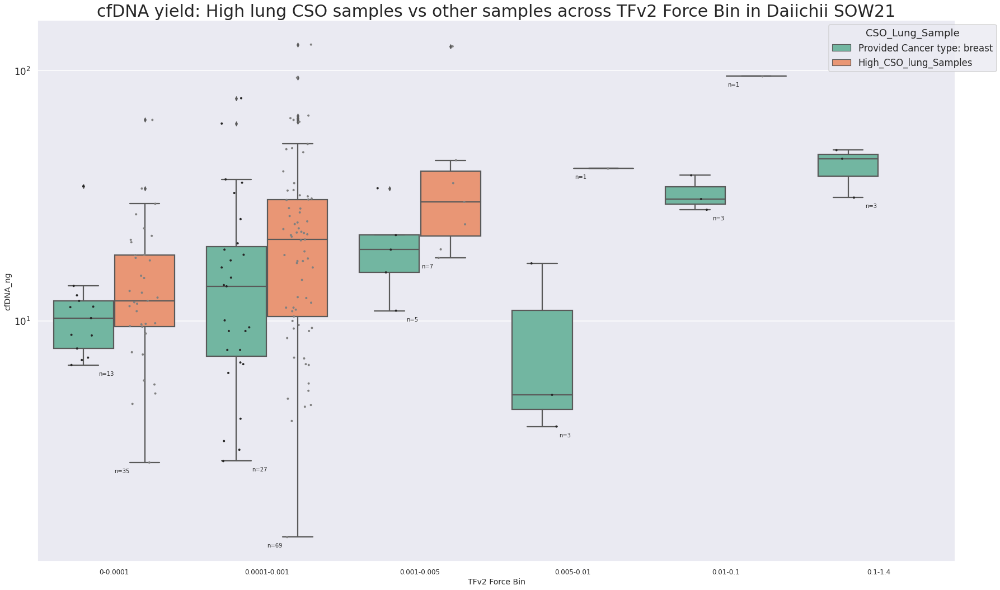

In [124]:
# For treatment samples only
df_cso_breast_lung_daiichi_pan_pos = top_prd_df_sub[(top_prd_df_sub["treatment"].isin(['Treatment'])) & (top_prd_df_sub["csv_file_name"] == "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv")]
cfDNA_boxplot_cancer_type_csv_binned(df_cso_breast_lung_daiichi_pan_pos)

##### Deprecated ends